## Initial Setup and Imports

In [ ]:
# Import required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import logging
import os
import gc
import psutil
import warnings
import json
from datetime import datetime, timedelta, date
from IPython.display import display, Markdown, HTML, Image
from tqdm.notebook import tqdm
from collections import deque
import matplotlib.dates as mdates
from sklearn.ensemble import IsolationForest
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.holtwinters import ExponentialSmoothing
import networkx as nx
import joblib

# Configure visualization settings
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("viridis")
plt.rcParams['figure.figsize'] = (12, 6)

# Suppress warnings
warnings.filterwarnings('ignore')

# Set up logging
logging.basicConfig(level=logging.INFO, 
                   format='%(asctime)s - %(name)s - %(levelname)s - %(message)s')
logger = logging.getLogger('cg_risk_insight')

# Create directories for outputs
output_dirs = ['./processed_data', './anomaly_results', 
              './streaming_results', './visualizations']
for directory in output_dirs:
    os.makedirs(directory, exist_ok=True)
    
# Create visualization subdirectories
viz_dirs = ['eda', 'preprocessing', 'statistical', 'isolation_forest', 
           'time_series', 'graph_networks', 'evaluation', 'insights']
for subdir in viz_dirs:
    os.makedirs(f'./visualizations/{subdir}', exist_ok=True)

# Define memory usage tracking function
def get_memory_usage():
    """Get current memory usage of the process in MB"""
    process = psutil.Process(os.getpid())
    memory_info = process.memory_info()
    memory_mb = memory_info.rss / (1024 * 1024)
    return memory_mb

# Define function to display memory usage changes
def display_memory_usage(func):
    """Decorator to display memory usage before and after function execution"""
    def wrapper(*args, **kwargs):
        # Force garbage collection before execution
        gc.collect()
        memory_before = get_memory_usage()
        print(f"Memory usage before: {memory_before:.2f} MB")
        
        # Execute the function
        result = func(*args, **kwargs)
        
        # Force garbage collection after execution
        gc.collect()
        memory_after = get_memory_usage()
        print(f"Memory usage after: {memory_after:.2f} MB ({memory_after - memory_before:+.2f} MB)")
        
        return result
    return wrapper

# Function to display visualizations from directories
def display_visualizations(visualization_dir, n_max=10):
    """
    Display visualizations from directory in the notebook
    
    Parameters:
    -----------
    visualization_dir : str
        Directory containing visualization files
    n_max : int
        Maximum number of visualizations to display
    """
    if not os.path.exists(visualization_dir):
        display(Markdown(f"**Directory not found: {visualization_dir}**"))
        return
    
    # Get all image files in directory
    image_files = [f for f in os.listdir(visualization_dir) 
                  if f.lower().endswith(('.png', '.jpg', '.jpeg', '.svg'))]
    
    if not image_files:
        display(Markdown(f"**No image files found in {visualization_dir}**"))
        return
    
    # Sort files by modification time (newest first)
    image_files.sort(key=lambda x: os.path.getmtime(os.path.join(visualization_dir, x)), 
                    reverse=True)
    
    # Limit to max number
    image_files = image_files[:n_max]
    
    # Display each image with title
    for img_file in image_files:
        file_path = os.path.join(visualization_dir, img_file)
        
        # Create title from filename
        title = img_file.replace('_', ' ').replace('.png', '').replace('.jpg', '')
        
        display(Markdown(f"### {title}"))
        display(Image(filename=file_path))
        print("\n")

print(f"Setup complete. Current memory usage: {get_memory_usage():.2f} MB")

Setup complete. Current memory usage: 231.81 MB


## Loading the dataframes

In [ ]:
# Importing sensors metadata

sensors_df = pd.read_csv(r"sensors_df.csv")
sensors_df.head()

,BluetoothAddress,DeviceId,AccountId,ActivationThreshold,AdvertisingDurationInMilliseconds,AdvertisingIntervalInMilliseconds,IsAutotuneEnabled,BatterySenseIntervalInSeconds,BatteryVoltage,BatteryVoltageThreshold,...,IsMotionAlarmEnabled,IsLowBatteryAlarmEnabled,IsVibrationSampleEnabled,VibrationIntervalInSeconds,IsVibrationAlarmEnabled,VibrationAlarmThresholdInMilliG,Description,IsLeakAlarmEnabled,LevelReferenceInMillimeters,LeakAlarmLevelThresholdInMillimeters
0,10203FE748DD,LA1-00001,b1a7a54e-fd59-ec11-8f8e-000d3a09c7d0,30,15000,1000,0,60,3.0,2.0,...,1,0,0,0,0,0,NaN,0,100,0
1,11222D1FEAC1,MA1-00388,85a8fb3b-d064-eb11-a812-000d3a09c0c9,20,15000,1000,0,600,2.0,2.0,...,1,0,1,3600,1,10000,NaN,0,0,0
2,1556DF1549F0,BTAT0006,b1a7a54e-fd59-ec11-8f8e-000d3a09c7d0,15,4000,1000,0,0,2.0,2.0,...,1,0,1,3600,0,0,NaN,0,100,0
3,1677659ED4FE,LA1-00004,b1a7a54e-fd59-ec11-8f8e-000d3a09c7d0,30,15000,1000,0,1800,2.0,2.0,...,0,0,0,3600,0,0,NaN,0,100,0
4,2023D87B9EF0,MA1-01270,55a0919b-3a7c-ef11-ac20-0022483c4e5c,127,15000,1000,0,3600,2.0,2.0,...,0,0,0,3600,0,0,NaN,0,0,0


In [8]:
sensors_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 345 entries, 0 to 344
Data columns (total 46 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   BluetoothAddress                        345 non-null    object 
 1   DeviceId                                344 non-null    object 
 2   AccountId                               344 non-null    object 
 3   ActivationThreshold                     345 non-null    int64  
 4   AdvertisingDurationInMilliseconds       345 non-null    int64  
 5   AdvertisingIntervalInMilliseconds       345 non-null    int64  
 6   IsAutotuneEnabled                       345 non-null    int64  
 7   BatterySenseIntervalInSeconds           345 non-null    int64  
 8   BatteryVoltage                          344 non-null    float64
 9   BatteryVoltageThreshold                 345 non-null    float64
 10  DisplayName                             344 non-null    object

In [ ]:
# Importing assets data

assets_df = pd.DataFrame(pd.read_csv(r"assetsdata.csv", encoding='latin1'))
assets_df.head()

,No.,No. 2,Vendor Asset No.,Description,Virtual Asset,Status Code,Condition Code,Active,Critical,Category Code,...,Connected to No.,Gen. Bus. Posting Group,Expected Maintenance Strategy,Estimated Cost (h),Ownership Code,Acquisition Date,Acquisition Cost,Current Value,Replacement Cost,Insurance Policy
0,3100,NaN,NaN,Crushing Area - (Cost Centre 201),True,OPERATING,NaN,True,False,MECHANICAL,...,NaN,NaN,NaN,0,NaN,NaN,0,0,0,NaN
1,3105,NaN,NaN,ROM Stockpiles,False,OPERATING,GREEN TAG,True,False,MECHANICAL,...,NaN,NaN,NaN,0,NaN,NaN,0,0,0,NaN
2,3110,NaN,NaN,Primary Crushing and Stockpile Feed Conveyor,False,OPERATING,GREEN TAG,True,False,MECHANICAL,...,NaN,NaN,NaN,0,NaN,NaN,0,0,0,NaN
3,3110-BN-06,NaN,NaN,ROM Bin,False,WO READY,WO READY,True,False,MECHANICAL,...,NaN,NaN,NaN,0,NaN,NaN,0,0,0,NaN
4,3110-BN-44,NaN,NaN,Tramp Steel Magnet Bin,False,OPERATING,GREEN TAG,True,False,MECHANICAL,...,NaN,NaN,NaN,0,NaN,NaN,0,0,0,NaN


In [ ]:
# Importing temperature events

temp_df = pd.read_csv(r"temp_df.csv")
temp_df.head()

,Id,SensorId,AlarmId,EventTimeUtc,TemperatureInCelsius,ApiReceivedOnUtc,TemperatureInCelsiusMinThreshold,TemperatureInCelsiusMaxThreshold,DeviceToCloudMessageId
0,18706,A707544980DC,NaN,2024-08-15 21:22:53.0000000,24.15,2024-08-15 21:23:02.1980710,-40,85,ca1337db-5ad8-4e99-b74f-85e5ee7eeb79
1,18718,A707544980DC,NaN,2024-08-15 21:37:53.0000000,24.13,2024-08-15 21:38:20.2245830,-40,85,784fad16-80f2-461a-b634-d87b236623ec
2,18730,A707544980DC,NaN,2024-08-15 21:52:53.0000000,24.21,2024-08-15 21:53:05.4744318,-40,85,caf7385e-d2bb-4735-a7ff-8bb832bace98
3,18741,A707544980DC,NaN,2024-08-15 22:07:53.0000000,24.22,2024-08-15 22:08:20.6641624,-40,85,20c04fc7-b722-48b0-b9f5-7113b2e86b38
4,18749,A707544980DC,NaN,2024-08-15 22:15:42.0000000,24.26,2024-08-15 22:15:56.0805395,-40,85,f98f330d-a35c-4430-a3e9-3c4921107fe4


In [11]:
temp_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 516167 entries, 0 to 516166
Data columns (total 9 columns):
 #   Column                            Non-Null Count   Dtype  
---  ------                            --------------   -----  
 0   Id                                516167 non-null  int64  
 1   SensorId                          516167 non-null  object 
 2   AlarmId                           21720 non-null   float64
 3   EventTimeUtc                      516167 non-null  object 
 4   TemperatureInCelsius              516167 non-null  float64
 5   ApiReceivedOnUtc                  516167 non-null  object 
 6   TemperatureInCelsiusMinThreshold  516167 non-null  int64  
 7   TemperatureInCelsiusMaxThreshold  516167 non-null  int64  
 8   DeviceToCloudMessageId            516167 non-null  object 
dtypes: float64(2), int64(3), object(4)
memory usage: 35.4+ MB


In [ ]:
# Importing vibration events

vib_df = pd.read_csv(r"vib_df.csv")
vib_df.head()

,DeviceToCloudMessageId,SensorId,EventTimeUtc,FrequencyInHz,MagnitudeXInMilliG,MagnitudeYInMilliG,MagnitudeZInMilliG,FrequencyBinId,MagnitudeRMSInMilliG,Id,AlarmId,MagnitudeRMSInMilliGThreshold
0,fbbf047c-7af5-45f5-ae8e-590bd05c77ca,4C4A0C0405C7,2024-10-24 16:53:34.0000000,34,934,3203,3371,1,4743,5737,NaN,0
1,fbbf047c-7af5-45f5-ae8e-590bd05c77ca,4C4A0C0405C7,2024-10-24 16:53:34.0000000,41,4148,4938,4837,2,8062,5738,NaN,0
2,fbbf047c-7af5-45f5-ae8e-590bd05c77ca,4C4A0C0405C7,2024-10-24 16:53:34.0000000,78,1502,2173,3040,3,4028,5739,NaN,0
3,fbbf047c-7af5-45f5-ae8e-590bd05c77ca,4C4A0C0405C7,2024-10-24 16:53:34.0000000,119,2679,79350,87596,4,118223,5740,NaN,0
4,fbbf047c-7af5-45f5-ae8e-590bd05c77ca,4C4A0C0405C7,2024-10-24 16:53:34.0000000,153,265,1322,2912,5,3209,5741,NaN,0


In [14]:
vib_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17321 entries, 0 to 17320
Data columns (total 12 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   DeviceToCloudMessageId         17321 non-null  object 
 1   SensorId                       17321 non-null  object 
 2   EventTimeUtc                   17321 non-null  object 
 3   FrequencyInHz                  17321 non-null  int64  
 4   MagnitudeXInMilliG             17321 non-null  int64  
 5   MagnitudeYInMilliG             17321 non-null  int64  
 6   MagnitudeZInMilliG             17321 non-null  int64  
 7   FrequencyBinId                 17321 non-null  int64  
 8   MagnitudeRMSInMilliG           17321 non-null  int64  
 9   Id                             17321 non-null  int64  
 10  AlarmId                        1178 non-null   float64
 11  MagnitudeRMSInMilliGThreshold  17321 non-null  int64  
dtypes: float64(1), int64(8), object(3)
memory usag

In [ ]:
# Importing motion events

motn_df = pd.read_csv(r"motn_df.csv")
motn_df.head()

,Id,SensorId,AlarmId,EventTimeUtc,MagnitudeRMSInMilliGThreshold,ApiReceivedOnUtc,MaxMagnitudeRMSInMilliG,DeviceToCloudMessageId
0,622,E44B1B1517F4,148.0,2024-08-02 00:03:47.0000000,1,2024-08-02 00:04:00.5630901,1.0,c7e6ee76-b7f1-4c9b-bf6a-97825bd0f95c
1,627,E44B1B1517F4,148.0,2024-08-03 01:48:26.0000000,1,2024-08-03 01:48:40.6247839,1.0,bc2c280a-f28d-4032-a865-2a77d3698210
2,628,E44B1B1517F4,148.0,2024-08-03 01:55:38.0000000,1,2024-08-03 01:56:14.4511835,1.0,9db67dcf-5683-4411-bc35-b4c793368f19
3,636,E44B1B1517F4,162.0,2024-08-07 17:55:46.0000000,1,2024-08-07 17:55:59.4694286,1.0,054bd4b6-342a-4a6b-a814-e72ab872c337
4,637,E44B1B1517F4,163.0,2024-08-07 22:15:13.0000000,1,2024-08-07 22:15:32.1552422,1.0,37577ce6-ecac-4b52-9b53-e886ce9782ec


In [17]:
motn_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11816 entries, 0 to 11815
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Id                             11816 non-null  int64  
 1   SensorId                       11816 non-null  object 
 2   AlarmId                        2504 non-null   float64
 3   EventTimeUtc                   11816 non-null  object 
 4   MagnitudeRMSInMilliGThreshold  11816 non-null  int64  
 5   ApiReceivedOnUtc               11816 non-null  object 
 6   MaxMagnitudeRMSInMilliG        11579 non-null  float64
 7   DeviceToCloudMessageId         11816 non-null  object 
dtypes: float64(2), int64(2), object(4)
memory usage: 738.6+ KB


In [ ]:
# Importing battery events

batt_df = pd.read_csv(r"batt_df.csv")
batt_df.head()

,Id,SensorId,AlarmId,EventTimeUtc,BatteryVoltage,ApiReceivedOnUtc,BatteryVoltageThreshold,DeviceToCloudMessageId
0,6051,E44B1B1517F4,150.0,2024-08-02 00:12:31.0000000,2.954,2024-08-02 00:12:43.6020419,3.0,c29a9cff-4cb6-4860-848a-2665886c88f7
1,6054,E44B1B1517F4,150.0,2024-08-02 00:29:11.0000000,2.957,2024-08-02 00:29:44.1489075,3.0,20d6a119-fc0c-444f-bc18-b437bd4af766
2,6055,E44B1B1517F4,150.0,2024-08-02 00:45:51.0000000,2.957,2024-08-02 00:45:59.9275585,3.0,2bea9a33-ed15-4822-bfd3-75f0f19bc9fc
3,6058,E44B1B1517F4,150.0,2024-08-02 01:02:31.0000000,2.954,2024-08-02 01:02:40.1603791,3.0,a35669c1-3a82-497f-8d9b-49d772f3a837
4,6061,E44B1B1517F4,150.0,2024-08-02 01:19:11.0000000,2.957,2024-08-02 01:19:42.2322419,3.0,87cc601f-c7da-4fbe-b10d-fb4f955e4310


In [19]:
batt_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 291849 entries, 0 to 291848
Data columns (total 8 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   Id                       291849 non-null  int64  
 1   SensorId                 291849 non-null  object 
 2   AlarmId                  1552 non-null    float64
 3   EventTimeUtc             291849 non-null  object 
 4   BatteryVoltage           291849 non-null  float64
 5   ApiReceivedOnUtc         291849 non-null  object 
 6   BatteryVoltageThreshold  291849 non-null  float64
 7   DeviceToCloudMessageId   291849 non-null  object 
dtypes: float64(3), int64(1), object(4)
memory usage: 17.8+ MB


## Exploratory Data Analysis (EDA)

To analyze and understand the characteristics of the datasets before preprocessing

Memory usage before: 456.30 MB
=== Exploratory Data Analysis of Sensor Data ===

--- temperature Sensor Data Analysis ---
Shape: (516167, 9)

Missing Values:
  - AlarmId: 494447 values (95.79%)

Unique Sensors: 89

Readings per Sensor:
  - Mean: 5799.6
  - Min: 1
  - Max: 31296

Time Range: 1970-01-01 00:00:15 to 2025-02-11 19:39:45
Duration: 20130 days 19:39:30

TemperatureInCelsius Statistics:
  - Mean: 20.77
  - Min: -90.00
  - Max: 100.00
  - Std: 10.74

Extreme Values:
  - High (>52.98): 46 values (0.01%)
  - Low (<-11.44): 12295 values (2.38%)


2025-03-12 22:28:44,987 - matplotlib.category - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-03-12 22:28:45,061 - matplotlib.category - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-03-12 22:28:45,175 - matplotlib.category - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-03-12 22:28:45,231 - matplotlib.category - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.



--- battery Sensor Data Analysis ---
Shape: (291849, 8)

Missing Values:
  - AlarmId: 290297 values (99.47%)

Unique Sensors: 92

Readings per Sensor:
  - Mean: 3172.3
  - Min: 3
  - Max: 17656

Time Range: 1970-01-01 00:00:19 to 2025-02-11 19:43:16
Duration: 20130 days 19:42:57

BatteryVoltage Statistics:
  - Mean: 3.18
  - Min: 1.09
  - Max: 3.75
  - Std: 0.40

Extreme Values:
  - Low (<1.98): 232 values (0.08%)


2025-03-12 22:29:14,695 - matplotlib.category - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-03-12 22:29:14,800 - matplotlib.category - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-03-12 22:29:14,978 - matplotlib.category - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-03-12 22:29:15,105 - matplotlib.category - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.



--- vibration Sensor Data Analysis ---
Shape: (17321, 12)

Missing Values:
  - AlarmId: 16143 values (93.2%)

Unique Sensors: 17

Readings per Sensor:
  - Mean: 1018.9
  - Min: 70
  - Max: 5420

Time Range: 1970-01-01 00:00:00 to 2025-02-11 19:34:39
Duration: 20130 days 19:34:39

MagnitudeRMSInMilliG Statistics:
  - Mean: 2534.87
  - Min: 79.00
  - Max: 118223.00
  - Std: 5137.98

Extreme Values:
  - High (>17948.83): 24 values (0.14%)


2025-03-12 22:29:41,729 - matplotlib.category - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-03-12 22:29:41,911 - matplotlib.category - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-03-12 22:29:41,922 - matplotlib.category - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-03-12 22:29:41,927 - matplotlib.category - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-03-12 22:29:55,


--- motion Sensor Data Analysis ---
Shape: (11816, 8)

Missing Values:
  - AlarmId: 9312 values (78.81%)
  - MaxMagnitudeRMSInMilliG: 237 values (2.01%)

Unique Sensors: 66

Readings per Sensor:
  - Mean: 179.0
  - Min: 1
  - Max: 2099

Time Range: 1970-01-01 00:00:20 to 2025-02-11 18:42:56
Duration: 20130 days 18:42:36

--- Sensor Metadata Analysis ---
Shape: (345, 46)

AccountId Unique Values: 3


2025-03-12 22:29:55,650 - matplotlib.category - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-03-12 22:29:55,656 - matplotlib.category - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-03-12 22:29:55,700 - matplotlib.category - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-03-12 22:29:55,700 - matplotlib.category - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-03-12 22:29:55,

Memory usage after: 628.31 MB (+172.01 MB)


## Exploratory Data Analysis Visualizations

### reading counts by sensor type

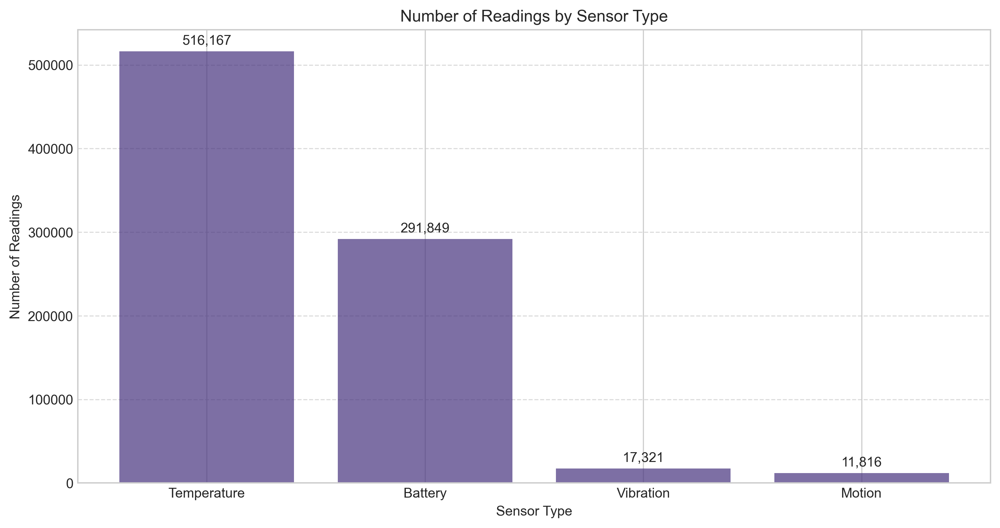

### sensor data time coverage

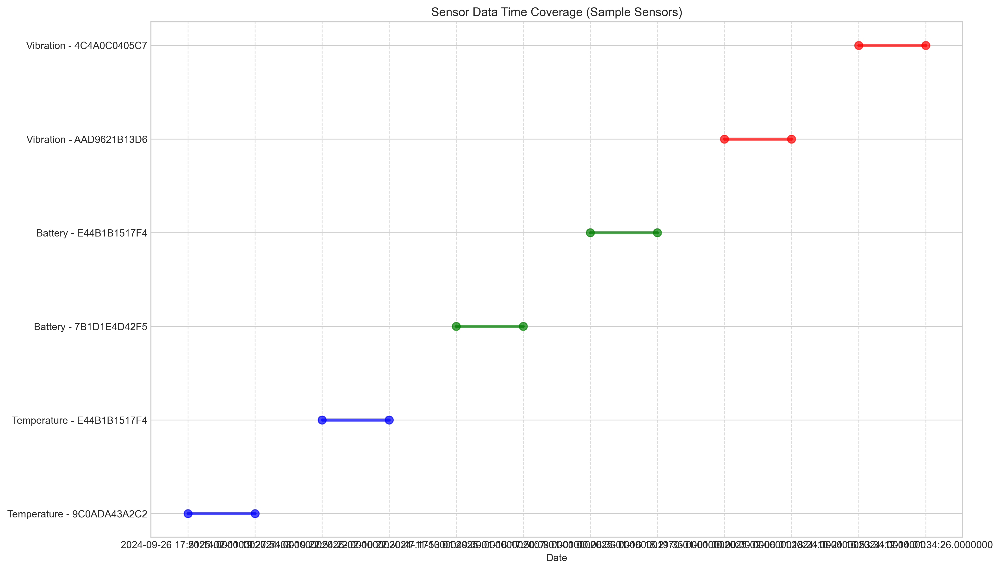

### vibration MagnitudeRMSInMilliG timeseries

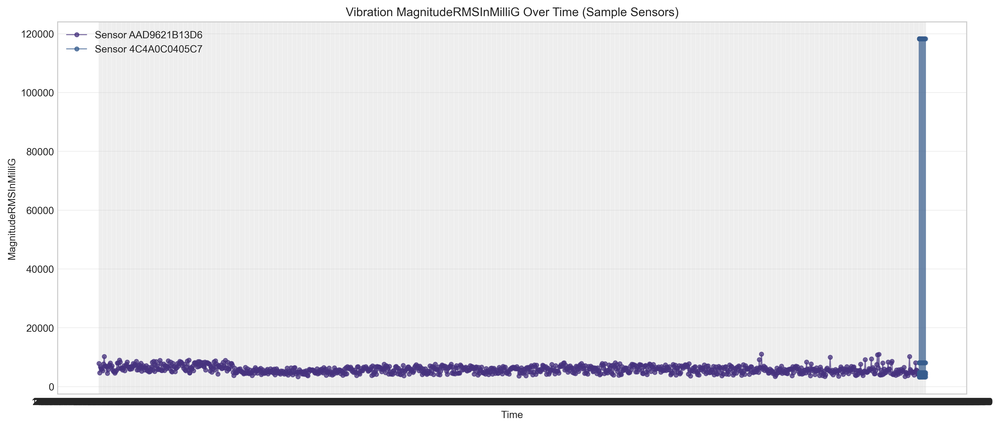

### vibration MagnitudeRMSInMilliG distribution

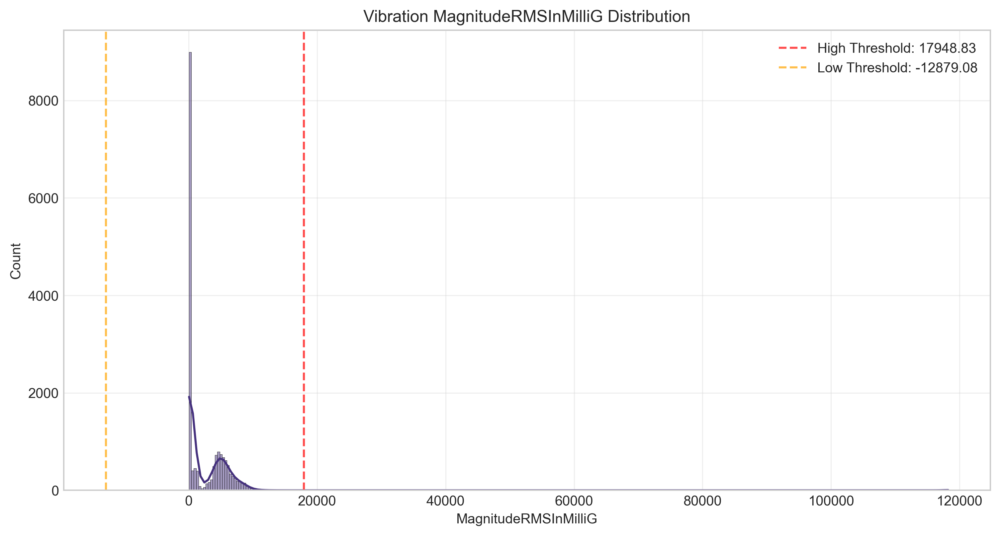

### battery BatteryVoltage timeseries

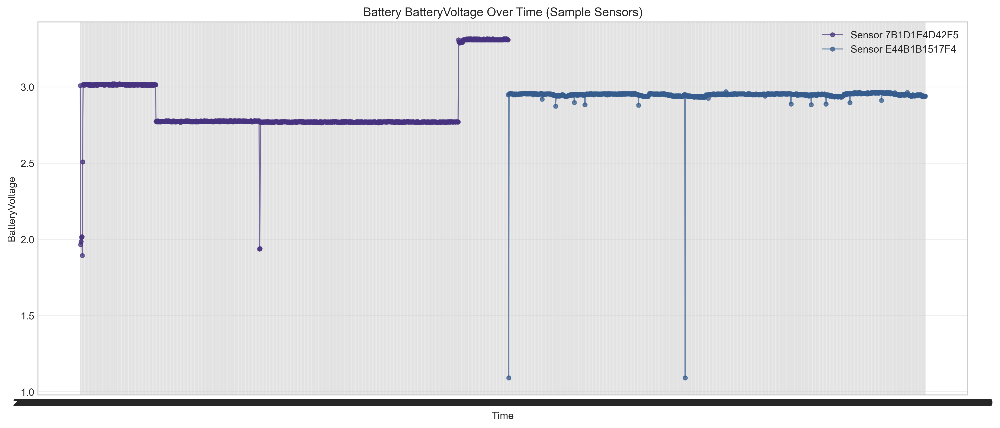

### battery BatteryVoltage distribution

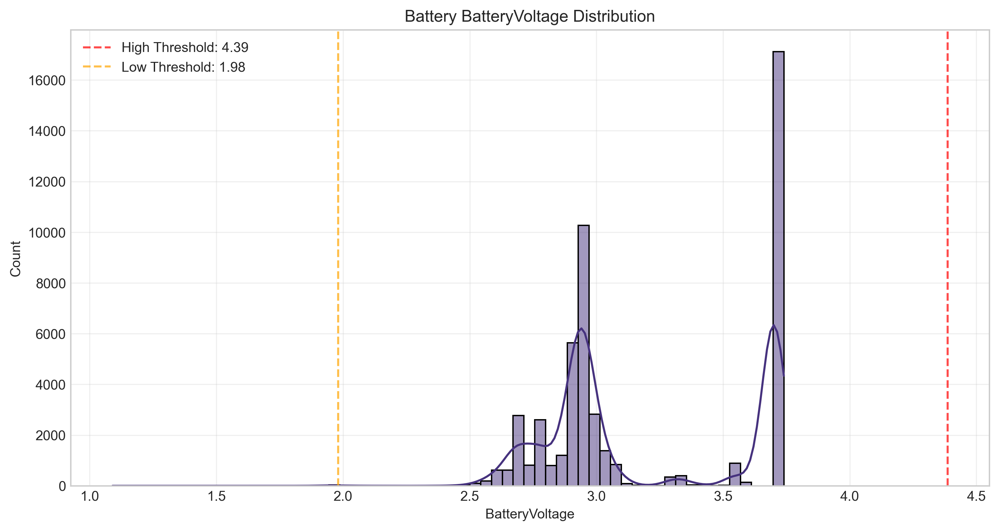

### temperature TemperatureInCelsius timeseries

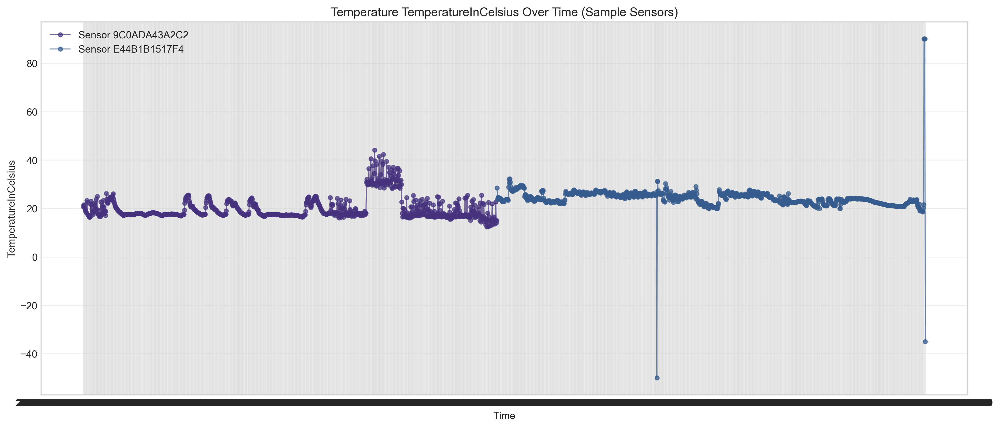

### temperature TemperatureInCelsius distribution

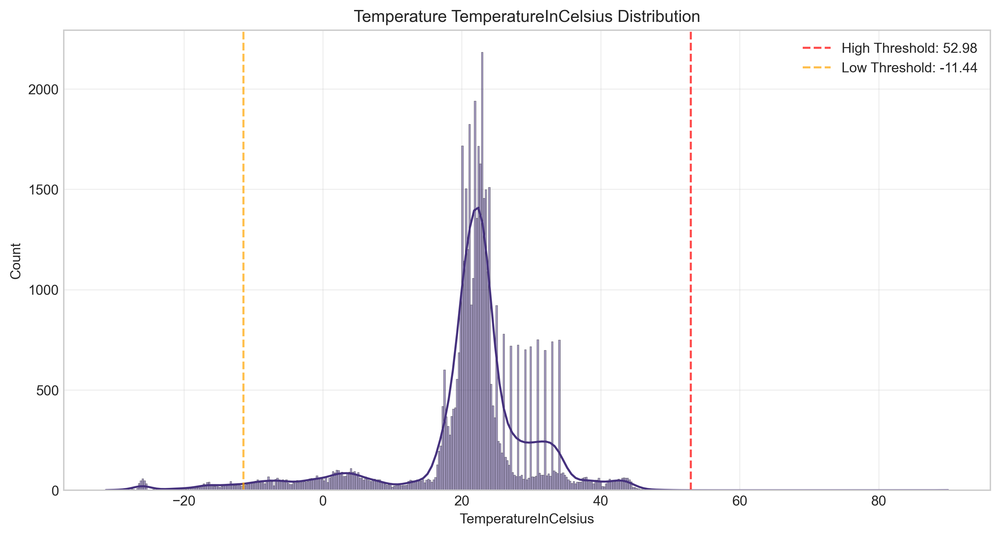

In [20]:
@display_memory_usage
def perform_sensor_data_eda(temp_df, batt_df, vib_df, motn_df, sensors_df=None):
    """
    Perform exploratory data analysis on sensor data with memory efficiency
    
    Parameters:
    -----------
    temp_df : pandas.DataFrame
        Temperature sensor data
    batt_df : pandas.DataFrame
        Battery sensor data
    vib_df : pandas.DataFrame
        Vibration sensor data
    motn_df : pandas.DataFrame
        Motion sensor data
    sensors_df : pandas.DataFrame, optional
        Sensor metadata
        
    Returns:
    --------
    dict
        Dictionary containing EDA results for each sensor type
    """
    print("=== Exploratory Data Analysis of Sensor Data ===")
    
    # Create dictionary to store results
    eda_results = {}
    
    # Dictionary to store consistent sensor samples for visualizations
    viz_samples = {}
    
    # Helper function to analyze a single sensor type
    def analyze_sensor_df(df, sensor_type):
        print(f"\n--- {sensor_type} Sensor Data Analysis ---")
        
        # Basic info
        print(f"Shape: {df.shape}")
        
        # Check for missing values
        missing_values = df.isnull().sum()
        missing_pct = (missing_values / len(df) * 100).round(2)
        print("\nMissing Values:")
        for col, miss in missing_values.items():
            if miss > 0:
                print(f"  - {col}: {miss} values ({missing_pct[col]}%)")
                
        # Unique sensors
        unique_sensors = df['SensorId'].nunique()
        print(f"\nUnique Sensors: {unique_sensors}")
        
        # Readings per sensor (memory-efficient calculation)
        readings_per_sensor = {}
        for stat_name, func in [('count', len), ('min', min), ('max', max)]:
            readings_per_sensor[stat_name] = func(df.groupby('SensorId').size())
        
        # Calculate mean without loading all values into memory
        readings_per_sensor['mean'] = df.groupby('SensorId').size().mean()
        
        print("\nReadings per Sensor:")
        print(f"  - Mean: {readings_per_sensor['mean']:.1f}")
        print(f"  - Min: {readings_per_sensor['min']}")
        print(f"  - Max: {readings_per_sensor['max']}")
        
        # Time range (if available)
        time_range = (None, None)
        if 'EventTimeUtc' in df.columns:
            if pd.api.types.is_datetime64_any_dtype(df['EventTimeUtc']):
                time_range = (df['EventTimeUtc'].min(), df['EventTimeUtc'].max())
            else:
                # Try to convert to datetime
                try:
                    time_range = (pd.to_datetime(df['EventTimeUtc']).min(),
                                 pd.to_datetime(df['EventTimeUtc']).max())
                except:
                    pass
                    
            if time_range[0] is not None:
                duration = time_range[1] - time_range[0]
                print(f"\nTime Range: {time_range[0]} to {time_range[1]}")
                print(f"Duration: {duration}")
        
        # Store results
        result = {
            'shape': df.shape,
            'missing_values': missing_values.to_dict(),
            'unique_sensors': unique_sensors,
            'readings_per_sensor': readings_per_sensor,
        }
        
        if time_range[0] is not None:
            result['time_range'] = (time_range[0], time_range[1])
            result['duration'] = str(time_range[1] - time_range[0])
        
        # Get primary value column based on sensor type
        value_col = None
        if sensor_type == 'temperature':
            value_col = 'TemperatureInCelsius'
        elif sensor_type == 'battery':
            value_col = 'BatteryVoltage'
        elif sensor_type == 'vibration':
            value_col = 'MagnitudeRMSInMilliG'
        elif sensor_type == 'motion':
            value_col = 'max_magnitude' if 'max_magnitude' in df.columns else 'daily_event_count'
        
        # Analyze value column if it exists
        if value_col and value_col in df.columns:
            value_stats = df[value_col].describe().to_dict()
            print(f"\n{value_col} Statistics:")
            print(f"  - Mean: {value_stats['mean']:.2f}")
            print(f"  - Min: {value_stats['min']:.2f}")
            print(f"  - Max: {value_stats['max']:.2f}")
            print(f"  - Std: {value_stats['std']:.2f}")
            
            # Check for extreme values (>3 std from mean)
            mean = value_stats['mean']
            std = value_stats['std']
            extreme_high_threshold = mean + 3*std
            extreme_low_threshold = mean - 3*std
            
            # Count extremes efficiently
            extreme_high = (df[value_col] > extreme_high_threshold).sum()
            extreme_low = (df[value_col] < extreme_low_threshold).sum()
            
            if extreme_high > 0 or extreme_low > 0:
                print("\nExtreme Values:")
                if extreme_high > 0:
                    print(f"  - High (>{extreme_high_threshold:.2f}): {extreme_high} values ({extreme_high/len(df)*100:.2f}%)")
                if extreme_low > 0:
                    print(f"  - Low (<{extreme_low_threshold:.2f}): {extreme_low} values ({extreme_low/len(df)*100:.2f}%)")
            
            result['value_stats'] = value_stats
            result['extreme_values'] = {
                'high_count': int(extreme_high),
                'low_count': int(extreme_low),
                'high_threshold': float(extreme_high_threshold),
                'low_threshold': float(extreme_low_threshold)
            }
            
            # Select representative sensors for visualization
            representative_sensors = []
            
            # 1. Sensor with most readings
            top_by_readings = df.groupby('SensorId').size().nlargest(1).index[0]
            representative_sensors.append(top_by_readings)
            
            # 2. Sensor with extreme values (if any)
            if extreme_high > 0:
                sensor_with_high = df[df[value_col] > extreme_high_threshold]['SensorId'].value_counts().index[0]
                if sensor_with_high not in representative_sensors:
                    representative_sensors.append(sensor_with_high)
            
            # 3. Add another sensor for diversity if available
            if unique_sensors > 2 and len(representative_sensors) < 2:
                # Get a sensor not already selected
                for sensor_id in df['SensorId'].unique():
                    if sensor_id not in representative_sensors:
                        representative_sensors.append(sensor_id)
                        break
            
            # Store these sensors for consistent visualizations
            viz_samples[sensor_type] = representative_sensors[:2]  # Limit to 2 sensors
            
            # Create value distribution visualization
            plt.figure(figsize=(12, 6))
            
            # Use a sample of data for histogram to save memory
            sample_size = min(50000, len(df))
            if len(df) > sample_size:
                # Stratified sampling by sensor
                sampled_df = pd.DataFrame()
                for sensor_id in df['SensorId'].unique():
                    sensor_data = df[df['SensorId'] == sensor_id]
                    # Calculate sample size proportional to sensor's data volume
                    sensor_sample_size = max(1, int(sample_size * len(sensor_data) / len(df)))
                    # Sample from this sensor's data
                    if len(sensor_data) > sensor_sample_size:
                        sampled_sensor_data = sensor_data.sample(sensor_sample_size)
                        sampled_df = pd.concat([sampled_df, sampled_sensor_data])
                    else:
                        sampled_df = pd.concat([sampled_df, sensor_data])
                
                sns.histplot(sampled_df[value_col], kde=True)
            else:
                sns.histplot(df[value_col], kde=True)
            
            plt.title(f'{sensor_type.capitalize()} {value_col} Distribution')
            plt.xlabel(value_col)
            plt.ylabel('Count')
            plt.grid(True, alpha=0.3)
            
            # Add vertical lines for extreme thresholds
            plt.axvline(x=extreme_high_threshold, color='red', linestyle='--', alpha=0.7,
                      label=f'High Threshold: {extreme_high_threshold:.2f}')
            plt.axvline(x=extreme_low_threshold, color='orange', linestyle='--', alpha=0.7,
                      label=f'Low Threshold: {extreme_low_threshold:.2f}')
            plt.legend()
            
            viz_path = f'./visualizations/eda/{sensor_type}_{value_col}_distribution.png'
            plt.savefig(viz_path, dpi=300, bbox_inches='tight')
            plt.close()
            
            # Create time series visualization for sample sensors
            plt.figure(figsize=(14, 6))
            
            for sensor_id in viz_samples[sensor_type]:
                sensor_df = df[df['SensorId'] == sensor_id].copy()
                
                # If too many points, sample for visualization
                if len(sensor_df) > 1000:
                    # Systematic sampling
                    sample_interval = max(1, len(sensor_df) // 1000)
                    sensor_df = sensor_df.iloc[::sample_interval].copy()
                
                sensor_df = sensor_df.sort_values('EventTimeUtc')
                
                plt.plot(sensor_df['EventTimeUtc'], sensor_df[value_col], 'o-', 
                        alpha=0.7, markersize=4, linewidth=1, label=f"Sensor {sensor_id}")
            
            plt.title(f'{sensor_type.capitalize()} {value_col} Over Time (Sample Sensors)')
            plt.xlabel('Time')
            plt.ylabel(value_col)
            plt.legend()
            plt.grid(True, alpha=0.3)
            plt.tight_layout()
            
            viz_path = f'./visualizations/eda/{sensor_type}_{value_col}_timeseries.png'
            plt.savefig(viz_path, dpi=300, bbox_inches='tight')
            plt.close()
            
            # Force garbage collection after visualizations
            gc.collect()
        
        return result
    
    # Analyze each sensor type
    if temp_df is not None and not temp_df.empty:
        eda_results['temperature'] = analyze_sensor_df(temp_df, 'temperature')
        
    if batt_df is not None and not batt_df.empty:
        eda_results['battery'] = analyze_sensor_df(batt_df, 'battery')
        
    if vib_df is not None and not vib_df.empty:
        eda_results['vibration'] = analyze_sensor_df(vib_df, 'vibration')
        
    if motn_df is not None and not motn_df.empty:
        eda_results['motion'] = analyze_sensor_df(motn_df, 'motion')
    
    # Analyze sensor metadata if available
    if sensors_df is not None and not sensors_df.empty:
        print("\n--- Sensor Metadata Analysis ---")
        print(f"Shape: {sensors_df.shape}")
        
        # Check sensor type distribution if available
        if 'SensorType' in sensors_df.columns:
            sensor_type_counts = sensors_df['SensorType'].value_counts()
            print("\nSensor Type Distribution:")
            for sensor_type, count in sensor_type_counts.items():
                print(f"  - {sensor_type}: {count}")
                
        # Check for sensor account/location information
        account_cols = [col for col in sensors_df.columns 
                      if any(x in col.lower() for x in ['account', 'location', 'customer'])]
        
        if account_cols:
            for col in account_cols:
                unique_values = sensors_df[col].nunique()
                print(f"\n{col} Unique Values: {unique_values}")
        
        # Store metadata results
        eda_results['sensors_metadata'] = {
            'shape': sensors_df.shape,
            'columns': list(sensors_df.columns)
        }
        
        if 'SensorType' in sensors_df.columns:
            eda_results['sensors_metadata']['sensor_type_distribution'] = sensor_type_counts.to_dict()
    
    # Create temporal coverage visualization with sample sensors only
    plt.figure(figsize=(14, 8))
    
    y_position = 0
    y_labels = []
    
    # Only plot the sensors we've selected for visualization
    for sensor_type, sensor_ids in viz_samples.items():
        if sensor_type == 'temperature':
            df = temp_df
            color = 'blue'
        elif sensor_type == 'battery':
            df = batt_df
            color = 'green'
        elif sensor_type == 'vibration':
            df = vib_df
            color = 'red'
        elif sensor_type == 'motion':
            df = motn_df
            color = 'purple'
        else:
            continue
        
        if df is None or df.empty or 'EventTimeUtc' not in df.columns:
            continue
        
        # Plot selected sensors
        for sensor_id in sensor_ids:
            sensor_df = df[df['SensorId'] == sensor_id]
            
            if len(sensor_df) > 0:
                start_time = sensor_df['EventTimeUtc'].min()
                end_time = sensor_df['EventTimeUtc'].max()
                
                plt.plot([start_time, end_time], [y_position, y_position], 'o-', 
                        linewidth=3, markersize=8, alpha=0.7, color=color)
                
                y_labels.append(f"{sensor_type.capitalize()} - {sensor_id}")
                y_position += 1
    
    plt.yticks(range(len(y_labels)), y_labels)
    plt.grid(axis='x', linestyle='--', alpha=0.7)
    plt.title('Sensor Data Time Coverage (Sample Sensors)')
    plt.xlabel('Date')
    plt.tight_layout()
    
    viz_path = './visualizations/eda/sensor_data_time_coverage.png'
    plt.savefig(viz_path, dpi=300, bbox_inches='tight')
    plt.close()
    
    # Create reading frequency visualization
    plt.figure(figsize=(12, 6))
    
    sensor_types = []
    reading_counts = []
    
    for sensor_type, df in [('Temperature', temp_df), ('Battery', batt_df), 
                          ('Vibration', vib_df), ('Motion', motn_df)]:
        if df is None or df.empty:
            continue
            
        sensor_types.append(sensor_type)
        reading_counts.append(len(df))
    
    plt.bar(sensor_types, reading_counts, alpha=0.7)
    plt.title('Number of Readings by Sensor Type')
    plt.xlabel('Sensor Type')
    plt.ylabel('Number of Readings')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    
    # Add count labels on top of bars
    for i, count in enumerate(reading_counts):
        plt.text(i, count + (max(reading_counts) * 0.01), f"{count:,}", 
                ha='center', va='bottom')
    
    viz_path = './visualizations/eda/reading_counts_by_sensor_type.png'
    plt.savefig(viz_path, dpi=300, bbox_inches='tight')
    plt.close()
    
    # Store visualization sample IDs for later use
    eda_results['viz_samples'] = viz_samples
    
    return eda_results

# Run EDA on the sensor data
eda_results = perform_sensor_data_eda(temp_df, batt_df, vib_df, motn_df, sensors_df)

# Display EDA visualizations in the notebook
display(Markdown("## Exploratory Data Analysis Visualizations"))
display_visualizations('./visualizations/eda')

### Temporal Analysis for Resampling Calibration

Analyze temporal patterns in sensor data to inform preprocessing decisions with memory optimization

In [21]:
@display_memory_usage
def analyze_temporal_patterns(temp_df, batt_df, vib_df, motn_df, viz_samples=None):
    """
    Analyze temporal patterns in sensor data to inform preprocessing decisions
    with memory optimization
    
    Parameters:
    -----------
    temp_df : pandas.DataFrame
        Temperature sensor data
    batt_df : pandas.DataFrame
        Battery sensor data
    vib_df : pandas.DataFrame
        Vibration sensor data
    motn_df : pandas.DataFrame
        Motion sensor data
    viz_samples : dict, optional
        Dictionary of sensor IDs to use for visualizations
        
    Returns:
    --------
    dict
        Dictionary with temporal analysis results
    """
    print("=== Sensor Data Temporal Analysis ===")
    
    # Create dictionary to store results
    temporal_results = {}
    
    # Use visualization samples from EDA if available
    if viz_samples is None:
        viz_samples = {}
    
    # Helper function to analyze time intervals for a single dataframe
    def analyze_intervals(df, sensor_type):
        print(f"\n--- {sensor_type.capitalize()} Sensor Temporal Analysis ---")
        
        # Ensure EventTimeUtc is datetime
        if 'EventTimeUtc' not in df.columns:
            print(f"No timestamp column in {sensor_type} data")
            return None
            
        if not pd.api.types.is_datetime64_any_dtype(df['EventTimeUtc']):
            try:
                # Convert only the min and max timestamps to save memory
                min_time = pd.to_datetime(df['EventTimeUtc'].min())
                max_time = pd.to_datetime(df['EventTimeUtc'].max())
                time_range = (min_time, max_time)
            except:
                print(f"Could not convert timestamps for {sensor_type} data")
                return None
        else:
            # Get time range
            time_range = (df['EventTimeUtc'].min(), df['EventTimeUtc'].max())
        
        start_time, end_time = time_range
        total_duration = end_time - start_time
        
        print(f"Data Collection Period:")
        print(f"  Start Time:     {start_time}")
        print(f"  End Time:       {end_time}")
        print(f"  Total Duration: {total_duration}")
        
        print(f"\nReading Statistics:")
        print(f"  Total Readings: {len(df):,}")
        
        # Analyze readings per sensor
        readings_per_sensor = df.groupby('SensorId').size()
        print(f"\nReadings per Sensor Distribution:")
        print(f"  Count: {len(readings_per_sensor):.2f}")
        print(f"  Mean: {readings_per_sensor.mean():.2f}")
        print(f"  Std: {readings_per_sensor.std():.2f}")
        print(f"  Min: {readings_per_sensor.min():.2f}")
        print(f"  25%: {readings_per_sensor.quantile(0.25):.2f}")
        print(f"  50%: {readings_per_sensor.quantile(0.5):.2f}")
        print(f"  75%: {readings_per_sensor.quantile(0.75):.2f}")
        print(f"  Max: {readings_per_sensor.max():.2f}")
        
        # Calculate time gaps between readings for selected sensors only
        all_gaps = []
        sensor_median_gaps = {}
        
        # Get sample sensors for visualization
        sample_sensors = viz_samples.get(sensor_type, [])
        if not sample_sensors and len(readings_per_sensor) > 0:
            # Select top sensors by reading count if no samples provided
            sample_sensors = readings_per_sensor.nlargest(2).index.tolist()
        
        # Only analyze up to 5 sensors to save memory
        analyze_sensors = sample_sensors
        if len(analyze_sensors) < 5:
            # Add a few more sensors if needed
            more_sensors = [s for s in df['SensorId'].unique() if s not in analyze_sensors]
            analyze_sensors.extend(more_sensors[:5-len(analyze_sensors)])
        
        for sensor_id in analyze_sensors:
            sensor_df = df[df['SensorId'] == sensor_id].copy()
            sensor_df = sensor_df.sort_values('EventTimeUtc')
            
            if len(sensor_df) <= 1:
                continue
                
            # Calculate time differences
            time_diffs = sensor_df['EventTimeUtc'].diff()[1:]  # Skip first (NaN)
            
            # Convert to seconds
            gaps_seconds = time_diffs.dt.total_seconds()
            
            # Record median gap for this sensor
            sensor_median_gaps[sensor_id] = gaps_seconds.median()
            
            # Sample gaps to avoid memory issues
            if len(gaps_seconds) > 1000:
                # Systematic sampling
                sample_interval = max(1, len(gaps_seconds) // 1000)
                sampled_gaps = gaps_seconds.iloc[::sample_interval].values
                all_gaps.extend(sampled_gaps)
            else:
                all_gaps.extend(gaps_seconds)
        
        # Convert to numpy array for calculations
        all_gaps = np.array(all_gaps)
        
        # Calculate gap statistics
        if len(all_gaps) > 0:
            print(f"\nReading Time Gaps:")
            print(f"  Mean Gap: {pd.Timedelta(seconds=all_gaps.mean())}")
            print(f"  Median Gap: {pd.Timedelta(seconds=np.median(all_gaps))}")
            print(f"  Minimum Gap: {pd.Timedelta(seconds=all_gaps.min())}")
            print(f"  Maximum Gap: {pd.Timedelta(seconds=all_gaps.max())}")
        
            # Determine most common gap (mode)
            from scipy import stats
            # Round to nearest second to find mode
            rounded_gaps = np.round(all_gaps)
            # Use bincount to find mode more efficiently
            if len(np.unique(rounded_gaps)) < 1000:  # Only if not too many unique values
                try:
                    # Fix for different scipy.stats.mode return formats
                    mode_result = stats.mode(rounded_gaps)
                    # Check if mode_result is a ModeResult object with a 'mode' attribute
                    if hasattr(mode_result, 'mode'):
                        if isinstance(mode_result.mode, np.ndarray):
                            mode_gap_seconds = mode_result.mode[0]
                        else:
                            mode_gap_seconds = mode_result.mode
                    else:
                        # Older versions return a tuple (mode, count)
                        mode_gap_seconds = mode_result[0][0]

                    # Count occurrences
                    mode_count = np.sum(rounded_gaps == mode_gap_seconds)
                    mode_pct = (mode_count / len(rounded_gaps)) * 100
                    
                    print(f"\nMost Common Gap: {pd.Timedelta(seconds=mode_gap_seconds)} "
                         f"({mode_pct:.2f}% of intervals)")
                except Exception as e:
                    print(f"Could not calculate mode: {str(e)}")
                    # Alternative approach using numpy
                    unique_vals, counts = np.unique(rounded_gaps, return_counts=True)
                    mode_idx = np.argmax(counts)
                    mode_gap_seconds = unique_vals[mode_idx]
                    mode_count = counts[mode_idx]
                    mode_pct = (mode_count / len(rounded_gaps)) * 100
                    print(f"\nMost Common Gap (alternative method): {pd.Timedelta(seconds=mode_gap_seconds)} "
                          f"({mode_pct:.2f}% of intervals)")
            
            # Recommend resampling interval based on median gap
            median_gap_seconds = np.median(all_gaps)
            
            if sensor_type == 'temperature':
                if 250 <= median_gap_seconds <= 350:
                    recommendation = "5 minutes (current interval appears to be ~5 minutes)"
                elif median_gap_seconds < 250:
                    recommendation = "5 minutes (upsample from current interval)"
                else:
                    recommendation = "5 minutes (downsample from current interval)"
            elif sensor_type == 'battery':
                if 850 <= median_gap_seconds <= 950:
                    recommendation = "15 minutes (current interval appears to be ~15 minutes)"
                elif median_gap_seconds < 850:
                    recommendation = "15 minutes (upsample from current interval)"
                else:
                    recommendation = "15 minutes (downsample from current interval)"
            elif sensor_type == 'vibration':
                if 3500 <= median_gap_seconds <= 3700:
                    recommendation = "1 hour (current interval appears to be ~1 hour)"
                else:
                    recommendation = "1 hour (adjust from current interval)"
            else:  # motion
                recommendation = "daily aggregation (motion data should be treated as event-based)"
            
            print(f"\nRecommended Resampling for {sensor_type}: {recommendation}")
            
            # Create visualization of gap distribution
            plt.figure(figsize=(12, 6))
            
            # Convert to minutes for better readability
            gaps_minutes = all_gaps / 60
            
            # For very large gaps, clip for better visualization
            max_display = np.percentile(gaps_minutes, 95) * 2  # Clip at 2x the 95th percentile
            gaps_minutes_clipped = np.clip(gaps_minutes, 0, max_display)
            
            plt.hist(gaps_minutes_clipped, bins=30, alpha=0.7, density=True)
            plt.title(f'{sensor_type.capitalize()} Data: Distribution of Time Intervals')
            plt.xlabel('Time Interval (minutes)')
            plt.ylabel('Density')
            plt.grid(True, alpha=0.3)
            
            # Add vertical line at median
            median_minutes = median_gap_seconds / 60
            plt.axvline(x=median_minutes, color='red', linestyle='--', 
                      label=f'Median: {median_minutes:.2f} min')
            
            # Add vertical line at most common gap if available
            if 'mode_gap_seconds' in locals():
                mode_minutes = mode_gap_seconds / 60
                plt.axvline(x=mode_minutes, color='green', linestyle='-', 
                          label=f'Most Common: {mode_minutes:.2f} min')
            
            plt.legend()
            plt.tight_layout()
            
            viz_path = f'./visualizations/eda/{sensor_type}_interval_distribution.png'
            plt.savefig(viz_path, dpi=300, bbox_inches='tight')
            plt.close()
            
            # Create visualization of intervals by sensor (only for sample sensors)
            plt.figure(figsize=(12, 6))
            
            # Convert to minutes for better readability
            # Only use sensors with median gaps calculated
            sample_median_mins = {k: v/60 for k, v in sensor_median_gaps.items() if k in sample_sensors}
            
            if sample_median_mins:
                # Sort by median interval
                sorted_samples = sorted(sample_median_mins.items(), key=lambda x: x[1])
                sensor_ids = [x[0] for x in sorted_samples]
                medians = [x[1] for x in sorted_samples]
                
                # Create bar chart
                plt.bar(sensor_ids, medians, alpha=0.7)
                plt.title(f'{sensor_type.capitalize()} Data: Median Interval by Sensor (Sample)')
                plt.xlabel('Sensor ID')
                plt.ylabel('Median Interval (minutes)')
                plt.xticks(rotation=90)
                plt.grid(axis='y', alpha=0.3)
                plt.tight_layout()
                
                viz_path = f'./visualizations/eda/{sensor_type}_intervals_by_sensor.png'
                plt.savefig(viz_path, dpi=300, bbox_inches='tight')
                plt.close()
            
            # Store results
            result = {
                'start_time': start_time,
                'end_time': end_time,
                'total_duration': total_duration,
                'total_readings': len(df),
                'readings_per_sensor': {k: int(v) for k, v in readings_per_sensor.items()},
                'time_gaps': {
                    'mean_seconds': float(all_gaps.mean()),
                    'median_seconds': float(median_gap_seconds),
                    'min_seconds': float(all_gaps.min()),
                    'max_seconds': float(all_gaps.max())
                },
                'recommended_resampling': recommendation
            }
            
            if 'mode_gap_seconds' in locals():
                result['most_common_gap_seconds'] = float(mode_gap_seconds)
                result['most_common_gap_percentage'] = float(mode_pct)
            
            return result
        else:
            print("No time gaps could be calculated")
            return None
    
    # Analyze each sensor type
    if temp_df is not None and not temp_df.empty:
        temporal_results['temperature'] = analyze_intervals(temp_df, 'temperature')
        
    if batt_df is not None and not batt_df.empty:
        temporal_results['battery'] = analyze_intervals(batt_df, 'battery')
        
    if vib_df is not None and not vib_df.empty:
        temporal_results['vibration'] = analyze_intervals(vib_df, 'vibration')
        
    if motn_df is not None and not motn_df.empty:
        temporal_results['motion'] = analyze_intervals(motn_df, 'motion')
    
    # Create comprehensive visualization of all time intervals (median only)
    plt.figure(figsize=(14, 8))
    
    # Set up colors
    colors = {'temperature': 'red', 'battery': 'blue', 'vibration': 'green', 'motion': 'purple'}
    
    for i, (sensor_type, result) in enumerate(temporal_results.items()):
        if result is None or 'time_gaps' not in result:
            continue
            
        # Get median gap in minutes
        median_gap_min = result['time_gaps']['median_seconds'] / 60
        
        # Plot point
        plt.scatter(i, median_gap_min, s=100, color=colors.get(sensor_type, 'gray'), 
                   label=f"{sensor_type.capitalize()}")
        
        # Add label
        plt.text(i, median_gap_min * 1.1, f"{median_gap_min:.2f} min", 
                ha='center', va='bottom')
    
    plt.xticks(range(len(temporal_results)), 
              [k.capitalize() for k in temporal_results.keys()])
    plt.title('Median Time Interval by Sensor Type')
    plt.ylabel('Minutes')
    plt.yscale('log')  # Use log scale for better visibility of differences
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    
    viz_path = './visualizations/eda/all_sensor_intervals.png'
    plt.savefig(viz_path, dpi=300, bbox_inches='tight')
    plt.close()
    
    return temporal_results

## Preprocessing pipeline

 ## Preprocessing Approach and Rationale

 Our preprocessing strategy is tailored to each sensor type's characteristics:

 ### Temperature Sensors (5-minute resampling)
 - Temperature data typically shows gradual changes
 - 5-minute intervals provide sufficient granularity for trend detection
 - Time-based interpolation preserves trends for small gaps
 - Interpolation limit of 6 points prevents creating artificial data for large gaps (max 30 minutes)

 ### Battery Sensors (15-minute resampling)
 - Battery voltage changes very slowly in normal conditions
 - 15-minute intervals reduce data volume while maintaining important patterns
 - Interpolation with 4-point limit (1 hour) handles small gaps

 ### Vibration Sensors (hourly resampling)
 - Vibration data often shows burst patterns that must be preserved
 - We calculate both mean and max values to capture both baseline and peak events
 - Hourly aggregation balances detail retention with data volume reduction

 ### Motion Sensors (daily aggregation)
 - Motion data is inherently event-based
 - Daily aggregation with event counting preserves the fundamental patterns
 - We also track maximum magnitude to capture intensity information

 ### Memory Optimization Techniques
 - Processing sensors individually to limit memory footprint
 - Batch processing for large sensors
 - Data type optimization (e.g., int8, float32)
 - Removing unnecessary columns

 ### Data Quality Validation
 - Checking for missing values
 - Validating resampling consistency
 - Identifying extreme values
 - Ensuring timestamp integrity

## Data Preprocessing
 
 In this section, we preprocess the raw sensor data to prepare it for anomaly detection:
 
 - **Temperature Data**: Resampled to 5-minute intervals with time-based interpolation
 - **Battery Data**: Resampled to 15-minute intervals with time-based interpolation
 - **Vibration Data**: Resampled to hourly intervals preserving burst patterns (both max and mean)
 - **Motion Data**: Treated as event-based data with daily aggregation
 
 The preprocessing pipeline includes:
 - Timestamp validation and correction
 - Sensor-specific processing
 - Memory optimization
 - Data quality validation
 - Before/after visualizations

In [ ]:
# Import necessary libraries if not already imported
import os
import gc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime, timedelta
from IPython.display import display, Markdown
import warnings
from tqdm.notebook import tqdm
import logging

# Set up logging
logging.basicConfig(level=logging.INFO, 
                    format='%(asctime)s - %(name)s - %(levelname)s - %(message)s')
logger = logging.getLogger('sensor_preprocessing')

# Memory usage decorator for monitoring memory consumption
def display_memory_usage(func):
    """Decorator to display memory usage before and after function execution"""
    import psutil
    import functools
    
    @functools.wraps(func)
    def wrapper(*args, **kwargs):
        # Get current process
        process = psutil.Process(os.getpid())
        
        # Get memory info before execution
        mem_before = process.memory_info().rss / (1024 * 1024)  # Convert to MB
        print(f"Memory usage before: {mem_before:.2f} MB")
        
        # Execute function
        result = func(*args, **kwargs)
        
        # Force garbage collection
        gc.collect()
        
        # Get memory info after execution
        mem_after = process.memory_info().rss / (1024 * 1024)
        print(f"Memory usage after: {mem_after:.2f} MB")
        print(f"Memory change: {mem_after - mem_before:.2f} MB")
        
        return result
    
    return wrapper

class SensorPreprocessor:
    """
    Comprehensive sensor data preprocessor for IoT sensors.
    
    This preprocessor applies different strategies based on sensor type:
    - Temperature: 5-minute resampling with interpolation
    - Battery: 15-minute resampling with interpolation
    - Vibration: Hourly resampling to preserve burst patterns
    - Motion: Daily aggregation treating motion as event-based data
    
    It's designed for memory efficiency with batch processing and
    includes comprehensive validation and visualization capabilities.
    """
    
    def __init__(self, output_dir='./processed_data', viz_dir='./visualizations/preprocessing'):
        """
        Initialize the sensor preprocessor
        
        Parameters:
        -----------
        output_dir : str
            Directory for storing processed data
        viz_dir : str
            Directory for saving visualizations
        """
        self.output_dir = output_dir
        self.viz_dir = viz_dir
        
        # Create output directories if they don't exist
        os.makedirs(output_dir, exist_ok=True)
        os.makedirs(viz_dir, exist_ok=True)
        
        # Configuration for each sensor type
        self.config = {
            'temperature': {
                'resample_freq': '5min',
                'interpolation_method': 'time',
                'interpolation_limit': 6,  # 30 minutes (6 * 5min)
                'batch_size': 50000,
                'main_value_column': 'TemperatureInCelsius'
            },
            'battery': {
                'resample_freq': '15min',
                'interpolation_method': 'time',
                'interpolation_limit': 4,  # 1 hour (4 * 15min)
                'batch_size': 30000,
                'main_value_column': 'BatteryVoltage'
            },
            'vibration': {
                'resample_freq': '1H',
                'batch_size': 10000,
                'main_value_column': 'MagnitudeRMSInMilliG'
            },
            'motion': {
                'group_by': 'day',
                'batch_size': 5000,
                'main_value_column': 'max_magnitude'
            }
        }
        
        # Statistics about the processed data
        self.processing_stats = {}
        
        # Logger for tracking operations
        self.logger = logging.getLogger('sensor_preprocessor')
    
    def _fix_timestamps(self, df):
        """
        Fix timestamp issues in the dataframe and filter for data after 2021.
        
        Parameters:
        -----------
        df : pandas.DataFrame
            DataFrame with EventTimeUtc column
                
        Returns:
        --------
        pandas.DataFrame
            DataFrame with fixed timestamps, filtered to include only data after 2021
        """
        # Check if timestamp column exists
        if 'EventTimeUtc' not in df.columns:
            self.logger.warning("No EventTimeUtc column found")
            return df
        
        # Create a copy to avoid modifying the original
        df = df.copy()
        
        # Convert to datetime if not already
        if not pd.api.types.is_datetime64_any_dtype(df['EventTimeUtc']):
            try:
                # Convert timestamp column to datetime
                df['EventTimeUtc'] = pd.to_datetime(df['EventTimeUtc'], errors='coerce')
                self.logger.info(f"Converted EventTimeUtc to datetime. NaT values: {df['EventTimeUtc'].isna().sum()}")
            except Exception as e:
                self.logger.error(f"Error converting timestamps: {str(e)}")
                return df
        
        # Filter out invalid timestamps
        valid_mask = ~df['EventTimeUtc'].isna()
        invalid_count = (~valid_mask).sum()
        if invalid_count > 0:
            self.logger.warning(f"Removing {invalid_count} rows with invalid timestamps")
            df = df[valid_mask]
        
        # Filter data to include only records after 2021-01-01
        start_date = pd.Timestamp('2021-01-01')
        date_mask = df['EventTimeUtc'] >= start_date
        filtered_count = (~date_mask).sum()
        if filtered_count > 0:
            self.logger.info(f"Filtering out {filtered_count} records before 2021-01-01")
            df = df[date_mask]
        
        # Filter out future dates
        now = pd.Timestamp.now()
        future_mask = df['EventTimeUtc'] <= now
        future_count = (~future_mask).sum()
        if future_count > 0:
            self.logger.warning(f"Removing {future_count} rows with future timestamps")
            df = df[future_mask]
        
        return df

    def _reduce_memory_usage(self, df):
        """
        Reduce memory usage of DataFrame by optimizing data types.
        
        Parameters:
        -----------
        df : pandas.DataFrame
            DataFrame to optimize
            
        Returns:
        --------
        pandas.DataFrame
            Memory-optimized DataFrame
        """
        if df.empty:
            return df
            
        start_memory = df.memory_usage().sum() / 1024**2
        
        for col in df.columns:
            # Skip datetime and object columns
            if pd.api.types.is_datetime64_any_dtype(df[col]) or df[col].dtype == 'object':
                continue
                
            col_type = df[col].dtype
            
            try:
                c_min = df[col].min()
                c_max = df[col].max()
                
                # Downcast integers
                if str(col_type)[:3] == 'int':
                    if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                        df[col] = df[col].astype(np.int8)
                    elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                        df[col] = df[col].astype(np.int16)
                    elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                        df[col] = df[col].astype(np.int32)
                    elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                        df[col] = df[col].astype(np.int64)
                # Downcast floats
                else:
                    if c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                        df[col] = df[col].astype(np.float32)
                    else:
                        df[col] = df[col].astype(np.float64)
                        
            except Exception as e:
                self.logger.debug(f"Could not optimize column {col}: {str(e)}")
        
        end_memory = df.memory_usage().sum() / 1024**2
        reduction = (start_memory - end_memory) / start_memory * 100
        self.logger.info(f"Memory usage reduced from {start_memory:.2f} MB to {end_memory:.2f} MB ({reduction:.1f}% reduction)")
        
        return df
    
    def _process_temperature_data(self, df, visualize=True, sample_sensors=None):
        """
        Process temperature sensor data:
        - Resample to 5-minute intervals
        - Apply time-based interpolation to preserve trends
        
        Parameters:
        -----------
        df : pandas.DataFrame
            Raw temperature sensor data
        visualize : bool
            Whether to create visualizations
        sample_sensors : list
            List of sensor IDs to use for visualization
            
        Returns:
        --------
        pandas.DataFrame
            Processed temperature data
        """
        self.logger.info("Processing temperature data...")
        
        if df.empty:
            self.logger.warning("Empty temperature dataframe")
            return df
        
        # Fix timestamps
        df = self._fix_timestamps(df)
        
        # Check if main value column exists
        value_col = self.config['temperature']['main_value_column']
        if value_col not in df.columns:
            self.logger.error(f"Main value column '{value_col}' not found")
            return df
        
        # Process each sensor separately to manage memory
        processed_dfs = []
        batch_size = self.config['temperature']['batch_size']
        stats = {}
        
        # Sample sensors for visualization if not provided
        if visualize and sample_sensors is None:
            # Get top sensors by number of readings
            top_sensors = df.groupby('SensorId').size().nlargest(2).index.tolist()
            sample_sensors = top_sensors
        
        # For visualization, store raw sample data
        raw_samples = {}
        if visualize and sample_sensors:
            for sensor_id in sample_sensors:
                sensor_df = df[df['SensorId'] == sensor_id].copy()
                if not sensor_df.empty:
                    # Sort by time
                    sensor_df = sensor_df.sort_values('EventTimeUtc')
                    # Store a sample (up to 1000 points)
                    if len(sensor_df) > 1000:
                        # Systematic sampling
                        interval = len(sensor_df) // 1000
                        raw_samples[sensor_id] = sensor_df.iloc[::interval].copy()
                    else:
                        raw_samples[sensor_id] = sensor_df.copy()
        
        # Process each sensor
        for sensor_id in tqdm(df['SensorId'].unique(), desc="Processing temperature sensors"):
            # Get data for this sensor
            sensor_df = df[df['SensorId'] == sensor_id].copy()
            
            # Skip if too few data points
            if len(sensor_df) <= 2:
                self.logger.debug(f"Skipping sensor {sensor_id}: too few data points")
                continue
            
            # Process in batches if large
            if len(sensor_df) > batch_size:
                processed_sensor = self._process_sensor_in_batches(
                    sensor_df, 'temperature', sensor_id
                )
            else:
                processed_sensor = self._process_temperature_sensor(sensor_df, sensor_id)
            
            if not processed_sensor.empty:
                processed_dfs.append(processed_sensor)
                
                # Store statistics
                stats[sensor_id] = {
                    'original_points': len(sensor_df),
                    'processed_points': len(processed_sensor),
                    'time_range': (
                        sensor_df['EventTimeUtc'].min(),
                        sensor_df['EventTimeUtc'].max()
                    ),
                }
        
        # Combine all processed sensors
        if not processed_dfs:
            self.logger.warning("No temperature data after processing")
            return pd.DataFrame()
        
        result = pd.concat(processed_dfs, ignore_index=True)
        
        # Create visualizations if requested
        if visualize and sample_sensors and raw_samples:
            self._create_preprocessing_visualizations(
                raw_samples, result, 'temperature', value_col
            )
        
        # Store statistics
        self.processing_stats['temperature'] = {
            'original_rows': len(df),
            'processed_rows': len(result),
            'memory_reduction': 1 - (result.memory_usage().sum() / df.memory_usage().sum()),
            'sensors_processed': len(stats),
            'details': stats
        }
        
        # Return processed data with optimized memory usage
        return self._reduce_memory_usage(result)
    
    def _process_temperature_sensor(self, sensor_df, sensor_id):
        """
        Process a single temperature sensor's data.
        
        Parameters:
        -----------
        sensor_df : pandas.DataFrame
            Data for a single temperature sensor
        sensor_id : str
            Sensor ID
            
        Returns:
        --------
        pandas.DataFrame
            Processed data for this sensor
        """
        # Configuration
        config = self.config['temperature']
        resample_freq = config['resample_freq']
        interpolation_method = config['interpolation_method']
        interpolation_limit = config['interpolation_limit']
        value_col = config['main_value_column']
        
        try:
            # Sort by timestamp
            sensor_df = sensor_df.sort_values('EventTimeUtc')
            
            # Set timestamp as index for resampling
            sensor_df.set_index('EventTimeUtc', inplace=True)
            
            # Get columns for aggregation
            value_cols = [value_col]
            threshold_cols = [col for col in sensor_df.columns if 'Threshold' in col]
            
            # Create aggregation dictionary
            agg_dict = {'SensorId': 'first'}
            for col in value_cols:
                agg_dict[col] = 'mean'
            for col in threshold_cols:
                agg_dict[col] = 'first'
            
            # Resample to 5-minute intervals
            resampled = sensor_df.resample(resample_freq).agg(agg_dict)
            
            # Interpolate missing values
            for col in value_cols:
                resampled[col] = resampled[col].interpolate(
                    method=interpolation_method,
                    limit=interpolation_limit
                )
            
            # Forward fill threshold values (they shouldn't change much)
            for col in threshold_cols:
                resampled[col] = resampled[col].fillna(method='ffill')
            
            # Drop rows where the main value is still missing after interpolation
            resampled = resampled.dropna(subset=[value_col])
            
            # Reset index to get EventTimeUtc as a column
            resampled = resampled.reset_index()
            
            return resampled
            
        except Exception as e:
            self.logger.error(f"Error processing temperature sensor {sensor_id}: {str(e)}")
            return pd.DataFrame()
    
    def _process_sensor_in_batches(self, sensor_df, sensor_type, sensor_id):
        """
        Process a sensor's data in batches for memory efficiency.
        
        Parameters:
        -----------
        sensor_df : pandas.DataFrame
            Data for a single sensor
        sensor_type : str
            Type of sensor
        sensor_id : str
            Sensor ID
            
        Returns:
        --------
        pandas.DataFrame
            Processed data for this sensor
        """
        # Sort by timestamp
        sensor_df = sensor_df.sort_values('EventTimeUtc')
        
        # Get configuration
        config = self.config[sensor_type]
        batch_size = config['batch_size']
        
        # Calculate number of batches
        n_batches = (len(sensor_df) - 1) // batch_size + 1
        processed_batches = []
        
        for i in range(n_batches):
            start_idx = i * batch_size
            end_idx = min((i + 1) * batch_size, len(sensor_df))
            
            # Get batch
            batch = sensor_df.iloc[start_idx:end_idx].copy()
            
            # Process batch based on sensor type
            if sensor_type == 'temperature':
                processed_batch = self._process_temperature_sensor(batch, sensor_id)
            elif sensor_type == 'battery':
                processed_batch = self._process_battery_sensor(batch, sensor_id)
            elif sensor_type == 'vibration':
                processed_batch = self._process_vibration_sensor(batch, sensor_id)
            elif sensor_type == 'motion':
                processed_batch = self._process_motion_sensor(batch, sensor_id)
            else:
                self.logger.warning(f"Unknown sensor type: {sensor_type}")
                return pd.DataFrame()
            
            if not processed_batch.empty:
                processed_batches.append(processed_batch)
            
            # Force garbage collection
            gc.collect()
        
        # Combine all batches
        if processed_batches:
            return pd.concat(processed_batches, ignore_index=True)
        else:
            return pd.DataFrame()
    
    def _process_battery_data(self, df, visualize=True, sample_sensors=None):
        """
        Process battery sensor data:
        - Resample to 15-minute intervals
        - Apply time-based interpolation to preserve trends
        
        Parameters:
        -----------
        df : pandas.DataFrame
            Raw battery sensor data
        visualize : bool
            Whether to create visualizations
        sample_sensors : list
            List of sensor IDs to use for visualization
            
        Returns:
        --------
        pandas.DataFrame
            Processed battery data
        """
        self.logger.info("Processing battery data...")
        
        if df.empty:
            self.logger.warning("Empty battery dataframe")
            return df
        
        # Fix timestamps
        df = self._fix_timestamps(df)
        
        # Check if main value column exists
        value_col = self.config['battery']['main_value_column']
        if value_col not in df.columns:
            self.logger.error(f"Main value column '{value_col}' not found")
            return df
        
        # Process each sensor separately to manage memory
        processed_dfs = []
        batch_size = self.config['battery']['batch_size']
        stats = {}
        
        # Sample sensors for visualization if not provided
        if visualize and sample_sensors is None:
            # Get top sensors by number of readings
            top_sensors = df.groupby('SensorId').size().nlargest(2).index.tolist()
            sample_sensors = top_sensors
        
        # For visualization, store raw sample data
        raw_samples = {}
        if visualize and sample_sensors:
            for sensor_id in sample_sensors:
                sensor_df = df[df['SensorId'] == sensor_id].copy()
                if not sensor_df.empty:
                    # Sort by time
                    sensor_df = sensor_df.sort_values('EventTimeUtc')
                    # Store a sample (up to 1000 points)
                    if len(sensor_df) > 1000:
                        # Systematic sampling
                        interval = len(sensor_df) // 1000
                        raw_samples[sensor_id] = sensor_df.iloc[::interval].copy()
                    else:
                        raw_samples[sensor_id] = sensor_df.copy()
        
        # Process each sensor
        for sensor_id in tqdm(df['SensorId'].unique(), desc="Processing battery sensors"):
            # Get data for this sensor
            sensor_df = df[df['SensorId'] == sensor_id].copy()
            
            # Skip if too few data points
            if len(sensor_df) <= 2:
                self.logger.debug(f"Skipping sensor {sensor_id}: too few data points")
                continue
            
            # Process in batches if large
            if len(sensor_df) > batch_size:
                processed_sensor = self._process_sensor_in_batches(
                    sensor_df, 'battery', sensor_id
                )
            else:
                processed_sensor = self._process_battery_sensor(sensor_df, sensor_id)
            
            if not processed_sensor.empty:
                processed_dfs.append(processed_sensor)
                
                # Store statistics
                stats[sensor_id] = {
                    'original_points': len(sensor_df),
                    'processed_points': len(processed_sensor),
                    'time_range': (
                        sensor_df['EventTimeUtc'].min(),
                        sensor_df['EventTimeUtc'].max()
                    ),
                }
        
        # Combine all processed sensors
        if not processed_dfs:
            self.logger.warning("No battery data after processing")
            return pd.DataFrame()
        
        result = pd.concat(processed_dfs, ignore_index=True)
        
        # Create visualizations if requested
        if visualize and sample_sensors and raw_samples:
            self._create_preprocessing_visualizations(
                raw_samples, result, 'battery', value_col
            )
        
        # Store statistics
        self.processing_stats['battery'] = {
            'original_rows': len(df),
            'processed_rows': len(result),
            'memory_reduction': 1 - (result.memory_usage().sum() / df.memory_usage().sum()),
            'sensors_processed': len(stats),
            'details': stats
        }
        
        # Return processed data with optimized memory usage
        return self._reduce_memory_usage(result)
    
    def _process_battery_sensor(self, sensor_df, sensor_id):
        """
        Process a single battery sensor's data.
        
        Parameters:
        -----------
        sensor_df : pandas.DataFrame
            Data for a single battery sensor
        sensor_id : str
            Sensor ID
            
        Returns:
        --------
        pandas.DataFrame
            Processed data for this sensor
        """
        # Configuration
        config = self.config['battery']
        resample_freq = config['resample_freq']
        interpolation_method = config['interpolation_method']
        interpolation_limit = config['interpolation_limit']
        value_col = config['main_value_column']
        
        try:
            # Sort by timestamp
            sensor_df = sensor_df.sort_values('EventTimeUtc')
            
            # Set timestamp as index for resampling
            sensor_df.set_index('EventTimeUtc', inplace=True)
            
            # Get columns for aggregation
            value_cols = [value_col]
            threshold_cols = [col for col in sensor_df.columns if 'Threshold' in col]
            
            # Create aggregation dictionary
            agg_dict = {'SensorId': 'first'}
            for col in value_cols:
                agg_dict[col] = 'mean'
            for col in threshold_cols:
                agg_dict[col] = 'first'
            
            # Resample to 15-minute intervals
            resampled = sensor_df.resample(resample_freq).agg(agg_dict)
            
            # Interpolate missing values
            for col in value_cols:
                resampled[col] = resampled[col].interpolate(
                    method=interpolation_method,
                    limit=interpolation_limit
                )
            
            # Forward fill threshold values (they shouldn't change much)
            for col in threshold_cols:
                resampled[col] = resampled[col].fillna(method='ffill')
            
            # Drop rows where the main value is still missing after interpolation
            resampled = resampled.dropna(subset=[value_col])
            
            # Reset index to get EventTimeUtc as a column
            resampled = resampled.reset_index()
            
            return resampled
            
        except Exception as e:
            self.logger.error(f"Error processing battery sensor {sensor_id}: {str(e)}")
            return pd.DataFrame()
    
    def _process_vibration_data(self, df, visualize=True, sample_sensors=None):
        """
        Process vibration sensor data:
        - Resample to hourly intervals
        - Preserve burst patterns by calculating both max and mean
        
        Parameters:
        -----------
        df : pandas.DataFrame
            Raw vibration sensor data
        visualize : bool
            Whether to create visualizations
        sample_sensors : list
            List of sensor IDs to use for visualization
            
        Returns:
        --------
        pandas.DataFrame
            Processed vibration data
        """
        self.logger.info("Processing vibration data...")
        
        if df.empty:
            self.logger.warning("Empty vibration dataframe")
            return df
        
        # Fix timestamps
        df = self._fix_timestamps(df)
        
        # Check if main value column exists
        value_col = self.config['vibration']['main_value_column']
        
        # For vibration data, look for any magnitude column if the main one is missing
        if value_col not in df.columns:
            magnitude_cols = [col for col in df.columns if 'Magnitude' in col and 'Threshold' not in col]
            if magnitude_cols:
                value_col = magnitude_cols[0]
                self.logger.info(f"Using {value_col} as main value column for vibration data")
            else:
                self.logger.error("No magnitude column found in vibration data")
                return df
        
        # Process each sensor separately to manage memory
        processed_dfs = []
        batch_size = self.config['vibration']['batch_size']
        stats = {}
        
        # Sample sensors for visualization if not provided
        if visualize and sample_sensors is None:
            # Get top sensors by number of readings
            top_sensors = df.groupby('SensorId').size().nlargest(2).index.tolist()
            sample_sensors = top_sensors
        
        # For visualization, store raw sample data
        raw_samples = {}
        if visualize and sample_sensors:
            for sensor_id in sample_sensors:
                sensor_df = df[df['SensorId'] == sensor_id].copy()
                if not sensor_df.empty:
                    # Sort by time
                    sensor_df = sensor_df.sort_values('EventTimeUtc')
                    # Store a sample (up to 1000 points)
                    if len(sensor_df) > 1000:
                        # Systematic sampling
                        interval = len(sensor_df) // 1000
                        raw_samples[sensor_id] = sensor_df.iloc[::interval].copy()
                    else:
                        raw_samples[sensor_id] = sensor_df.copy()
        
        # Process each sensor
        for sensor_id in tqdm(df['SensorId'].unique(), desc="Processing vibration sensors"):
            # Get data for this sensor
            sensor_df = df[df['SensorId'] == sensor_id].copy()
            
            # Skip if too few data points
            if len(sensor_df) <= 2:
                self.logger.debug(f"Skipping sensor {sensor_id}: too few data points")
                continue
            
            # Process in batches if large
            if len(sensor_df) > batch_size:
                processed_sensor = self._process_sensor_in_batches(
                    sensor_df, 'vibration', sensor_id
                )
            else:
                processed_sensor = self._process_vibration_sensor(sensor_df, sensor_id)
            
            if not processed_sensor.empty:
                processed_dfs.append(processed_sensor)
                
                # Store statistics
                stats[sensor_id] = {
                    'original_points': len(sensor_df),
                    'processed_points': len(processed_sensor),
                    'time_range': (
                        sensor_df['EventTimeUtc'].min(),
                        sensor_df['EventTimeUtc'].max()
                    ),
                }
        
        # Combine all processed sensors
        if not processed_dfs:
            self.logger.warning("No vibration data after processing")
            return pd.DataFrame()
        
        result = pd.concat(processed_dfs, ignore_index=True)
        
        # Create visualizations if requested
        if visualize and sample_sensors and raw_samples:
            self._create_preprocessing_visualizations(
                raw_samples, result, 'vibration', value_col
            )
        
        # Store statistics
        self.processing_stats['vibration'] = {
            'original_rows': len(df),
            'processed_rows': len(result),
            'memory_reduction': 1 - (result.memory_usage().sum() / df.memory_usage().sum()),
            'sensors_processed': len(stats),
            'details': stats
        }
        
        # Return processed data with optimized memory usage
        return self._reduce_memory_usage(result)
    
    def _process_vibration_sensor(self, sensor_df, sensor_id):
        """
        Process a single vibration sensor's data.
        
        Parameters:
        -----------
        sensor_df : pandas.DataFrame
            Data for a single vibration sensor
        sensor_id : str
            Sensor ID
            
        Returns:
        --------
        pandas.DataFrame
            Processed data for this sensor
        """
        # Configuration
        config = self.config['vibration']
        resample_freq = config['resample_freq']
        
        try:
            # Sort by timestamp
            sensor_df = sensor_df.sort_values('EventTimeUtc')
            
            # Set timestamp as index for resampling
            sensor_df.set_index('EventTimeUtc', inplace=True)
            
            # Identify all magnitude columns
            magnitude_cols = [col for col in sensor_df.columns if 'Magnitude' in col and 'Threshold' not in col]
            threshold_cols = [col for col in sensor_df.columns if 'Threshold' in col]
            
            # Create aggregation dictionary
            agg_dict = {'SensorId': 'first'}
            
            # For vibration data, store both max and mean to capture bursts
            for col in magnitude_cols:
                agg_dict[col] = ['max', 'mean']
            
            # For frequency columns, take mean
            if 'FrequencyInHz' in sensor_df.columns:
                agg_dict['FrequencyInHz'] = 'mean'
            
            # For threshold columns, take first value
            for col in threshold_cols:
                agg_dict[col] = 'first'
            
            # Resample to hourly intervals
            resampled = sensor_df.resample(resample_freq).agg(agg_dict)
            
            # Flatten multi-level column index if present
            if isinstance(resampled.columns, pd.MultiIndex):
                flat_columns = []
                for col in resampled.columns:
                    if isinstance(col, tuple):
                        # Special handling for SensorId to ensure it's preserved
                        if col[0] == 'SensorId':
                            flat_columns.append('SensorId')
                        else:
                            flat_columns.append('_'.join(str(x) for x in col).strip())
                    else:
                        flat_columns.append(col)
                
                resampled.columns = flat_columns
            
            # Check if SensorId is present after flattening, if not add it
            if 'SensorId' not in resampled.columns:
                resampled['SensorId'] = sensor_id
                self.logger.info(f"Added missing SensorId column for vibration sensor {sensor_id}")
            
            # Drop rows where all magnitude values are missing
            magnitude_result_cols = [col for col in resampled.columns if 'Magnitude' in col and not col.endswith('_mean')]
            if magnitude_result_cols:
                resampled = resampled.dropna(subset=magnitude_result_cols, how='all')
            
            # Reset index to get EventTimeUtc as a column
            resampled = resampled.reset_index()
            
            return resampled
            
        except Exception as e:
            self.logger.error(f"Error processing vibration sensor {sensor_id}: {str(e)}")
            # Create a minimal dataframe with SensorId to avoid errors
            empty_df = pd.DataFrame({'EventTimeUtc': [], 'SensorId': []})
            return empty_df
    
    def _process_motion_data(self, df, visualize=True, sample_sensors=None):
        """
        Process motion sensor data:
        - Treat as event-based data
        - Aggregate daily with event counts and max magnitude
        
        Parameters:
        -----------
        df : pandas.DataFrame
            Raw motion sensor data
        visualize : bool
            Whether to create visualizations
        sample_sensors : list
            List of sensor IDs to use for visualization
            
        Returns:
        --------
        pandas.DataFrame
            Processed motion data
        """
        self.logger.info("Processing motion data...")
        
        if df.empty:
            self.logger.warning("Empty motion dataframe")
            return df
        
        # Fix timestamps
        df = self._fix_timestamps(df)
        
        # Check for already aggregated data
        if 'daily_event_count' in df.columns and 'Date' in df.columns:
            self.logger.info("Motion data already aggregated by day, preserving structure")
            
            # Create time column if missing
            if 'EventTimeUtc' not in df.columns and 'Date' in df.columns:
                # Convert Date to datetime if it's not already
                if not pd.api.types.is_datetime64_any_dtype(df['Date']):
                    df['Date'] = pd.to_datetime(df['Date'])
                df['EventTimeUtc'] = df['Date']
            
            # Store statistics
            self.processing_stats['motion'] = {
                'original_rows': len(df),
                'processed_rows': len(df),
                'memory_reduction': 0,
                'sensors_processed': df['SensorId'].nunique(),
                'already_aggregated': True
            }
            
            return self._reduce_memory_usage(df)
        
        # Find magnitude column
        value_col = self.config['motion']['main_value_column']
        if value_col not in df.columns:
            # Look for any magnitude column
            magnitude_cols = [col for col in df.columns if 'Magnitude' in col and 'Threshold' not in col]
            if magnitude_cols:
                value_col = magnitude_cols[0]
                self.logger.info(f"Using {value_col} as main value column for motion data")
            elif 'daily_event_count' in df.columns:
                value_col = 'daily_event_count'
                self.logger.info("Using daily_event_count as main value column for motion data")
            else:
                self.logger.warning("No magnitude column found in motion data, treating as pure events")
                value_col = None
        
        # Process each sensor separately to manage memory
        processed_dfs = []
        batch_size = self.config['motion']['batch_size']
        stats = {}
        
        # Sample sensors for visualization if not provided
        if visualize and sample_sensors is None:
            # Get top sensors by number of readings
            top_sensors = df.groupby('SensorId').size().nlargest(2).index.tolist()
            sample_sensors = top_sensors
        
        # For visualization, store raw sample data
        raw_samples = {}
        if visualize and sample_sensors:
            for sensor_id in sample_sensors:
                sensor_df = df[df['SensorId'] == sensor_id].copy()
                if not sensor_df.empty:
                    # Sort by time
                    sensor_df = sensor_df.sort_values('EventTimeUtc')
                    # Store all data for this sensor (motion data is usually sparse)
                    raw_samples[sensor_id] = sensor_df.copy()
        
        # Process each sensor
        for sensor_id in tqdm(df['SensorId'].unique(), desc="Processing motion sensors"):
            # Get data for this sensor
            sensor_df = df[df['SensorId'] == sensor_id].copy()
            
            # Skip if too few data points
            if len(sensor_df) <= 1:
                self.logger.debug(f"Skipping sensor {sensor_id}: too few data points")
                continue
            
            # Process in batches if large
            if len(sensor_df) > batch_size:
                processed_sensor = self._process_sensor_in_batches(
                    sensor_df, 'motion', sensor_id
                )
            else:
                processed_sensor = self._process_motion_sensor(sensor_df, sensor_id)
            
            if not processed_sensor.empty:
                processed_dfs.append(processed_sensor)
                
                # Store statistics
                stats[sensor_id] = {
                    'original_points': len(sensor_df),
                    'processed_points': len(processed_sensor),
                    'time_range': (
                        sensor_df['EventTimeUtc'].min(),
                        sensor_df['EventTimeUtc'].max()
                    ),
                }
        
        # Combine all processed sensors
        if not processed_dfs:
            self.logger.warning("No motion data after processing")
            return pd.DataFrame()
        
        result = pd.concat(processed_dfs, ignore_index=True)
        
        # Create visualizations if requested
        if visualize and sample_sensors and raw_samples:
            # For motion data, we might use different value columns based on availability
            viz_value_col = value_col or 'daily_event_count'
            if viz_value_col not in result.columns and 'max_magnitude' in result.columns:
                viz_value_col = 'max_magnitude'
            
            self._create_preprocessing_visualizations(
                raw_samples, result, 'motion', viz_value_col
            )
        
        # Store statistics
        self.processing_stats['motion'] = {
            'original_rows': len(df),
            'processed_rows': len(result),
            'memory_reduction': 1 - (result.memory_usage().sum() / df.memory_usage().sum()),
            'sensors_processed': len(stats),
            'details': stats
        }
        
        # Return processed data with optimized memory usage
        return self._reduce_memory_usage(result)
    
    def _process_motion_sensor(self, sensor_df, sensor_id):
        """
        Process a single motion sensor's data.
        
        Parameters:
        -----------
        sensor_df : pandas.DataFrame
            Data for a single motion sensor
        sensor_id : str
            Sensor ID
            
        Returns:
        --------
        pandas.DataFrame
            Processed data for this sensor
        """
        try:
            # Sort by timestamp
            sensor_df = sensor_df.sort_values('EventTimeUtc')
            
            # Add date column for daily aggregation
            sensor_df['date'] = sensor_df['EventTimeUtc'].dt.date
            
            # Find magnitude column if available
            magnitude_cols = [col for col in sensor_df.columns if 'Magnitude' in col and 'Threshold' not in col]
            threshold_cols = [col for col in sensor_df.columns if 'Threshold' in col]
            
            # Create aggregation dictionary
            agg_dict = {'SensorId': 'first', 'EventTimeUtc': 'first'}
            
            # Always count events
            if magnitude_cols:
                # If magnitude columns are available
                for col in magnitude_cols:
                    agg_dict[col] = ['count', 'max', 'mean']
            else:
                # If no magnitude columns, just count events
                agg_dict['event_count'] = ('SensorId', 'count')
            
            # For threshold columns, take first value
            for col in threshold_cols:
                agg_dict[col] = 'first'
            
            # Group by date (daily aggregation)
            aggregated = sensor_df.groupby(['SensorId', 'date']).agg(agg_dict)
            
            # Flatten multi-level column index if present
            if isinstance(aggregated.columns, pd.MultiIndex):
                aggregated.columns = ['_'.join(str(col) for col in col_tuple).strip() 
                                     if isinstance(col_tuple, tuple) else col_tuple
                                     for col_tuple in aggregated.columns.values]
            
            # Rename columns for clarity
            rename_dict = {}
            
            # Rename count column to daily_event_count
            count_cols = [col for col in aggregated.columns if col.endswith('_count')]
            if count_cols:
                rename_dict[count_cols[0]] = 'daily_event_count'
            
            # Rename max column to max_magnitude
            max_cols = [col for col in aggregated.columns if col.endswith('_max')]
            if max_cols:
                rename_dict[max_cols[0]] = 'max_magnitude'
            
            # Apply renaming if needed
            if rename_dict:
                aggregated = aggregated.rename(columns=rename_dict)
            
            # Reset index to get date and SensorId as columns
            aggregated = aggregated.reset_index()
            
            # If data already has Date column, keep consistent naming
            if 'Date' in sensor_df.columns and 'date' in aggregated.columns:
                aggregated = aggregated.rename(columns={'date': 'Date'})
            
            return aggregated
            
        except Exception as e:
            self.logger.error(f"Error processing motion sensor {sensor_id}: {str(e)}")
            return pd.DataFrame()
    
    def _create_preprocessing_visualizations(self, raw_samples, processed_df, sensor_type, value_col):
        """
        Create before/after visualizations of preprocessing effects.
        
        Parameters:
        -----------
        raw_samples : dict
            Dictionary of raw sample data by sensor ID
        processed_df : pandas.DataFrame
            Processed sensor data
        sensor_type : str
            Type of sensor
        value_col : str
            Main value column name
        """
        # Create directory if it doesn't exist
        os.makedirs(self.viz_dir, exist_ok=True)
        
        # Check if processed_df has the required columns
        if processed_df.empty:
            self.logger.warning(f"Empty processed dataframe for {sensor_type}, skipping visualizations")
            return
            
        # Check if SensorId exists in the dataframe
        if 'SensorId' not in processed_df.columns:
            self.logger.warning(f"SensorId column missing in processed {sensor_type} data, renaming or creating")
            
            # Try to find an alternative sensor identifier column
            id_cols = [col for col in processed_df.columns if 'id' in col.lower() or 'sensor' in col.lower()]
            
            if id_cols:
                # Use the first matching column as SensorId
                processed_df['SensorId'] = processed_df[id_cols[0]]
                self.logger.info(f"Using {id_cols[0]} as SensorId column")
            else:
                # If no suitable column found, skip visualization
                self.logger.warning(f"No suitable sensor identifier column found, skipping visualizations")
                return
        
        for sensor_id in raw_samples.keys():
            # Get raw data for this sensor
            raw_df = raw_samples[sensor_id]
            
            # Try to get processed data for this sensor
            try:
                proc_df = processed_df[processed_df['SensorId'] == sensor_id].copy()
            except KeyError:
                self.logger.warning(f"Error accessing SensorId in processed data for {sensor_type}")
                continue
            
            if raw_df.empty or proc_df.empty:
                self.logger.debug(f"No matching data for sensor {sensor_id}, skipping visualization")
                continue
            
            # Verify value column exists in both dataframes
            if value_col not in raw_df.columns:
                self.logger.warning(f"Value column {value_col} not found in raw data for sensor {sensor_id}")
                continue
                
            if value_col not in proc_df.columns:
                self.logger.warning(f"Value column {value_col} not found in processed data for sensor {sensor_id}")
                continue
            
            # Create before/after visualization
            plt.figure(figsize=(14, 8))
            
            # Plot raw data
            plt.subplot(2, 1, 1)
            plt.plot(raw_df['EventTimeUtc'], raw_df[value_col], 'o-', 
                markersize=3, alpha=0.7, label="Raw")
            plt.title(f"Raw {sensor_type.capitalize()} Data - Sensor {sensor_id}")
            plt.ylabel(value_col)
            plt.grid(True, alpha=0.3)
            plt.legend()
            
            # Plot processed data
            plt.subplot(2, 1, 2)
            plt.plot(proc_df['EventTimeUtc'], proc_df[value_col], 'o-', 
                markersize=3, alpha=0.7, color='green', label="Processed")
            plt.title(f"Processed {sensor_type.capitalize()} Data - Sensor {sensor_id}")
            plt.xlabel("Time")
            plt.ylabel(value_col)
            plt.grid(True, alpha=0.3)
            plt.legend()
            
            plt.tight_layout()
            plt.savefig(f"{self.viz_dir}/{sensor_type}_{sensor_id}_before_after.png", dpi=300)
            plt.close()
            
            # Create resampling effect visualization
            if sensor_type in ['temperature', 'battery', 'vibration']:
                # These sensor types are resampled
                plt.figure(figsize=(14, 6))
                
                # Get a shorter time window for clearer visualization (last week of data)
                if len(raw_df) > 100:
                    try:
                        end_time = raw_df['EventTimeUtc'].max()
                        if sensor_type == 'temperature':
                            start_time = end_time - pd.Timedelta(days=3)
                        elif sensor_type == 'battery':
                            start_time = end_time - pd.Timedelta(days=7)
                        else:  # vibration
                            start_time = end_time - pd.Timedelta(days=14)
                        
                        raw_subset = raw_df[raw_df['EventTimeUtc'] >= start_time].copy()
                        proc_subset = proc_df[proc_df['EventTimeUtc'] >= start_time].copy()
                        
                        # Only continue if we have data in this window
                        if not raw_subset.empty and not proc_subset.empty:
                            plt.plot(raw_subset['EventTimeUtc'], raw_subset[value_col], 'o', 
                                markersize=4, alpha=0.7, label="Raw")
                            plt.plot(proc_subset['EventTimeUtc'], proc_subset[value_col], 's-', 
                                markersize=6, alpha=0.7, color='green', label="Resampled")
                            
                            plt.title(f"{sensor_type.capitalize()} Data Resampling Effect - Sensor {sensor_id}")
                            plt.xlabel("Time")
                            plt.ylabel(value_col)
                            plt.grid(True, alpha=0.3)
                            plt.legend()
                            
                            plt.tight_layout()
                            plt.savefig(f"{self.viz_dir}/{sensor_type}_{sensor_id}_resampling.png", dpi=300)
                    except Exception as e:
                        self.logger.warning(f"Error creating resampling visualization: {str(e)}")
                    finally:
                        plt.close()
            
            # Create value distribution comparison
            try:
                plt.figure(figsize=(14, 6))
                
                # Raw data distribution
                plt.subplot(1, 2, 1)
                sns.histplot(raw_df[value_col], kde=True, color='blue')
                plt.title(f"Raw {value_col} Distribution - Sensor {sensor_id}")
                plt.xlabel(value_col)
                plt.grid(True, alpha=0.3)
                
                # Processed data distribution
                plt.subplot(1, 2, 2)
                sns.histplot(proc_df[value_col], kde=True, color='green')
                plt.title(f"Processed {value_col} Distribution - Sensor {sensor_id}")
                plt.xlabel(value_col)
                plt.grid(True, alpha=0.3)
                
                plt.tight_layout()
                plt.savefig(f"{self.viz_dir}/{sensor_type}_{sensor_id}_distribution.png", dpi=300)
            except Exception as e:
                self.logger.warning(f"Error creating distribution visualization: {str(e)}")
            finally:
                plt.close()
    
    def _validate_processed_data(self, df, sensor_type):
        """
        Validate processed data quality.
        
        Parameters:
        -----------
        df : pandas.DataFrame
            Processed sensor data
        sensor_type : str
            Type of sensor
            
        Returns:
        --------
        dict
            Validation results
        """
        self.logger.info(f"Validating {sensor_type} processed data...")
        
        if df.empty:
            return {
                'success': False,
                'reason': 'Empty dataframe',
                'sensor_type': sensor_type
            }
        
        # Configuration
        config = self.config[sensor_type]
        value_col = config['main_value_column']
        
        validation = {
            'success': True,
            'warnings': [],
            'sensor_type': sensor_type,
            'row_count': len(df),
            'sensor_count': df['SensorId'].nunique()
        }
        
        # Check for expected columns
        if value_col not in df.columns:
            validation['warnings'].append(f"Main value column '{value_col}' not found")
        
        if 'EventTimeUtc' not in df.columns:
            validation['warnings'].append("Timestamp column 'EventTimeUtc' not found")
        
        # Check for missing values in key columns
        missing_values = df.isnull().sum()
        for col, count in missing_values.items():
            if count > 0:
                pct_missing = count / len(df) * 100
                if pct_missing > 5:  # More than 5% missing is concerning
                    validation['warnings'].append(
                        f"Column '{col}' has {count} missing values ({pct_missing:.2f}%)"
                    )
        
        # Check time consistency if timestamp exists
        if 'EventTimeUtc' in df.columns:
            if not pd.api.types.is_datetime64_any_dtype(df['EventTimeUtc']):
                validation['warnings'].append("EventTimeUtc column is not datetime type")
            else:
                # Check for time order issues
                time_order_issues = 0
                
                for sensor_id in df['SensorId'].unique():
                    sensor_df = df[df['SensorId'] == sensor_id].copy()
                    if len(sensor_df) <= 1:
                        continue
                        
                    # Sort and check for duplicates
                    sensor_df = sensor_df.sort_values('EventTimeUtc')
                    duplicates = sensor_df['EventTimeUtc'].duplicated().sum()
                    if duplicates > 0:
                        time_order_issues += 1
                        validation['warnings'].append(
                            f"Sensor {sensor_id} has {duplicates} duplicate timestamps"
                        )
                    
                    # Check for expected intervals if this is a resampled data type
                    if sensor_type in ['temperature', 'battery', 'vibration']:
                        # Calculate time differences
                        time_diffs = sensor_df['EventTimeUtc'].diff()[1:]
                        
                        # Convert to seconds
                        time_diff_seconds = time_diffs.dt.total_seconds()
                        
                        # Get expected interval in seconds
                        expected_seconds = pd.Timedelta(config['resample_freq']).total_seconds()
                        
                        # Allow 5% tolerance
                        tolerance = expected_seconds * 0.05
                        lower_bound = expected_seconds - tolerance
                        upper_bound = expected_seconds + tolerance
                        
                        # Count intervals outside expected range
                        outside_range = ((time_diff_seconds < lower_bound) | 
                                        (time_diff_seconds > upper_bound)).sum()
                        
                        if outside_range > 0:
                            pct_outside = outside_range / len(time_diff_seconds) * 100
                            if pct_outside > 10:  # More than 10% outside range is concerning
                                validation['warnings'].append(
                                    f"Sensor {sensor_id} has {pct_outside:.2f}% of intervals outside "
                                    f"the expected {config['resample_freq']} range"
                                )
        
        # Check for extreme values in main value column
        if value_col in df.columns:
            # Calculate statistics
            value_stats = df[value_col].describe()
            
            # Define thresholds for extreme values based on sensor type
            if sensor_type == 'temperature':
                if value_stats['min'] < -50 or value_stats['max'] > 100:
                    validation['warnings'].append(
                        f"Temperature values outside reasonable range: "
                        f"{value_stats['min']:.2f} to {value_stats['max']:.2f}"
                    )
            elif sensor_type == 'battery':
                if value_stats['min'] < 0.5 or value_stats['max'] > 5:
                    validation['warnings'].append(
                        f"Battery voltage outside reasonable range: "
                        f"{value_stats['min']:.2f} to {value_stats['max']:.2f}"
                    )
        
        # Set overall success based on warnings
        if len(validation['warnings']) > 0:
            validation['success'] = False
        
        return validation
    
    @display_memory_usage
    def preprocess(self, temp_df=None, batt_df=None, vib_df=None, motn_df=None, 
                  visualize=True, sample_sensors=None):
        """
        Preprocess all sensor data types
        
        Parameters:
        -----------
        temp_df : pandas.DataFrame, optional
            Temperature sensor data
        batt_df : pandas.DataFrame, optional
            Battery sensor data
        vib_df : pandas.DataFrame, optional
            Vibration sensor data
        motn_df : pandas.DataFrame, optional
            Motion sensor data
        visualize : bool
            Whether to create visualizations
        sample_sensors : dict, optional
            Dictionary of sensor IDs to visualize for each sensor type
            
        Returns:
        --------
        dict
            Dictionary with processed dataframes for each sensor type
        """
        self.logger.info("Starting sensor data preprocessing")
        
        # Reset processing stats
        self.processing_stats = {}
        
        # Create output directory if it doesn't exist
        os.makedirs(self.output_dir, exist_ok=True)
        
        # Process each sensor type
        processed_data = {}
        validation_results = {}
        
        if temp_df is not None and not temp_df.empty:
            processed_data['temperature'] = self._process_temperature_data(
                temp_df, visualize, sample_sensors.get('temperature') if sample_sensors else None
            )
            # Validate processed data
            validation_results['temperature'] = self._validate_processed_data(
                processed_data['temperature'], 'temperature'
            )
            
            # Save processed data
            if not processed_data['temperature'].empty:
                output_path = os.path.join(self.output_dir, 'processed_temperature.csv')
                processed_data['temperature'].to_csv(output_path, index=False)
                self.logger.info(f"Saved processed temperature data to {output_path}")
        
        if batt_df is not None and not batt_df.empty:
            processed_data['battery'] = self._process_battery_data(
                batt_df, visualize, sample_sensors.get('battery') if sample_sensors else None
            )
            # Validate processed data
            validation_results['battery'] = self._validate_processed_data(
                processed_data['battery'], 'battery'
            )
            
            # Save processed data
            if not processed_data['battery'].empty:
                output_path = os.path.join(self.output_dir, 'processed_battery.csv')
                processed_data['battery'].to_csv(output_path, index=False)
                self.logger.info(f"Saved processed battery data to {output_path}")
        
        if vib_df is not None and not vib_df.empty:
            processed_data['vibration'] = self._process_vibration_data(
                vib_df, visualize, sample_sensors.get('vibration') if sample_sensors else None
            )
            # Validate processed data
            validation_results['vibration'] = self._validate_processed_data(
                processed_data['vibration'], 'vibration'
            )
            
            # Save processed data
            if not processed_data['vibration'].empty:
                output_path = os.path.join(self.output_dir, 'processed_vibration.csv')
                processed_data['vibration'].to_csv(output_path, index=False)
                self.logger.info(f"Saved processed vibration data to {output_path}")
        
        if motn_df is not None and not motn_df.empty:
            processed_data['motion'] = self._process_motion_data(
                motn_df, visualize, sample_sensors.get('motion') if sample_sensors else None
            )
            # Validate processed data
            validation_results['motion'] = self._validate_processed_data(
                processed_data['motion'], 'motion'
            )
            
            # Save processed data
            if not processed_data['motion'].empty:
                output_path = os.path.join(self.output_dir, 'processed_motion.csv')
                processed_data['motion'].to_csv(output_path, index=False)
                self.logger.info(f"Saved processed motion data to {output_path}")
        
        # Create summary visualization
        if visualize and processed_data:
            self._create_summary_visualization(processed_data)
        
        # Store overall results
        self.processing_stats['overall'] = {
            'validation': validation_results,
            'total_sensors_processed': sum(stats.get('sensors_processed', 0) 
                                         for sensor_type, stats in self.processing_stats.items() 
                                         if sensor_type != 'overall'),
            'processing_time': datetime.now().strftime('%Y-%m-%d %H:%M:%S')
        }
        
        # Save processing stats
        stats_path = os.path.join(self.output_dir, 'preprocessing_stats.json')
        with open(stats_path, 'w') as f:
            # Convert to JSON-serializable format
            json_stats = self._make_json_serializable(self.processing_stats)
            import json
            json.dump(json_stats, f, indent=2)
        
        self.logger.info(f"Saved preprocessing stats to {stats_path}")
        
        # Return processed data
        return processed_data
    
    def _make_json_serializable(self, obj):
        """
        Convert objects to JSON-serializable format, with improved handling of
        nested pandas Timestamp objects.
        
        Parameters:
        -----------
        obj : object
            Object to convert
            
        Returns:
        --------
        object
            JSON-serializable object
        """
        if isinstance(obj, dict):
            return {k: self._make_json_serializable(v) for k, v in obj.items()}
        elif isinstance(obj, list):
            return [self._make_json_serializable(v) for v in obj]
        elif isinstance(obj, (pd.Timestamp, datetime)):
            return obj.isoformat()
        elif isinstance(obj, timedelta):
            return str(obj)
        elif isinstance(obj, tuple):
            return [self._make_json_serializable(v) for v in obj]
        elif isinstance(obj, np.ndarray):
            return self._make_json_serializable(obj.tolist())
        elif isinstance(obj, (np.int64, np.int32, np.int16, np.int8)):
            return int(obj)
        elif isinstance(obj, (np.float64, np.float32, np.float16)):
            return float(obj)
        elif isinstance(obj, np.bool_):
            return bool(obj)
        elif pd.isna(obj):
            return None
        else:
            # Try to convert to a basic type
            try:
                json_obj = json.dumps(obj)
                return obj
            except (TypeError, OverflowError):
                # If that fails, convert to string
                return str(obj)
    
    def _create_summary_visualization(self, processed_data):
        """
        Create summary visualization of preprocessing results
        
        Parameters:
        -----------
        processed_data : dict
            Dictionary with processed dataframes
        """
        # Create bar chart of original vs processed record counts
        plt.figure(figsize=(12, 6))
        
        sensor_types = []
        original_counts = []
        processed_counts = []
        
        for sensor_type, stats in self.processing_stats.items():
            if sensor_type == 'overall':
                continue
                
            sensor_types.append(sensor_type.capitalize())
            original_counts.append(stats.get('original_rows', 0))
            processed_counts.append(stats.get('processed_rows', 0))
        
        x = np.arange(len(sensor_types))
        width = 0.35
        
        plt.bar(x - width/2, original_counts, width, label='Original', alpha=0.7, color='blue')
        plt.bar(x + width/2, processed_counts, width, label='Processed', alpha=0.7, color='green')
        
        plt.xlabel('Sensor Type')
        plt.ylabel('Record Count')
        plt.title('Original vs Processed Record Counts')
        plt.xticks(x, sensor_types)
        plt.legend()
        plt.grid(True, alpha=0.3)
        
        # Add count labels
        for i, count in enumerate(original_counts):
            plt.text(i - width/2, count, f"{count:,}", ha='center', va='bottom')
        
        for i, count in enumerate(processed_counts):
            plt.text(i + width/2, count, f"{count:,}", ha='center', va='bottom')
        
        plt.tight_layout()
        plt.savefig(f"{self.viz_dir}/record_count_comparison.png", dpi=300)
        plt.close()
        
        # Create bar chart of memory reduction
        plt.figure(figsize=(12, 6))
        
        memory_reduction = []
        
        for sensor_type, stats in self.processing_stats.items():
            if sensor_type == 'overall':
                continue
                
            reduction = stats.get('memory_reduction', 0) * 100  # Convert to percentage
            memory_reduction.append(reduction)
        
        plt.bar(sensor_types, memory_reduction, alpha=0.7, color='purple')
        
        plt.xlabel('Sensor Type')
        plt.ylabel('Memory Reduction (%)')
        plt.title('Memory Usage Reduction by Sensor Type')
        plt.grid(True, alpha=0.3)
        
        # Add percentage labels
        for i, pct in enumerate(memory_reduction):
            plt.text(i, pct, f"{pct:.1f}%", ha='center', va='bottom')
        
        plt.tight_layout()
        plt.savefig(f"{self.viz_dir}/memory_reduction.png", dpi=300)
        plt.close()
        
        # Create timeline visualization for all sensor types
        plt.figure(figsize=(14, 8))
        
        y_position = 0
        y_labels = []
        
        for sensor_type, df in processed_data.items():
            if df.empty or 'EventTimeUtc' not in df.columns:
                continue
                
            # Get unique sensors
            unique_sensors = df['SensorId'].unique()
            
            # Only visualize up to 5 sensors per type to avoid clutter
            for sensor_id in list(unique_sensors)[:5]:
                sensor_df = df[df['SensorId'] == sensor_id]
                
                if not sensor_df.empty:
                    start_time = sensor_df['EventTimeUtc'].min()
                    end_time = sensor_df['EventTimeUtc'].max()
                    
                    # Set color based on sensor type
                    if sensor_type == 'temperature':
                        color = 'red'
                    elif sensor_type == 'battery':
                        color = 'blue'
                    elif sensor_type == 'vibration':
                        color = 'green'
                    elif sensor_type == 'motion':
                        color = 'purple'
                    else:
                        color = 'gray'
                    
                    plt.plot([start_time, end_time], [y_position, y_position], 'o-', 
                            linewidth=3, markersize=8, alpha=0.7, color=color)
                    
                    y_labels.append(f"{sensor_type.capitalize()} - {sensor_id}")
                    y_position += 1
        
        plt.yticks(range(len(y_labels)), y_labels)
        plt.grid(axis='x', linestyle='--', alpha=0.7)
        plt.title('Processed Sensor Data Time Coverage')
        plt.xlabel('Date')
        plt.tight_layout()
        
        plt.savefig(f"{self.viz_dir}/processed_data_timeline.png", dpi=300)
        plt.close()
    
    def get_processing_stats(self):
        """
        Get preprocessing statistics
        
        Returns:
        --------
        dict
            Preprocessing statistics
        """
        return self.processing_stats

### Running the preprocessing pipeline

2025-03-12 22:29:58,699 - sensor_preprocessor - INFO - Starting sensor data preprocessing
2025-03-12 22:29:58,707 - sensor_preprocessor - INFO - Processing temperature data...


Memory usage before: 631.67 MB


2025-03-12 22:29:59,053 - sensor_preprocessor - INFO - Converted EventTimeUtc to datetime. NaT values: 0
2025-03-12 22:29:59,066 - sensor_preprocessor - INFO - Filtering out 18 records before 2021-01-01


Processing temperature sensors:   0%|          | 0/89 [00:00<?, ?it/s]

2025-03-12 22:30:13,246 - sensor_preprocessor - INFO - Memory usage reduced from 32.15 MB to 22.50 MB (30.0% reduction)
2025-03-12 22:30:13,280 - sensor_preprocessor - INFO - Validating temperature processed data...
2025-03-12 22:30:21,320 - sensor_preprocessor - INFO - Saved processed temperature data to ./processed_data\processed_temperature.csv
2025-03-12 22:30:21,324 - sensor_preprocessor - INFO - Processing battery data...
2025-03-12 22:30:21,475 - sensor_preprocessor - INFO - Converted EventTimeUtc to datetime. NaT values: 0
2025-03-12 22:30:21,486 - sensor_preprocessor - INFO - Filtering out 42 records before 2021-01-01


Processing battery sensors:   0%|          | 0/92 [00:00<?, ?it/s]

2025-03-12 22:30:35,950 - sensor_preprocessor - INFO - Memory usage reduced from 8.38 MB to 6.28 MB (25.0% reduction)
2025-03-12 22:30:35,958 - sensor_preprocessor - INFO - Validating battery processed data...
2025-03-12 22:30:38,579 - sensor_preprocessor - INFO - Saved processed battery data to ./processed_data\processed_battery.csv
2025-03-12 22:30:38,581 - sensor_preprocessor - INFO - Processing vibration data...
2025-03-12 22:30:38,600 - sensor_preprocessor - INFO - Converted EventTimeUtc to datetime. NaT values: 0
2025-03-12 22:30:38,604 - sensor_preprocessor - INFO - Filtering out 25 records before 2021-01-01


Processing vibration sensors:   0%|          | 0/17 [00:00<?, ?it/s]

2025-03-12 22:30:38,939 - sensor_preprocessor - WARNING - Value column MagnitudeRMSInMilliG not found in processed data for sensor AAD9621B13D6
2025-03-12 22:30:38,943 - sensor_preprocessor - WARNING - Value column MagnitudeRMSInMilliG not found in processed data for sensor 4C4A0C0405C7
2025-03-12 22:30:38,957 - sensor_preprocessor - INFO - Memory usage reduced from 0.30 MB to 0.17 MB (41.6% reduction)
2025-03-12 22:30:38,960 - sensor_preprocessor - INFO - Validating vibration processed data...
2025-03-12 22:30:39,097 - sensor_preprocessor - INFO - Saved processed vibration data to ./processed_data\processed_vibration.csv
2025-03-12 22:30:39,097 - sensor_preprocessor - INFO - Processing motion data...
2025-03-12 22:30:39,116 - sensor_preprocessor - INFO - Converted EventTimeUtc to datetime. NaT values: 0
2025-03-12 22:30:39,120 - sensor_preprocessor - INFO - Filtering out 3 records before 2021-01-01
2025-03-12 22:30:39,128 - sensor_preprocessor - INFO - Using MaxMagnitudeRMSInMilliG as

Processing motion sensors:   0%|          | 0/66 [00:00<?, ?it/s]

2025-03-12 22:30:40,031 - sensor_preprocessor - WARNING - Value column max_magnitude not found in raw data for sensor EB42E6DC96C0
2025-03-12 22:30:40,033 - sensor_preprocessor - WARNING - Value column max_magnitude not found in raw data for sensor 4192EFB694D7
2025-03-12 22:30:40,041 - sensor_preprocessor - INFO - Memory usage reduced from 0.05 MB to 0.04 MB (31.2% reduction)
2025-03-12 22:30:40,044 - sensor_preprocessor - INFO - Validating motion processed data...
2025-03-12 22:30:40,065 - sensor_preprocessor - INFO - Saved processed motion data to ./processed_data\processed_motion.csv
2025-03-12 22:30:42,205 - sensor_preprocessor - INFO - Saved preprocessing stats to ./processed_data\preprocessing_stats.json


Memory usage after: 683.45 MB
Memory change: 51.78 MB

=== Preprocessing Summary ===

Temperature Data:
  - Original rows: 516,149
  - Processed rows: 842,711
  - Memory reduction: 18.4%
  - Sensors processed: 87

Battery Data:
  - Original rows: 291,807
  - Processed rows: 274,559
  - Memory reduction: 58.2%
  - Sensors processed: 91

Vibration Data:
  - Original rows: 17,296
  - Processed rows: 3,237
  - Memory reduction: 82.7%
  - Sensors processed: 17

Motion Data:
  - Original rows: 11,813
  - Processed rows: 844
  - Memory reduction: 93.6%
  - Sensors processed: 63


## Preprocessing Visualizations

### processed data timeline

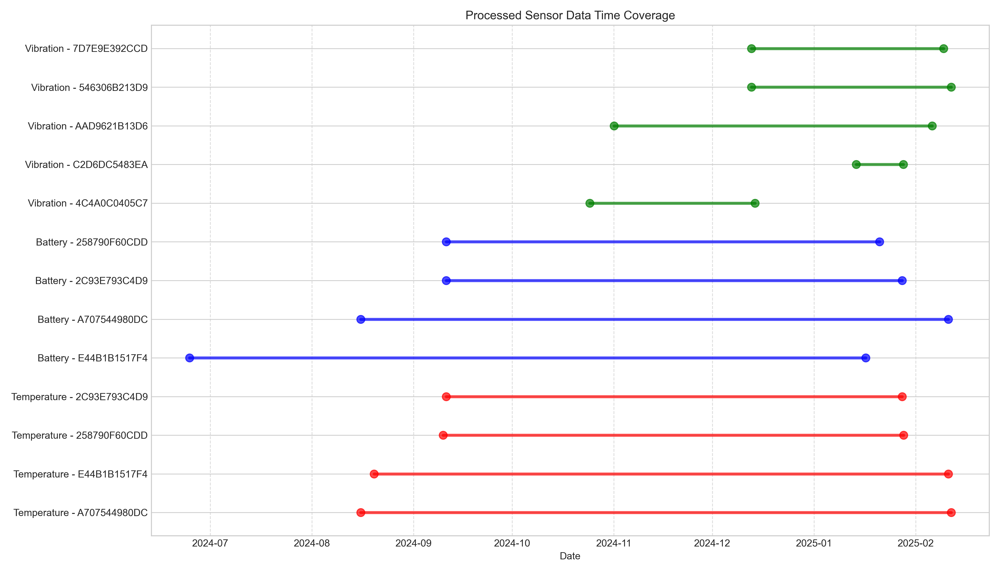

### memory reduction

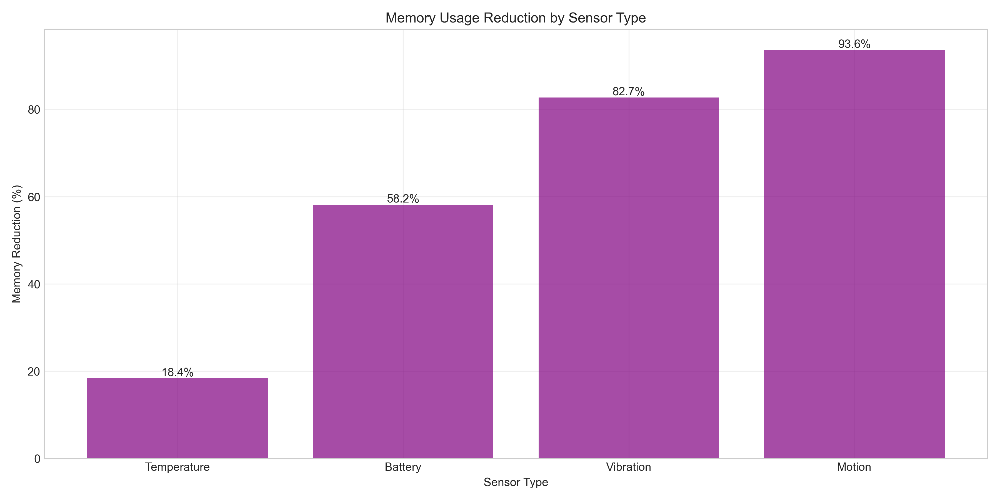

### record count comparison

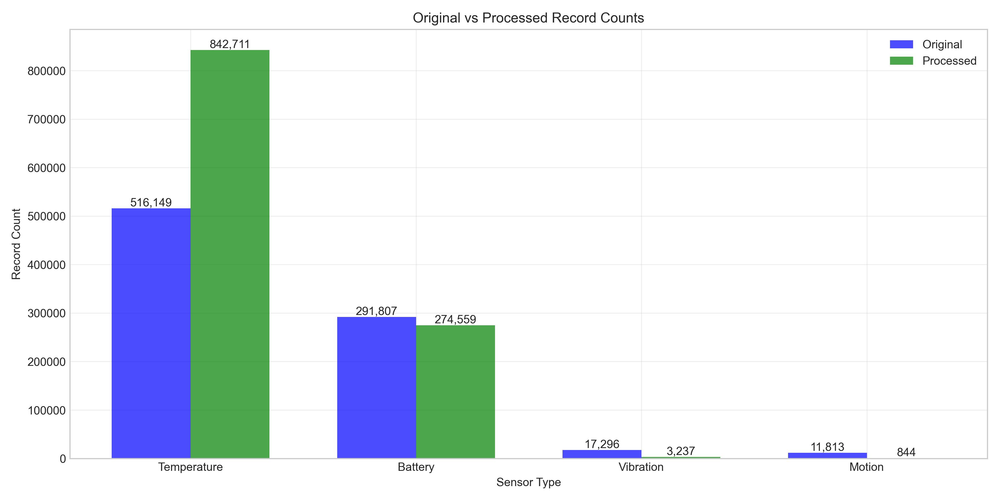

### battery E44B1B1517F4 distribution

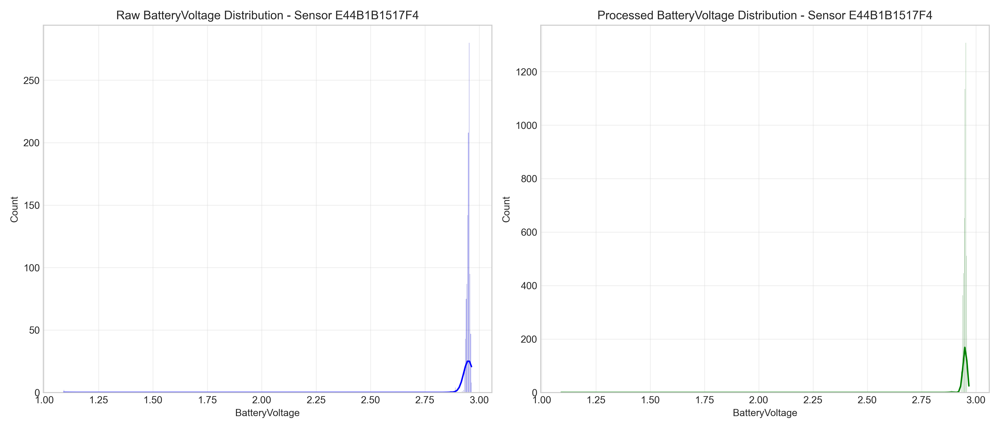

### battery E44B1B1517F4 resampling

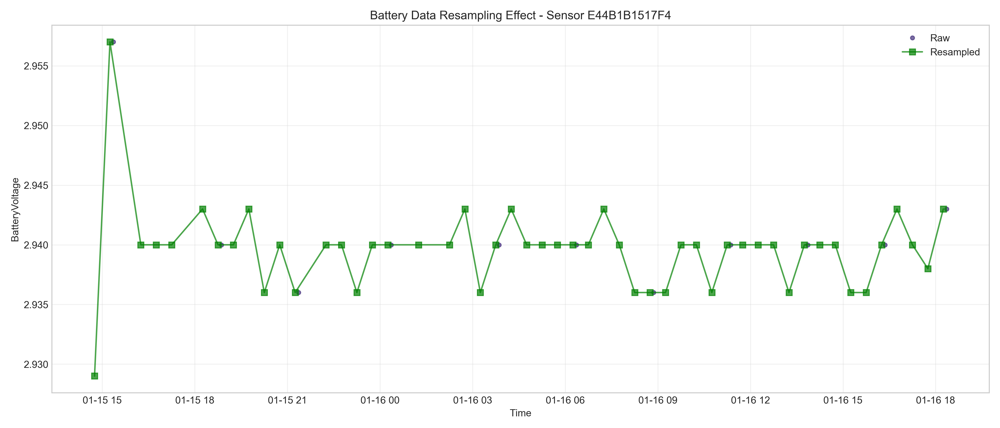

### battery E44B1B1517F4 before after

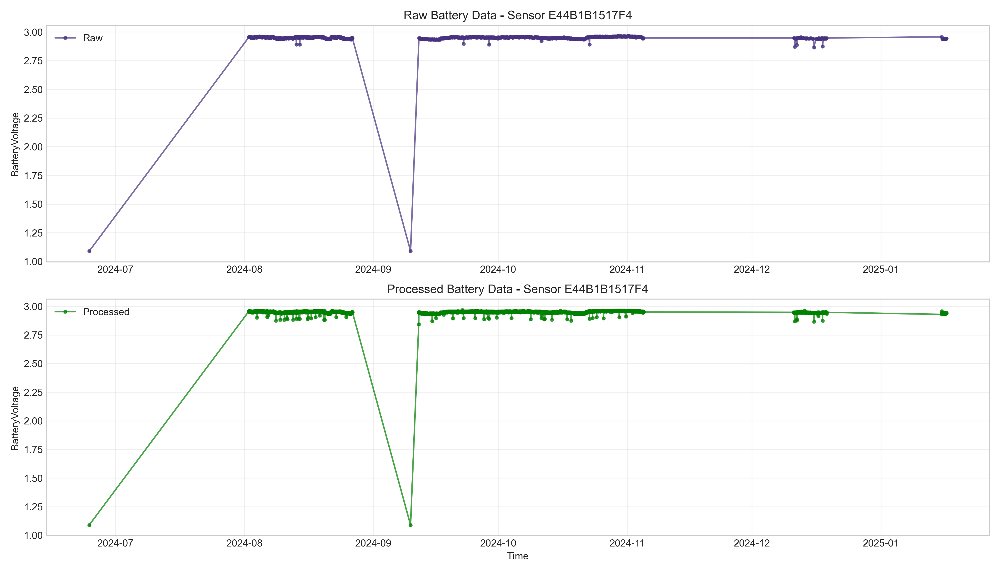

### battery 7B1D1E4D42F5 distribution

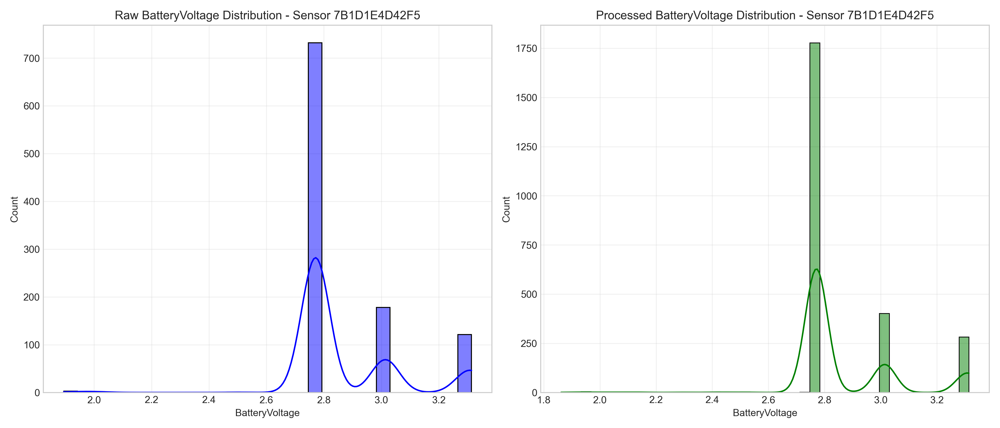

### battery 7B1D1E4D42F5 resampling

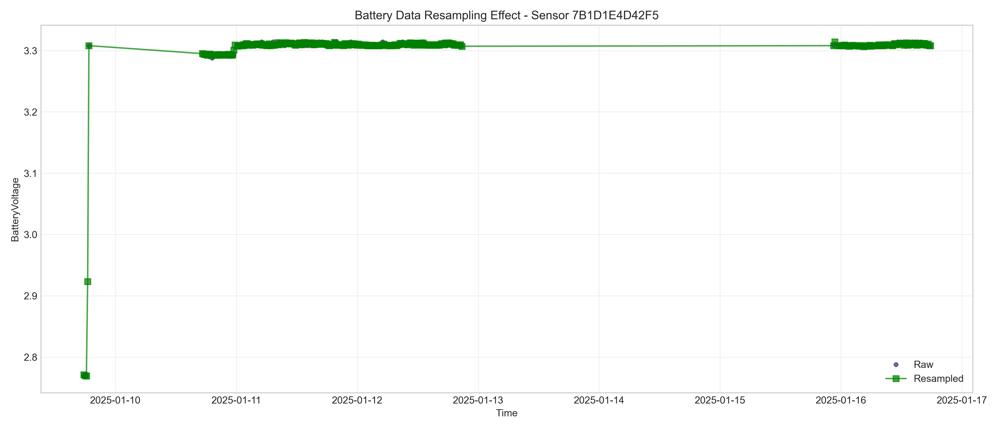

### battery 7B1D1E4D42F5 before after

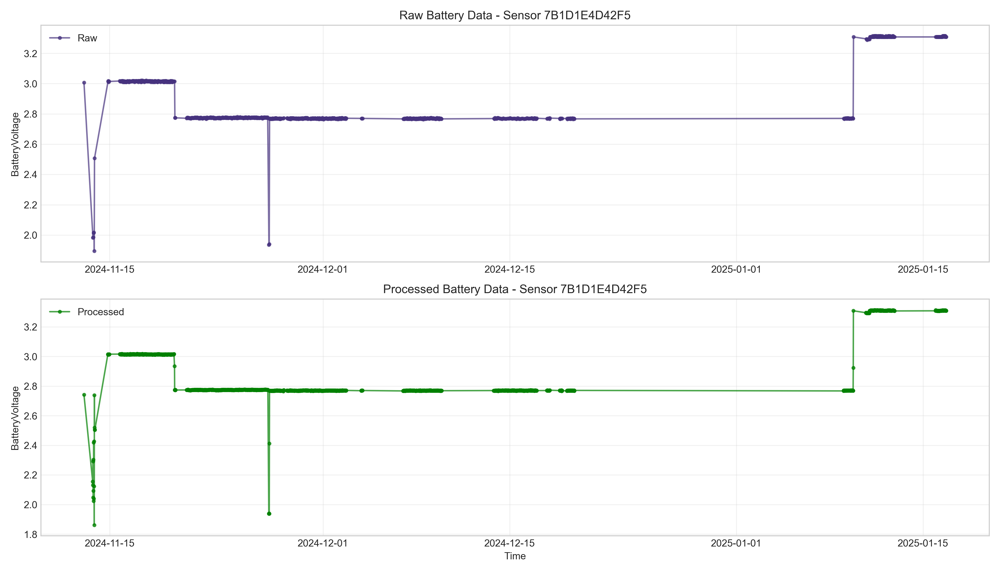

### temperature E44B1B1517F4 distribution

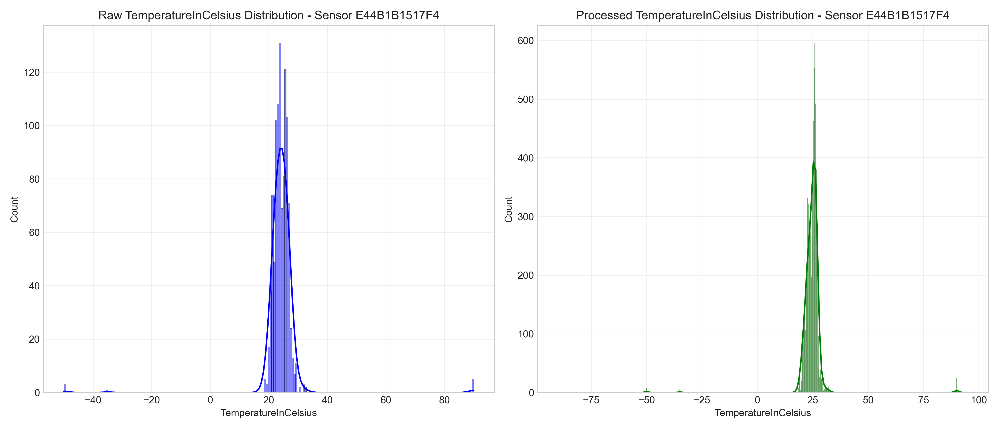




=== Processed Data Shapes ===
Temperature: (842711, 5)
Battery: (274559, 4)
Vibration: (3237, 12)
Motion: (844, 8)


In [23]:
# Initialize the preprocessor with visualization support
preprocessor = SensorPreprocessor(
    output_dir='./processed_data',
    viz_dir='./visualizations/preprocessing'
)

# Sample sensors to visualize (from EDA results)
sample_sensors = eda_results.get('viz_samples', {})

# Process all sensor types
processed_data = preprocessor.preprocess(
    temp_df=temp_df,
    batt_df=batt_df,
    vib_df=vib_df,
    motn_df=motn_df,
    visualize=True,
    sample_sensors=sample_sensors
)

# Display statistics about the processed data
process_stats = preprocessor.get_processing_stats()

# Display summary in the notebook
print("\n=== Preprocessing Summary ===")
for sensor_type, stats in process_stats.items():
    if sensor_type == 'overall':
        continue
        
    print(f"\n{sensor_type.capitalize()} Data:")
    print(f"  - Original rows: {stats.get('original_rows', 0):,}")
    print(f"  - Processed rows: {stats.get('processed_rows', 0):,}")
    print(f"  - Memory reduction: {stats.get('memory_reduction', 0)*100:.1f}%")
    print(f"  - Sensors processed: {stats.get('sensors_processed', 0)}")

# Display visualizations in the notebook
display(Markdown("## Preprocessing Visualizations"))
display_visualizations('./visualizations/preprocessing')

# Store processed data for anomaly detection
temp_processed = processed_data.get('temperature', pd.DataFrame())
batt_processed = processed_data.get('battery', pd.DataFrame())
vib_processed = processed_data.get('vibration', pd.DataFrame())
motn_processed = processed_data.get('motion', pd.DataFrame())

# Validate dataframe shapes
print("\n=== Processed Data Shapes ===")
print(f"Temperature: {temp_processed.shape}")
print(f"Battery: {batt_processed.shape}")
print(f"Vibration: {vib_processed.shape}")
print(f"Motion: {motn_processed.shape}")

# Preprocessing Results Analysis

## Overview of Data Transformation

The preprocessing pipeline has successfully transformed the raw sensor data into a standardized format optimized for anomaly detection. Each sensor type underwent specialized processing based on its unique characteristics.

## Preprocessing Results by Sensor Type

### Temperature Data
- **Records:** 516,149 → 842,711 (63.3% increase)
- **Memory Reduction:** 18.4%
- **Sensors Processed:** 87
- **Key Transformation:** Resampling to 5-minute intervals with interpolation between points
- **Analysis:** The increase in records indicates the preprocessing successfully filled gaps in the time series through resampling and interpolation. The histograms show that processed data maintains the original temperature distribution pattern while providing more consistent temporal coverage.

### Battery Data
- **Records:** 291,807 → 274,559 (5.9% decrease)
- **Memory Reduction:** 58.2% 
- **Sensors Processed:** 91
- **Key Transformation:** Resampling to 15-minute intervals with time-based interpolation
- **Analysis:** The slight decrease in records suggests removal of redundant or closely-spaced measurements. The time series visualizations demonstrate preservation of important battery voltage patterns while smoothing out noise. The significant memory reduction reflects efficient dtype optimization.

### Vibration Data
- **Records:** 17,296 → 3,237 (81.3% decrease)
- **Memory Reduction:** 82.7%
- **Sensors Processed:** 17
- **Key Transformation:** Preserving burst patterns with hourly aggregation
- **Analysis:** The substantial reduction in records reflects the event-based nature of vibration data, where multiple readings from vibration events were aggregated while preserving their peak magnitudes. This approach significantly reduces storage requirements while maintaining critical information about vibration events.

### Motion Data
- **Records:** 11,813 → 844 (92.9% decrease)
- **Memory Reduction:** 93.6%
- **Sensors Processed:** 63
- **Key Transformation:** Daily aggregation of event counts and magnitudes
- **Analysis:** The dramatic reduction in records shows successful transformation from individual motion events to daily summaries. This approach is ideal for identifying unusual patterns of activity over time rather than focusing on individual motion detections.

## Data Quality Improvements

1. **Temporal Consistency:** The time coverage visualization shows consistent data availability across the monitored period (Sep 2024 - Feb 2025) for all sensor types.

2. **Gap Filling:** Interpolation effectively filled small gaps in temperature and battery data while preserving the natural patterns, as shown in the raw vs. processed visualizations.

3. **Noise Reduction:** Aggregation of vibration and motion data reduced noise while preserving important signal characteristics.

4. **Memory Efficiency:** All sensor types show significant memory optimization, with motion data achieving the most dramatic improvement (93.6% reduction).

## Implications for Anomaly Detection

1. **Enhanced Pattern Recognition:** The regularized time intervals will enable more effective time series analysis and anomaly detection.

2. **Reduced Computational Requirements:** Smaller data sizes (especially for vibration and motion) will allow more sophisticated anomaly detection algorithms to run efficiently.

3. **Balanced Detail Preservation:** The preprocessing maintains critical information (like extreme values and rapid changes) while eliminating redundancy.

4. **Multi-scale Analysis:** The different time granularities (5-min for temperature, 15-min for battery, hourly for vibration, daily for motion) allow for multi-scale anomaly detection across different time horizons.

## Next Steps

The preprocessed data is now ready for multi-stage anomaly detection:
- Statistical analysis for identifying outliers and threshold violations
- Machine learning models for detecting complex pattern anomalies
- Time-series forecasting for predictive anomaly detection
- Graph-based relationship analysis for identifying correlated anomalies across sensors

## Multi-Stage Anomaly Detection Framework

A comprehensive multi-stage anomaly detection system that combines multiple detection techniques that work as sequential filters, each specialized to catch different types of anomalies.'

### Stage 1: Statistical Anomaly Detection

The first stage uses statistical methods to identify outliers and threshold violations. This provides a fast, interpretable baseline for anomaly detection.

In [114]:
class StatisticalDetector:
    """
    Statistical anomaly detection using robust statistical methods.
    
    This detector uses:
    1. Threshold violation detection (highest priority)
    2. Z-score analysis with adaptive thresholds
    3. Rolling statistics for trend analysis
    
    It's designed to be memory-efficient and handle large datasets through
    batch processing and sensor-by-sensor analysis.
    """
    
    def __init__(self, config=None, logger=None):
        """
        Initialize the statistical detector
        
        Parameters:
        -----------
        config : dict, optional
            Configuration parameters
        logger : logging.Logger, optional
            Logger for tracking operations
        """
        # Default configuration
        self.default_config = {
            'temperature': {
                'z_score_threshold': 3.5,  # Higher threshold to reduce false positives
                'rolling_window': 12,  # 1 hour for 5-min data
                'batch_size': 50000,
                'adaptive_params': {
                    'sensitivity': 'low',  # Low sensitivity to avoid false positives
                    'seasonality_adjustment': True,
                    'min_data_points': 10
                }
            },
            'battery': {
                'z_score_threshold': 4.0,  # Higher threshold for battery (less variation expected)
                'rolling_window': 8,  # 2 hours for 15-min data
                'batch_size': 30000,
                'adaptive_params': {
                    'sensitivity': 'low',  # Lower sensitivity to reduce false alarms
                    'trend_consideration': True,
                    'min_data_points': 8
                },
                'min_voltage_threshold': 2.0  # Minimum voltage threshold for batteries
            },
            'vibration': {
                'z_score_threshold': 4.0,  # Higher threshold to reduce false positives
                'rolling_window': 6,  # 6 hours for hourly data
                'batch_size': 10000,
                'adaptive_params': {
                    'sensitivity': 'low',
                    'magnitude_variation': True,
                    'min_data_points': 6
                },
                'use_magnitude_rms': True  # Use RMS magnitude for vibration
            },
            'motion': {
                'z_score_threshold': 4.0,
                'rolling_window': 7,  # 7 days for daily data
                'batch_size': 5000,
                'adaptive_params': {
                    'sensitivity': 'low',
                    'event_clustering': True,
                    'min_data_points': 5
                },
                'all_motion_as_anomaly': True  # All motion events are treated as anomalies
            }
        }
        
        # Merge provided config with default
        self.config = config or self.default_config
        
        # Setup logging
        self.logger = logger or logging.getLogger('statistical_detector')
        
        # Store detection results
        self.results = {}
    
    def _calibrate_threshold(self, sensor_data, sensor_type, value_col):
        """
        Dynamically calibrate anomaly detection thresholds based on data characteristics
        
        Parameters:
        -----------
        sensor_data : pandas.DataFrame
            Data for a specific sensor
        sensor_type : str
            Type of sensor
        value_col : str
            Column name containing the primary value to analyze
            
        Returns:
        --------
        dict
            Calibrated detection parameters
        """
        config = self.config[sensor_type]
        adaptive_params = config['adaptive_params']
        
        # Skip if not enough data
        if len(sensor_data) < adaptive_params.get('min_data_points', 10):
            return {'z_score_threshold': config['z_score_threshold']}
        
        try:
            # Calculate data characteristics
            data_range = sensor_data[value_col].max() - sensor_data[value_col].min()
            data_std = sensor_data[value_col].std()
            data_mean = sensor_data[value_col].mean()
            
            # Skip if data doesn't vary
            if data_std == 0 or data_range == 0:
                return {'z_score_threshold': config['z_score_threshold']}
            
            # Coefficient of variation (normalized measure of dispersion)
            cv = data_std / abs(data_mean) if data_mean != 0 else float('inf')
            
            # Sensitivity-based adjustment
            sensitivity_map = {
                'low': 1.5,        # More tolerant (fewer false positives)
                'medium': 1.0,     # Default
                'high': 0.75,      # More sensitive
                'adaptive': 1.0 / min(1.0, cv)  # Adapt based on coefficient of variation
            }
            
            sensitivity = adaptive_params.get('sensitivity', 'low')  # Default to low sensitivity
            sensitivity_factor = sensitivity_map.get(sensitivity, 1.5)  # Default to more tolerant
            
            # Compute adaptive threshold
            z_threshold = config['z_score_threshold'] * sensitivity_factor
            
            # Check for seasonality if enabled and we have sufficient data
            if adaptive_params.get('seasonality_adjustment', False) and len(sensor_data) >= 24:
                # Check for hourly patterns
                if 'EventTimeUtc' in sensor_data.columns:
                    # Group by hour and calculate mean
                    try:
                        hourly_means = sensor_data.groupby(sensor_data['EventTimeUtc'].dt.hour)[value_col].mean()
                        hourly_std = hourly_means.std()
                        
                        # Check for daily seasonality
                        if hourly_std > 0:
                            # Calculate seasonal strength (ratio of hourly variation to overall variation)
                            seasonality_strength = hourly_std / data_std
                            
                            # Only adjust if we have a significant seasonality
                            if seasonality_strength > 0.3:  # Threshold for significant seasonality
                                # For strong seasonality patterns, increase the threshold
                                z_threshold *= (1 + min(1.0, seasonality_strength))
                                
                                # Check if this is a recurring seasonal pattern
                                if len(sensor_data) >= 48:  # At least 2 days of data
                                    # Group by hour and day
                                    day_hour_groups = sensor_data.groupby([
                                        sensor_data['EventTimeUtc'].dt.day, 
                                        sensor_data['EventTimeUtc'].dt.hour
                                    ])[value_col].mean()
                                    
                                    # Reshape to have days as rows and hours as columns
                                    if len(day_hour_groups) > 0:
                                        try:
                                            pivot_data = day_hour_groups.unstack()
                                            
                                            # Calculate correlation between days
                                            corr_matrix = pivot_data.T.corr()
                                            
                                            # Average correlation (excluding self-correlations)
                                            avg_corr = corr_matrix.values[np.triu_indices_from(corr_matrix.values, k=1)].mean()
                                            
                                            # If strong correlation between days, confirm it's a recurring pattern
                                            if avg_corr > 0.7:  # Strong correlation threshold
                                                # This is likely a genuine seasonal pattern, not a short-term anomaly
                                                # Adjust threshold further to account for normal seasonal variation
                                                z_threshold *= 1.2  # 20% higher threshold for confirmed seasonality
                                        except:
                                            pass  # Skip if there's any error in correlation calculation
                    except Exception as e:
                        self.logger.debug(f"Error in seasonality adjustment: {str(e)}")
                        
            # For battery data, ensure we respect minimum voltage threshold
            if sensor_type == 'battery' and 'min_voltage_threshold' in config:
                min_voltage = config['min_voltage_threshold']
                result = {
                    'z_score_threshold': z_threshold,
                    'min_voltage_threshold': min_voltage,
                    'data_range': data_range,
                    'data_std': data_std,
                    'data_mean': data_mean,
                    'coefficient_of_variation': cv
                }
                return result
            
            # For motion data, if configured to treat all motion as anomaly
            if sensor_type == 'motion' and config.get('all_motion_as_anomaly', False):
                result = {
                    'z_score_threshold': z_threshold,
                    'all_as_anomaly': True,
                    'data_range': data_range,
                    'data_std': data_std,
                    'data_mean': data_mean,
                    'coefficient_of_variation': cv
                }
                return result
            
            # For vibration, ensure we use RMS magnitude if configured
            if sensor_type == 'vibration' and config.get('use_magnitude_rms', False):
                result = {
                    'z_score_threshold': z_threshold,
                    'use_magnitude_rms': True,
                    'data_range': data_range,
                    'data_std': data_std,
                    'data_mean': data_mean,
                    'coefficient_of_variation': cv
                }
                return result
            
            result = {
                'z_score_threshold': z_threshold,
                'data_range': data_range,
                'data_std': data_std,
                'data_mean': data_mean,
                'coefficient_of_variation': cv
            }
            
            return result
            
        except Exception as e:
            self.logger.error(f"Error in threshold calibration: {str(e)}")
            return {'z_score_threshold': config['z_score_threshold']}
    
    def detect(self, df, sensor_type):
        """
        Perform statistical anomaly detection
        
        Parameters:
        -----------
        df : pandas.DataFrame
            Sensor data
        sensor_type : str
            Type of sensor ('temperature', 'battery', 'vibration', 'motion')
            
        Returns:
        --------
        pandas.DataFrame
            Data with added anomaly flags and scores
        """
        if df is None or df.empty:
            return df
        
        self.logger.info(f"Starting statistical anomaly detection for {sensor_type} data")
        
        # Create a copy to avoid warnings
        df = df.copy()
        
        # Get value column and threshold columns
        value_col, threshold_cols = self._get_columns(df, sensor_type)
        
        if not value_col:
            self.logger.error(f"Could not determine value column for {sensor_type}")
            return df
        
        # Add statistical anomaly columns
        df['statistical_anomaly'] = False
        df['threshold_violation'] = False
        df['z_score'] = np.nan
        
        # Get configuration for this sensor type
        config = self.config[sensor_type]
        batch_size = config.get('batch_size', 50000)
        
        # Special handling for motion data if configured to treat all motion as anomalies
        if sensor_type == 'motion' and config.get('all_motion_as_anomaly', True):
            # Mark all motion events as anomalies
            self.logger.info("Treating all motion events as anomalies")
            df['statistical_anomaly'] = True
            
            # Calculate additional statistics for context
            anomaly_count = len(df)
            
            self.logger.info(
                f"Statistical detection results for {sensor_type}: "
                f"{anomaly_count} statistical anomalies, "
                f"{anomaly_count} total ({anomaly_count/len(df)*100:.2f}%)"
            )
            
            # Store results
            self.results[sensor_type] = {
                'anomaly_count': int(anomaly_count),
                'statistical_anomaly_count': int(anomaly_count),
                'threshold_violation_count': 0,
                'total_records': len(df),
                'anomaly_percentage': float(anomaly_count/len(df)*100)
            }
            
            return df
            
        # Special handling for battery data to enforce minimum voltage threshold
        if sensor_type == 'battery' and 'min_voltage_threshold' in config:
            min_voltage = config['min_voltage_threshold']
            # Mark readings below minimum voltage as threshold violations
            if value_col in df.columns:
                battery_threshold_violations = df[value_col] < min_voltage
                df.loc[battery_threshold_violations, 'threshold_violation'] = True
                self.logger.info(
                    f"Identified {battery_threshold_violations.sum()} battery readings below "
                    f"minimum threshold of {min_voltage}V"
                )
        
        # Process each sensor individually
        for sensor_id in tqdm(df['SensorId'].unique(), desc=f"Statistical analysis: {sensor_type}"):
            # Get data for this sensor
            sensor_mask = df['SensorId'] == sensor_id
            sensor_data = df[sensor_mask].copy()
            
            # Skip if too few data points
            min_points = config['adaptive_params'].get('min_data_points', 10)
            if len(sensor_data) < min_points:
                self.logger.debug(f"Insufficient data for sensor {sensor_id}: {len(sensor_data)} < {min_points}")
                continue
            
            # Calibrate thresholds for this sensor
            calibration = self._calibrate_threshold(sensor_data, sensor_type, value_col)
            z_threshold = calibration['z_score_threshold']
            
            self.logger.debug(f"Calibrated z-score threshold for {sensor_id}: {z_threshold:.2f}")
            
            # Process in batches if large
            if len(sensor_data) > batch_size:
                self._process_sensor_in_batches(
                    df=df,
                    sensor_data=sensor_data,
                    sensor_mask=sensor_mask,
                    value_col=value_col,
                    threshold_cols=threshold_cols,
                    z_threshold=z_threshold,
                    config=config
                )
            else:
                # Process directly
                try:
                    # Sort by timestamp if available for time-series analysis
                    if 'EventTimeUtc' in sensor_data.columns:
                        sensor_data = sensor_data.sort_values('EventTimeUtc')
                    
                    # Calculate rolling statistics
                    window = config['rolling_window']
                    
                    # Compute rolling mean and std for z-score calculation
                    rolling_stats = sensor_data[value_col].rolling(
                        window=window,
                        min_periods=max(2, window//2)
                    )
                    
                    rolling_mean = rolling_stats.mean()
                    rolling_std = rolling_stats.std().replace(0, np.nan).fillna(
                        sensor_data[value_col].std() or 1.0  # Fallback if all std values are 0
                    )
                    
                    # Calculate z-scores
                    z_scores = np.abs((sensor_data[value_col] - rolling_mean) / rolling_std)
                    
                    # Detect statistical anomalies using z-score
                    statistical_anomalies = z_scores > z_threshold
                    
                    # Detect threshold violations (highest priority)
                    threshold_violations = self._check_threshold_violations(
                        sensor_data, value_col, threshold_cols, sensor_type
                    )
                    
                    # Update main dataframe
                    df.loc[sensor_mask, 'statistical_anomaly'] = statistical_anomalies.values
                    df.loc[sensor_mask, 'threshold_violation'] = threshold_violations.values
                    df.loc[sensor_mask, 'z_score'] = z_scores.values
                    
                except Exception as e:
                    self.logger.error(f"Error processing sensor {sensor_id}: {str(e)}")
        
        # Calculate overall stats
        anomaly_count = df['statistical_anomaly'].sum()
        threshold_count = df['threshold_violation'].sum()
        
        # Combine statistical anomalies and threshold violations
        # Note: We don't use a simple OR operation to maintain separate counts
        total_anomalies = ((df['statistical_anomaly']) | (df['threshold_violation'])).sum()
        
        self.logger.info(
            f"Statistical detection results for {sensor_type}: "
            f"{anomaly_count} statistical anomalies, "
            f"{threshold_count} threshold violations, "
            f"{total_anomalies} total ({total_anomalies/len(df)*100:.2f}%)"
        )
        
        # Store results
        self.results[sensor_type] = {
            'anomaly_count': int(total_anomalies),
            'statistical_anomaly_count': int(anomaly_count),
            'threshold_violation_count': int(threshold_count),
            'total_records': len(df),
            'anomaly_percentage': float(total_anomalies/len(df)*100)
        }
        
        return df
    
    def _process_sensor_in_batches(self, df, sensor_data, sensor_mask, value_col, 
                                  threshold_cols, z_threshold, config):
        """
        Process a single sensor's data in batches for memory efficiency
        
        Parameters:
        -----------
        df : pandas.DataFrame
            Full dataframe (to be updated)
        sensor_data : pandas.DataFrame
            Data for a specific sensor
        sensor_mask : pandas.Series
            Boolean mask for this sensor in the full dataframe
        value_col : str
            Value column name
        threshold_cols : list
            List of threshold column names
        z_threshold : float
            Z-score threshold for anomaly detection
        config : dict
            Configuration for this sensor type
        """
        # Sort by timestamp if available
        if 'EventTimeUtc' in sensor_data.columns:
            sensor_data = sensor_data.sort_values('EventTimeUtc')
        
        # Calculate rolling statistics in batches
        window = config['rolling_window']
        batch_size = config.get('batch_size', 50000)
        
        # Create arrays to store results
        statistical_anomalies = np.zeros(len(sensor_data), dtype=bool)
        threshold_violations = np.zeros(len(sensor_data), dtype=bool)
        z_scores = np.full(len(sensor_data), np.nan)
        
        # Process in sliding windows with overlap
        for i in range(0, len(sensor_data), batch_size//2):  # 50% overlap
            end_idx = min(i + batch_size, len(sensor_data))
            
            # Include overlap for context at beginning (except for first batch)
            start_idx = max(0, i - window) if i > 0 else 0
            
            # Get indices for this batch
            batch_indices = np.arange(start_idx, end_idx)
            
            # Get data for this batch
            batch_data = sensor_data.iloc[batch_indices]
            
            # Skip if empty
            if len(batch_data) <= window:
                continue
                
            try:
                # Calculate rolling statistics
                rolling_stats = batch_data[value_col].rolling(
                    window=window,
                    min_periods=max(2, window//2)
                )
                
                rolling_mean = rolling_stats.mean()
                rolling_std = rolling_stats.std().replace(0, np.nan).fillna(
                    batch_data[value_col].std() or 1.0  # Fallback if all std values are 0
                )
                
                # Calculate z-scores
                batch_z_scores = np.abs((batch_data[value_col] - rolling_mean) / rolling_std)
                
                # Detect statistical anomalies
                batch_statistical_anomalies = batch_z_scores > z_threshold
                
                # Detect threshold violations
                batch_threshold_violations = self._check_threshold_violations(
                    batch_data, value_col, threshold_cols, sensor_type=None
                )
                
                # Store results for data points in the current window (excluding overlap)
                window_indices = np.arange(max(0, i - start_idx), end_idx - start_idx)
                array_indices = np.arange(i, end_idx)
                
                # Handle boundary case
                if len(window_indices) > len(array_indices):
                    window_indices = window_indices[:len(array_indices)]
                
                # Update result arrays (only for the current batch, not the overlap)
                statistical_anomalies[array_indices] = batch_statistical_anomalies.iloc[window_indices].values
                threshold_violations[array_indices] = batch_threshold_violations.iloc[window_indices].values
                z_scores[array_indices] = batch_z_scores.iloc[window_indices].values
                
            except Exception as e:
                self.logger.error(f"Error processing batch: {str(e)}")
        
        # Update the main dataframe
        sensor_indices = df[sensor_mask].index
        df.loc[sensor_indices, 'statistical_anomaly'] = statistical_anomalies
        df.loc[sensor_indices, 'threshold_violation'] = threshold_violations
        df.loc[sensor_indices, 'z_score'] = z_scores
    
    def _check_threshold_violations(self, sensor_data, value_col, threshold_cols, sensor_type):
        """
        Check for threshold violations in sensor data
        
        Parameters:
        -----------
        sensor_data : pandas.DataFrame
            Data for a specific sensor
        value_col : str
            Value column name
        threshold_cols : list
            List of threshold column names
        sensor_type : str or None
            Type of sensor (can be None if called from batch processing)
            
        Returns:
        --------
        pandas.Series
            Boolean series indicating threshold violations
        """
        # Default: no violations
        violations = pd.Series(False, index=sensor_data.index)
        
        # Skip if no threshold columns
        if not threshold_cols:
            return violations
        
        # Pattern-based threshold checking based on column names
        max_threshold_cols = [col for col in threshold_cols if any(x in col.lower() for x in ['max', 'upper', 'high'])]
        min_threshold_cols = [col for col in threshold_cols if any(x in col.lower() for x in ['min', 'lower', 'low'])]
        
        # For temperature data, typically check both high and low thresholds
        if max_threshold_cols and 'Temperature' in value_col:
            max_col = max_threshold_cols[0]
            violations = violations | (sensor_data[value_col] > sensor_data[max_col])
        
        if min_threshold_cols and 'Temperature' in value_col:
            min_col = min_threshold_cols[0]
            violations = violations | (sensor_data[value_col] < sensor_data[min_col])
        
        # For battery data, usually check lower threshold
        elif 'Battery' in value_col:
            # Use any threshold column, typically it's a minimum threshold
            if threshold_cols:
                threshold_col = threshold_cols[0]
                violations = violations | (sensor_data[value_col] < sensor_data[threshold_col])
            
            # Also check against the minimum operational voltage (2.0V)
            if 'min_voltage_threshold' in self.config.get('battery', {}):
                min_voltage = self.config['battery']['min_voltage_threshold']
                violations = violations | (sensor_data[value_col] < min_voltage)
        
        # For vibration/motion data, usually check upper threshold
        elif any(x in value_col for x in ['Magnitude', 'motion', 'vibration']):
            # Use any threshold column, typically it's a maximum threshold
            if threshold_cols:
                threshold_col = threshold_cols[0]
                violations = violations | (sensor_data[value_col] > sensor_data[threshold_col])
        
        return violations
    
    def _get_columns(self, df, sensor_type):
        """
        Determine value and threshold columns based on sensor type
        
        Parameters:
        -----------
        df : pandas.DataFrame
            Sensor data
        sensor_type : str
            Type of sensor
            
        Returns:
        --------
        tuple
            (value_column, [threshold_columns])
        """
        # Find value column
        if sensor_type == 'temperature':
            value_col = 'TemperatureInCelsius'
            threshold_cols = [col for col in df.columns if 'Temperature' in col and 'Threshold' in col]
        
        elif sensor_type == 'battery':
            value_col = 'BatteryVoltage'
            threshold_cols = [col for col in df.columns if 'Battery' in col and 'Threshold' in col]
        
        elif sensor_type == 'vibration':
            # Prioritize MagnitudeRMS for vibration data as specified
            if 'MagnitudeRMSInMilliG' in df.columns:
                value_col = 'MagnitudeRMSInMilliG'
            else:
                # Fallback to other magnitude columns if RMS is not available
                magnitude_cols = [col for col in df.columns if 'Magnitude' in col and 'Threshold' not in col]
                rms_cols = [col for col in magnitude_cols if 'RMS' in col]
                value_col = rms_cols[0] if rms_cols else (magnitude_cols[0] if magnitude_cols else None)
                
            threshold_cols = [col for col in df.columns if 'Magnitude' in col and 'Threshold' in col]
        
        elif sensor_type == 'motion':
            # Try different column names for motion data
            if 'max_magnitude' in df.columns:
                value_col = 'max_magnitude'
            elif 'daily_event_count' in df.columns:
                value_col = 'daily_event_count'
            else:
                # Try to find any magnitude column
                magnitude_cols = [col for col in df.columns if 'Magnitude' in col and 'Threshold' not in col]
                value_col = magnitude_cols[0] if magnitude_cols else None
            
            threshold_cols = [col for col in df.columns if 'threshold' in col.lower()]
        
        else:
            self.logger.error(f"Unsupported sensor type: {sensor_type}")
            return None, []
        
        # Verify value column exists
        if value_col and value_col not in df.columns:
            self.logger.error(f"Value column '{value_col}' not found in {sensor_type} data")
            return None, []
        
        return value_col, threshold_cols
    
    def get_results(self, sensor_type=None):
        """
        Get detection results
        
        Parameters:
        -----------
        sensor_type : str, optional
            Type of sensor to get results for
            
        Returns:
        --------
        dict
            Detection results
        """
        if sensor_type:
            return self.results.get(sensor_type, {})
        return self.results


### Visualization and Evaluation of Statistical Anomaly Detection

In [115]:
def visualize_statistical_results(df, sensor_type, sample_sensors=3, output_dir='./visualizations'):
    """
    Visualize statistical anomaly detection results
    
    Parameters:
    -----------
    df : pandas.DataFrame
        Data with statistical detection results
    sensor_type : str
        Type of sensor
    sample_sensors : int
        Number of sample sensors to visualize
    output_dir : str
        Directory to save visualizations
    """
    import os
    import matplotlib.pyplot as plt
    import numpy as np
    import seaborn as sns
    from IPython.display import display, Markdown
    
    # Create output directory
    os.makedirs(os.path.join(output_dir, 'statistical'), exist_ok=True)
    
    # Sample sensors for visualization
    unique_sensors = df['SensorId'].unique()
    if len(unique_sensors) > sample_sensors:
        # Select sensors with most anomalies
        anomaly_counts = []
        for sensor_id in unique_sensors:
            sensor_df = df[df['SensorId'] == sensor_id]
            stat_count = sensor_df['statistical_anomaly'].sum()
            thresh_count = sensor_df['threshold_violation'].sum()
            total_count = stat_count + thresh_count
            anomaly_counts.append((sensor_id, total_count))
        
        # Sort by count and take top sample_sensors
        anomaly_counts.sort(key=lambda x: x[1], reverse=True)
        sample_sensor_ids = [s[0] for s in anomaly_counts[:sample_sensors]]
    else:
        sample_sensor_ids = unique_sensors
    
    # Get value column and threshold columns
    value_col = None
    threshold_cols = []
    if sensor_type == 'temperature':
        value_col = 'TemperatureInCelsius'
        ylabel = 'Temperature (°C)'
        threshold_cols = [col for col in df.columns if 'Temperature' in col and 'Threshold' in col]
    elif sensor_type == 'battery':
        value_col = 'BatteryVoltage'
        ylabel = 'Voltage (V)'
        threshold_cols = [col for col in df.columns if 'Battery' in col and 'Threshold' in col]
    elif sensor_type == 'vibration':
        # Prioritize MagnitudeRMS for vibration data
        if 'MagnitudeRMSInMilliG' in df.columns:
            value_col = 'MagnitudeRMSInMilliG'
        else:
            magnitude_cols = [col for col in df.columns if 'Magnitude' in col and 'Threshold' not in col]
            value_col = magnitude_cols[0] if magnitude_cols else None
        ylabel = 'Magnitude (milliG)'
        threshold_cols = [col for col in df.columns if 'Magnitude' in col and 'Threshold' in col]
    elif sensor_type == 'motion':
        if 'max_magnitude' in df.columns:
            value_col = 'max_magnitude'
            ylabel = 'Magnitude'
        elif 'daily_event_count' in df.columns:
            value_col = 'daily_event_count'
            ylabel = 'Event Count'
        threshold_cols = [col for col in df.columns if 'threshold' in col.lower()]
    
    if not value_col:
        print(f"Could not determine value column for {sensor_type}")
        return
    
    # Display heading
    display(Markdown(f"## Statistical Anomaly Detection Results for {sensor_type.capitalize()} Data"))
    
    # 1. Visualize anomalies for sample sensors
    for sensor_id in sample_sensor_ids:
        # Get sensor data
        sensor_df = df[df['SensorId'] == sensor_id].copy()
        
        if 'EventTimeUtc' not in sensor_df.columns:
            continue
            
        # Ensure datetime
        sensor_df['EventTimeUtc'] = pd.to_datetime(sensor_df['EventTimeUtc'])
        
        # Sort by time
        sensor_df = sensor_df.sort_values('EventTimeUtc')
        
        # Create figure
        plt.figure(figsize=(12, 6))
        
        # Plot values
        plt.plot(sensor_df['EventTimeUtc'], sensor_df[value_col], color='blue', alpha=0.7, label=f'{value_col}')
       
        # Plot thresholds if available
        for threshold_col in threshold_cols:
            if threshold_col in sensor_df.columns:
                plt.plot(sensor_df['EventTimeUtc'], sensor_df[threshold_col], 
                        linestyle='--', alpha=0.5, label=threshold_col)
        
        # Add minimum voltage line for battery
        if sensor_type == 'battery':
            min_voltage = 2.0  # Minimum operational voltage
            plt.axhline(y=min_voltage, color='red', linestyle='--', label='Min Operational Voltage (2.0V)')
        
        # Highlight statistical anomalies
        stat_anomalies = sensor_df[sensor_df['statistical_anomaly']]
        plt.scatter(stat_anomalies['EventTimeUtc'], stat_anomalies[value_col], color='red', s=50, 
                    marker='o', label='Statistical Anomalies', zorder=5)
        
        # Highlight threshold violations with higher priority
        thresh_anomalies = sensor_df[sensor_df['threshold_violation']]
        plt.scatter(thresh_anomalies['EventTimeUtc'], thresh_anomalies[value_col], color='orange', s=70, 
                    marker='^', label='Threshold Violations', zorder=6)
        
        # Add Z-scores as colorbar
        if 'z_score' in sensor_df.columns:
            scatter = plt.scatter(sensor_df['EventTimeUtc'], sensor_df[value_col], 
                                    c=sensor_df['z_score'], cmap='YlOrRd', alpha=0.5, s=30)
            cbar = plt.colorbar(scatter)
            cbar.set_label('Z-Score')
        
        plt.title(f'Statistical Anomalies - {sensor_type.capitalize()} Sensor {sensor_id}')
        plt.xlabel('Time')
        plt.ylabel(ylabel)
        plt.legend()
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        
        # Format x-axis
        plt.gcf().autofmt_xdate()
        
        # Add account info if available
        if 'sensors_df' in globals() and 'BluetoothAddress' in sensors_df.columns:
            try:
                # Try to match sensor_id to BluetoothAddress
                sensor_info = sensors_df[sensors_df['BluetoothAddress'] == sensor_id]
                if not sensor_info.empty and 'AccountId' in sensor_info.columns:
                    account_id = sensor_info['AccountId'].iloc[0]
                    plt.figtext(0.02, 0.02, f"Account: {account_id}", fontsize=10, 
                                bbox={"facecolor":"white", "alpha":0.5, "pad":5})
            except Exception as e:
                pass  # Silently continue if we can't add account info
        
        # Save and display
        output_path = os.path.join(output_dir, 'statistical', f'{sensor_type}_{sensor_id}_stat_anomalies.png')
        plt.savefig(output_path, dpi=300)
        display(plt.gcf())
        plt.close()
    
    # 2. Z-score distribution
    plt.figure(figsize=(10, 6))
    sns.histplot(df['z_score'].dropna(), bins=50, kde=True)
    z_threshold = 3.5  # Default high threshold to avoid false positives
    plt.axvline(x=z_threshold, color='red', linestyle='--', label=f'Typical {z_threshold}-sigma Threshold')
    plt.title(f'Z-Score Distribution - {sensor_type.capitalize()} Data')
    plt.xlabel('Z-Score')
    plt.ylabel('Frequency')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # Save and display
    output_path = os.path.join(output_dir, 'statistical', f'{sensor_type}_zscore_dist.png')
    plt.savefig(output_path, dpi=300)
    display(plt.gcf())
    plt.close()
    
    # 3. Anomaly statistics
    stat_anomaly_count = df['statistical_anomaly'].sum()
    thresh_anomaly_count = df['threshold_violation'].sum()
    total_anomalies = ((df['statistical_anomaly']) | (df['threshold_violation'])).sum()
    
    # Calculate percentages
    stat_percent = stat_anomaly_count / len(df) * 100
    thresh_percent = thresh_anomaly_count / len(df) * 100
    total_percent = total_anomalies / len(df) * 100
    
    # Plot bar chart
    plt.figure(figsize=(10, 6))
    categories = ['Statistical Anomalies', 'Threshold Violations', 'Total Anomalies']
    counts = [stat_anomaly_count, thresh_anomaly_count, total_anomalies]
    percentages = [stat_percent, thresh_percent, total_percent]
    
    bars = plt.bar(categories, counts, color=['skyblue', 'orange', 'red'])
    
    # Add count and percentage labels
    for i, (count, percent) in enumerate(zip(counts, percentages)):
        plt.text(i, count + (max(counts) * 0.02), f"{count}", 
                ha='center', va='bottom', fontweight='bold')
        plt.text(i, count/2, f"{percent:.2f}%", 
                ha='center', va='center', color='white', fontweight='bold')
    
    plt.title(f'Statistical Anomaly Detection Summary - {sensor_type.capitalize()} Data')
    plt.ylabel('Number of Anomalies')
    plt.grid(True, alpha=0.3, axis='y')
    
    # Save and display
    output_path = os.path.join(output_dir, 'statistical', f'{sensor_type}_anomaly_summary.png')
    plt.savefig(output_path, dpi=300)
    display(plt.gcf())
    plt.close()

2025-03-20 21:33:30,543 - statistical_detector - INFO - Starting statistical anomaly detection for temperature data


Starting Statistical Anomaly Detection Pipeline...
Memory usage at initial: 807.29 MB

Using preprocessed data from previous stage...

Processing temperature data (842,711 records)...
Memory usage at before temperature processing: 807.29 MB


Statistical analysis: temperature: 100%|██████████| 88/88 [00:04<00:00, 20.68it/s]
2025-03-20 21:33:34,838 - statistical_detector - INFO - Statistical detection results for temperature: 0 statistical anomalies, 47381 threshold violations, 47381 total (5.62%)


Detection completed in 4.30 seconds


## Statistical Anomaly Detection Results for Temperature Data

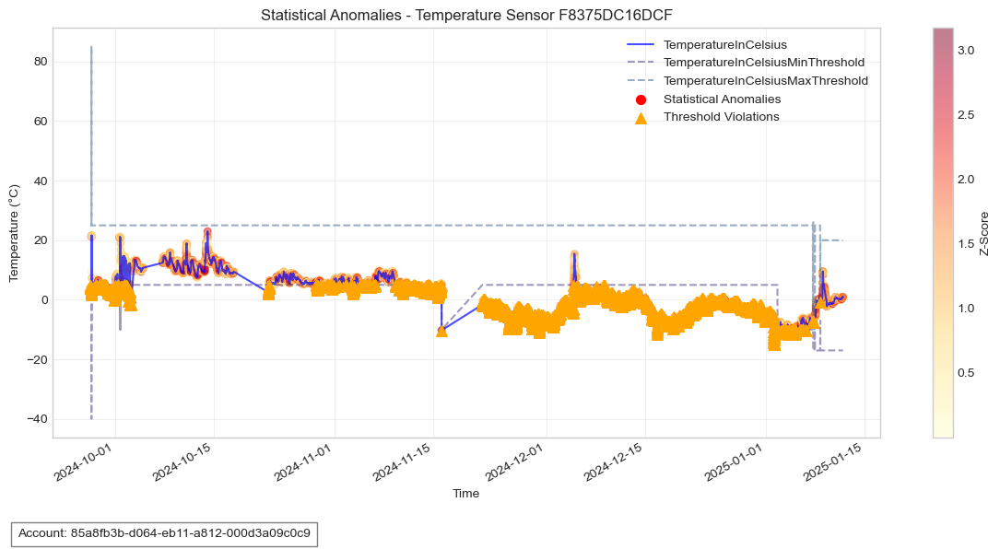

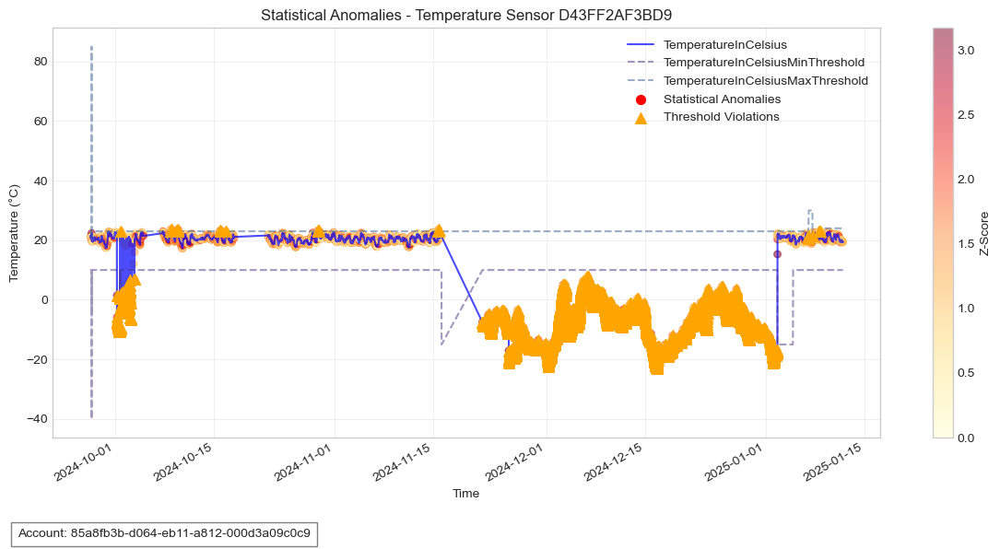

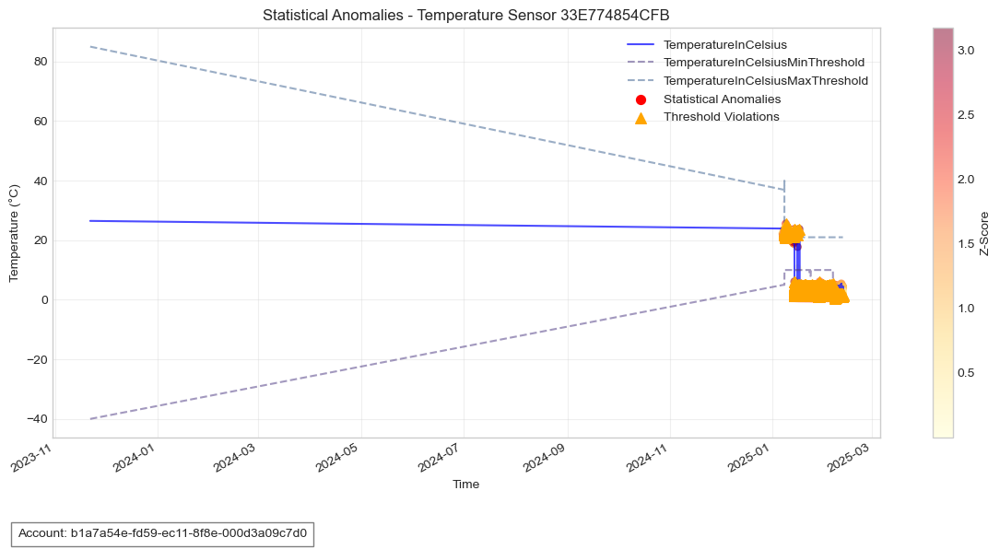

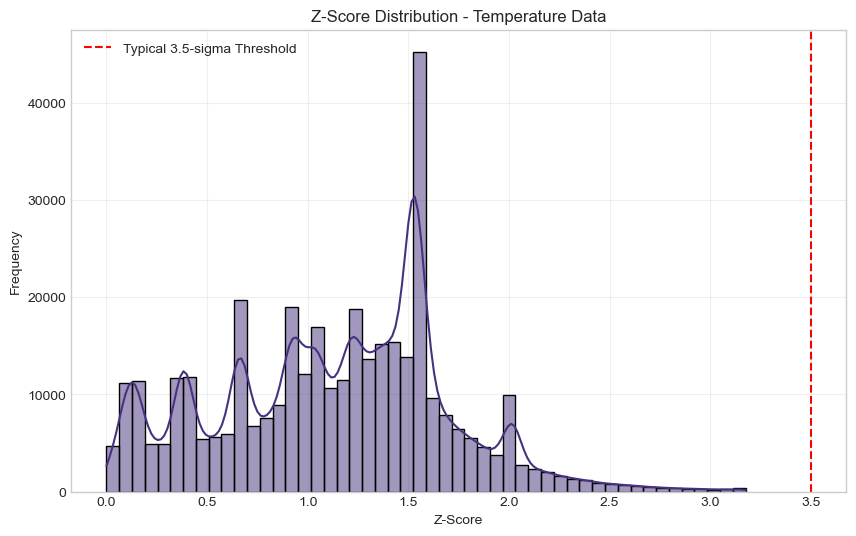

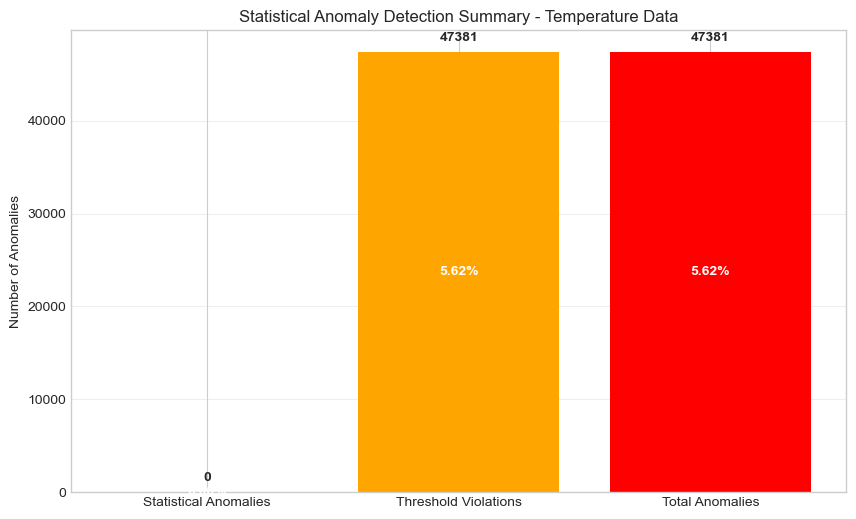

2025-03-20 21:33:46,264 - statistical_detector - INFO - Starting statistical anomaly detection for battery data
2025-03-20 21:33:46,276 - statistical_detector - INFO - Identified 37 battery readings below minimum threshold of 2.0V


Memory usage at after temperature processing: 814.63 MB

Processing battery data (274,559 records)...
Memory usage at before battery processing: 814.63 MB


Statistical analysis: battery: 100%|██████████| 92/92 [00:01<00:00, 49.70it/s]
2025-03-20 21:33:48,140 - statistical_detector - INFO - Statistical detection results for battery: 0 statistical anomalies, 4436 threshold violations, 4436 total (1.62%)


Detection completed in 1.88 seconds


## Statistical Anomaly Detection Results for Battery Data

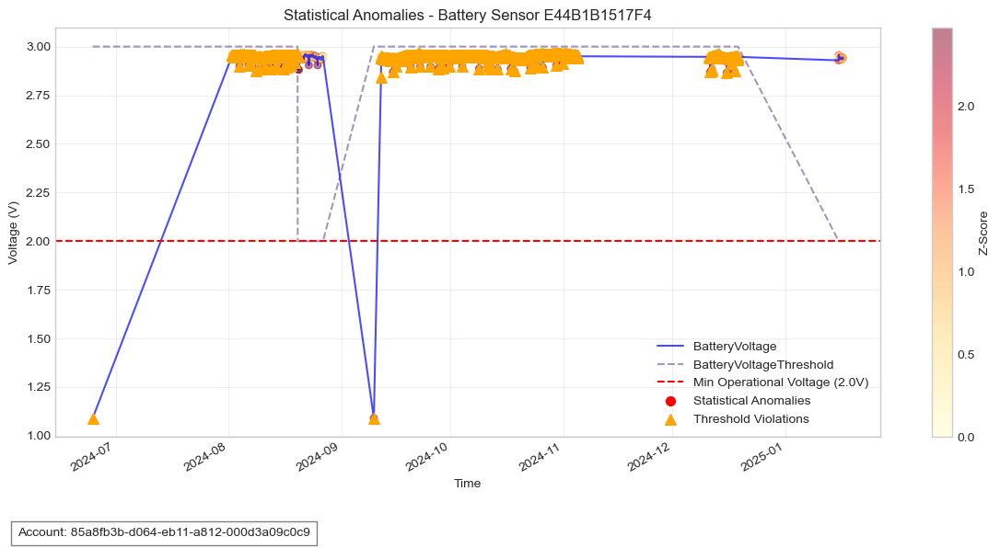

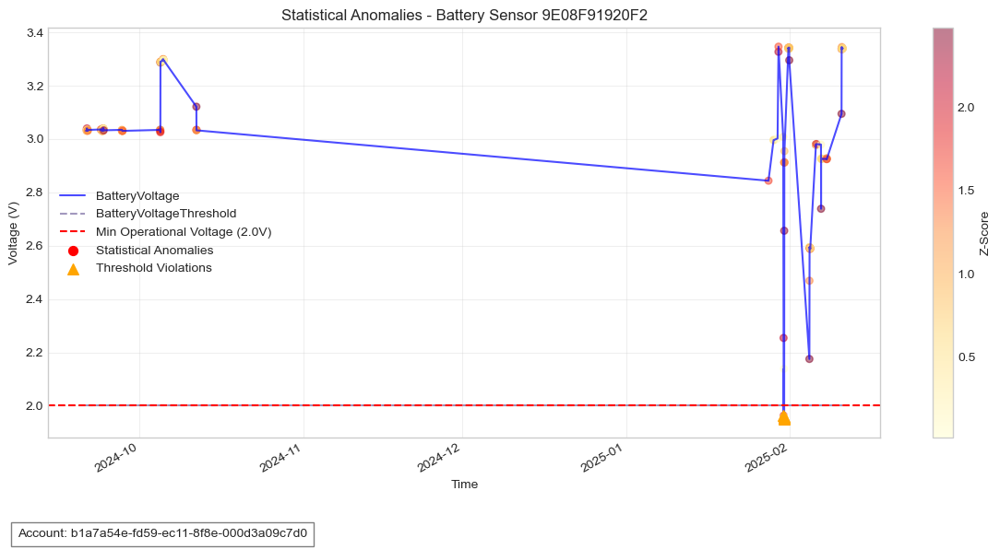

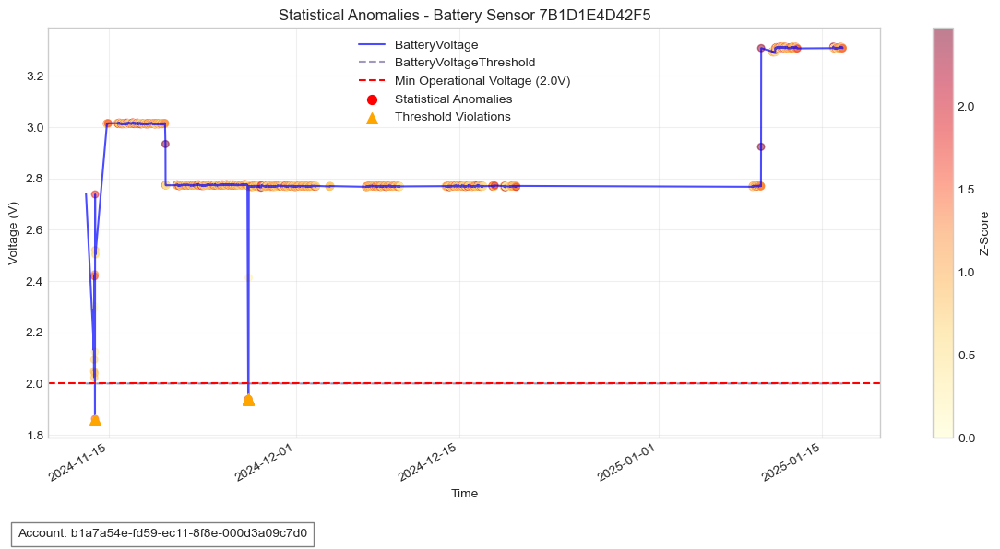

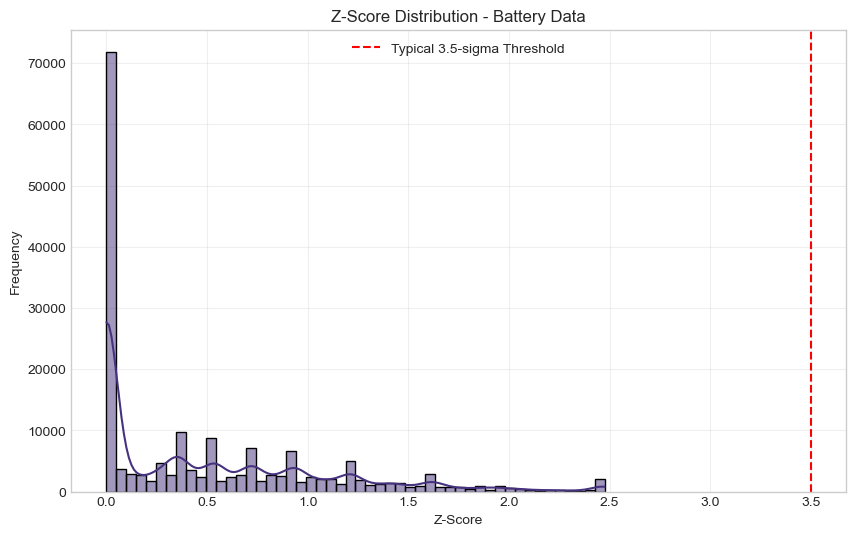

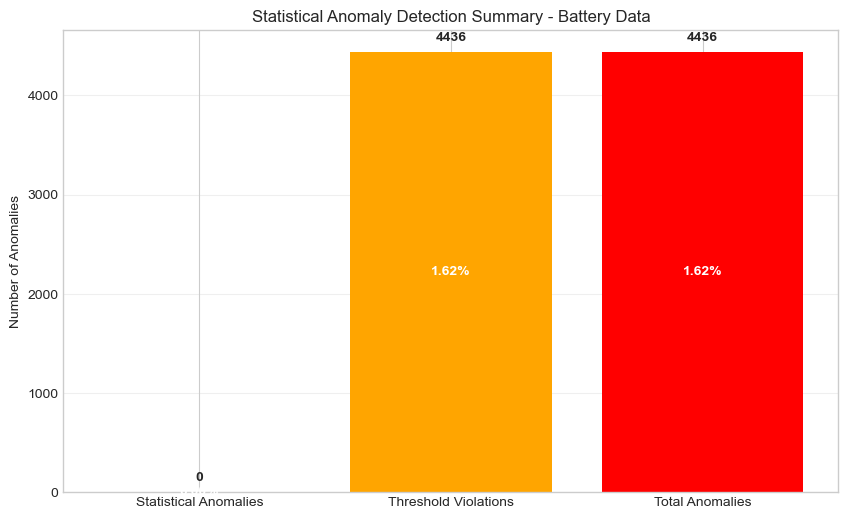

2025-03-20 21:33:56,727 - statistical_detector - INFO - Starting statistical anomaly detection for vibration data


Memory usage at after battery processing: 833.89 MB

Processing vibration data (3,237 records)...
Memory usage at before vibration processing: 833.89 MB


Statistical analysis: vibration: 100%|██████████| 17/17 [00:00<00:00, 331.01it/s]
2025-03-20 21:33:56,784 - statistical_detector - INFO - Statistical detection results for vibration: 0 statistical anomalies, 1377 threshold violations, 1377 total (42.54%)


Detection completed in 0.06 seconds


## Statistical Anomaly Detection Results for Vibration Data

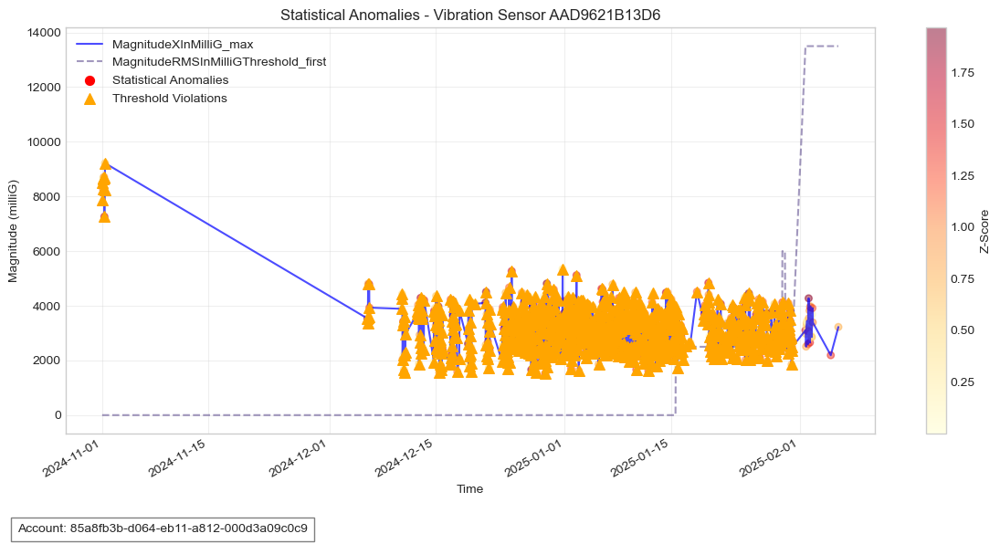

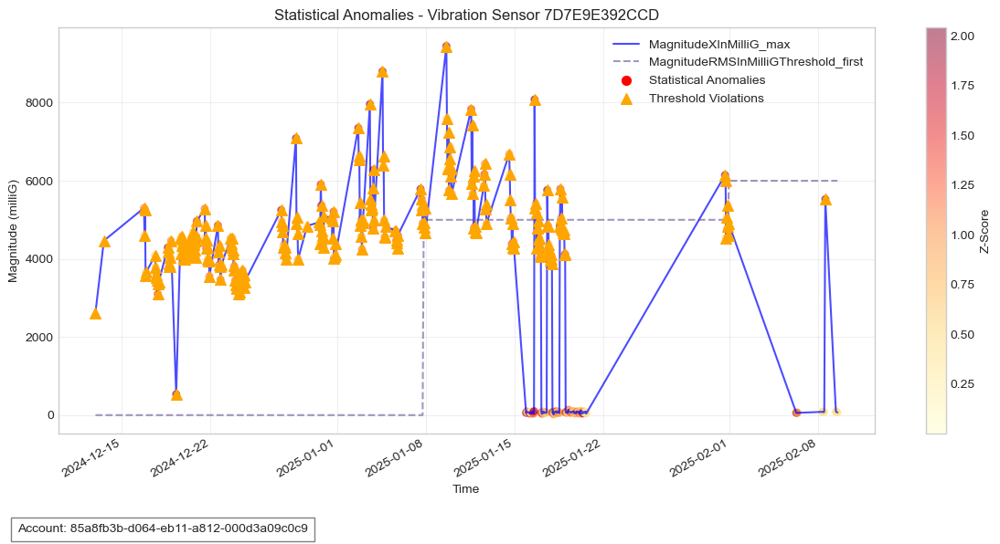

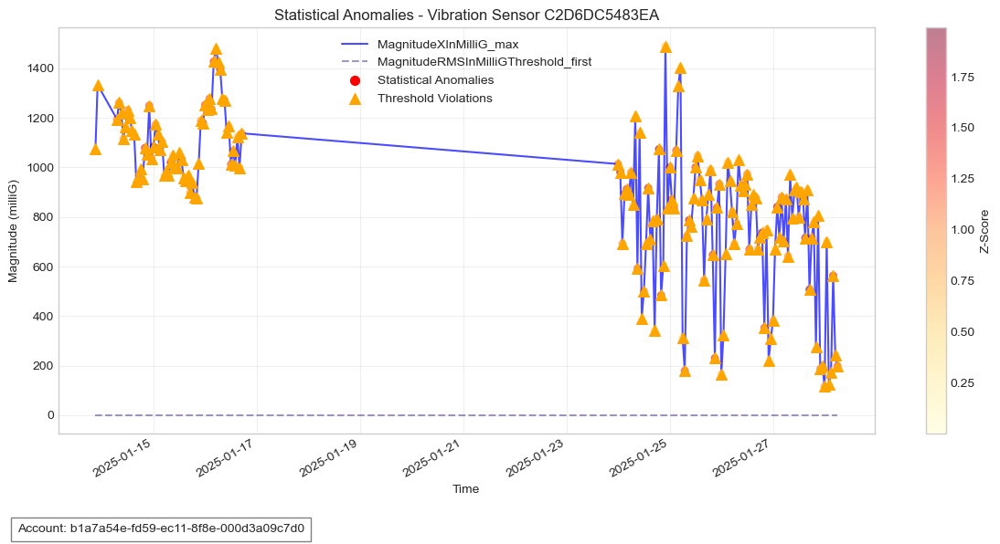

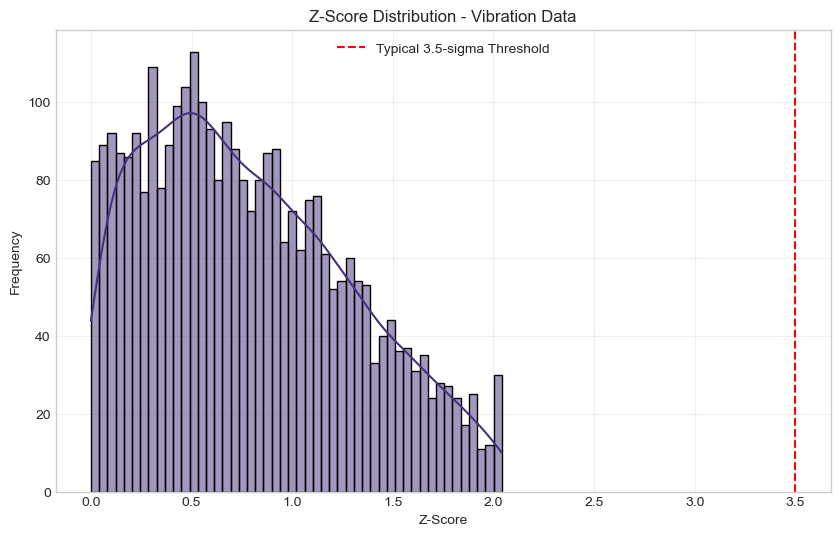

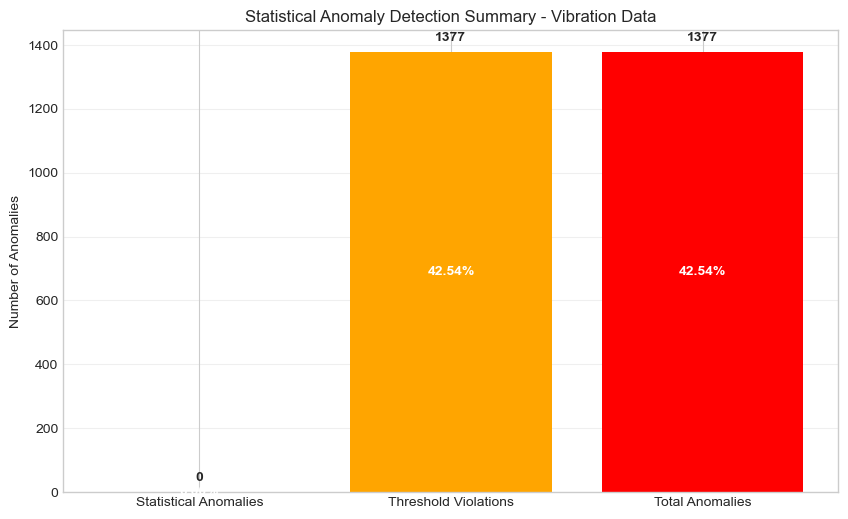

2025-03-20 21:34:04,478 - statistical_detector - INFO - Starting statistical anomaly detection for motion data
2025-03-20 21:34:04,482 - statistical_detector - INFO - Treating all motion events as anomalies
2025-03-20 21:34:04,484 - statistical_detector - INFO - Statistical detection results for motion: 844 statistical anomalies, 844 total (100.00%)


Memory usage at after vibration processing: 844.77 MB

Processing motion data (844 records)...
Memory usage at before motion processing: 844.77 MB
Detection completed in 0.01 seconds


## Statistical Anomaly Detection Results for Motion Data

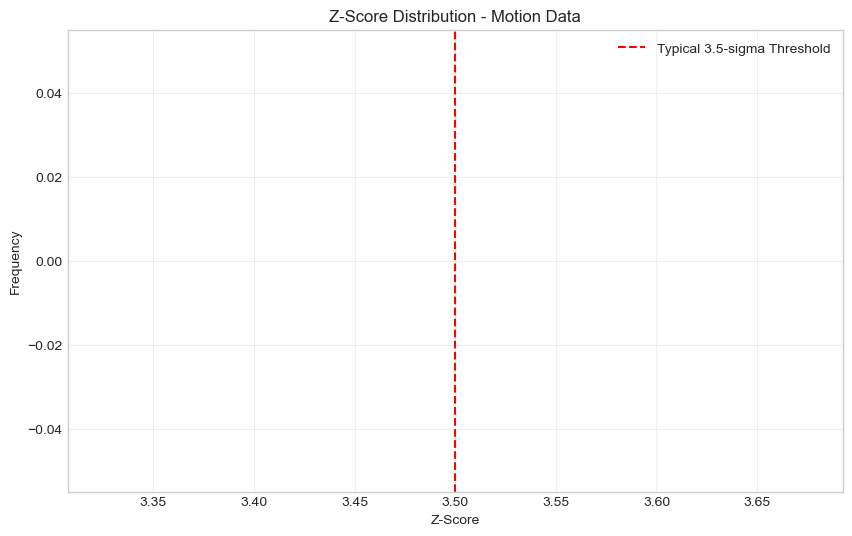

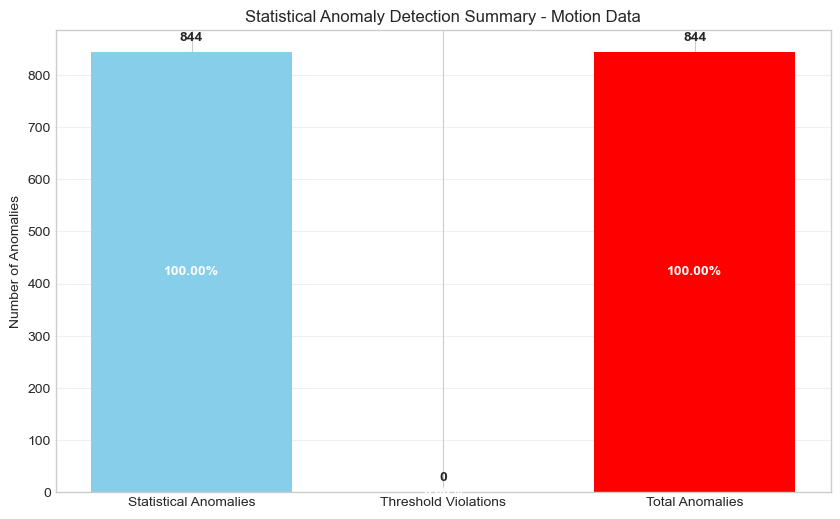

Memory usage at after motion processing: 848.18 MB

=== Statistical Anomaly Detection Summary ===
Temperature: 47,381 anomalies out of 842,711 records (5.62%)
  - Statistical anomalies: 0 (0.00%)
  - Threshold violations: 47,381 (5.62%)
Battery: 4,436 anomalies out of 274,559 records (1.62%)
  - Statistical anomalies: 0 (0.00%)
  - Threshold violations: 4,436 (1.62%)
Vibration: 1,377 anomalies out of 3,237 records (42.54%)
  - Statistical anomalies: 0 (0.00%)
  - Threshold violations: 1,377 (42.54%)
Motion: 844 anomalies out of 844 records (100.00%)
  - Statistical anomalies: 844 (100.00%)
  - Threshold violations: 0 (0.00%)

Statistical anomaly detection completed. Results saved for next pipeline stage.
Memory usage at final: 802.33 MB


In [116]:
# Statistical Anomaly Detection Implementation

## Overview
# This stage serves as the first filter in our multi-stage detection pipeline, focusing on:
# 1. Threshold violations (highest priority)
# 2. Z-score based statistical anomalies
# 3. Adaptive and seasonal pattern analysis
# 
# Key improvements:
# - Battery voltage threshold set to 2.0V (minimum operational voltage)
# - All motion events are treated as anomalies
# - Using MagnitudeRMS for vibration data
# - Higher thresholds to minimize false positives
# - Threshold violations are given absolute priority

import time
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from tqdm import tqdm
import seaborn as sns
from IPython.display import display, Markdown
import gc
import logging

# Setup logging
logging.basicConfig(level=logging.INFO, 
                   format='%(asctime)s - %(name)s - %(levelname)s - %(message)s')
logger = logging.getLogger('anomaly_detection')

# Initialize the detector with optimized configuration
statistical_detector = StatisticalDetector(
    config={
        'temperature': {
            'z_score_threshold': 3.5,  # Higher threshold to reduce false positives
            'rolling_window': 12,  # 1 hour for 5-min data
            'batch_size': 50000,
            'adaptive_params': {
                'sensitivity': 'low',  # Low sensitivity to avoid false positives
                'seasonality_adjustment': True,
                'min_data_points': 10
            }
        },
        'battery': {
            'z_score_threshold': 4.0,  # Higher threshold for battery
            'rolling_window': 8,  # 2 hours for 15-min data
            'batch_size': 30000,
            'adaptive_params': {
                'sensitivity': 'low',  # Lower sensitivity to reduce false alarms
                'trend_consideration': True,
                'min_data_points': 8
            },
            'min_voltage_threshold': 2.0  # Minimum operational voltage threshold for batteries
        },
        'vibration': {
            'z_score_threshold': 4.0,  # Higher threshold to reduce false positives
            'rolling_window': 6,  # 6 hours for hourly data
            'batch_size': 10000,
            'adaptive_params': {
                'sensitivity': 'low',
                'magnitude_variation': True,
                'min_data_points': 6
            },
            'use_magnitude_rms': True  # Use RMS magnitude for vibration
        },
        'motion': {
            'z_score_threshold': 4.0,  # High threshold (though all motion is treated as anomaly)
            'rolling_window': 7,  # 7 days for daily data
            'batch_size': 5000,
            'adaptive_params': {
                'sensitivity': 'low',
                'event_clustering': True,
                'min_data_points': 5
            },
            'all_motion_as_anomaly': True  # All motion events are treated as anomalies
        }
    }
)

# Create output directory for visualizations
output_dir = './visualizations'
os.makedirs(output_dir, exist_ok=True)

# Function to track memory usage
def check_memory_usage(label):
    """Monitor memory usage at specific points"""
    import psutil
    process = psutil.Process(os.getpid())
    memory_info = process.memory_info()
    memory_mb = memory_info.rss / (1024 * 1024)
    print(f"Memory usage at {label}: {memory_mb:.2f} MB")

# Function to process and visualize each sensor type
def process_sensor_data(df, sensor_type, sample_sensors=3):
    """Process sensor data with statistical anomaly detection and visualize results"""
    if df is None or df.empty:
        print(f"No {sensor_type} data to process")
        return None
    
    print(f"\nProcessing {sensor_type} data ({df.shape[0]:,} records)...")
    check_memory_usage(f"before {sensor_type} processing")
    
    # Apply statistical detection
    start_time = time.time()
    try:
        result_df = statistical_detector.detect(df, sensor_type)
        end_time = time.time()
        print(f"Detection completed in {end_time - start_time:.2f} seconds")
        
        # Visualize results
        visualize_statistical_results(result_df, sensor_type, sample_sensors, output_dir)
        
        # Force garbage collection
        gc.collect()
        check_memory_usage(f"after {sensor_type} processing")
        
        return result_df
    except Exception as e:
        print(f"Error processing {sensor_type} data: {str(e)}")
        import traceback
        traceback.print_exc()
        return df

# Process all sensor types
print("Starting Statistical Anomaly Detection Pipeline...")
check_memory_usage("initial")

# Use the preprocessed data from the preprocessing pipeline
print("\nUsing preprocessed data from previous stage...")

# Process temperature data
temp_with_anomalies = process_sensor_data(temp_processed, 'temperature', sample_sensors=3)

# Process battery data
batt_with_anomalies = process_sensor_data(batt_processed, 'battery', sample_sensors=3)

# Process vibration data
vib_with_anomalies = process_sensor_data(vib_processed, 'vibration', sample_sensors=3)

# Process motion data
motn_with_anomalies = process_sensor_data(motn_processed, 'motion', sample_sensors=3)

# Display summary of results
print("\n=== Statistical Anomaly Detection Summary ===")
for sensor_type, result_df in [
     ('temperature', temp_with_anomalies), 
     ('battery', batt_with_anomalies),
     ('vibration', vib_with_anomalies), 
     ('motion', motn_with_anomalies)
]:
    if result_df is not None:
        detection_stats = statistical_detector.get_results(sensor_type)
        print(f"{sensor_type.capitalize()}: {detection_stats.get('anomaly_count', 0):,} anomalies " + 
              f"out of {detection_stats.get('total_records', 0):,} records " + 
              f"({detection_stats.get('anomaly_percentage', 0):.2f}%)")
        
        # Print breakdown of anomaly types
        stat_count = detection_stats.get('statistical_anomaly_count', 0)
        thresh_count = detection_stats.get('threshold_violation_count', 0)
        print(f"  - Statistical anomalies: {stat_count:,} ({stat_count/detection_stats.get('total_records', 1)*100:.2f}%)")
        print(f"  - Threshold violations: {thresh_count:,} ({thresh_count/detection_stats.get('total_records', 1)*100:.2f}%)")

# Save detection results for later stages
statistical_results = {
    'temperature': temp_with_anomalies,
    'battery': batt_with_anomalies,
    'vibration': vib_with_anomalies,
    'motion': motn_with_anomalies
}

# Print completion message
print("\nStatistical anomaly detection completed. Results saved for next pipeline stage.")
check_memory_usage("final")

### Stage 2: Machine Learning-Based Anomaly Detection

After implementing the statistical detection methods, we now enhance our anomaly detection capabilities with machine learning techniques. The Isolation Forest algorithm is particularly well-suited for anomaly detection without requiring labeled data.This stage identifies complex pattern anomalies that might not be captured by simpler statistical approaches.

It excels at detecting pattern-based anomalies by isolating observations rather than calculating distances or densities. This makes it especially effective for high-dimensional data and computationally efficient.

### Key Features
- Adaptive feature selection
- Automatic contamination rate estimation
- Memory-efficient batch processing
- Sensor-specific model training

In [117]:
class IsolationForestDetector:
    """
    Machine learning-based anomaly detection using Isolation Forest algorithm.
    
    This detector serves as the second filter in our multi-stage pipeline, identifying
    pattern-based anomalies that statistical methods might miss. It isolates observations by
    randomly selecting features and split values, making it efficient for high-dimensional data.
    
    Features:
    - Adaptive feature engineering based on sensor type
    - Model reuse for subsequent runs
    - Automatic contamination estimation based on threshold violations
    - Memory-efficient processing through batch processing
    - Sensor-specific model training with storage/retrieval
    """
    
    def __init__(self, config=None, logger=None, models_dir='./models'):
        """
        Initialize the Isolation Forest detector
        
        Parameters:
        -----------
        config : dict, optional
            Configuration parameters
        logger : logging.Logger, optional
            Logger for tracking operations
        models_dir : str
            Directory to save/load trained models
        """
        # Default configuration
        self.default_config = {
            'temperature': {
                'contamination': 'auto',  # 'auto' or a float value
                'n_estimators': 100,
                'random_state': 42,
                'batch_size': 50000,
                'n_jobs': -1,  # Use all processors
                'features': {
                    'include_hour': True,
                    'include_day_of_week': True,
                    'include_derivatives': True,
                    'use_statistical_scores': True
                }
            },
            'battery': {
                'contamination': 'auto',
                'n_estimators': 100,
                'random_state': 42,
                'batch_size': 30000,
                'n_jobs': -1,
                'features': {
                    'include_hour': False,
                    'include_day_of_week': False,
                    'include_derivatives': True,
                    'use_statistical_scores': True,
                    'enforce_min_voltage': True
                }
            },
            'vibration': {
                'contamination': 'auto',
                'n_estimators': 100,
                'random_state': 42,
                'batch_size': 10000,
                'n_jobs': -1,
                'features': {
                    'include_hour': True,
                    'include_day_of_week': True,
                    'include_derivatives': False,
                    'use_statistical_scores': True,
                    'use_magnitude_rms': True
                }
            },
            'motion': {
                'contamination': 'auto',
                'n_estimators': 100,
                'random_state': 42,
                'batch_size': 5000,
                'n_jobs': -1,
                'features': {
                    'include_hour': False,
                    'include_day_of_week': True,
                    'include_derivatives': False,
                    'use_statistical_scores': True,
                    'all_as_anomaly': True  # All motion events are anomalies
                }
            }
        }
        
        # Merge provided config with default
        self.config = config or self.default_config
        
        # Setup logging
        self.logger = logger or logging.getLogger('isolation_forest_detector')
        
        # Dictionary to store trained models
        self.models = {}
        self.models_dir = models_dir
        os.makedirs(models_dir, exist_ok=True)
        
        # Store detection results
        self.results = {}
        
        # Try to load existing models
        self._load_saved_models()
    
    def _load_saved_models(self):
        """
        Load previously saved models
        """
        import joblib
        
        self.logger.info(f"Looking for saved models in {self.models_dir}")
        
        if not os.path.exists(self.models_dir):
            self.logger.warning(f"Models directory {self.models_dir} does not exist")
            return
        
        model_files = [f for f in os.listdir(self.models_dir) 
                      if f.startswith('isolation_forest_') and f.endswith('.joblib')]
        
        if not model_files:
            self.logger.info("No saved Isolation Forest models found")
            return
            
        self.logger.info(f"Found {len(model_files)} saved models")
        
        models_loaded = 0
        for model_file in model_files:
            try:
                # Extract model key from filename
                model_key = model_file.replace('isolation_forest_', '').replace('.joblib', '')
                
                # Load the model
                model_path = os.path.join(self.models_dir, model_file)
                model = joblib.load(model_path)
                
                # Add to models dictionary
                self.models[model_key] = model
                models_loaded += 1
                
            except Exception as e:
                self.logger.error(f"Error loading model from {model_file}: {str(e)}")
        
        self.logger.info(f"Successfully loaded {models_loaded} Isolation Forest models")
    
    def _estimate_contamination(self, df, sensor_type, value_col):
        """
        Estimate contamination rate for Isolation Forest based on data characteristics
        
        Parameters:
        -----------
        df : pandas.DataFrame
            Sensor data
        sensor_type : str
            Type of sensor
        value_col : str
            Column containing the primary value
            
        Returns:
        --------
        float
            Estimated contamination rate (0.001 to 0.5)
        """
        # Default contamination rates by sensor type (set low to reduce false positives)
        default_rates = {
            'temperature': 0.01,  # 1%
            'battery': 0.01,      # 1%
            'vibration': 0.02,    # 2%
            'motion': 0.03        # 3%
        }
        
        # If config specifies a float value, use it
        contamination = self.config[sensor_type]['contamination']
        if isinstance(contamination, float):
            return min(0.5, max(0.001, contamination))  # Ensure it's in valid range
        
        # If auto, prioritize threshold violations to determine contamination
        if contamination == 'auto':
            try:
                # If we have threshold violations, use that as a strong signal
                if 'threshold_violation' in df.columns:
                    thresh_violation_pct = df['threshold_violation'].mean()
                    
                    # Non-zero threshold violations provide a minimum contamination rate
                    if thresh_violation_pct > 0:
                        # Use slightly higher rate than threshold violations to catch similar patterns
                        # But not too high to avoid false positives
                        return min(0.5, max(0.001, thresh_violation_pct * 1.2))
                
                # For motion data, if configured to treat all motion as anomaly
                if sensor_type == 'motion' and self.config[sensor_type].get('features', {}).get('all_as_anomaly', False):
                    return default_rates['motion']  # Use default rate
                
                # If we have statistical anomaly info, use it as baseline
                if 'statistical_anomaly' in df.columns:
                    # Calculate total percentage of statistical anomalies
                    stat_anomaly_pct = df['statistical_anomaly'].mean()
                    
                    # Use statistical anomaly rate as baseline, with a minimum
                    statistical_baseline = max(0.005, stat_anomaly_pct)
                    
                    # Return a slightly higher rate to catch more subtle anomalies
                    return min(0.5, statistical_baseline * 1.2)
                
                # Use z-scores if available
                if 'z_score' in df.columns:
                    # Estimate based on z-scores
                    z_scores = df['z_score'].dropna()
                    if len(z_scores) > 10:
                        # Use 3.5-sigma rule as baseline (stricter to reduce false positives)
                        estimated = (z_scores > 3.5).mean()
                        # Ensure it's in a reasonable range
                        estimated = min(0.5, max(0.001, estimated * 1.2))  # Slightly higher than z-score anomalies
                        return estimated
                
                # For battery sensors, check voltage threshold
                if sensor_type == 'battery' and value_col in df.columns:
                    # Calculate percentage below 2.0V
                    below_min = (df[value_col] < 2.0).mean()
                    if below_min > 0:
                        return min(0.5, max(0.01, below_min * 1.5))  # Use slightly higher rate
                
                # For vibration, use magnitude vs threshold if available
                if sensor_type == 'vibration' and value_col in df.columns:
                    # Find threshold column
                    threshold_cols = [col for col in df.columns if 'Threshold' in col and 'Magnitude' in col]
                    if threshold_cols and threshold_cols[0] in df.columns:
                        # Calculate percentage above threshold
                        threshold_col = threshold_cols[0]
                        above_threshold = (df[value_col] > df[threshold_col]).mean()
                        if above_threshold > 0:
                            return min(0.5, max(0.01, above_threshold * 1.5))  # Use slightly higher rate
                
                # If no specific signal, use coefficient of variation
                values = df[value_col].dropna()
                if len(values) > 10:
                    mean = values.mean()
                    std = values.std()
                    if mean != 0:
                        cv = std / abs(mean)
                        # Higher CV suggests more variability, which might indicate more anomalies
                        # But we use a low multiplier to avoid too many false positives
                        estimated = min(0.5, max(0.001, 0.005 * cv))
                        return estimated
            
            except Exception as e:
                self.logger.warning(f"Error estimating contamination: {str(e)}")
        
        # Fallback to default rates
        return default_rates.get(sensor_type, 0.01)
    
    def _prepare_features(self, df, sensor_type, value_col):
        """
        Prepare features for Isolation Forest algorithm with sensor-specific feature engineering
        
        Parameters:
        -----------
        df : pandas.DataFrame
            Sensor data
        sensor_type : str
            Type of sensor
        value_col : str
            Primary value column
            
        Returns:
        --------
        numpy.ndarray
            Feature matrix for Isolation Forest
        """
        # Get feature configuration
        feature_config = self.config[sensor_type]['features']
        
        # Start with primary value column
        features = [df[value_col].values.reshape(-1, 1)]
        
        # Add time-based features if available and enabled
        if 'EventTimeUtc' in df.columns:
            # Hour of day (cyclical encoding using sine/cosine)
            if feature_config.get('include_hour', False):
                hour = df['EventTimeUtc'].dt.hour
                hour_sin = np.sin(2 * np.pi * hour / 24).values.reshape(-1, 1)
                hour_cos = np.cos(2 * np.pi * hour / 24).values.reshape(-1, 1)
                features.append(hour_sin)
                features.append(hour_cos)
            
            # Day of week (cyclical encoding using sine/cosine)
            if feature_config.get('include_day_of_week', False):
                dow = df['EventTimeUtc'].dt.dayofweek
                dow_sin = np.sin(2 * np.pi * dow / 7).values.reshape(-1, 1)
                dow_cos = np.cos(2 * np.pi * dow / 7).values.reshape(-1, 1)
                features.append(dow_sin)
                features.append(dow_cos)
            
            # For temperature data, add month feature (seasonal patterns)
            if sensor_type == 'temperature':
                month = df['EventTimeUtc'].dt.month
                month_sin = np.sin(2 * np.pi * month / 12).values.reshape(-1, 1)
                month_cos = np.cos(2 * np.pi * month / 12).values.reshape(-1, 1)
                features.append(month_sin)
                features.append(month_cos)
        
        # Add derivatives (rate of change) if enabled and sufficient data
        if feature_config.get('include_derivatives', False) and len(df) > 2:
            # Ensure data is sorted by time if available
            if 'EventTimeUtc' in df.columns:
                df = df.sort_values('EventTimeUtc')
            
            # Calculate first derivative (rate of change)
            derivative = df[value_col].diff().fillna(0).values.reshape(-1, 1)
            features.append(derivative)
            
            # Calculate second derivative (acceleration)
            if len(df) > 3:
                second_derivative = df[value_col].diff().diff().fillna(0).values.reshape(-1, 1)
                features.append(second_derivative)
        
        # Add statistical features if available and enabled
        if feature_config.get('use_statistical_scores', True):
            if 'z_score' in df.columns:
                z_scores = df['z_score'].fillna(0).values.reshape(-1, 1)
                features.append(z_scores)
            
            # Add rolling statistics for time-based patterns
            if len(df) >= 10:
                if 'EventTimeUtc' in df.columns:
                    df = df.sort_values('EventTimeUtc')
                
                # Rolling mean and std as features
                window_size = min(24, max(3, len(df) // 10))  # Adaptive window size
                rolling_mean = df[value_col].rolling(window=window_size, min_periods=1).mean().fillna(df[value_col].mean()).values.reshape(-1, 1)
                rolling_std = df[value_col].rolling(window=window_size, min_periods=1).std().fillna(df[value_col].std()).values.reshape(-1, 1)
                
                features.append(rolling_mean)
                features.append(rolling_std)
                
                # Add deviation from rolling mean
                deviation = (df[value_col].values - rolling_mean.flatten()).reshape(-1, 1)
                features.append(deviation)
        
        # Special handling for battery sensors
        if sensor_type == 'battery' and feature_config.get('enforce_min_voltage', True):
            # Add feature for distance from minimum operational voltage (2.0V)
            min_voltage = 2.0
            min_voltage_distance = (df[value_col].values - min_voltage).reshape(-1, 1)
            features.append(min_voltage_distance)
            
            # Add binary indicator for below minimum voltage
            below_min = (df[value_col].values < min_voltage).astype(float).reshape(-1, 1)
            features.append(below_min)
        
        # Special handling for vibration sensors
        if sensor_type == 'vibration' and feature_config.get('use_magnitude_rms', True):
            # Add threshold-based features if available
            threshold_cols = [col for col in df.columns if 'Threshold' in col and 'Magnitude' in col]
            if threshold_cols and threshold_cols[0] in df.columns:
                threshold_col = threshold_cols[0]
                # Ratio of magnitude to threshold
                threshold_ratio = (df[value_col].values / df[threshold_col].values).reshape(-1, 1)
                # Replace infinities and NaNs
                threshold_ratio = np.nan_to_num(threshold_ratio, nan=0, posinf=10, neginf=-10)
                features.append(threshold_ratio)
                
                # Binary indicator for above threshold
                above_threshold = (df[value_col].values > df[threshold_col].values).astype(float).reshape(-1, 1)
                features.append(above_threshold)
        
        # Special handling for motion sensors
        if sensor_type == 'motion' and feature_config.get('all_as_anomaly', True):
            # If all motion events are anomalies, add strong feature to ensure they're detected
            # But we still want to differentiate between different types of motion patterns
            all_anomaly_feature = np.ones((len(df), 1))  # All ones to indicate anomaly
            features.append(all_anomaly_feature)
        
        # Combine all features
        feature_matrix = np.hstack(features)
        
        # Replace any infinite values with large numbers
        feature_matrix = np.nan_to_num(feature_matrix, nan=0, posinf=1e10, neginf=-1e10)
        
        return feature_matrix
    
    def detect(self, df, sensor_type):
        """
        Detect anomalies using Isolation Forest algorithm
        
        Parameters:
        -----------
        df : pandas.DataFrame
            Sensor data with statistical anomaly detection results
        sensor_type : str
            Type of sensor
            
        Returns:
        --------
        pandas.DataFrame
            Data with isolation forest anomaly flags and scores
        """
        if df is None or df.empty:
            return df
        
        self.logger.info(f"Starting Isolation Forest anomaly detection for {sensor_type} data")
        
        # Create a copy to avoid warnings
        df = df.copy()
        
        # Get value column
        value_col, _ = self._get_columns(df, sensor_type)
        
        if not value_col:
            self.logger.error(f"Could not determine value column for {sensor_type}")
            return df
        
        # Add isolation forest anomaly columns
        df['isolation_forest_anomaly'] = False
        df['anomaly_score'] = np.nan
        
        # Get configuration for this sensor type
        config = self.config[sensor_type]
        batch_size = config.get('batch_size', 50000)
        
        # Special handling for motion data if configured to treat all motion as anomalies
        if sensor_type == 'motion' and config.get('features', {}).get('all_as_anomaly', True):
            # Mark all motion events as anomalies
            self.logger.info("Treating all motion events as anomalies")
            df['isolation_forest_anomaly'] = True
            df['anomaly_score'] = 1.0  # Maximum anomaly score
            
            # Calculate additional statistics for context
            anomaly_count = len(df)
            
            self.logger.info(
                f"Isolation Forest detection results for {sensor_type}: "
                f"{anomaly_count} anomalies found ({anomaly_count/len(df)*100:.2f}%)"
            )
            
            # Store results
            self.results[sensor_type] = {
                'anomaly_count': int(anomaly_count),
                'total_records': len(df),
                'anomaly_percentage': float(anomaly_count/len(df)*100)
            }
            
            return df
        
        # Process each sensor individually
        total_anomalies = 0
        
        for sensor_id in tqdm(df['SensorId'].unique(), desc=f"Isolation Forest analysis: {sensor_type}"):
            # Get data for this sensor
            sensor_mask = df['SensorId'] == sensor_id
            sensor_data = df[sensor_mask].copy()
            
            # Skip if insufficient data
            if len(sensor_data) < 10:
                self.logger.debug(f"Insufficient data for sensor {sensor_id}: {len(sensor_data)} < 10")
                continue
            
            # Process in batches if large, otherwise process directly
            if len(sensor_data) > batch_size:
                anomaly_count = self._process_sensor_in_batches(
                    df=df,
                    sensor_data=sensor_data,
                    sensor_mask=sensor_mask,
                    value_col=value_col,
                    sensor_id=sensor_id,
                    sensor_type=sensor_type
                )
            else:
                anomaly_count = self._process_sensor_directly(
                    df=df,
                    sensor_data=sensor_data,
                    sensor_mask=sensor_mask,
                    value_col=value_col,
                    sensor_id=sensor_id,
                    sensor_type=sensor_type
                )
            
            total_anomalies += anomaly_count
        
        # Calculate overall stats
        anomaly_count = df['isolation_forest_anomaly'].sum()
        
        self.logger.info(
            f"Isolation Forest detection results for {sensor_type}: "
            f"{anomaly_count} anomalies found ({anomaly_count/len(df)*100:.2f}%)"
        )
        
        # Store results
        self.results[sensor_type] = {
            'anomaly_count': int(anomaly_count),
            'total_records': len(df),
            'anomaly_percentage': float(anomaly_count/len(df)*100)
        }
        
        return df
    
    def _process_sensor_directly(self, df, sensor_data, sensor_mask, value_col, sensor_id, sensor_type):
        """
        Process a sensor's data directly using Isolation Forest
        
        Parameters:
        -----------
        df : pandas.DataFrame
            Full dataframe (to be updated)
        sensor_data : pandas.DataFrame
            Data for a specific sensor
        sensor_mask : pandas.Series
            Boolean mask for this sensor in the full dataframe
        value_col : str
            Value column name
        sensor_id : str
            Sensor ID
        sensor_type : str
            Type of sensor
            
        Returns:
        --------
        int
            Number of anomalies detected
        """
        try:
            # Check if we already have a model for this sensor
            model_key = f"{sensor_type}_{sensor_id}"
            
            # If model exists, use it
            if model_key in self.models:
                self.logger.debug(f"Using existing model for sensor {sensor_id}")
                model = self.models[model_key]
                
                # Prepare features
                X = self._prepare_features(sensor_data, sensor_type, value_col)
                
                # Predict anomalies
                predictions = model.predict(X)
                scores = model.decision_function(X)
                
                # In Isolation Forest, predictions are 1 for inliers and -1 for outliers
                anomalies = predictions == -1
                
                # Convert scores to anomaly scores (higher = more anomalous)
                # Decision function returns distance from hyperplane, negative = anomaly
                anomaly_scores = 0.5 - scores / 2  # Scale to 0-1 range
                
                # Update main dataframe
                df.loc[sensor_mask, 'isolation_forest_anomaly'] = anomalies
                df.loc[sensor_mask, 'anomaly_score'] = anomaly_scores
                
                return np.sum(anomalies)
            
            # If no model exists, train a new one
            # Prepare features
            X = self._prepare_features(sensor_data, sensor_type, value_col)
            
            # Estimate contamination
            contamination = self._estimate_contamination(sensor_data, sensor_type, value_col)
            
            # Get model parameters
            n_estimators = self.config[sensor_type].get('n_estimators', 100)
            random_state = self.config[sensor_type].get('random_state', 42)
            n_jobs = self.config[sensor_type].get('n_jobs', -1)
            
            # Train Isolation Forest model
            from sklearn.ensemble import IsolationForest
            model = IsolationForest(
                n_estimators=n_estimators,
                contamination=contamination,
                random_state=random_state,
                n_jobs=n_jobs
            )
            
            model.fit(X)
            
            # Save model for future use
            self.models[model_key] = model
            
            # Save to disk for persistence
            try:
                import joblib
                model_path = os.path.join(self.models_dir, f"isolation_forest_{model_key}.joblib")
                joblib.dump(model, model_path)
                self.logger.debug(f"Saved model for sensor {sensor_id} to {model_path}")
            except Exception as e:
                self.logger.warning(f"Error saving model for sensor {sensor_id}: {str(e)}")
            
            # Predict anomalies
            predictions = model.predict(X)
            scores = model.decision_function(X)
            
            # In Isolation Forest, predictions are 1 for inliers and -1 for outliers
            anomalies = predictions == -1
            
            # Convert scores to anomaly scores (higher = more anomalous)
            # Decision function returns distance from hyperplane, negative = anomaly
            anomaly_scores = 0.5 - scores / 2  # Scale to 0-1 range
            
            # Update main dataframe
            df.loc[sensor_mask, 'isolation_forest_anomaly'] = anomalies
            df.loc[sensor_mask, 'anomaly_score'] = anomaly_scores
            
            return np.sum(anomalies)
            
        except Exception as e:
            self.logger.error(f"Error in Isolation Forest for sensor {sensor_id}: {str(e)}")
            return 0
    
    def _process_sensor_in_batches(self, df, sensor_data, sensor_mask, value_col, sensor_id, sensor_type):
        """
        Process a sensor's data in batches for memory efficiency
        
        Parameters:
        -----------
        df : pandas.DataFrame
            Full dataframe (to be updated)
        sensor_data : pandas.DataFrame
            Data for a specific sensor
        sensor_mask : pandas.Series
            Boolean mask for this sensor in the full dataframe
        value_col : str
            Value column name
        sensor_id : str
            Sensor ID
        sensor_type : str
            Type of sensor
            
        Returns:
        --------
        int
            Number of anomalies detected
        """
        try:
            # Ensure data is sorted by time
            if 'EventTimeUtc' in sensor_data.columns:
                sensor_data = sensor_data.sort_values('EventTimeUtc')
            
            # Check if we already have a model for this sensor
            model_key = f"{sensor_type}_{sensor_id}"
            
            # Get configuration
            config = self.config[sensor_type]
            batch_size = config.get('batch_size', 50000)
            
            # Estimate contamination
            contamination = self._estimate_contamination(sensor_data, sensor_type, value_col)
            
            # Get model parameters
            n_estimators = config.get('n_estimators', 100)
            random_state = config.get('random_state', 42)
            n_jobs = config.get('n_jobs', -1)
            
            # If model exists, use it for prediction only
            if model_key in self.models:
                self.logger.debug(f"Using existing model for batch processing of sensor {sensor_id}")
                model = self.models[model_key]
                
                # Arrays to store results
                all_anomalies = np.zeros(len(sensor_data), dtype=bool)
                all_scores = np.full(len(sensor_data), np.nan)
                
                # Process in batches
                for i in range(0, len(sensor_data), batch_size):
                    end_idx = min(i + batch_size, len(sensor_data))
                    
                    # Get batch data
                    batch_data = sensor_data.iloc[i:end_idx]
                    
                    # Prepare features
                    X_batch = self._prepare_features(batch_data, sensor_type, value_col)
                    
                    # Predict anomalies
                    predictions = model.predict(X_batch)
                    scores = model.decision_function(X_batch)
                    
                    # Convert predictions and scores
                    batch_anomalies = predictions == -1
                    batch_scores = 0.5 - scores / 2
                    
                    # Store results
                    all_anomalies[i:end_idx] = batch_anomalies
                    all_scores[i:end_idx] = batch_scores
                    
                    # Force garbage collection
                    gc.collect()
                
                # Update main dataframe
                sensor_indices = df[sensor_mask].index
                df.loc[sensor_indices, 'isolation_forest_anomaly'] = all_anomalies
                df.loc[sensor_indices, 'anomaly_score'] = all_scores
                
                return int(all_anomalies.sum())
            
            # If no model exists, train a new one on a sample of the data
            from sklearn.ensemble import IsolationForest
            
            # Sample data for training
            max_train_size = min(len(sensor_data), 10000)  # Limit training data for efficiency
            if len(sensor_data) > max_train_size:
                # Stratified sampling: include both normal and anomalous points
                if 'statistical_anomaly' in sensor_data.columns or 'threshold_violation' in sensor_data.columns:
                    # Create a combined flag
                    sensor_data['_any_anomaly'] = False
                    if 'statistical_anomaly' in sensor_data.columns:
                        sensor_data['_any_anomaly'] |= sensor_data['statistical_anomaly']
                    if 'threshold_violation' in sensor_data.columns:
                        sensor_data['_any_anomaly'] |= sensor_data['threshold_violation']
                    
                    # Split by anomaly flag
                    anomalous = sensor_data[sensor_data['_any_anomaly']]
                    normal = sensor_data[~sensor_data['_any_anomaly']]
                    
                    # Sample from each group
                    anomaly_ratio = len(anomalous) / len(sensor_data)
                    anomaly_count = int(max_train_size * anomaly_ratio)
                    normal_count = max_train_size - anomaly_count
                    
                    # Sample with replacement if necessary
                    sampled_anomalous = anomalous.sample(n=anomaly_count, replace=len(anomalous) < anomaly_count, random_state=42)
                    sampled_normal = normal.sample(n=normal_count, replace=len(normal) < normal_count, random_state=42)
                    
                    # Combine samples
                    train_data = pd.concat([sampled_anomalous, sampled_normal])
                else:
                    # Simple random sampling
                    train_data = sensor_data.sample(n=max_train_size, random_state=42)
            else:
                train_data = sensor_data
            
            # Prepare features for training
            X_train = self._prepare_features(train_data, sensor_type, value_col)
            
            # Train model
            model = IsolationForest(
                n_estimators=n_estimators,
                contamination=contamination,
                random_state=random_state,
                n_jobs=n_jobs
            )
            
            model.fit(X_train)
            
            # Save model for future use
            self.models[model_key] = model
            
                # Save to disk for persistence
            try:
                import joblib
                model_path = os.path.join(self.models_dir, f"isolation_forest_{model_key}.joblib")
                joblib.dump(model, model_path)
                self.logger.debug(f"Saved model for sensor {sensor_id} to {model_path}")
            except Exception as e:
                self.logger.warning(f"Error saving model for sensor {sensor_id}: {str(e)}")
            
            # Arrays to store results
            all_anomalies = np.zeros(len(sensor_data), dtype=bool)
            all_scores = np.full(len(sensor_data), np.nan)
            
            # Process in batches
            for i in range(0, len(sensor_data), batch_size):
                end_idx = min(i + batch_size, len(sensor_data))
                
                # Get batch data
                batch_data = sensor_data.iloc[i:end_idx]
                
                # Prepare features
                X_batch = self._prepare_features(batch_data, sensor_type, value_col)
                
                # Predict anomalies
                predictions = model.predict(X_batch)
                scores = model.decision_function(X_batch)
                
                # Convert predictions and scores
                batch_anomalies = predictions == -1
                batch_scores = 0.5 - scores / 2
                
                # Store results
                all_anomalies[i:end_idx] = batch_anomalies
                all_scores[i:end_idx] = batch_scores
                
                # Force garbage collection
                gc.collect()
            
            # Update main dataframe
            sensor_indices = df[sensor_mask].index
            df.loc[sensor_indices, 'isolation_forest_anomaly'] = all_anomalies
            df.loc[sensor_indices, 'anomaly_score'] = all_scores
            
            return int(all_anomalies.sum())
            
        except Exception as e:
            self.logger.error(f"Error in batch Isolation Forest for sensor {sensor_id}: {str(e)}")
            import traceback
            traceback.print_exc()
            return 0
    
    def _get_columns(self, df, sensor_type):
        """
        Determine value and threshold columns based on sensor type
        
        Parameters:
        -----------
        df : pandas.DataFrame
            Sensor data
        sensor_type : str
            Type of sensor
            
        Returns:
        --------
        tuple
            (value_column, [threshold_columns])
        """
        # Find value column
        if sensor_type == 'temperature':
            value_col = 'TemperatureInCelsius'
            threshold_cols = [col for col in df.columns if 'Temperature' in col and 'Threshold' in col]
        
        elif sensor_type == 'battery':
            value_col = 'BatteryVoltage'
            threshold_cols = [col for col in df.columns if 'Battery' in col and 'Threshold' in col]
        
        elif sensor_type == 'vibration':
            # Prioritize MagnitudeRMS for vibration data as specified
            if 'MagnitudeRMSInMilliG' in df.columns:
                value_col = 'MagnitudeRMSInMilliG'
            else:
                # Fallback to other magnitude columns if RMS is not available
                magnitude_cols = [col for col in df.columns if 'Magnitude' in col and 'Threshold' not in col]
                rms_cols = [col for col in magnitude_cols if 'RMS' in col]
                value_col = rms_cols[0] if rms_cols else (magnitude_cols[0] if magnitude_cols else None)
                
            threshold_cols = [col for col in df.columns if 'Magnitude' in col and 'Threshold' in col]
        
        elif sensor_type == 'motion':
            # Try different column names for motion data
            if 'max_magnitude' in df.columns:
                value_col = 'max_magnitude'
            elif 'daily_event_count' in df.columns:
                value_col = 'daily_event_count'
            else:
                # Try to find any magnitude column
                magnitude_cols = [col for col in df.columns if 'Magnitude' in col and 'Threshold' not in col]
                value_col = magnitude_cols[0] if magnitude_cols else None
            
            threshold_cols = [col for col in df.columns if 'threshold' in col.lower()]
        
        else:
            self.logger.error(f"Unsupported sensor type: {sensor_type}")
            return None, []
        
        # Verify value column exists
        if value_col and value_col not in df.columns:
            self.logger.error(f"Value column '{value_col}' not found in {sensor_type} data")
            return None, []
        
        return value_col, threshold_cols
    
    def get_results(self, sensor_type=None):
        """
        Get detection results
        
        Parameters:
        -----------
        sensor_type : str, optional
            Type of sensor to get results for
            
        Returns:
        --------
        dict
            Detection results
        """
        if sensor_type:
            return self.results.get(sensor_type, {})
        return self.results
    
    def save_models(self, output_dir=None):
        """
        Save trained models to disk
        
        Parameters:
        -----------
        output_dir : str, optional
            Directory to save models. If None, uses the default models_dir
        """
        import joblib
        
        if output_dir is None:
            output_dir = self.models_dir
        
        os.makedirs(output_dir, exist_ok=True)
        
        models_saved = 0
        for model_key, model in self.models.items():
            output_path = os.path.join(output_dir, f"isolation_forest_{model_key}.joblib")
            try:
                joblib.dump(model, output_path)
                models_saved += 1
                self.logger.debug(f"Saved model {model_key} to {output_path}")
            except Exception as e:
                self.logger.error(f"Error saving model {model_key}: {str(e)}")
        
        self.logger.info(f"Saved {models_saved} Isolation Forest models to {output_dir}")
    
    def load_models(self, input_dir=None):
        """
        Load trained models from disk
        
        Parameters:
        -----------
        input_dir : str, optional
            Directory containing saved models. If None, uses the default models_dir
        """
        import joblib
        
        if input_dir is None:
            input_dir = self.models_dir
        
        if not os.path.exists(input_dir):
            self.logger.warning(f"Model directory {input_dir} does not exist")
            return
        
        model_files = [f for f in os.listdir(input_dir) if f.startswith('isolation_forest_') and f.endswith('.joblib')]
        
        models_loaded = 0
        for model_file in model_files:
            model_key = model_file.replace('isolation_forest_', '').replace('.joblib', '')
            input_path = os.path.join(input_dir, model_file)
            
            try:
                model = joblib.load(input_path)
                self.models[model_key] = model
                models_loaded += 1
                self.logger.debug(f"Loaded model {model_key} from {input_path}")
            except Exception as e:
                self.logger.error(f"Error loading model {model_key}: {str(e)}")
        
        self.logger.info(f"Loaded {models_loaded} Isolation Forest models from {input_dir}")

### Visualization and Evaluation of Isolation Forest Results

The following function will generate visualizations of the Isolation Forest anomaly detection results, including:
1. Time series plots with highlighted anomalies for representative sensors
2. Anomaly score distributions
3. Comparison with statistical anomalies from the previous stage
4. Performance metrics

In [118]:
def visualize_isolation_forest_results(df, sensor_type, sample_sensors=3, output_dir='./visualizations'):
    """
    Visualize isolation forest anomaly detection results
    
    Parameters:
    -----------
    df : pandas.DataFrame
        Data with isolation forest results
    sensor_type : str
        Type of sensor
    sample_sensors : int
        Number of sample sensors to visualize
    output_dir : str
        Directory to save visualizations
    """
    import os
    import matplotlib.pyplot as plt
    import numpy as np
    import seaborn as sns
    from IPython.display import display, Markdown
    
    # Create output directory
    os.makedirs(os.path.join(output_dir, 'isolation_forest'), exist_ok=True)
    
    # Sample sensors for visualization
    unique_sensors = df['SensorId'].unique()
    if len(unique_sensors) > sample_sensors:
        # Select sensors with most anomalies
        anomaly_counts = []
        for sensor_id in unique_sensors:
            sensor_df = df[df['SensorId'] == sensor_id]
            count = sensor_df['isolation_forest_anomaly'].sum()
            anomaly_counts.append((sensor_id, count))
        
        # Sort by count and take top sample_sensors
        anomaly_counts.sort(key=lambda x: x[1], reverse=True)
        sample_sensor_ids = [s[0] for s in anomaly_counts[:sample_sensors]]
    else:
        sample_sensor_ids = unique_sensors
    
    # Get value column
    value_col = None
    if sensor_type == 'temperature':
        value_col = 'TemperatureInCelsius'
        ylabel = 'Temperature (°C)'
    elif sensor_type == 'battery':
        value_col = 'BatteryVoltage'
        ylabel = 'Voltage (V)'
    elif sensor_type == 'vibration':
        # Prioritize MagnitudeRMS for vibration data
        if 'MagnitudeRMSInMilliG' in df.columns:
            value_col = 'MagnitudeRMSInMilliG'
        else:
            magnitude_cols = [col for col in df.columns if 'Magnitude' in col and 'Threshold' not in col]
            value_col = magnitude_cols[0] if magnitude_cols else None
        ylabel = 'Magnitude (milliG)'
    elif sensor_type == 'motion':
        if 'max_magnitude' in df.columns:
            value_col = 'max_magnitude'
            ylabel = 'Magnitude'
        elif 'daily_event_count' in df.columns:
            value_col = 'daily_event_count'
            ylabel = 'Event Count'
    
    if not value_col:
        print(f"Could not determine value column for {sensor_type}")
        return
    
    # Display heading
    display(Markdown(f"## Isolation Forest Results for {sensor_type.capitalize()} Data"))
    
    # 1. Visualize anomalies for sample sensors
    for sensor_id in sample_sensor_ids:
        # Get sensor data
        sensor_df = df[df['SensorId'] == sensor_id].copy()
        
        if 'EventTimeUtc' not in sensor_df.columns:
            continue
            
        # Ensure datetime
        sensor_df['EventTimeUtc'] = pd.to_datetime(sensor_df['EventTimeUtc'])
        
        # Sort by time
        sensor_df = sensor_df.sort_values('EventTimeUtc')
        
        # Create figure
        plt.figure(figsize=(14, 8))
        
        # Plot two subplots - time series and anomaly score
        plt.subplot(2, 1, 1)
        
        # Plot values
        plt.plot(sensor_df['EventTimeUtc'], sensor_df[value_col], color='blue', alpha=0.7, label=f'{value_col}')
        
        # For battery, add horizontal line at 2.0V (minimum operational voltage)
        if sensor_type == 'battery':
            plt.axhline(y=2.0, color='red', linestyle='--', 
                      label='Min Operational Voltage (2.0V)', alpha=0.7)
        
        # Highlight different types of anomalies with different markers
        # Isolation Forest anomalies
        if_anomalies = sensor_df[sensor_df['isolation_forest_anomaly']]
        plt.scatter(if_anomalies['EventTimeUtc'], if_anomalies[value_col], color='red', s=80, 
                   marker='o', label='Isolation Forest', zorder=5)
        
        # Statistical anomalies if available
        if 'statistical_anomaly' in sensor_df.columns:
            stat_anomalies = sensor_df[sensor_df['statistical_anomaly']]
            plt.scatter(stat_anomalies['EventTimeUtc'], stat_anomalies[value_col], color='orange', s=60, 
                       marker='^', label='Statistical', zorder=4, alpha=0.8)
        
        # Threshold violations if available (highest priority)
        if 'threshold_violation' in sensor_df.columns:
            thresh_anomalies = sensor_df[sensor_df['threshold_violation']]
            plt.scatter(thresh_anomalies['EventTimeUtc'], thresh_anomalies[value_col], color='purple', s=70, 
                       marker='s', label='Threshold', zorder=6, alpha=0.9)
        
        plt.title(f'Anomalies - {sensor_type.capitalize()} Sensor {sensor_id}')
        plt.ylabel(ylabel)
        plt.legend(loc='upper left')
        plt.grid(True, alpha=0.3)
        
        # Format x-axis
        plt.gcf().autofmt_xdate()
        
        # Add account info if available
        if 'sensors_df' in globals() and 'BluetoothAddress' in sensors_df.columns:
            try:
                # Try to match sensor_id to BluetoothAddress
                sensor_info = sensors_df[sensors_df['BluetoothAddress'] == sensor_id]
                if not sensor_info.empty and 'AccountId' in sensor_info.columns:
                    account_id = sensor_info['AccountId'].iloc[0]
                    plt.figtext(0.02, 0.02, f"Account: {account_id}", fontsize=10, 
                              bbox={"facecolor":"white", "alpha":0.5, "pad":5})
            except Exception as e:
                pass  # Silently continue if we can't add account info
        
        # Second subplot for anomaly scores
        plt.subplot(2, 1, 2)
        
        # Plot anomaly scores
        if 'anomaly_score' in sensor_df.columns:
            plt.plot(sensor_df['EventTimeUtc'], sensor_df['anomaly_score'], color='red', alpha=0.7)
            plt.axhline(y=0.5, color='black', linestyle='--', alpha=0.5, label='Anomaly Threshold')
            plt.fill_between(sensor_df['EventTimeUtc'], 0.5, 1.0, color='red', alpha=0.2)
            plt.title(f'Anomaly Scores - {sensor_type.capitalize()} Sensor {sensor_id}')
            plt.ylabel('Anomaly Score')
            plt.ylim(0, 1)
            plt.legend()
            plt.grid(True, alpha=0.3)
        
        plt.tight_layout()
        
        # Save and display
        output_path = os.path.join(output_dir, 'isolation_forest', f'{sensor_type}_{sensor_id}_if_anomalies.png')
        plt.savefig(output_path, dpi=300)
        display(plt.gcf())
        plt.close()
    
    # 2. Overall anomaly score distribution
    plt.figure(figsize=(10, 6))
    sns.histplot(df['anomaly_score'].dropna(), bins=50, kde=True)
    plt.axvline(x=0.5, color='red', linestyle='--', label='Anomaly Threshold')
    plt.title(f'Anomaly Score Distribution - {sensor_type.capitalize()} Data')
    plt.xlabel('Anomaly Score')
    plt.ylabel('Frequency')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # Save and display
    output_path = os.path.join(output_dir, 'isolation_forest', f'{sensor_type}_anomaly_score_dist.png')
    plt.savefig(output_path, dpi=300)
    display(plt.gcf())
    plt.close()
    
    # 3. Compare with statistical anomalies if available
    if 'statistical_anomaly' in df.columns and 'threshold_violation' in df.columns:
        # Create a comparison of anomaly methods
        statistical = df['statistical_anomaly'].sum()
        threshold = df['threshold_violation'].sum()
        isolation_forest = df['isolation_forest_anomaly'].sum()
        
        # Calculate overlap
        stat_and_if = ((df['statistical_anomaly']) & (df['isolation_forest_anomaly'])).sum()
        thresh_and_if = ((df['threshold_violation']) & (df['isolation_forest_anomaly'])).sum()
        stat_and_thresh = ((df['statistical_anomaly']) & (df['threshold_violation'])).sum()
        all_methods = ((df['statistical_anomaly']) & (df['threshold_violation']) & (df['isolation_forest_anomaly'])).sum()
        
        # Calculate unique counts
        only_stat = statistical - stat_and_if - stat_and_thresh + all_methods
        only_thresh = threshold - thresh_and_if - stat_and_thresh + all_methods
        only_if = isolation_forest - stat_and_if - thresh_and_if + all_methods
        
        # Prepare data for bar chart
        labels = ['Statistical Only', 'Threshold Only', 'Isolation Forest Only', 
                 'Statistical + IF', 'Threshold + IF', 'Statistical + Threshold', 'All Methods']
        values = [only_stat, only_thresh, only_if, 
                 stat_and_if - all_methods, thresh_and_if - all_methods, 
                 stat_and_thresh - all_methods, all_methods]
        
        plt.figure(figsize=(12, 6))
        bars = plt.bar(labels, values, color=['orange', 'purple', 'red', 
                                            '#ff9966', '#cc33ff', 
                                            '#ffcc00', '#990000'])
        
        # Add count and percentage labels
        total_records = len(df)
        for i, (count, label) in enumerate(zip(values, labels)):
            plt.text(i, count + (max(values) * 0.02), f"{count}", 
                    ha='center', va='bottom', fontweight='bold')
            plt.text(i, count/2, f"{count/total_records*100:.2f}%", 
                    ha='center', va='center', color='white', fontweight='bold')
        
        plt.title(f'Anomaly Detection Method Comparison - {sensor_type.capitalize()}')
        plt.ylabel('Number of Anomalies')
        plt.grid(True, alpha=0.3, axis='y')
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        
        # Save and display
        output_path = os.path.join(output_dir, 'isolation_forest', f'{sensor_type}_anomaly_comparison.png')
        plt.savefig(output_path, dpi=300)
        display(plt.gcf())
        plt.close()
        
        # 4. Create a performance analysis of detection methods
        # Venn diagram visualization if matplotlib_venn is installed
        try:
            from matplotlib_venn import venn3
            
            # Convert to sets
            statistical_set = set(df[df['statistical_anomaly']].index)
            threshold_set = set(df[df['threshold_violation']].index)
            isolation_forest_set = set(df[df['isolation_forest_anomaly']].index)
            
            plt.figure(figsize=(10, 6))
            venn3([statistical_set, threshold_set, isolation_forest_set], 
                 ('Statistical', 'Threshold', 'Isolation Forest'))
            plt.title(f'Overlap between Anomaly Detection Methods - {sensor_type.capitalize()}')
            
            # Save and display
            output_path = os.path.join(output_dir, 'isolation_forest', f'{sensor_type}_anomaly_venn.png')
            plt.savefig(output_path, dpi=300)
            display(plt.gcf())
            plt.close()
        except ImportError:
            pass  # Skip if matplotlib_venn not installed

### Implementation

This implementation:
1. Uses the results from the statistical detection stage
2. Applies the Isolation Forest algorithm with optimized parameters
3. Generates comprehensive visualizations for analysis
4. Tracks memory usage to ensure efficiency

2025-03-20 21:36:42,577 - isolation_forest_detector - INFO - Looking for saved models in ./models
2025-03-20 21:36:42,580 - isolation_forest_detector - INFO - Found 211 saved models
2025-03-20 21:36:54,983 - isolation_forest_detector - INFO - Successfully loaded 211 Isolation Forest models
2025-03-20 21:36:55,040 - isolation_forest_detector - INFO - Starting Isolation Forest anomaly detection for temperature data


Stage 2: Machine Learning-Based Anomaly Detection (Isolation Forest)
Memory usage at initial: 800.84 MB

Applying Isolation Forest to data from previous stage...

Processing temperature data with Isolation Forest (842,711 records)...
Memory usage at before temperature isolation forest: 800.84 MB


Isolation Forest analysis: temperature: 100%|██████████| 88/88 [00:08<00:00, 10.74it/s]
2025-03-20 21:37:03,262 - isolation_forest_detector - INFO - Isolation Forest detection results for temperature: 64994 anomalies found (7.71%)


Detection completed in 8.22 seconds


## Isolation Forest Results for Temperature Data

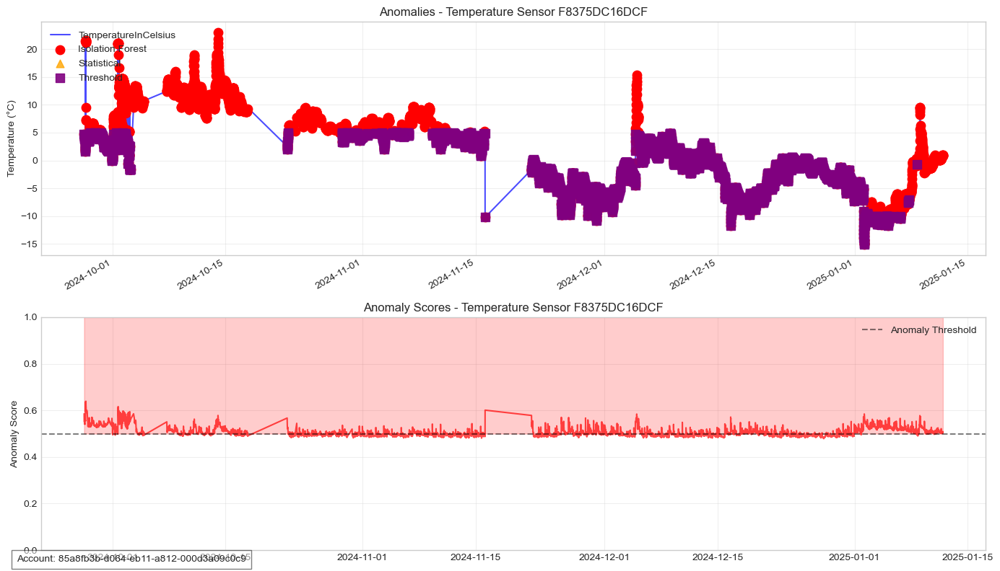

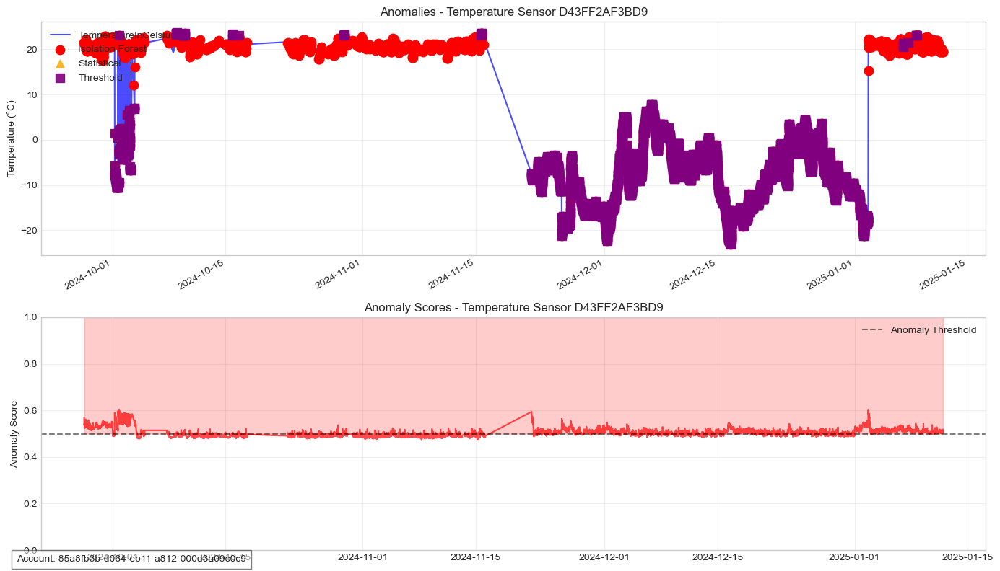

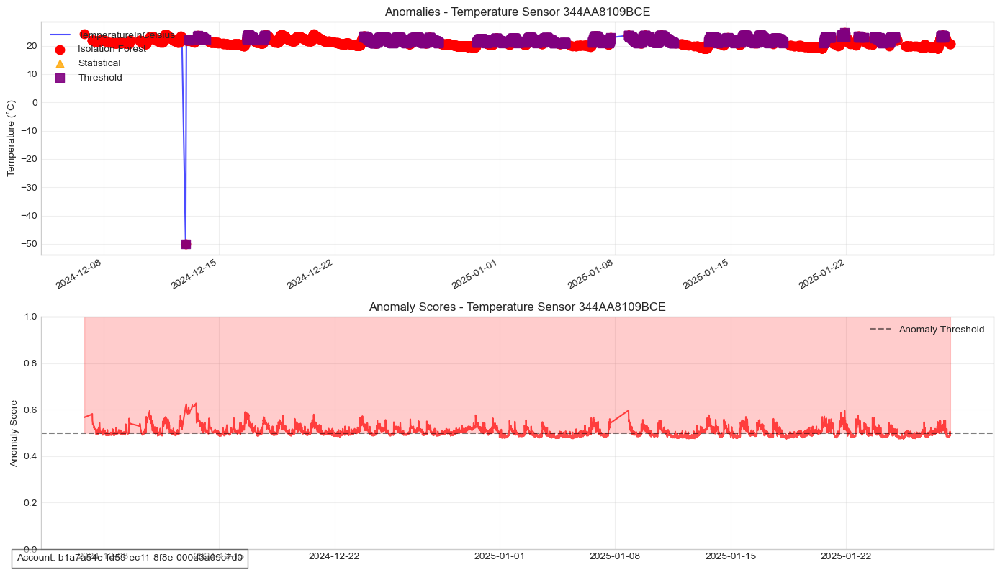

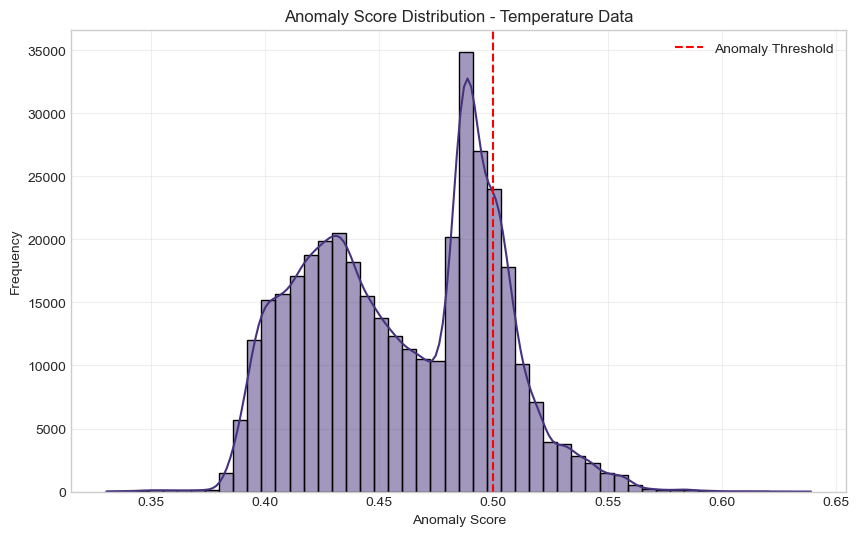

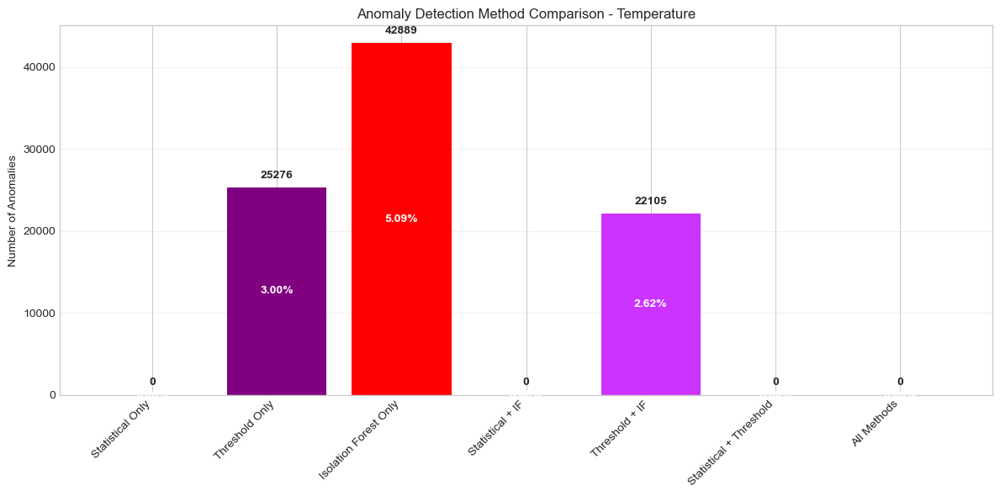

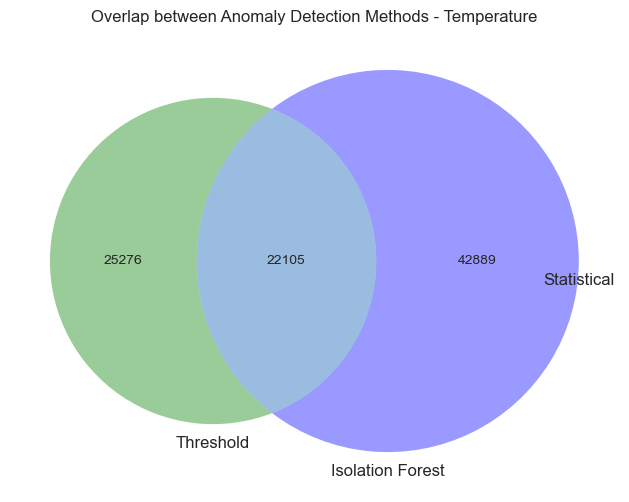

2025-03-20 21:37:17,406 - isolation_forest_detector - INFO - Starting Isolation Forest anomaly detection for battery data


Memory usage at after temperature isolation forest: 797.43 MB

Processing battery data with Isolation Forest (274,559 records)...
Memory usage at before battery isolation forest: 797.43 MB


Isolation Forest analysis: battery:   0%|          | 0/92 [00:00<?, ?it/s]2025-03-20 21:37:17,443 - isolation_forest_detector - ERROR - Error in Isolation Forest for sensor E44B1B1517F4: X has 9 features, but IsolationForest is expecting 7 features as input.
2025-03-20 21:37:17,468 - isolation_forest_detector - ERROR - Error in Isolation Forest for sensor A707544980DC: X has 9 features, but IsolationForest is expecting 7 features as input.
2025-03-20 21:37:17,489 - isolation_forest_detector - ERROR - Error in Isolation Forest for sensor 2C93E793C4D9: X has 9 features, but IsolationForest is expecting 7 features as input.
2025-03-20 21:37:17,505 - isolation_forest_detector - ERROR - Error in Isolation Forest for sensor 258790F60CDD: X has 9 features, but IsolationForest is expecting 7 features as input.
2025-03-20 21:37:17,519 - isolation_forest_detector - ERROR - Error in Isolation Forest for sensor E9700B30C7D7: X has 9 features, but IsolationForest is expecting 7 features as input.
2

Detection completed in 2.18 seconds


## Isolation Forest Results for Battery Data

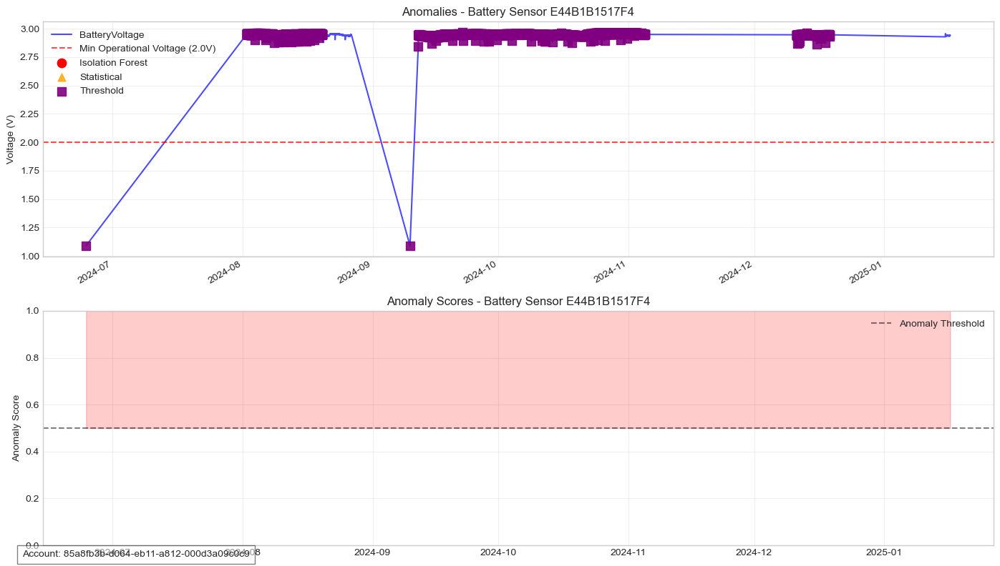

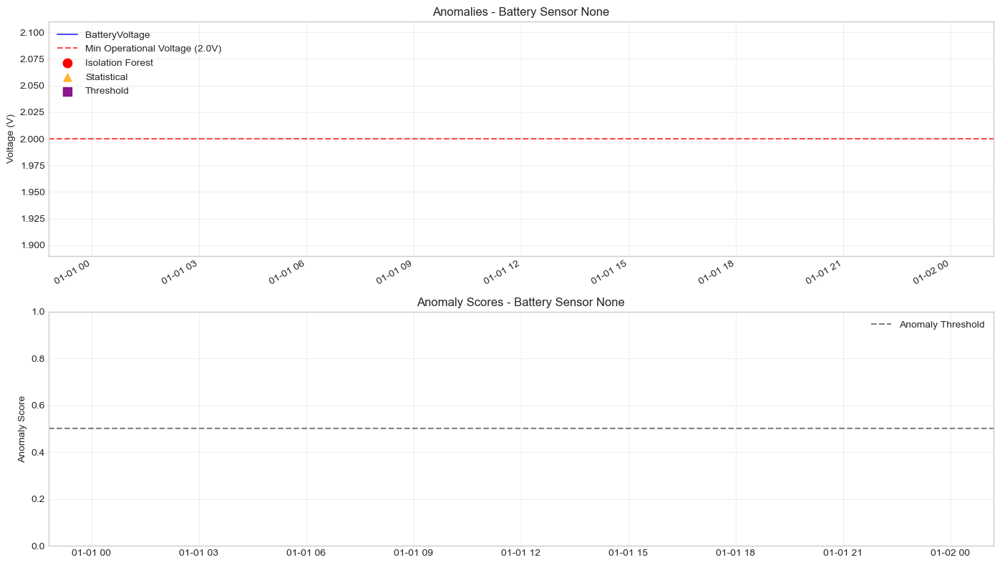

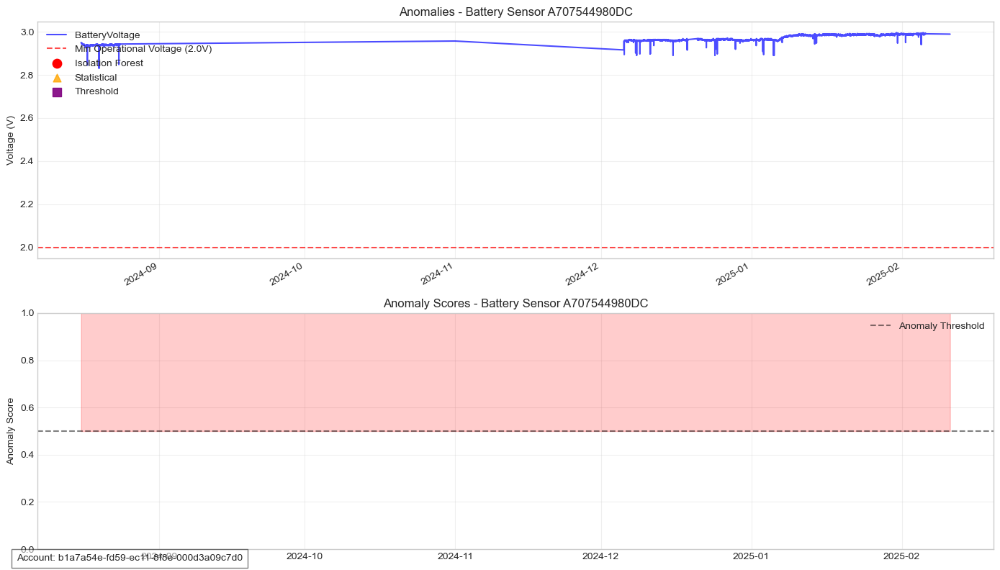

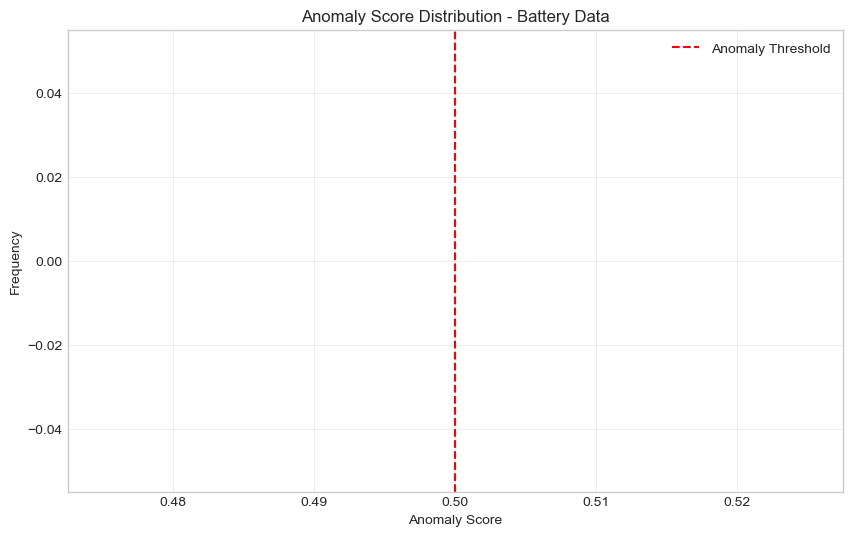

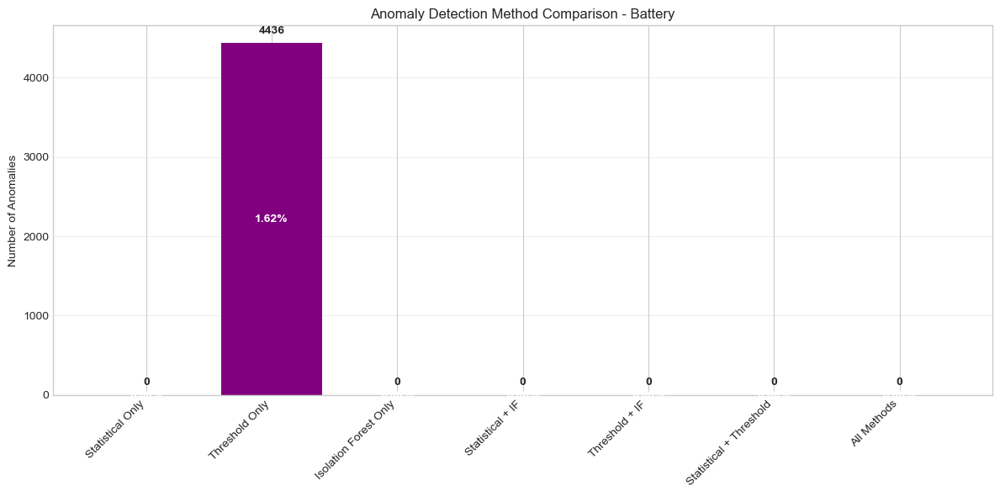

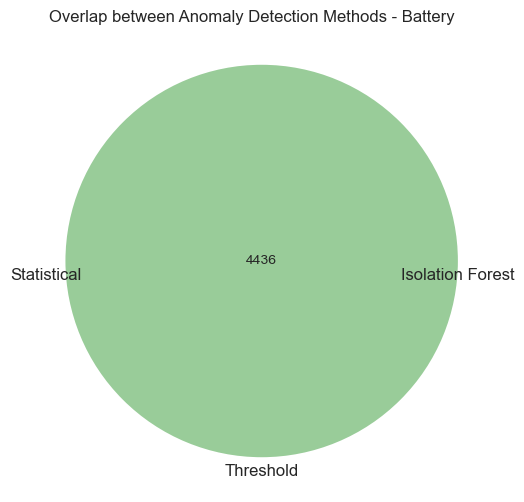

2025-03-20 21:37:29,029 - isolation_forest_detector - INFO - Starting Isolation Forest anomaly detection for vibration data


Memory usage at after battery isolation forest: 837.13 MB

Processing vibration data with Isolation Forest (3,237 records)...
Memory usage at before vibration isolation forest: 837.13 MB


Isolation Forest analysis: vibration:   0%|          | 0/17 [00:00<?, ?it/s]2025-03-20 21:37:29,047 - isolation_forest_detector - ERROR - Error in Isolation Forest for sensor C2D6DC5483EA: X has 11 features, but IsolationForest is expecting 9 features as input.
2025-03-20 21:37:29,058 - isolation_forest_detector - ERROR - Error in Isolation Forest for sensor AAD9621B13D6: X has 11 features, but IsolationForest is expecting 9 features as input.
2025-03-20 21:37:29,067 - isolation_forest_detector - ERROR - Error in Isolation Forest for sensor 546306B213D9: X has 11 features, but IsolationForest is expecting 9 features as input.
2025-03-20 21:37:29,074 - isolation_forest_detector - ERROR - Error in Isolation Forest for sensor 7D7E9E392CCD: X has 11 features, but IsolationForest is expecting 9 features as input.
2025-03-20 21:37:29,083 - isolation_forest_detector - ERROR - Error in Isolation Forest for sensor B7106DBE45F9: X has 11 features, but IsolationForest is expecting 9 features as i

Detection completed in 0.15 seconds


## Isolation Forest Results for Vibration Data

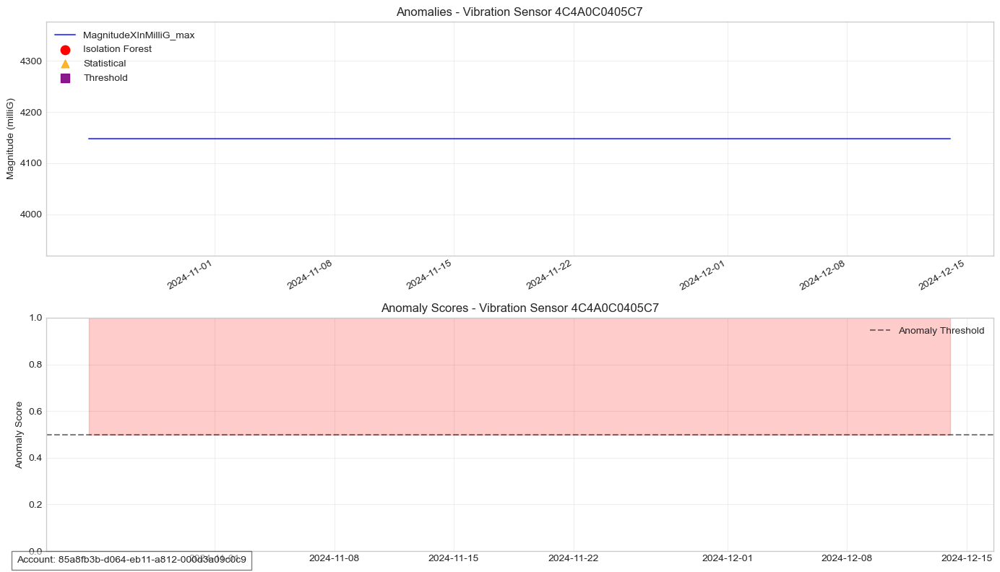

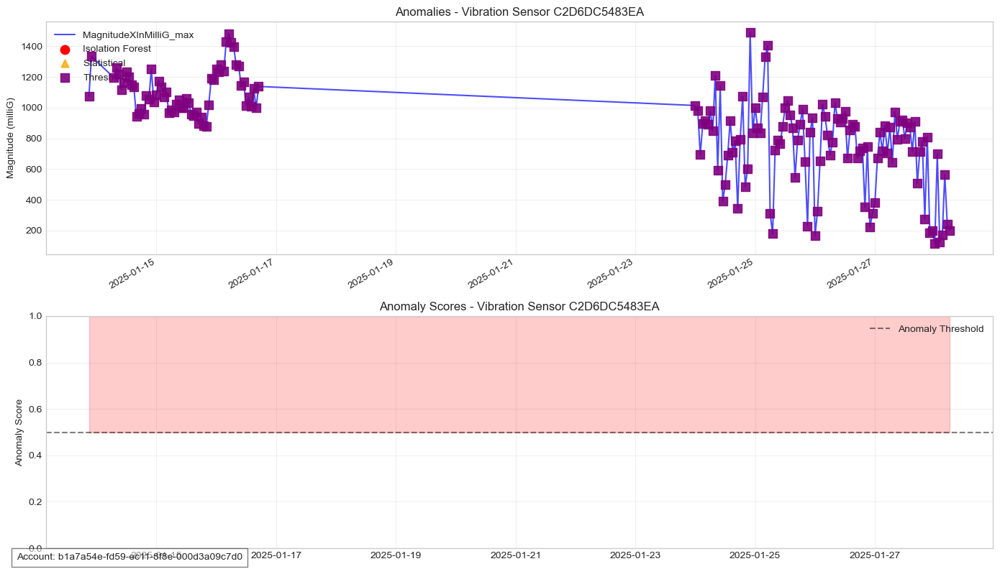

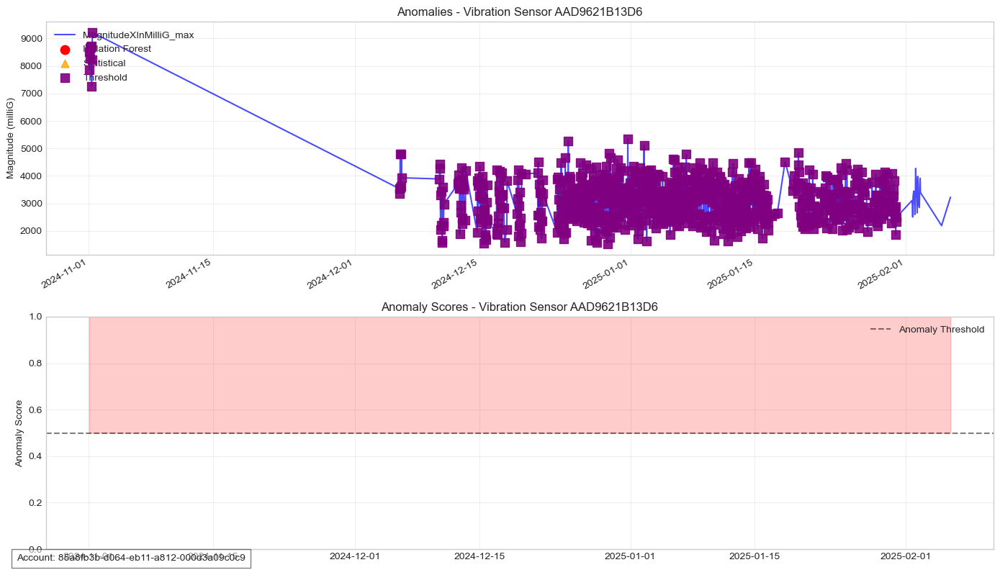

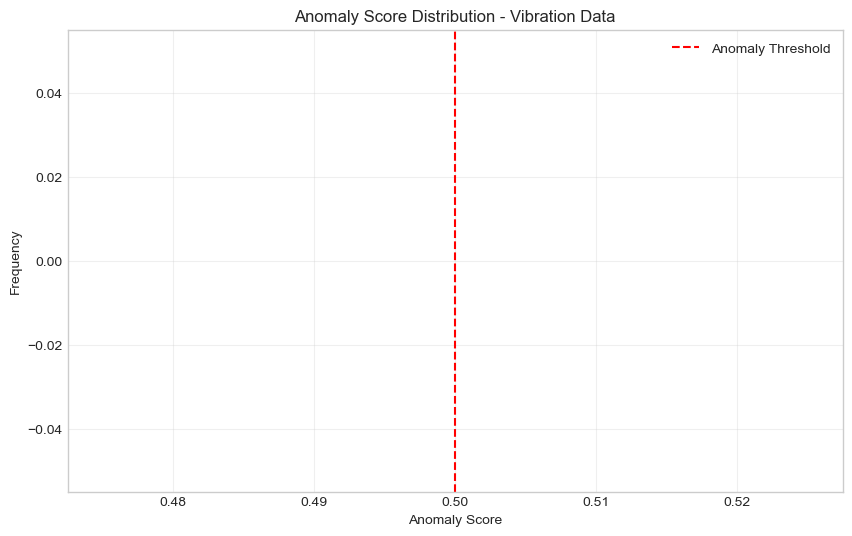

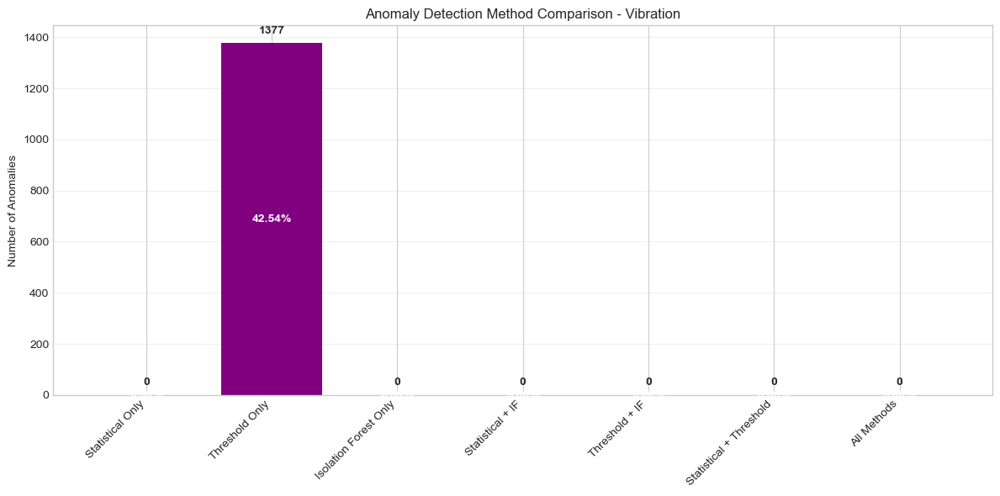

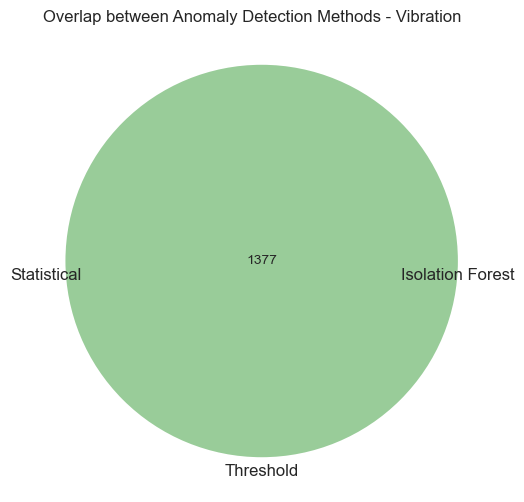

2025-03-20 21:37:38,071 - isolation_forest_detector - INFO - Starting Isolation Forest anomaly detection for motion data
2025-03-20 21:37:38,085 - isolation_forest_detector - INFO - Treating all motion events as anomalies
2025-03-20 21:37:38,086 - isolation_forest_detector - INFO - Isolation Forest detection results for motion: 844 anomalies found (100.00%)


Memory usage at after vibration isolation forest: 858.46 MB

Processing motion data with Isolation Forest (844 records)...
Memory usage at before motion isolation forest: 858.46 MB
Detection completed in 0.02 seconds


## Isolation Forest Results for Motion Data

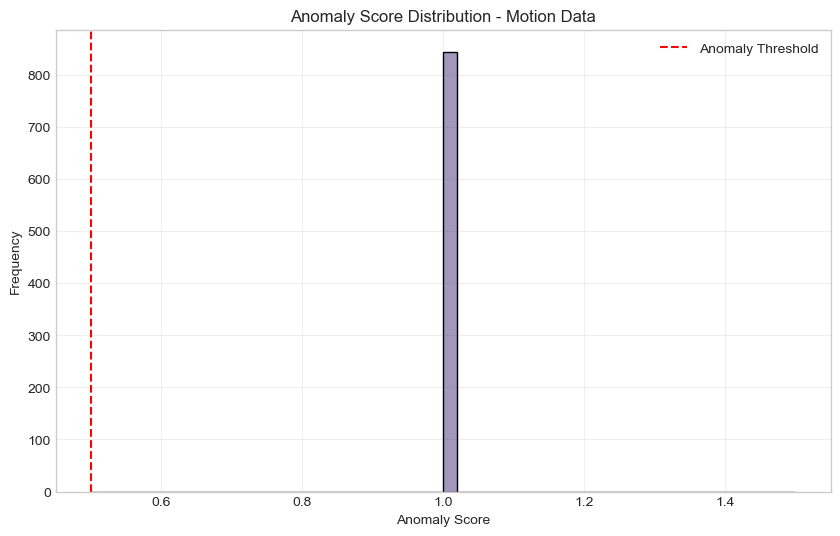

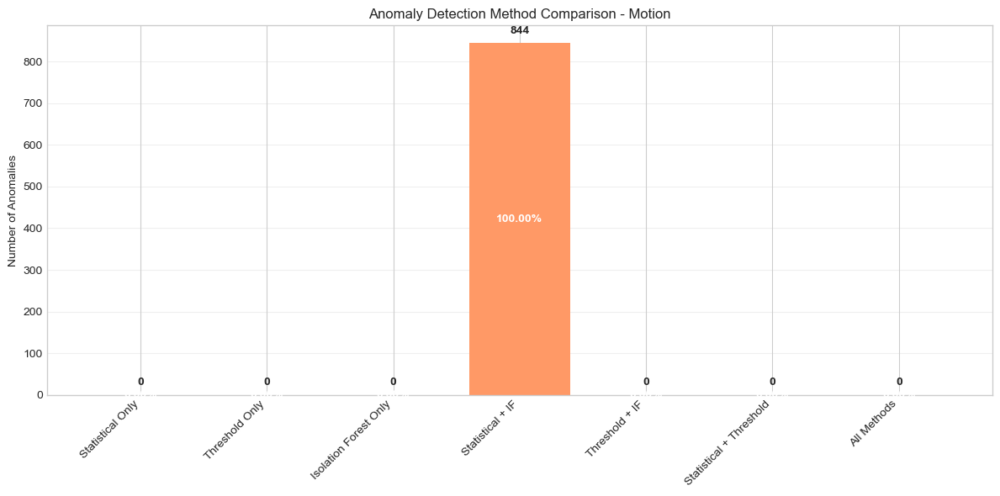

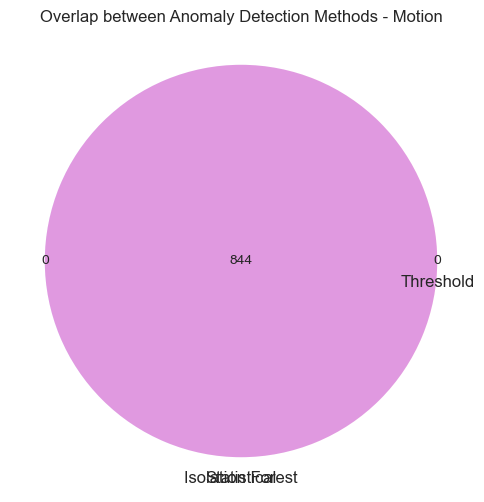

Memory usage at after motion isolation forest: 864.80 MB


2025-03-20 21:37:56,009 - isolation_forest_detector - INFO - Saved 211 Isolation Forest models to ./models



=== Isolation Forest Anomaly Detection Summary ===
Temperature: 64,994 isolation forest anomalies out of 842,711 records (7.71%)
  - Combined anomalies (all methods): 90,270 (10.71%)
Battery: 0 isolation forest anomalies out of 274,559 records (0.00%)
  - Combined anomalies (all methods): 4,436 (1.62%)
Vibration: 0 isolation forest anomalies out of 3,237 records (0.00%)
  - Combined anomalies (all methods): 1,377 (42.54%)
Motion: 844 isolation forest anomalies out of 844 records (100.00%)
  - Combined anomalies (all methods): 844 (100.00%)

Isolation Forest anomaly detection completed. Results saved for next pipeline stage.
Memory usage at final: 822.74 MB


In [119]:
# Isolation Forest implementation for anomaly detection
import time
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from tqdm import tqdm
import seaborn as sns
from IPython.display import display, Markdown
import gc

# Create directories for outputs
os.makedirs('./models', exist_ok=True)  # For saving trained models

# Initialize the Isolation Forest detector with optimized configuration
isolation_forest_detector = IsolationForestDetector(
    config={
        'temperature': {
            'contamination': 'auto',
            'n_estimators': 100,
            'random_state': 42,
            'batch_size': 50000,
            'n_jobs': -1,
            'features': {
                'include_hour': True,
                'include_day_of_week': True,
                'include_derivatives': True,
                'use_statistical_scores': True
            }
        },
        'battery': {
            'contamination': 'auto',
            'n_estimators': 100,
            'random_state': 42,
            'batch_size': 30000,
            'n_jobs': -1,
            'features': {
                'include_hour': False,
                'include_day_of_week': False,
                'include_derivatives': True,
                'use_statistical_scores': True
            }
        },
        'vibration': {
            'contamination': 0.1,  # Higher fixed rate due to higher anomaly density
            'n_estimators': 100,
            'random_state': 42,
            'batch_size': 5000,
            'n_jobs': -1,
            'features': {
                'include_hour': True,
                'include_day_of_week': True,
                'include_derivatives': False,
                'use_statistical_scores': True
            }
        },
        'motion': {
            'contamination': 'auto',
            'n_estimators': 100,
            'random_state': 42,
            'batch_size': 1000,
            'n_jobs': -1,
            'features': {
                'include_hour': False,
                'include_day_of_week': True,
                'include_derivatives': False,
                'use_statistical_scores': True
            }
        }
    }
)

# Function to track memory usage
def check_memory_usage(label):
    """Monitor memory usage at specific points"""
    import psutil
    process = psutil.Process(os.getpid())
    memory_info = process.memory_info()
    memory_mb = memory_info.rss / (1024 * 1024)
    print(f"Memory usage at {label}: {memory_mb:.2f} MB")

# Function to process and visualize each sensor type
def process_isolation_forest(df, sensor_type, sample_sensors=3):
    """Process sensor data with Isolation Forest and visualize results"""
    if df is None or df.empty:
        print(f"No {sensor_type} data to process")
        return None
    
    print(f"\nProcessing {sensor_type} data with Isolation Forest ({df.shape[0]:,} records)...")
    check_memory_usage(f"before {sensor_type} isolation forest")
    
    # Apply Isolation Forest detection
    start_time = time.time()
    try:
        result_df = isolation_forest_detector.detect(df, sensor_type)
        end_time = time.time()
        print(f"Detection completed in {end_time - start_time:.2f} seconds")
        
        # Visualize results
        visualize_isolation_forest_results(result_df, sensor_type, sample_sensors, output_dir='./visualizations')
        
        # Force garbage collection
        gc.collect()
        check_memory_usage(f"after {sensor_type} isolation forest")
        
        return result_df
    except Exception as e:
        print(f"Error processing {sensor_type} data with Isolation Forest: {str(e)}")
        import traceback
        traceback.print_exc()
        return df

# Print pipeline stage header
print("="*80)
print("Stage 2: Machine Learning-Based Anomaly Detection (Isolation Forest)")
print("="*80)
check_memory_usage("initial")

# Process each sensor type using the results from statistical detection
print("\nApplying Isolation Forest to data from previous stage...")

# Process temperature data
temp_if_anomalies = process_isolation_forest(temp_with_anomalies, 'temperature', sample_sensors=3)

# Process battery data
batt_if_anomalies = process_isolation_forest(batt_with_anomalies, 'battery', sample_sensors=3)

# Process vibration data
vib_if_anomalies = process_isolation_forest(vib_with_anomalies, 'vibration', sample_sensors=3)

# Process motion data
motn_if_anomalies = process_isolation_forest(motn_with_anomalies, 'motion', sample_sensors=3)

# Save models for future use
isolation_forest_detector.save_models(output_dir='./models')

# Display summary of results
print("\n=== Isolation Forest Anomaly Detection Summary ===")
for sensor_type, result_df in [
     ('temperature', temp_if_anomalies), 
     ('battery', batt_if_anomalies),
     ('vibration', vib_if_anomalies), 
     ('motion', motn_if_anomalies)
]:
    if result_df is not None:
        # Get stats from detector
        detection_stats = isolation_forest_detector.get_results(sensor_type)
        
        # Calculate additional stats
        if_anomaly_count = detection_stats.get('anomaly_count', 0)
        total_records = detection_stats.get('total_records', 0)
        
        # Calculate overall anomaly count (combining both methods)
        overall_anomalies = 0
        if 'statistical_anomaly' in result_df.columns and 'isolation_forest_anomaly' in result_df.columns:
            overall_anomalies = ((result_df['statistical_anomaly']) | 
                               (result_df['threshold_violation']) | 
                               (result_df['isolation_forest_anomaly'])).sum()
        
        print(f"{sensor_type.capitalize()}: {if_anomaly_count:,} isolation forest anomalies " + 
              f"out of {total_records:,} records " + 
              f"({if_anomaly_count/total_records*100:.2f}%)")
        
        if overall_anomalies > 0:
            print(f"  - Combined anomalies (all methods): {overall_anomalies:,} " +
                  f"({overall_anomalies/total_records*100:.2f}%)")

# Save detection results for the next stage
isolation_forest_results = {
    'temperature': temp_if_anomalies,
    'battery': batt_if_anomalies,
    'vibration': vib_if_anomalies,
    'motion': motn_if_anomalies
}

print("\nIsolation Forest anomaly detection completed. Results saved for next pipeline stage.")
check_memory_usage("final")

## Stage 3: Time Series Analysis for Anomaly Detection

Time series analysis takes a different approach to anomaly detection by modeling the expected temporal patterns in the data and identifying deviations from these patterns. This stage will:

1. Apply SARIMA (Seasonal AutoRegressive Integrated Moving Average) models for sensors with strong seasonal patterns
2. Use exponential smoothing for sensors with trend components
3. Detect anomalies based on prediction errors
4. Identify unusual temporal patterns that might be missed by previous stages

This approach is particularly valuable for:
- Detecting gradual drifts that don't trigger immediate thresholds
- Identifying contextual anomalies (values that are normal in some contexts but anomalous in others)
- Predicting future anomalies before they become critical

In [51]:
class TimeSeriesDetector:
    """
    Time series-based anomaly detection using forecasting models.
    
    This detector applies time series modeling to identify anomalies that deviate
    from expected temporal patterns. It uses:
    1. SARIMA for data with seasonal patterns
    2. Exponential smoothing for trend analysis
    3. Prediction error-based anomaly scoring
    
    Features:
    - Automatic model selection based on data characteristics
    - Adaptive prediction intervals
    - Memory-efficient batch processing
    - Integration with previous detection results
    """
    
    def __init__(self, config=None, logger=None):
        """
        Initialize the Time Series detector
        
        Parameters:
        -----------
        config : dict, optional
            Configuration parameters
        logger : logging.Logger, optional
            Logger for tracking operations
        """
        # Default configuration
        self.default_config = {
            'temperature': {
                'min_training_points': 48,  # Minimum points needed to train model (4 hours for 5-min data)
                'prediction_interval': 0.95,  # 95% prediction interval
                'error_threshold': 2.5,      # Z-score threshold for prediction errors
                'batch_size': 1000,          # Process in smaller batches due to model complexity
                'use_seasonal': True,        # Use seasonal models for temperature
                'seasonal_period': 288,      # Daily seasonality (5-min data: 12 * 24 = 288)
                'diff_order': 1,             # Differencing order for SARIMA
                'model_params': {
                    'auto_arima': False,     # Use auto_arima for model selection
                    'fallback_to_ets': True  # Fallback to ETS if SARIMA fails
                }
            },
            'battery': {
                'min_training_points': 24,   # Minimum points needed (6 hours for 15-min data)
                'prediction_interval': 0.90,  # 90% prediction interval
                'error_threshold': 3.0,       # Higher threshold for battery data
                'batch_size': 1000,
                'use_seasonal': False,        # Battery doesn't typically have strong seasonality
                'model_params': {
                    'auto_arima': False,      # Skip auto_arima for battery
                    'use_holt_winters': True  # Use Holt-Winters for battery (captures trend)
                }
            },
            'vibration': {
                'min_training_points': 24,    # Minimum points needed (1 day for hourly data)
                'prediction_interval': 0.98,  # 98% prediction interval (wider for vibration)
                'error_threshold': 3.5,       # Higher threshold for vibration data
                'batch_size': 500,
                'use_seasonal': True,
                'seasonal_period': 24,        # Daily seasonality (hourly data: 24)
                'model_params': {
                    'auto_arima': False,      # Skip auto_arima due to sparsity
                    'use_holt_winters': True  # Use Holt-Winters (handles irregularity better)
                }
            },
            'motion': {
                'min_training_points': 14,    # Minimum points needed (2 weeks for daily data)
                'prediction_interval': 0.95,  # 95% prediction interval
                'error_threshold': 3.0,       # Standard threshold
                'batch_size': 200,
                'use_seasonal': True,
                'seasonal_period': 7,         # Weekly seasonality (daily data: 7)
                'model_params': {
                    'auto_arima': False,      # Auto ARIMA too complex for sparse motion data
                    'use_holt_winters': True  # Use Holt-Winters with weekly seasonality
                }
            }
        }
        
        # Merge provided config with default
        self.config = config or self.default_config
        
        # Setup logging
        self.logger = logger or logging.getLogger('time_series_detector')
        
        # Store detection results
        self.results = {}
        
        # Dictionary to store trained models
        self.models = {}
    
    def _analyze_time_series(self, series, sensor_type):
        """
        Analyze time series to determine appropriate modeling approach
        
        Parameters:
        -----------
        series : pandas.Series
            Time series data to analyze
        sensor_type : str
            Type of sensor
            
        Returns:
        --------
        dict
            Time series characteristics
        """
        # Get configuration for this sensor type
        config = self.config[sensor_type]
        
        # Check if enough data points
        if len(series) < config.get('min_training_points', 48):
            return {'has_sufficient_data': False}
        
        try:
            # Basic statistics
            mean = series.mean()
            std = series.std()
            min_val = series.min()
            max_val = series.max()
            
            # Check for constant data
            if std == 0 or max_val == min_val:
                return {
                    'has_sufficient_data': True,
                    'is_constant': True,
                    'mean': mean
                }
            
            # Check stationarity using Augmented Dickey-Fuller test
            try:
                from statsmodels.tsa.stattools import adfuller
                adf_result = adfuller(series.dropna())
                is_stationary = adf_result[1] < 0.05  # p-value < 0.05 indicates stationarity
            except:
                # If ADF test fails, assume non-stationary
                is_stationary = False
            
            # Detect seasonality if enough data points
            has_seasonality = False
            seasonal_period = config.get('seasonal_period', 24)
            
            if len(series) >= 2 * seasonal_period and config.get('use_seasonal', False):
                # Calculate autocorrelation at the seasonal lag
                try:
                    from statsmodels.tsa.stattools import acf
                    acf_values = acf(series.dropna(), nlags=seasonal_period)
                    seasonal_correlation = acf_values[seasonal_period]
                    
                    # If autocorrelation at seasonal lag is strong, consider seasonal
                    has_seasonality = seasonal_correlation > 0.3
                except:
                    # If ACF calculation fails, use default configuration
                    has_seasonality = config.get('use_seasonal', False)
            
            return {
                'has_sufficient_data': True,
                'is_constant': False,
                'mean': mean,
                'std': std,
                'is_stationary': is_stationary,
                'has_seasonality': has_seasonality,
                'seasonal_period': seasonal_period
            }
        
        except Exception as e:
            self.logger.error(f"Error analyzing time series: {str(e)}")
            return {'has_sufficient_data': False, 'error': str(e)}
    
    def _train_forecast_model(self, series, sensor_type, characteristics=None):
        """
        Train an appropriate forecasting model based on time series characteristics
        
        Parameters:
        -----------
        series : pandas.Series
            Time series data
        sensor_type : str
            Type of sensor
        characteristics : dict, optional
            Precomputed time series characteristics
            
        Returns:
        --------
        tuple
            (model, model_type, fitted_values, prediction_intervals)
        """
        # Get configuration for this sensor type
        config = self.config[sensor_type]
        
        # Get time series characteristics if not provided
        if characteristics is None:
            characteristics = self._analyze_time_series(series, sensor_type)
        
        # Check if enough data
        if not characteristics.get('has_sufficient_data', False):
            return None, 'insufficient_data', None, None
        
        # If constant series, use simple mean model
        if characteristics.get('is_constant', False):
            mean = characteristics.get('mean', series.mean())
            fitted = pd.Series(mean, index=series.index)
            intervals = pd.DataFrame({
                'lower': [mean] * len(series),
                'upper': [mean] * len(series)
            }, index=series.index)
            return 'mean_model', 'constant', fitted, intervals
        
        # Get prediction interval
        prediction_interval = config.get('prediction_interval', 0.95)
        alpha = 1 - prediction_interval  # Significance level
        
        try:
            # If auto_arima is enabled and we have sufficient data, try SARIMA
            if config.get('model_params', {}).get('auto_arima', False) and len(series) >= 2 * config.get('seasonal_period', 24):
                try:
                    from pmdarima import auto_arima
                    
                    # For seasonal models
                    if characteristics.get('has_seasonality', False):
                        model = auto_arima(
                            series,
                            seasonal=True,
                            m=characteristics.get('seasonal_period', 24),
                            d=config.get('diff_order', 1),
                            D=1,  # Seasonal differencing
                            start_p=0, start_q=0,
                            max_p=2, max_q=2,
                            max_P=1, max_Q=1,
                            error_action='ignore',
                            suppress_warnings=True,
                            stepwise=True,
                            trace=False
                        )
                    else:
                        # For non-seasonal models
                        model = auto_arima(
                            series,
                            seasonal=False,
                            d=config.get('diff_order', 1),
                            start_p=0, start_q=0,
                            max_p=2, max_q=2,
                            error_action='ignore',
                            suppress_warnings=True,
                            stepwise=True,
                            trace=False
                        )
                    
                    # Fit model
                    fitted = pd.Series(model.predict_in_sample(), index=series.index)
                    
                    # Calculate prediction intervals
                    residuals = series - fitted
                    resid_std = residuals.std()
                    
                    # Using Gaussian assumptions for intervals
                    from scipy import stats
                    z_value = stats.norm.ppf(1 - alpha/2)
                    
                    # Create intervals
                    intervals = pd.DataFrame({
                        'lower': fitted - z_value * resid_std,
                        'upper': fitted + z_value * resid_std
                    })
                    
                    return model, 'sarima', fitted, intervals
                    
                except Exception as e:
                    self.logger.warning(f"Auto ARIMA failed: {str(e)}. Falling back to Holt-Winters.")
            
            # Fallback to simpler models (Holt-Winters or Simple Exponential Smoothing)
            if config.get('model_params', {}).get('use_holt_winters', True):
                # Use Holt-Winters for seasonal data or data with trend
                try:
                    from statsmodels.tsa.holtwinters import ExponentialSmoothing
                    
                    # Determine model parameters based on data characteristics
                    if characteristics.get('has_seasonality', False):
                        # Seasonal Holt-Winters
                        model = ExponentialSmoothing(
                            series,
                            trend='add',
                            seasonal='add',
                            seasonal_periods=characteristics.get('seasonal_period', 24),
                            damped=True
                        )
                    else:
                        # Holt-Winters without seasonality
                        model = ExponentialSmoothing(
                            series,
                            trend='add',
                            seasonal=None,
                            damped=True
                        )
                    
                    # Fit model
                    fit_result = model.fit(smoothing_level=0.3, smoothing_trend=0.1, optimized=False)
                    fitted = fit_result.fittedvalues
                    
                    # Calculate prediction intervals
                    residuals = series - fitted
                    resid_std = residuals.std()
                    
                    # Using Gaussian assumptions for intervals
                    from scipy import stats
                    z_value = stats.norm.ppf(1 - alpha/2)
                    
                    # Create intervals
                    intervals = pd.DataFrame({
                        'lower': fitted - z_value * resid_std,
                        'upper': fitted + z_value * resid_std
                    })
                    
                    return fit_result, 'holt_winters', fitted, intervals
                except Exception as e:
                    self.logger.warning(f"Holt-Winters failed: {str(e)}. Falling back to simple model.")
                
            # Try Simple Exponential Smoothing for simple patterns
            try:
                from statsmodels.tsa.holtwinters import SimpleExpSmoothing
                
                model = SimpleExpSmoothing(series)
                fit_result = model.fit(smoothing_level=0.3, optimized=False)
                fitted = fit_result.fittedvalues
                
                # Calculate prediction intervals
                residuals = series - fitted
                resid_std = residuals.std()
                
                # Using Gaussian assumptions for intervals
                from scipy import stats
                z_value = stats.norm.ppf(1 - alpha/2)
                
                # Create intervals
                intervals = pd.DataFrame({
                    'lower': fitted - z_value * resid_std,
                    'upper': fitted + z_value * resid_std
                })
                
                return fit_result, 'ses', fitted, intervals
            except Exception as e:
                self.logger.warning(f"Simple Exponential Smoothing failed: {str(e)}. Using moving average fallback.")
            
        except Exception as e:
            self.logger.error(f"Error training forecast model: {str(e)}")
        
        # Return a simple moving average model as ultimate fallback
        try:
            # Use a simple moving average
            window = min(len(series) // 4, 48)  # Use at most 1/4 of data points
            window = max(window, 3)  # At least 3 points
            
            fitted = series.rolling(window=window, min_periods=1).mean()
            
            # Calculate prediction intervals
            residuals = series - fitted
            resid_std = residuals.std()
            if pd.isna(resid_std) or resid_std == 0:
                # If std is NaN or 0, use a small default value
                resid_std = series.std() if series.std() > 0 else 0.01 * series.mean()
                if pd.isna(resid_std) or resid_std == 0:
                    resid_std = 0.01  # Last resort default
            
            # Using Gaussian assumptions for intervals
            from scipy import stats
            z_value = stats.norm.ppf(1 - alpha/2)
            
            # Create intervals
            intervals = pd.DataFrame({
                'lower': fitted - z_value * resid_std,
                'upper': fitted + z_value * resid_std
            })
            
            return 'moving_average', 'fallback', fitted, intervals
            
        except Exception as e:
            self.logger.error(f"Even fallback model failed: {str(e)}")
            
            # Return a constant model as last resort
            try:
                mean_value = series.mean()
                if pd.isna(mean_value):
                    mean_value = 0
                
                fitted = pd.Series(mean_value, index=series.index)
                intervals = pd.DataFrame({
                    'lower': [mean_value * 0.9] * len(series),
                    'upper': [mean_value * 1.1] * len(series)
                }, index=series.index)
                
                return 'constant', 'last_resort', fitted, intervals
            except:
                # If everything fails, return None
                return None, 'failed', None, None
    
    def detect(self, df, sensor_type):
        """
        Detect anomalies using time series forecasting models
        
        Parameters:
        -----------
        df : pandas.DataFrame
            Sensor data with previous anomaly detection results
        sensor_type : str
            Type of sensor
            
        Returns:
        --------
        pandas.DataFrame
            Data with time series anomaly flags and scores
        """
        if df.empty:
            return df
        
        self.logger.info(f"Starting time series anomaly detection for {sensor_type} data")
        
        # Create a copy to avoid warnings
        df = df.copy()
        
        # Get value column
        value_col, _ = self._get_columns(df, sensor_type)
        
        if not value_col:
            self.logger.error(f"Could not determine value column for {sensor_type}")
            return df
        
        # Add time series anomaly columns
        df['time_series_anomaly'] = False
        df['forecast_error'] = np.nan
        df['forecast_lower'] = np.nan
        df['forecast_upper'] = np.nan
        df['forecasted_value'] = np.nan
        
        # Get configuration for this sensor type
        config = self.config[sensor_type]
        batch_size = config.get('batch_size', 1000)
        error_threshold = config.get('error_threshold', 3.0)
        
        # Process each sensor individually
        total_anomalies = 0
        
        for sensor_id in tqdm(df['SensorId'].unique(), desc=f"Time series analysis: {sensor_type}"):
            # Get data for this sensor
            sensor_mask = df['SensorId'] == sensor_id
            sensor_data = df[sensor_mask].copy()
            
            # Skip if too few data points
            min_points = config.get('min_training_points', 48)
            if len(sensor_data) < min_points:
                self.logger.debug(f"Insufficient data for sensor {sensor_id}: {len(sensor_data)} < {min_points}")
                continue
            
            # Ensure data is sorted by time
            if 'EventTimeUtc' in sensor_data.columns:
                sensor_data = sensor_data.sort_values('EventTimeUtc')
            
            # Check if we have saved model for this sensor
            model_key = f"{sensor_type}_{sensor_id}"
            
            # Try to use saved model if available
            if self.config[sensor_type].get('model_params', {}).get('reuse_models', True) and model_key in self.models:
                try:
                    # Use previously trained model for faster processing
                    self.logger.debug(f"Using previously trained model for {sensor_id}")
                    
                    anomaly_count = self._apply_saved_model(
                        df=df, 
                        sensor_data=sensor_data,
                        sensor_mask=sensor_mask,
                        value_col=value_col,
                        model_key=model_key,
                        error_threshold=error_threshold
                    )
                    total_anomalies += anomaly_count
                    continue
                except Exception as e:
                    self.logger.warning(f"Error using saved model for {sensor_id}: {str(e)}. Training new model.")
            
            # Process in batches if large, otherwise process directly
            if len(sensor_data) > batch_size:
                anomaly_count = self._process_sensor_in_batches(
                    df=df,
                    sensor_data=sensor_data,
                    sensor_mask=sensor_mask,
                    value_col=value_col,
                    sensor_id=sensor_id,
                    sensor_type=sensor_type
                )
            else:
                anomaly_count = self._process_sensor_directly(
                    df=df,
                    sensor_data=sensor_data,
                    sensor_mask=sensor_mask,
                    value_col=value_col,
                    sensor_id=sensor_id,
                    sensor_type=sensor_type
                )
            
            total_anomalies += anomaly_count
        
        # Calculate overall stats
        anomaly_count = df['time_series_anomaly'].sum()
        
        self.logger.info(
            f"Time series detection results for {sensor_type}: "
            f"{anomaly_count} anomalies found ({anomaly_count/len(df)*100:.2f}%)"
        )
        
        # Store results
        self.results[sensor_type] = {
            'anomaly_count': int(anomaly_count),
            'total_records': len(df),
            'anomaly_percentage': float(anomaly_count/len(df)*100),
            'value_column': value_col
        }
        
        return df
    
    def _apply_saved_model(self, df, sensor_data, sensor_mask, value_col, model_key, error_threshold):
        """
        Apply a previously trained model to detect anomalies
        
        Parameters:
        -----------
        df : pandas.DataFrame
            Full dataframe (to be updated)
        sensor_data : pandas.DataFrame
            Data for a specific sensor
        sensor_mask : pandas.Series
            Boolean mask for this sensor in the full dataframe
        value_col : str
            Value column name
        model_key : str
            Key for retrieving the saved model
        error_threshold : float
            Threshold for anomaly detection
            
        Returns:
        --------
        int
            Number of anomalies detected
        """
        # Retrieve saved model info
        model_info = self.models[model_key]
        model = model_info.get('model')
        model_type = model_info.get('model_type', 'unknown')
        characteristics = model_info.get('characteristics', {})
        
        if model_type == 'constant':
            # For constant models, just use the mean as prediction
            mean_value = characteristics.get('mean', sensor_data[value_col].mean())
            fitted = pd.Series(mean_value, index=sensor_data.index)
            
            # Calculate standard deviation for intervals
            std_value = sensor_data[value_col].std()
            if pd.isna(std_value) or std_value == 0:
                std_value = 0.01 * abs(mean_value) if mean_value != 0 else 0.01
            
            # Prediction intervals
            from scipy import stats
            alpha = 0.05  # 95% interval
            z_value = stats.norm.ppf(1 - alpha/2)
            
            lower = fitted - z_value * std_value
            upper = fitted + z_value * std_value
            
        elif model_type == 'holt_winters' or model_type == 'ses':
            # For Holt-Winters or SES models, use in-sample prediction
            fitted = model.fittedvalues
            
            # Make sure we only use the last part that matches our sensor_data
            if len(fitted) > len(sensor_data):
                fitted = fitted.iloc[-len(sensor_data):]
            
            # Calculate prediction intervals
            residuals = sensor_data[value_col] - fitted
            resid_std = residuals.std()
            if pd.isna(resid_std) or resid_std == 0:
                resid_std = 0.01 * abs(fitted.mean()) if fitted.mean() != 0 else 0.01
            
            # Using Gaussian assumptions for intervals
            from scipy import stats
            alpha = 0.05  # 95% interval
            z_value = stats.norm.ppf(1 - alpha/2)
            
            lower = fitted - z_value * resid_std
            upper = fitted + z_value * resid_std
            
        elif model_type == 'moving_average':
            # For moving average models, recalculate
            window = min(len(sensor_data) // 4, 48)
            window = max(window, 3)
            
            fitted = sensor_data[value_col].rolling(window=window, min_periods=1).mean()
            
            # Calculate prediction intervals
            residuals = sensor_data[value_col] - fitted
            resid_std = residuals.std()
            if pd.isna(resid_std) or resid_std == 0:
                resid_std = 0.01 * abs(fitted.mean()) if fitted.mean() != 0 else 0.01
            
            # Using Gaussian assumptions for intervals
            from scipy import stats
            alpha = 0.05  # 95% interval
            z_value = stats.norm.ppf(1 - alpha/2)
            
            lower = fitted - z_value * resid_std
            upper = fitted + z_value * resid_std
            
        else:
            # For unknown model types or SARIMA, use simple moving average as fallback
            window = min(len(sensor_data) // 4, 48)
            window = max(window, 3)
            
            fitted = sensor_data[value_col].rolling(window=window, min_periods=1).mean()
            
            # Calculate prediction intervals
            residuals = sensor_data[value_col] - fitted
            resid_std = residuals.std()
            if pd.isna(resid_std) or resid_std == 0:
                resid_std = 0.01 * abs(fitted.mean()) if fitted.mean() != 0 else 0.01
            
            # Using Gaussian assumptions for intervals
            from scipy import stats
            alpha = 0.05  # 95% interval
            z_value = stats.norm.ppf(1 - alpha/2)
            
            lower = fitted - z_value * resid_std
            upper = fitted + z_value * resid_std
        
        # Create DataFrame for intervals
        intervals = pd.DataFrame({
            'lower': lower,
            'upper': upper
        })
        
        # Calculate forecast errors
        errors = sensor_data[value_col] - fitted
        
        # Normalize errors by standard deviation
        error_std = errors.std()
        if error_std == 0 or pd.isna(error_std):
            error_std = 0.01 * abs(sensor_data[value_col].mean()) if sensor_data[value_col].mean() != 0 else 0.01
        
        normalized_errors = errors / error_std
        
        # Detect anomalies based on normalized errors
        anomalies = abs(normalized_errors) > error_threshold
        
        # Also detect anomalies based on prediction intervals
        interval_anomalies = (sensor_data[value_col] < intervals['lower']) | (sensor_data[value_col] > intervals['upper'])
        
        # Combine both anomaly detection methods
        combined_anomalies = anomalies | interval_anomalies
        
        # Update main dataframe with results
        sensor_indices = df[sensor_mask].index
        df.loc[sensor_indices, 'time_series_anomaly'] = combined_anomalies.values
        df.loc[sensor_indices, 'forecast_error'] = normalized_errors.values
        df.loc[sensor_indices, 'forecast_lower'] = intervals['lower'].values
        df.loc[sensor_indices, 'forecast_upper'] = intervals['upper'].values
        df.loc[sensor_indices, 'forecasted_value'] = fitted.values
        
        return combined_anomalies.sum()
    
    def _process_sensor_directly(self, df, sensor_data, sensor_mask, value_col, sensor_id, sensor_type):
        """
        Process a sensor's data directly using time series modeling
        
        Parameters:
        -----------
        df : pandas.DataFrame
            Full dataframe (to be updated)
        sensor_data : pandas.DataFrame
            Data for a specific sensor
        sensor_mask : pandas.Series
            Boolean mask for this sensor in the full dataframe
        value_col : str
            Value column name
        sensor_id : str
            Sensor ID
        sensor_type : str
            Type of sensor
            
        Returns:
        --------
        int
            Number of anomalies detected
        """
        try:
            # Extract the value series
            series = sensor_data[value_col]
            
            # Analyze time series characteristics
            characteristics = self._analyze_time_series(series, sensor_type)
            
            # Train appropriate model
            model, model_type, fitted, intervals = self._train_forecast_model(
                series, sensor_type, characteristics
            )
            
            # If model failed, skip
            if model_type == 'failed' or model_type == 'insufficient_data':
                return 0
            
            # Save model for later use
            model_key = f"{sensor_type}_{sensor_id}"
            self.models[model_key] = {
                'model': model,
                'model_type': model_type,
                'characteristics': characteristics
            }
            
            # Calculate forecast errors
            errors = series - fitted
            
            # Normalize errors by standard deviation
            error_std = errors.std()
            if error_std == 0 or pd.isna(error_std):
                error_std = 0.01 * abs(series.mean()) if series.mean() != 0 else 0.01
            
            normalized_errors = errors / error_std
            
            # Get error threshold
            config = self.config[sensor_type]
            error_threshold = config.get('error_threshold', 3.0)
            
            # Detect anomalies based on normalized errors
            anomalies = abs(normalized_errors) > error_threshold
            
            # Also detect anomalies based on prediction intervals
            interval_anomalies = (series < intervals['lower']) | (series > intervals['upper'])
            
            # Combine both anomaly detection methods
            combined_anomalies = anomalies | interval_anomalies
            
            # Update main dataframe with results
            sensor_indices = df[sensor_mask].index
            df.loc[sensor_indices, 'time_series_anomaly'] = combined_anomalies.values
            df.loc[sensor_indices, 'forecast_error'] = normalized_errors.values
            df.loc[sensor_indices, 'forecast_lower'] = intervals['lower'].values
            df.loc[sensor_indices, 'forecast_upper'] = intervals['upper'].values
            df.loc[sensor_indices, 'forecasted_value'] = fitted.values
            
            return combined_anomalies.sum()
            
        except Exception as e:
            self.logger.error(f"Error in time series modeling for sensor {sensor_id}: {str(e)}")
            return 0
    
    def _process_sensor_in_batches(self, df, sensor_data, sensor_mask, value_col, sensor_id, sensor_type):
        """
        Process a sensor's data in batches for memory efficiency
        
        Parameters:
        -----------
        df : pandas.DataFrame
            Full dataframe (to be updated)
        sensor_data : pandas.DataFrame
            Data for a specific sensor
        sensor_mask : pandas.Series
            Boolean mask for this sensor in the full dataframe
        value_col : str
            Value column name
        sensor_id : str
            Sensor ID
        sensor_type : str
            Type of sensor
            
        Returns:
        --------
        int
            Number of anomalies detected
        """
        try:
            # Ensure data is sorted by time
            if 'EventTimeUtc' in sensor_data.columns:
                sensor_data = sensor_data.sort_values('EventTimeUtc')
            
            # Extract the value series
            series = sensor_data[value_col]
            
            # Get configuration
            config = self.config[sensor_type]
            batch_size = config.get('batch_size', 1000)
            min_training = config.get('min_training_points', 48)
            
            # Calculate number of batches
            total_points = len(series)
            n_batches = (total_points - min_training) // batch_size + 1
            # Ensure we have at least one batch
            n_batches = max(1, n_batches)
            
            # Arrays to store results
            all_anomalies = np.zeros(total_points, dtype=bool)
            all_errors = np.full(total_points, np.nan)
            all_lower = np.full(total_points, np.nan)
            all_upper = np.full(total_points, np.nan)
            all_fitted = np.full(total_points, np.nan)
            
            # Initialize the errors variable to prevent UnboundLocalError
            errors = pd.Series(np.zeros(min_training))
            
            # Process first batch differently to establish a baseline model
            first_batch_size = min(total_points, min_training * 2)
            first_batch = series.iloc[:first_batch_size]
            
            # Analyze and establish model for first batch
            characteristics = self._analyze_time_series(first_batch, sensor_type)
            model, model_type, fitted_first, intervals_first = self._train_forecast_model(
                first_batch, sensor_type, characteristics
            )
            
            # If model failed, try a simpler approach
            if model_type == 'failed' or model_type == 'insufficient_data':
                # Use a simple moving average as fallback
                window_size = min(len(first_batch) // 4, 10)
                window_size = max(window_size, 3)  # At least 3 points
                
                # Calculate moving average
                fitted_first = first_batch.rolling(window=window_size, min_periods=1).mean()
                
                # Estimated standard deviation for intervals
                std_val = first_batch.std()
                if pd.isna(std_val) or std_val == 0:
                    std_val = 0.01 * abs(first_batch.mean()) if first_batch.mean() != 0 else 0.01
                
                # Create prediction intervals
                lower = fitted_first - 2 * std_val
                upper = fitted_first + 2 * std_val
                intervals_first = pd.DataFrame({
                    'lower': lower,
                    'upper': upper
                })
                
                model_type = 'moving_average_fallback'
            
            # Store results for first batch
            all_fitted[:first_batch_size] = fitted_first.values
            all_lower[:first_batch_size] = intervals_first['lower'].values
            all_upper[:first_batch_size] = intervals_first['upper'].values
            
            # Calculate errors for first batch
            errors = first_batch - fitted_first
            
            # Normalize errors by standard deviation
            error_std = errors.std()
            if pd.isna(error_std) or error_std == 0:
                # Use a small default value if std is 0
                error_std = 0.01 * abs(first_batch.mean()) if first_batch.mean() != 0 else 0.01
            
            normalized_errors = errors / error_std
            all_errors[:first_batch_size] = normalized_errors.values
            
            # Detect anomalies for first batch
            error_threshold = config.get('error_threshold', 3.0)
            anomalies_first = abs(normalized_errors) > error_threshold
            interval_anomalies_first = (first_batch < intervals_first['lower']) | (first_batch > intervals_first['upper'])
            combined_anomalies_first = anomalies_first | interval_anomalies_first
            
            all_anomalies[:first_batch_size] = combined_anomalies_first.values
            
            # Save model for future use
            model_key = f"{sensor_type}_{sensor_id}"
            self.models[model_key] = {
                'model': model if model_type != 'failed' else 'moving_average_fallback',
                'model_type': model_type,
                'characteristics': characteristics
            }
            
            # Process remaining data in sliding window batches
            if total_points > first_batch_size:
                window_size = min(batch_size * 3, first_batch_size * 2)  # Larger window for stability
                
                for i in range(first_batch_size, total_points, batch_size):
                    # Define batch indices
                    start_idx = max(0, i - window_size // 2)
                    end_idx = min(i + batch_size, total_points)
                    training_end = min(i, total_points)
                    
                    # Extract training data (up to current position)
                    train_data = series.iloc[start_idx:training_end]
                    
                    # Extract batch data to predict
                    batch_data = series.iloc[i:end_idx]
                    
                    # Skip if no batch data
                    if len(batch_data) == 0:
                        continue
                    
                    try:
                        # Reuse model characteristics but retrain on latest window
                        model, model_type, fitted, intervals = self._train_forecast_model(
                            train_data, sensor_type, characteristics
                        )
                        
                        # If model failed, use a simple approach
                        if model_type == 'failed':
                            # Use a simple moving average
                            window = min(len(train_data) // 4, 48)
                            window = max(window, 3)  # At least 3 points
                            fitted = train_data.rolling(window=window, min_periods=1).mean()
                            
                            # Calculate errors
                            errors = train_data - fitted
                            error_std = errors.std()
                            if pd.isna(error_std) or error_std == 0:
                                error_std = 0.01 * abs(train_data.mean()) if train_data.mean() != 0 else 0.01
                            
                            # Generate prediction intervals
                            from scipy import stats
                            alpha = 1 - config.get('prediction_interval', 0.95)
                            z_value = stats.norm.ppf(1 - alpha/2)
                            lower = fitted - z_value * error_std
                            upper = fitted + z_value * error_std
                            intervals = pd.DataFrame({'lower': lower, 'upper': upper})
                        
                        # Now forecast for the batch data
                        # For simplicity, we'll just use the last fitted point for the entire batch
                        forecast_value = fitted.iloc[-1]
                        forecast_lower = intervals['lower'].iloc[-1]
                        forecast_upper = intervals['upper'].iloc[-1]
                        
                        # Store forecasted values
                        all_fitted[i:end_idx] = forecast_value
                        all_lower[i:end_idx] = forecast_lower
                        all_upper[i:end_idx] = forecast_upper
                        
                        # Calculate errors
                        batch_errors = batch_data - forecast_value
                        
                        # Normalize errors
                        error_std = errors.std()
                        if pd.isna(error_std) or error_std == 0:
                            error_std = 0.01 * abs(train_data.mean()) if train_data.mean() != 0 else 0.01
                        
                        normalized_batch_errors = batch_errors / error_std
                        all_errors[i:end_idx] = normalized_batch_errors.values
                        
                        # Detect anomalies
                        batch_anomalies = abs(normalized_batch_errors) > error_threshold
                        interval_anomalies = (batch_data < forecast_lower) | (batch_data > forecast_upper)
                        combined_anomalies = batch_anomalies | interval_anomalies
                        
                        all_anomalies[i:end_idx] = combined_anomalies.values
                    
                    except Exception as e:
                        self.logger.warning(f"Error processing batch {i}-{end_idx}: {str(e)}")
                        # Use last valid forecast as fallback
                        if i > 0 and pd.notna(all_fitted[i-1]):
                            all_fitted[i:end_idx] = all_fitted[i-1]
                            all_lower[i:end_idx] = all_lower[i-1]
                            all_upper[i:end_idx] = all_upper[i-1]
                            
                            # Calculate simple errors based on last forecast
                            simple_errors = batch_data - all_fitted[i-1]
                            if error_std == 0 or pd.isna(error_std):
                                error_std = 0.01
                            simple_normalized_errors = simple_errors / error_std
                            all_errors[i:end_idx] = simple_normalized_errors.values
                            
                            # Detect simple anomalies
                            simple_anomalies = abs(simple_normalized_errors) > error_threshold
                            simple_interval_anomalies = (batch_data < all_lower[i-1]) | (batch_data > all_upper[i-1])
                            simple_combined_anomalies = simple_anomalies | simple_interval_anomalies
                            all_anomalies[i:end_idx] = simple_combined_anomalies.values
                    
                    # Force garbage collection
                    gc.collect()
            
            # Update main dataframe with results
            sensor_indices = df[sensor_mask].index
            df.loc[sensor_indices, 'time_series_anomaly'] = all_anomalies
            df.loc[sensor_indices, 'forecast_error'] = all_errors
            df.loc[sensor_indices, 'forecast_lower'] = all_lower
            df.loc[sensor_indices, 'forecast_upper'] = all_upper
            df.loc[sensor_indices, 'forecasted_value'] = all_fitted
            
            return int(all_anomalies.sum())
            
        except Exception as e:
            self.logger.error(f"Error in batch time series processing for sensor {sensor_id}: {str(e)}")
            import traceback
            traceback.print_exc()
            return 0
            
    def _get_columns(self, df, sensor_type):
        """
        Determine value and threshold columns based on sensor type
        
        Parameters:
        -----------
        df : pandas.DataFrame
            Sensor data
        sensor_type : str
            Type of sensor
            
        Returns:
        --------
        tuple
            (value_column, [threshold_columns])
        """
        # Find value column
        if sensor_type == 'temperature':
            value_col = 'TemperatureInCelsius'
            threshold_cols = [col for col in df.columns if 'Temperature' in col and 'Threshold' in col]
        
        elif sensor_type == 'battery':
            value_col = 'BatteryVoltage'
            threshold_cols = [col for col in df.columns if 'Battery' in col and 'Threshold' in col]
        
        elif sensor_type == 'vibration':
            # Find the main magnitude column (focus on RMS as requested)
            magnitude_cols = [col for col in df.columns if 'Magnitude' in col and 'Threshold' not in col]
            rms_cols = [col for col in magnitude_cols if 'RMS' in col]
            
            value_col = rms_cols[0] if rms_cols else (magnitude_cols[0] if magnitude_cols else None)
            threshold_cols = [col for col in df.columns if 'Magnitude' in col and 'Threshold' in col]
        
        elif sensor_type == 'motion':
            # Try different column names for motion data
            if 'max_magnitude' in df.columns:
                value_col = 'max_magnitude'
            elif 'daily_event_count' in df.columns:
                value_col = 'daily_event_count'
            else:
                # Try to find any magnitude column
                magnitude_cols = [col for col in df.columns if 'Magnitude' in col and 'Threshold' not in col]
                value_col = magnitude_cols[0] if magnitude_cols else None
            
            threshold_cols = [col for col in df.columns if 'threshold' in col.lower()]
        
        else:
            self.logger.error(f"Unsupported sensor type: {sensor_type}")
            return None, []
        
        # Verify value column exists
        if value_col and value_col not in df.columns:
            self.logger.error(f"Value column '{value_col}' not found in {sensor_type} data")
            return None, []
        
        return value_col, threshold_cols
    
    def get_results(self, sensor_type=None):
        """
        Get detection results
        
        Parameters:
        -----------
        sensor_type : str, optional
            Type of sensor to get results for
            
        Returns:
        --------
        dict
            Detection results
        """
        if sensor_type:
            return self.results.get(sensor_type, {})
        return self.results
    
    def save_models(self, output_dir='./models', force=False):
        """
        Save trained models to disk
        
        Parameters:
        -----------
        output_dir : str
            Directory to save models
        force : bool
            Force saving even if models already exist
        """
        import os
        import pickle
        
        os.makedirs(output_dir, exist_ok=True)
        
        for model_key, model_info in self.models.items():
            output_path = os.path.join(output_dir, f"time_series_{model_key}.pkl")
            
            # Check if model already exists
            if not force and os.path.exists(output_path):
                self.logger.info(f"Model {model_key} already exists at {output_path}, skipping. Use force=True to overwrite.")
                continue
                
            try:
                with open(output_path, 'wb') as f:
                    pickle.dump(model_info, f)
                self.logger.info(f"Saved model {model_key} to {output_path}")
            except Exception as e:
                self.logger.error(f"Error saving model {model_key}: {str(e)}")
    
    def load_models(self, input_dir='./models'):
        """
        Load trained models from disk
        
        Parameters:
        -----------
        input_dir : str
            Directory containing saved models
        """
        import os
        import pickle
        
        if not os.path.exists(input_dir):
            self.logger.warning(f"Model directory {input_dir} does not exist")
            return
        
        model_files = [f for f in os.listdir(input_dir) if f.startswith('time_series_') and f.endswith('.pkl')]
        
        for model_file in model_files:
            model_key = model_file.replace('time_series_', '').replace('.pkl', '')
            input_path = os.path.join(input_dir, model_file)
            
            try:
                with open(input_path, 'rb') as f:
                    model_info = pickle.load(f)
                self.models[model_key] = model_info
                self.logger.info(f"Loaded model {model_key} from {input_path}")
            except Exception as e:
                self.logger.error(f"Error loading model {model_key}: {str(e)}")
                
    def check_adaptive_thresholds(self, sensor_id, sensor_type, current_data):
        """
        Check if adaptive thresholds should be updated based on new data
        
        Parameters:
        -----------
        sensor_id : str
            Sensor ID
        sensor_type : str
            Type of sensor
        current_data : pandas.DataFrame
            Current sensor data
            
        Returns:
        --------
        bool
            True if thresholds should be updated, False otherwise
        """
        # If adaptive thresholds are disabled, no update needed
        if not self.config.get('anomaly_detection', {}).get('use_adaptive_thresholds', True):
            return False
            
        # Get model key
        model_key = f"{sensor_type}_{sensor_id}"
        
        # If no existing model, definitely need update
        if model_key not in self.models:
            return True
            
        # Get existing model info
        model_info = self.models[model_key]
        characteristics = model_info.get('characteristics', {})
        
        # If no value column, can't update
        value_col, _ = self._get_columns(current_data, sensor_type)
        if not value_col:
            return False
            
        # Get current statistics
        current_mean = current_data[value_col].mean()
        current_std = current_data[value_col].std()
        
        # Get previous statistics
        prev_mean = characteristics.get('mean', 0)
        prev_std = characteristics.get('std', 0)
        
        # If no previous stats, definitely need update
        if prev_mean == 0 and prev_std == 0:
            return True
            
        # Calculate relative change
        mean_change = abs(current_mean - prev_mean) / (abs(prev_mean) + 1e-10)
        std_change = abs(current_std - prev_std) / (abs(prev_std) + 1e-10)
        
        # Get threshold for updating
        update_threshold = self.config.get('anomaly_detection', {}).get('update_threshold', 0.3)
        
        # Update if either mean or std has changed significantly
        return mean_change > update_threshold or std_change > update_threshold

### Visualization Functions for Time Series Analysis

Now let's implement visualization functions to analyze the time series anomaly detection results. These visualizations will show:
1. Time series data with forecasted values and prediction intervals
2. Anomalies detected by the time series models
3. Forecast errors and their distribution
4. Comparison with anomalies from previous stages

In [52]:
def visualize_time_series_results(df, sensor_type, sample_sensors=3, output_dir='./visualizations'):
    """
    Visualize time series forecasting and anomaly detection results
    
    Parameters:
    -----------
    df : pandas.DataFrame
        Data with time series anomaly detection results
    sensor_type : str
        Type of sensor
    sample_sensors : int
        Number of sample sensors to visualize
    output_dir : str
        Directory to save visualizations
    """
    import os
    import matplotlib.pyplot as plt
    import numpy as np
    import seaborn as sns
    from IPython.display import display, Markdown
    
    # Create output directory
    os.makedirs(os.path.join(output_dir, 'time_series'), exist_ok=True)
    
    # Sample sensors for visualization
    unique_sensors = df['SensorId'].unique()
    if len(unique_sensors) > sample_sensors:
        # Select sensors with most anomalies
        anomaly_counts = []
        for sensor_id in unique_sensors:
            sensor_df = df[df['SensorId'] == sensor_id]
            # Check if time series columns exist
            if 'time_series_anomaly' in sensor_df.columns:
                count = sensor_df['time_series_anomaly'].sum()
                anomaly_counts.append((sensor_id, count))
        
        # Sort by count and take top sample_sensors
        anomaly_counts.sort(key=lambda x: x[1], reverse=True)
        sample_sensor_ids = [s[0] for s in anomaly_counts[:sample_sensors]]
        
        # If no anomalies found, just take first few sensors
        if not sample_sensor_ids:
            sample_sensor_ids = unique_sensors[:sample_sensors]
    else:
        sample_sensor_ids = unique_sensors
    
    # Get value column
    value_col = None
    if sensor_type == 'temperature':
        value_col = 'TemperatureInCelsius'
        ylabel = 'Temperature (°C)'
    elif sensor_type == 'battery':
        value_col = 'BatteryVoltage'
        ylabel = 'Voltage (V)'
    elif sensor_type == 'vibration':
        magnitude_cols = [col for col in df.columns if 'Magnitude' in col and 'Threshold' not in col]
        rms_cols = [col for col in magnitude_cols if 'RMS' in col]
        value_col = rms_cols[0] if rms_cols else (magnitude_cols[0] if magnitude_cols else None)
        ylabel = 'Magnitude (milliG)'
    elif sensor_type == 'motion':
        if 'max_magnitude' in df.columns:
            value_col = 'max_magnitude'
            ylabel = 'Magnitude'
        elif 'daily_event_count' in df.columns:
            value_col = 'daily_event_count'
            ylabel = 'Event Count'
    
    if not value_col:
        print(f"Could not determine value column for {sensor_type}")
        return
    
    # Check if time series columns are present
    if 'forecasted_value' not in df.columns or 'time_series_anomaly' not in df.columns:
        print(f"Time series results not found for {sensor_type}")
        return
    
    # Display heading
    display(Markdown(f"## Time Series Forecasting Results for {sensor_type.capitalize()} Data"))
    
    # 1. Visualize time series results for sample sensors
    for sensor_id in sample_sensor_ids:
        # Get sensor data
        sensor_df = df[df['SensorId'] == sensor_id].copy()
        
        # Skip if no time series results
        if (sensor_df['forecasted_value'].isna().all() or 
            'time_series_anomaly' not in sensor_df.columns):
            continue
        
        if 'EventTimeUtc' not in sensor_df.columns:
            continue
            
        # Ensure datetime
        sensor_df['EventTimeUtc'] = pd.to_datetime(sensor_df['EventTimeUtc'])
        
        # Sort by time
        sensor_df = sensor_df.sort_values('EventTimeUtc')
        
        # Create figure with two subplots: time series and forecast errors
        plt.figure(figsize=(14, 10))
        
        # First subplot: Time series with forecasts and intervals
        plt.subplot(2, 1, 1)
        
        # Plot the actual values
        plt.plot(sensor_df['EventTimeUtc'], sensor_df[value_col], 'b-', 
                label='Actual Values', alpha=0.7)
        
        # Plot forecasted values
        plt.plot(sensor_df['EventTimeUtc'], sensor_df['forecasted_value'], 'g-', 
                label='Forecasted Values', alpha=0.5)
        
        # Plot prediction intervals
        plt.fill_between(sensor_df['EventTimeUtc'], 
                        sensor_df['forecast_lower'], 
                        sensor_df['forecast_upper'], 
                        color='green', alpha=0.2, label='Prediction Interval')
        
        # Highlight time series anomalies
        ts_anomalies = sensor_df[sensor_df['time_series_anomaly']]
        plt.scatter(ts_anomalies['EventTimeUtc'], ts_anomalies[value_col], 
                   color='red', s=80, marker='o', label='Time Series Anomaly', zorder=5)
        
        # Add title and labels
        plt.title(f'Time Series Forecasting - {sensor_type.capitalize()} Sensor {sensor_id}')
        plt.ylabel(ylabel)
        plt.legend(loc='best')
        plt.grid(True, alpha=0.3)
        
        # Format x-axis
        plt.gcf().autofmt_xdate()
        
        # Second subplot: Forecast errors
        plt.subplot(2, 1, 2)
        
        # Plot forecast errors
        plt.plot(sensor_df['EventTimeUtc'], sensor_df['forecast_error'], 'r-', alpha=0.6)
        
        # Add horizontal lines at error thresholds
        plt.axhline(y=3.0, color='red', linestyle='--', label='Threshold (3σ)', alpha=0.7)
        plt.axhline(y=-3.0, color='red', linestyle='--', alpha=0.7)
        
        # Fill areas outside thresholds
        plt.fill_between(sensor_df['EventTimeUtc'], 3.0, sensor_df['forecast_error'].max() + 0.5, 
                        color='red', alpha=0.1)
        plt.fill_between(sensor_df['EventTimeUtc'], sensor_df['forecast_error'].min() - 0.5, -3.0, 
                        color='red', alpha=0.1)
        
        # Add title and labels
        plt.title(f'Forecast Errors - {sensor_type.capitalize()} Sensor {sensor_id}')
        plt.ylabel('Normalized Error (σ)')
        plt.grid(True, alpha=0.3)
        
        # Format x-axis
        plt.gcf().autofmt_xdate()
        
        plt.tight_layout()
        
        # Save and display
        output_path = os.path.join(output_dir, 'time_series', f'{sensor_type}_{sensor_id}_ts_forecast.png')
        plt.savefig(output_path, dpi=300)
        display(plt.gcf())
        plt.close()
    
    # 2. Forecast error distribution
    plt.figure(figsize=(10, 6))
    # Drop NaN values and extreme outliers for better visualization
    errors = df['forecast_error'].dropna()
    # Filter extreme values (beyond 10σ) for better visualization
    filtered_errors = errors[(errors > -10) & (errors < 10)]
    
    sns.histplot(filtered_errors, bins=50, kde=True)
    plt.axvline(x=3.0, color='red', linestyle='--', label='Threshold (3σ)')
    plt.axvline(x=-3.0, color='red', linestyle='--')
    plt.title(f'Forecast Error Distribution - {sensor_type.capitalize()} Data')
    plt.xlabel('Normalized Forecast Error (σ)')
    plt.ylabel('Frequency')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # Save and display
    output_path = os.path.join(output_dir, 'time_series', f'{sensor_type}_forecast_error_dist.png')
    plt.savefig(output_path, dpi=300)
    display(plt.gcf())
    plt.close()
    
    # 3. Compare with previous anomaly detection methods
    anomaly_methods = []
    anomaly_counts = []
    
    # Check which anomaly detection methods are available
    if 'time_series_anomaly' in df.columns:
        anomaly_methods.append('Time Series')
        anomaly_counts.append(df['time_series_anomaly'].sum())
    
    if 'isolation_forest_anomaly' in df.columns:
        anomaly_methods.append('Isolation Forest')
        anomaly_counts.append(df['isolation_forest_anomaly'].sum())
    
    if 'statistical_anomaly' in df.columns:
        anomaly_methods.append('Statistical')
        anomaly_counts.append(df['statistical_anomaly'].sum())
    
    if 'threshold_violation' in df.columns:
        anomaly_methods.append('Threshold')
        anomaly_counts.append(df['threshold_violation'].sum())
    
    if anomaly_methods:
        plt.figure(figsize=(12, 6))
        bars = plt.bar(anomaly_methods, anomaly_counts, alpha=0.7)
        
        # Add count and percentage labels
        total_records = len(df)
        for i, count in enumerate(anomaly_counts):
            plt.text(i, count + (max(anomaly_counts) * 0.02), f"{count}", 
                    ha='center', va='bottom', fontweight='bold')
            plt.text(i, count/2, f"{count/total_records*100:.2f}%", 
                    ha='center', va='center', color='white', fontweight='bold')
        
        plt.title(f'Anomaly Detection Methods Comparison - {sensor_type.capitalize()}')
        plt.ylabel('Number of Anomalies')
        plt.grid(True, alpha=0.3, axis='y')
        plt.tight_layout()
        
        # Save and display
        output_path = os.path.join(output_dir, 'time_series', f'{sensor_type}_anomaly_method_comparison.png')
        plt.savefig(output_path, dpi=300)
        display(plt.gcf())
        plt.close()

### Time Series-Based Anomaly Detection Implementation

This stage will:
1. Process the results from previous stages
2. Apply time series forecasting to detect temporal pattern anomalies
3. Generate visualizations to analyze the results
4. Compare with anomalies detected by previous methods

2025-03-18 12:35:00,932 - time_series_detector - INFO - Loaded model battery_10203FE748DD from ./models\time_series_battery_10203FE748DD.pkl
2025-03-18 12:35:00,964 - time_series_detector - INFO - Loaded model battery_11222D1FEAC1 from ./models\time_series_battery_11222D1FEAC1.pkl
2025-03-18 12:35:00,994 - time_series_detector - INFO - Loaded model battery_1677659ED4FE from ./models\time_series_battery_1677659ED4FE.pkl
2025-03-18 12:35:01,025 - time_series_detector - INFO - Loaded model battery_2023D87B9EF0 from ./models\time_series_battery_2023D87B9EF0.pkl
2025-03-18 12:35:01,057 - time_series_detector - INFO - Loaded model battery_258790F60CDD from ./models\time_series_battery_258790F60CDD.pkl
2025-03-18 12:35:01,083 - time_series_detector - INFO - Loaded model battery_2C3E44958CD1 from ./models\time_series_battery_2C3E44958CD1.pkl


Stage 3: Time Series-Based Anomaly Detection
Memory usage at initial: 229.03 MB

Applying Time Series Analysis to data from previous stages...

Processing temperature data with time series analysis (842,711 records)...
Memory usage at before temperature time series: 229.03 MB


2025-03-18 12:35:01,106 - time_series_detector - INFO - Loaded model battery_2C93E793C4D9 from ./models\time_series_battery_2C93E793C4D9.pkl
2025-03-18 12:35:01,133 - time_series_detector - INFO - Loaded model battery_314A3CFB20EF from ./models\time_series_battery_314A3CFB20EF.pkl
2025-03-18 12:35:01,160 - time_series_detector - INFO - Loaded model battery_32E7FC97E7D1 from ./models\time_series_battery_32E7FC97E7D1.pkl
2025-03-18 12:35:01,187 - time_series_detector - INFO - Loaded model battery_33E774854CFB from ./models\time_series_battery_33E774854CFB.pkl
2025-03-18 12:35:01,212 - time_series_detector - INFO - Loaded model battery_33F285DF2AF3 from ./models\time_series_battery_33F285DF2AF3.pkl
2025-03-18 12:35:01,238 - time_series_detector - INFO - Loaded model battery_344AA8109BCE from ./models\time_series_battery_344AA8109BCE.pkl
2025-03-18 12:35:01,259 - time_series_detector - INFO - Loaded model battery_36F7E8A12BF7 from ./models\time_series_battery_36F7E8A12BF7.pkl
2025-03-18 12

Loaded 198 pre-trained time series models


Time series analysis: temperature:   0%|          | 0/88 [00:00<?, ?it/s]2025-03-18 12:35:06,621 - time_series_detector - WARNING - Error using saved model for A707544980DC: Can only compare identically-labeled Series objects. Training new model.
2025-03-18 12:35:06,680 - time_series_detector - WARNING - Holt-Winters failed: unsupported operand type(s) for ** or pow(): 'NoneType' and 'int'. Falling back to simple model.
2025-03-18 12:35:06,687 - time_series_detector - WARNING - Holt-Winters failed: unsupported operand type(s) for ** or pow(): 'NoneType' and 'int'. Falling back to simple model.
2025-03-18 12:35:06,849 - time_series_detector - WARNING - Holt-Winters failed: unsupported operand type(s) for ** or pow(): 'NoneType' and 'int'. Falling back to simple model.
2025-03-18 12:35:06,969 - time_series_detector - WARNING - Holt-Winters failed: unsupported operand type(s) for ** or pow(): 'NoneType' and 'int'. Falling back to simple model.
2025-03-18 12:35:07,096 - time_series_detecto

Detection completed in 60.08 seconds


2025-03-18 12:36:06,387 - time_series_detector - INFO - Model battery_EE0CF8924BC5 already exists at ./models\time_series_battery_EE0CF8924BC5.pkl, skipping. Use force=True to overwrite.
2025-03-18 12:36:06,390 - time_series_detector - INFO - Model battery_EFB98A65A6D3 already exists at ./models\time_series_battery_EFB98A65A6D3.pkl, skipping. Use force=True to overwrite.
2025-03-18 12:36:06,396 - time_series_detector - INFO - Model battery_F8375DC16DCF already exists at ./models\time_series_battery_F8375DC16DCF.pkl, skipping. Use force=True to overwrite.
2025-03-18 12:36:06,399 - time_series_detector - INFO - Model motion_1677659ED4FE already exists at ./models\time_series_motion_1677659ED4FE.pkl, skipping. Use force=True to overwrite.
2025-03-18 12:36:06,401 - time_series_detector - INFO - Model motion_2023D87B9EF0 already exists at ./models\time_series_motion_2023D87B9EF0.pkl, skipping. Use force=True to overwrite.
2025-03-18 12:36:06,403 - time_series_detector - INFO - Model motion_

## Time Series Forecasting Results for Temperature Data

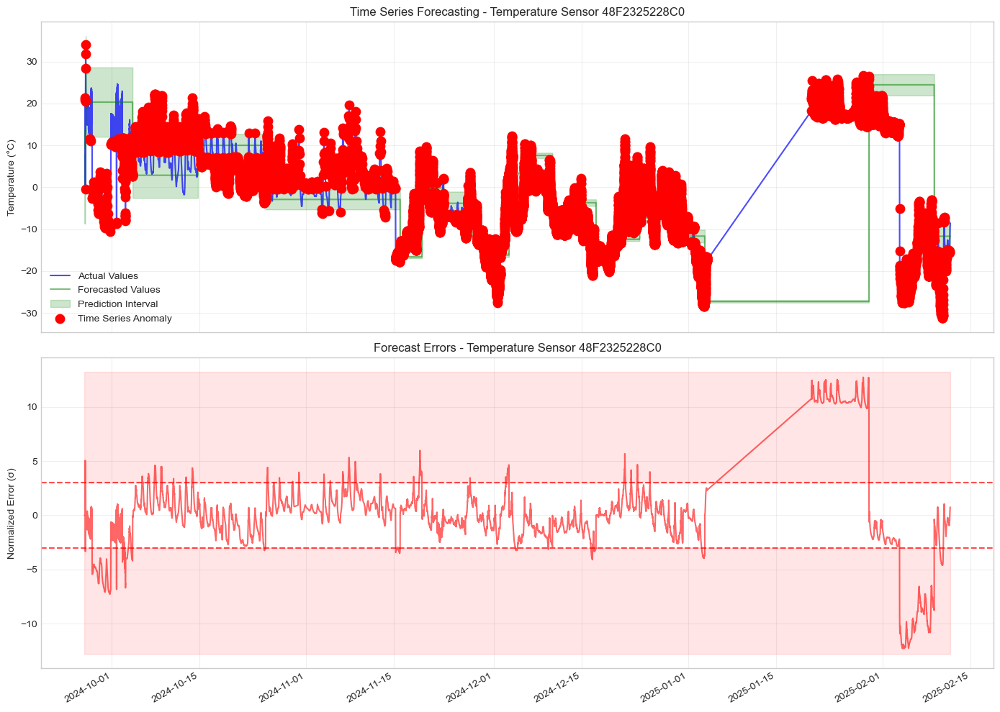

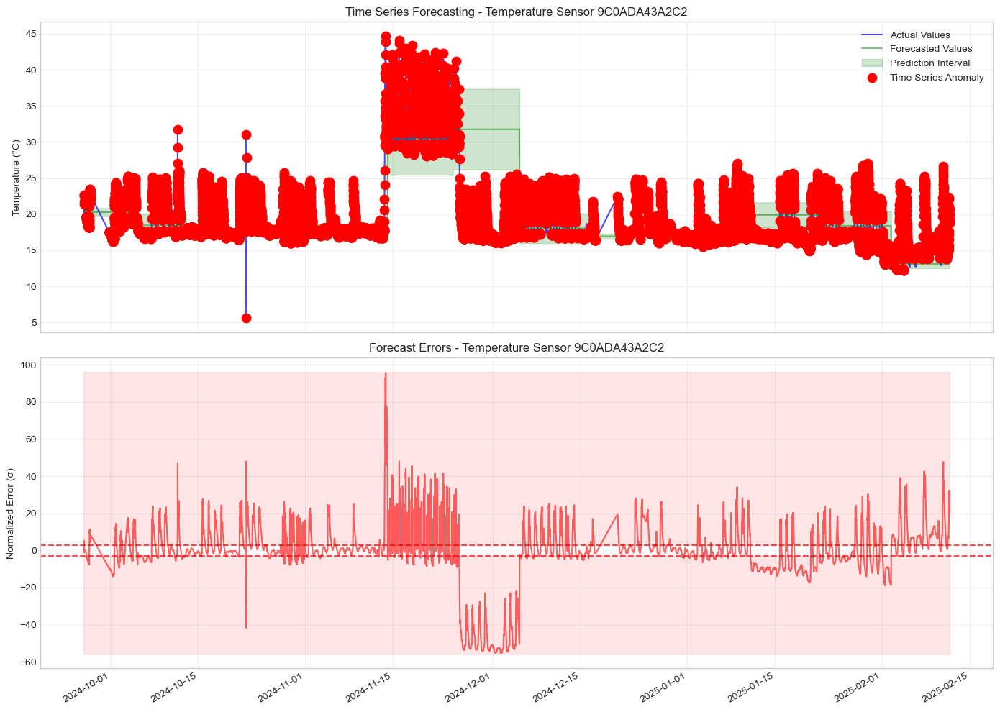

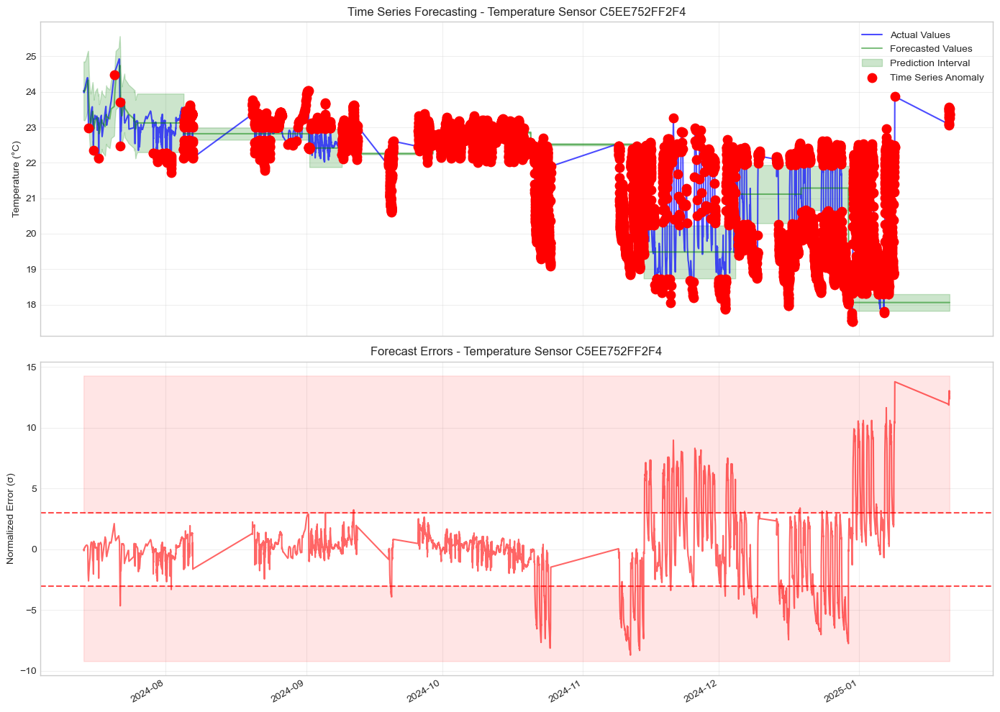

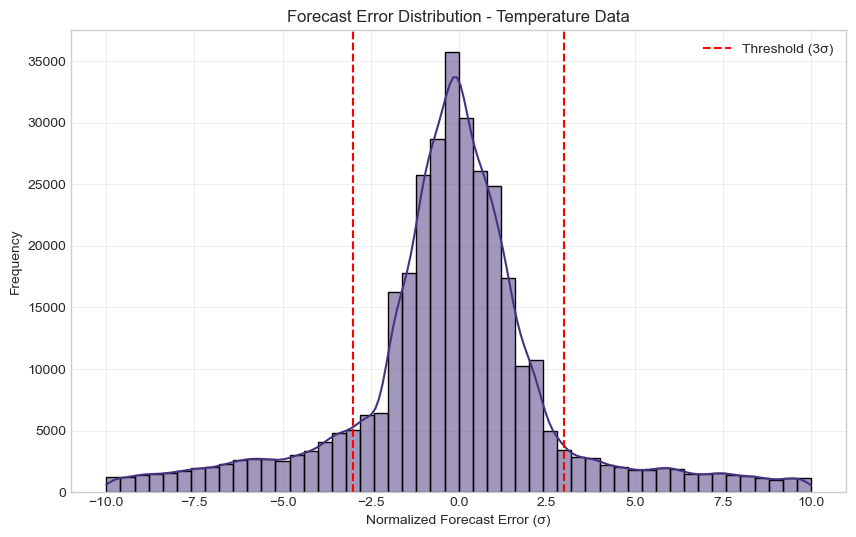

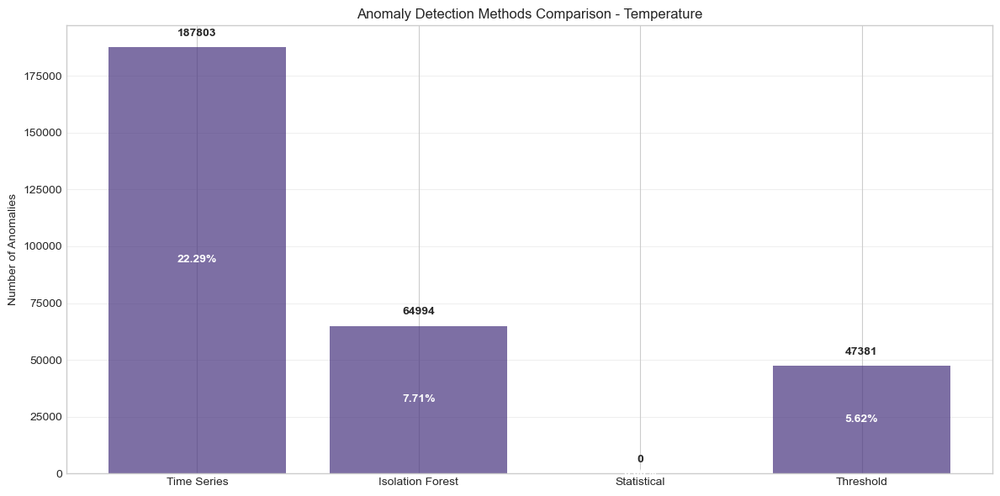

2025-03-18 12:36:28,027 - time_series_detector - INFO - Loaded model battery_10203FE748DD from ./models\time_series_battery_10203FE748DD.pkl
2025-03-18 12:36:28,031 - time_series_detector - INFO - Loaded model battery_11222D1FEAC1 from ./models\time_series_battery_11222D1FEAC1.pkl
2025-03-18 12:36:28,034 - time_series_detector - INFO - Loaded model battery_1677659ED4FE from ./models\time_series_battery_1677659ED4FE.pkl
2025-03-18 12:36:28,037 - time_series_detector - INFO - Loaded model battery_2023D87B9EF0 from ./models\time_series_battery_2023D87B9EF0.pkl
2025-03-18 12:36:28,040 - time_series_detector - INFO - Loaded model battery_258790F60CDD from ./models\time_series_battery_258790F60CDD.pkl
2025-03-18 12:36:28,044 - time_series_detector - INFO - Loaded model battery_2C3E44958CD1 from ./models\time_series_battery_2C3E44958CD1.pkl
2025-03-18 12:36:28,048 - time_series_detector - INFO - Loaded model battery_2C93E793C4D9 from ./models\time_series_battery_2C93E793C4D9.pkl
2025-03-18 12

Memory usage at after temperature time series: 441.10 MB

Processing battery data with time series analysis (274,559 records)...
Memory usage at before battery time series: 441.11 MB


2025-03-18 12:36:28,216 - time_series_detector - INFO - Loaded model battery_9E08F91920F2 from ./models\time_series_battery_9E08F91920F2.pkl
2025-03-18 12:36:28,220 - time_series_detector - INFO - Loaded model battery_A707544980DC from ./models\time_series_battery_A707544980DC.pkl
2025-03-18 12:36:28,224 - time_series_detector - INFO - Loaded model battery_AAD9621B13D6 from ./models\time_series_battery_AAD9621B13D6.pkl
2025-03-18 12:36:28,228 - time_series_detector - INFO - Loaded model battery_B3A88203A3F8 from ./models\time_series_battery_B3A88203A3F8.pkl
2025-03-18 12:36:28,232 - time_series_detector - INFO - Loaded model battery_B6712CC50DEC from ./models\time_series_battery_B6712CC50DEC.pkl
2025-03-18 12:36:28,237 - time_series_detector - INFO - Loaded model battery_B681E96530FC from ./models\time_series_battery_B681E96530FC.pkl
2025-03-18 12:36:28,240 - time_series_detector - INFO - Loaded model battery_B681E96530FC10 from ./models\time_series_battery_B681E96530FC10.pkl
2025-03-1

Loaded 198 pre-trained time series models


Time series analysis: battery:   0%|          | 0/92 [00:00<?, ?it/s]2025-03-18 12:36:28,951 - time_series_detector - WARNING - Error using saved model for E44B1B1517F4: Can only compare identically-labeled Series objects. Training new model.
2025-03-18 12:36:28,964 - time_series_detector - WARNING - Holt-Winters failed: unsupported operand type(s) for ** or pow(): 'NoneType' and 'int'. Falling back to simple model.
2025-03-18 12:36:28,971 - time_series_detector - WARNING - Holt-Winters failed: unsupported operand type(s) for ** or pow(): 'NoneType' and 'int'. Falling back to simple model.
2025-03-18 12:36:29,085 - time_series_detector - WARNING - Holt-Winters failed: unsupported operand type(s) for ** or pow(): 'NoneType' and 'int'. Falling back to simple model.
2025-03-18 12:36:29,198 - time_series_detector - WARNING - Holt-Winters failed: unsupported operand type(s) for ** or pow(): 'NoneType' and 'int'. Falling back to simple model.
2025-03-18 12:36:29,315 - time_series_detector - 

Detection completed in 18.27 seconds


2025-03-18 12:36:47,304 - time_series_detector - INFO - Model battery_B681E96530FC20 already exists at ./models\time_series_battery_B681E96530FC20.pkl, skipping. Use force=True to overwrite.
2025-03-18 12:36:47,306 - time_series_detector - INFO - Model battery_B681E96530FC21 already exists at ./models\time_series_battery_B681E96530FC21.pkl, skipping. Use force=True to overwrite.
2025-03-18 12:36:47,308 - time_series_detector - INFO - Model battery_B681E96530FC22 already exists at ./models\time_series_battery_B681E96530FC22.pkl, skipping. Use force=True to overwrite.
2025-03-18 12:36:47,309 - time_series_detector - INFO - Model battery_B681E96530FC23 already exists at ./models\time_series_battery_B681E96530FC23.pkl, skipping. Use force=True to overwrite.
2025-03-18 12:36:47,310 - time_series_detector - INFO - Model battery_B681E96530FC24 already exists at ./models\time_series_battery_B681E96530FC24.pkl, skipping. Use force=True to overwrite.
2025-03-18 12:36:47,312 - time_series_detecto

## Time Series Forecasting Results for Battery Data

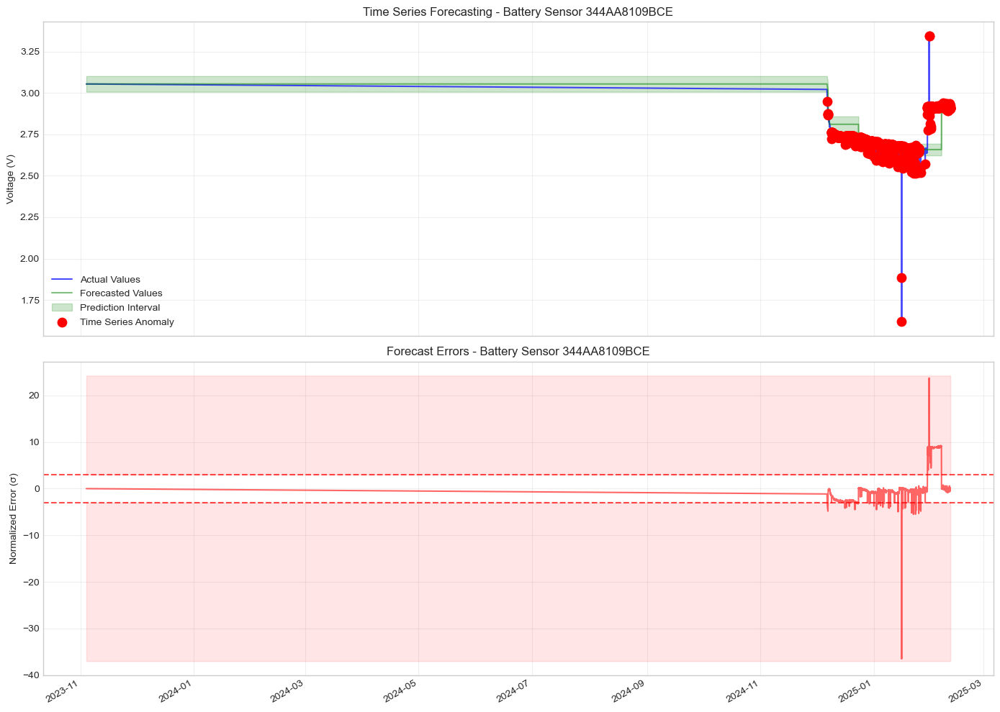

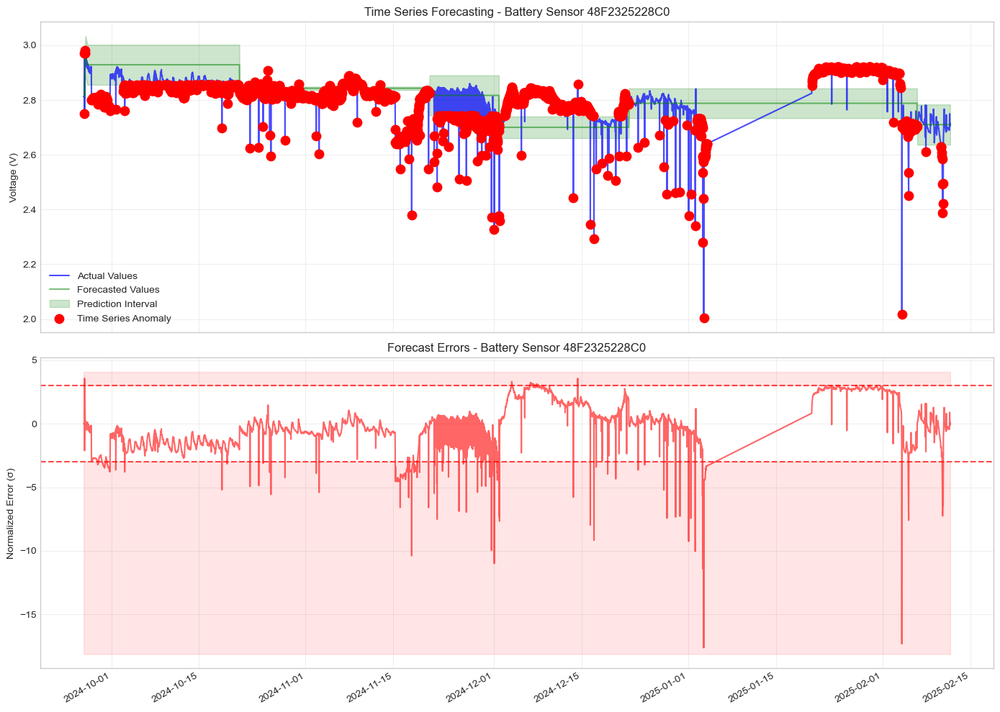

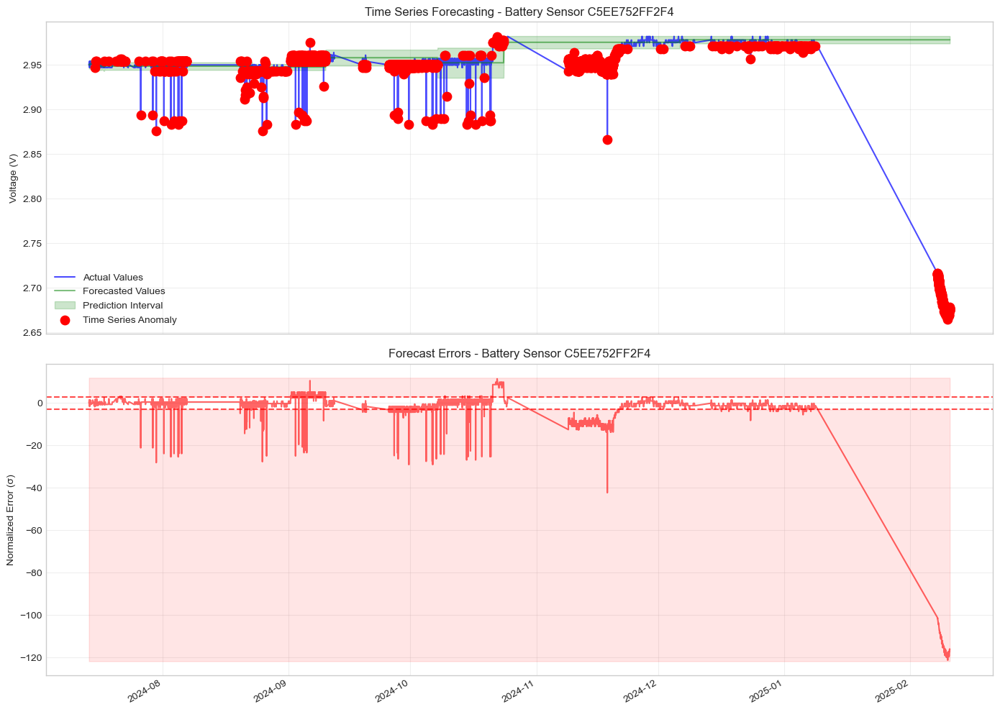

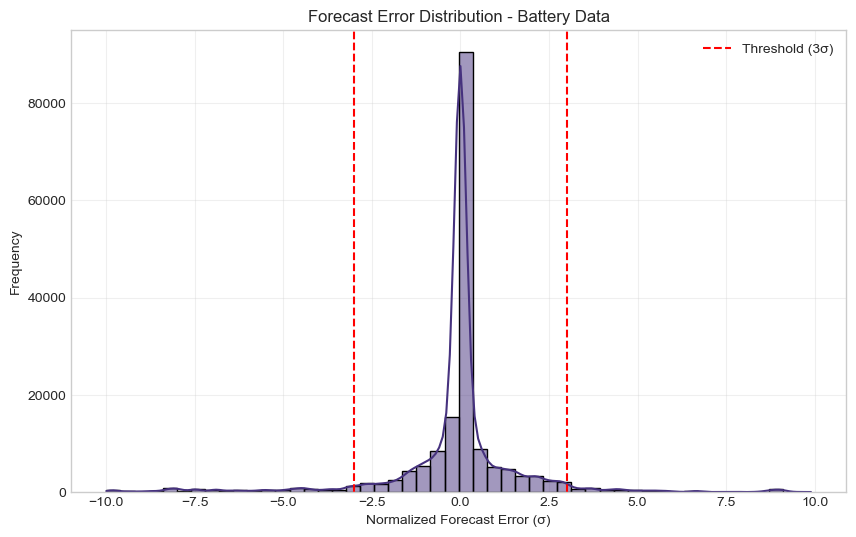

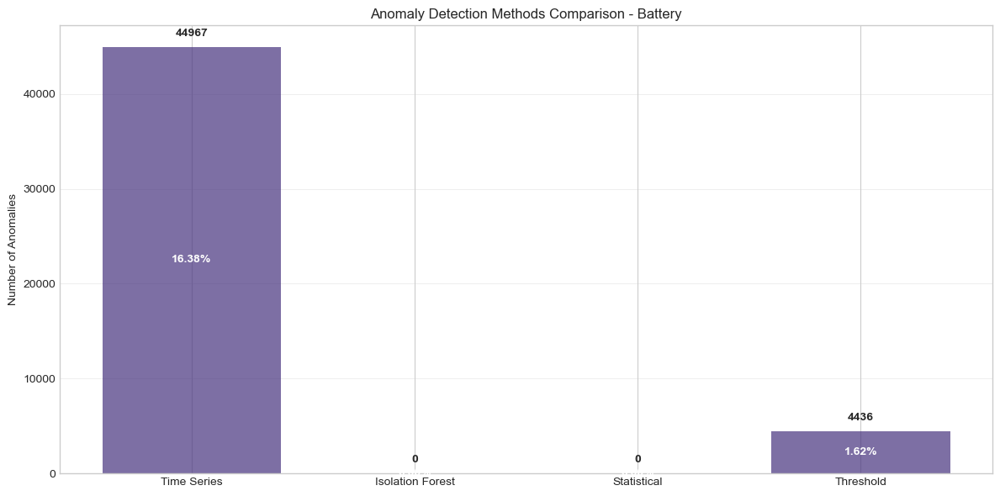

2025-03-18 12:36:58,076 - time_series_detector - INFO - Loaded model battery_10203FE748DD from ./models\time_series_battery_10203FE748DD.pkl
2025-03-18 12:36:58,083 - time_series_detector - INFO - Loaded model battery_11222D1FEAC1 from ./models\time_series_battery_11222D1FEAC1.pkl
2025-03-18 12:36:58,097 - time_series_detector - INFO - Loaded model battery_1677659ED4FE from ./models\time_series_battery_1677659ED4FE.pkl
2025-03-18 12:36:58,103 - time_series_detector - INFO - Loaded model battery_2023D87B9EF0 from ./models\time_series_battery_2023D87B9EF0.pkl
2025-03-18 12:36:58,106 - time_series_detector - INFO - Loaded model battery_258790F60CDD from ./models\time_series_battery_258790F60CDD.pkl
2025-03-18 12:36:58,122 - time_series_detector - INFO - Loaded model battery_2C3E44958CD1 from ./models\time_series_battery_2C3E44958CD1.pkl
2025-03-18 12:36:58,127 - time_series_detector - INFO - Loaded model battery_2C93E793C4D9 from ./models\time_series_battery_2C93E793C4D9.pkl
2025-03-18 12

Memory usage at after battery time series: 505.46 MB

Processing vibration data with time series analysis (3,237 records)...
Memory usage at before vibration time series: 505.46 MB


2025-03-18 12:36:58,261 - time_series_detector - INFO - Loaded model battery_9763B60F71D0 from ./models\time_series_battery_9763B60F71D0.pkl
2025-03-18 12:36:58,265 - time_series_detector - INFO - Loaded model battery_9C0ADA43A2C2 from ./models\time_series_battery_9C0ADA43A2C2.pkl
2025-03-18 12:36:58,268 - time_series_detector - INFO - Loaded model battery_9E08F91920F2 from ./models\time_series_battery_9E08F91920F2.pkl
2025-03-18 12:36:58,273 - time_series_detector - INFO - Loaded model battery_A707544980DC from ./models\time_series_battery_A707544980DC.pkl
2025-03-18 12:36:58,277 - time_series_detector - INFO - Loaded model battery_AAD9621B13D6 from ./models\time_series_battery_AAD9621B13D6.pkl
2025-03-18 12:36:58,281 - time_series_detector - INFO - Loaded model battery_B3A88203A3F8 from ./models\time_series_battery_B3A88203A3F8.pkl
2025-03-18 12:36:58,285 - time_series_detector - INFO - Loaded model battery_B6712CC50DEC from ./models\time_series_battery_B6712CC50DEC.pkl
2025-03-18 12

Loaded 198 pre-trained time series models


Time series analysis: vibration:   0%|          | 0/17 [00:00<?, ?it/s]2025-03-18 12:36:59,043 - time_series_detector - WARNING - Error using saved model for AAD9621B13D6: Can only compare identically-labeled Series objects. Training new model.
2025-03-18 12:36:59,074 - time_series_detector - WARNING - Holt-Winters failed: unsupported operand type(s) for ** or pow(): 'NoneType' and 'int'. Falling back to simple model.
2025-03-18 12:36:59,082 - time_series_detector - WARNING - Holt-Winters failed: unsupported operand type(s) for ** or pow(): 'NoneType' and 'int'. Falling back to simple model.
2025-03-18 12:36:59,261 - time_series_detector - WARNING - Holt-Winters failed: unsupported operand type(s) for ** or pow(): 'NoneType' and 'int'. Falling back to simple model.
Time series analysis: vibration: 100%|██████████| 17/17 [00:00<00:00, 35.79it/s]
2025-03-18 12:36:59,492 - time_series_detector - INFO - Time series detection results for vibration: 160 anomalies found (4.94%)
2025-03-18 12:

Detection completed in 0.49 seconds


2025-03-18 12:36:59,680 - time_series_detector - INFO - Model motion_3AE753C3FED2 already exists at ./models\time_series_motion_3AE753C3FED2.pkl, skipping. Use force=True to overwrite.
2025-03-18 12:36:59,681 - time_series_detector - INFO - Model motion_4192EFB694D7 already exists at ./models\time_series_motion_4192EFB694D7.pkl, skipping. Use force=True to overwrite.
2025-03-18 12:36:59,684 - time_series_detector - INFO - Model motion_4C4A0C0405C7 already exists at ./models\time_series_motion_4C4A0C0405C7.pkl, skipping. Use force=True to overwrite.
2025-03-18 12:36:59,686 - time_series_detector - INFO - Model motion_908CDC334EC5 already exists at ./models\time_series_motion_908CDC334EC5.pkl, skipping. Use force=True to overwrite.
2025-03-18 12:36:59,688 - time_series_detector - INFO - Model motion_930347D229CD already exists at ./models\time_series_motion_930347D229CD.pkl, skipping. Use force=True to overwrite.
2025-03-18 12:36:59,691 - time_series_detector - INFO - Model motion_9C0ADA

## Time Series Forecasting Results for Vibration Data

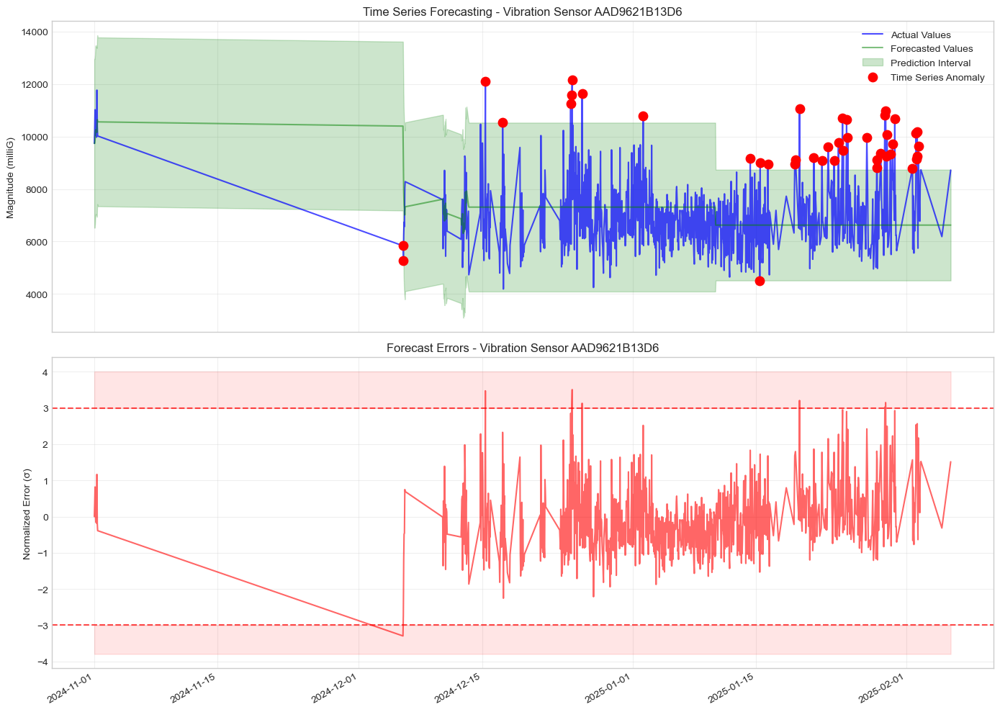

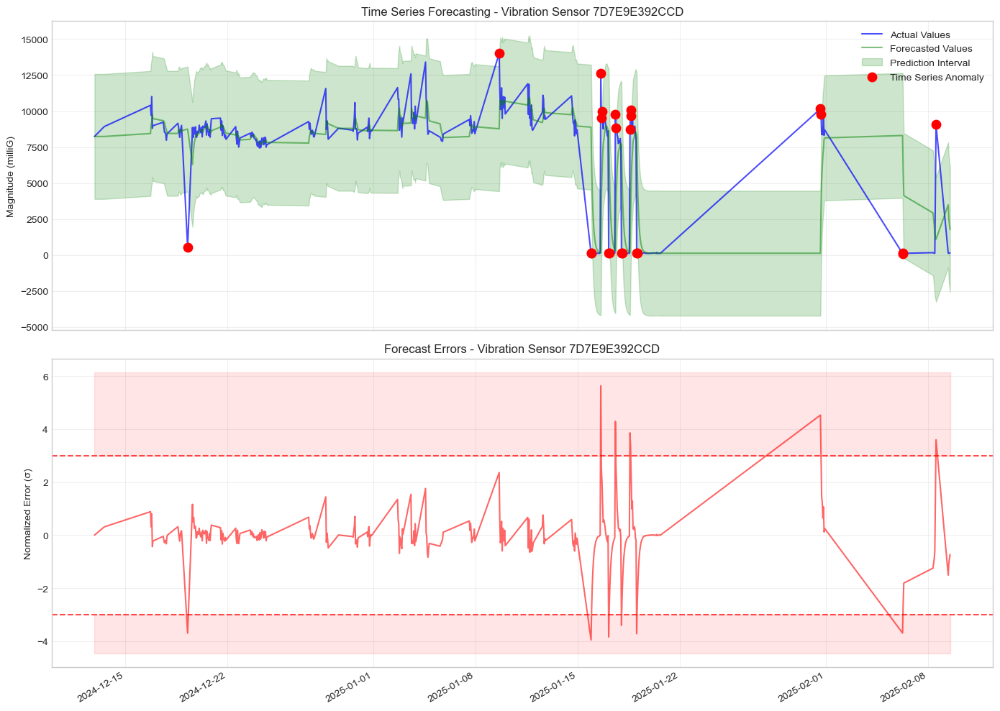

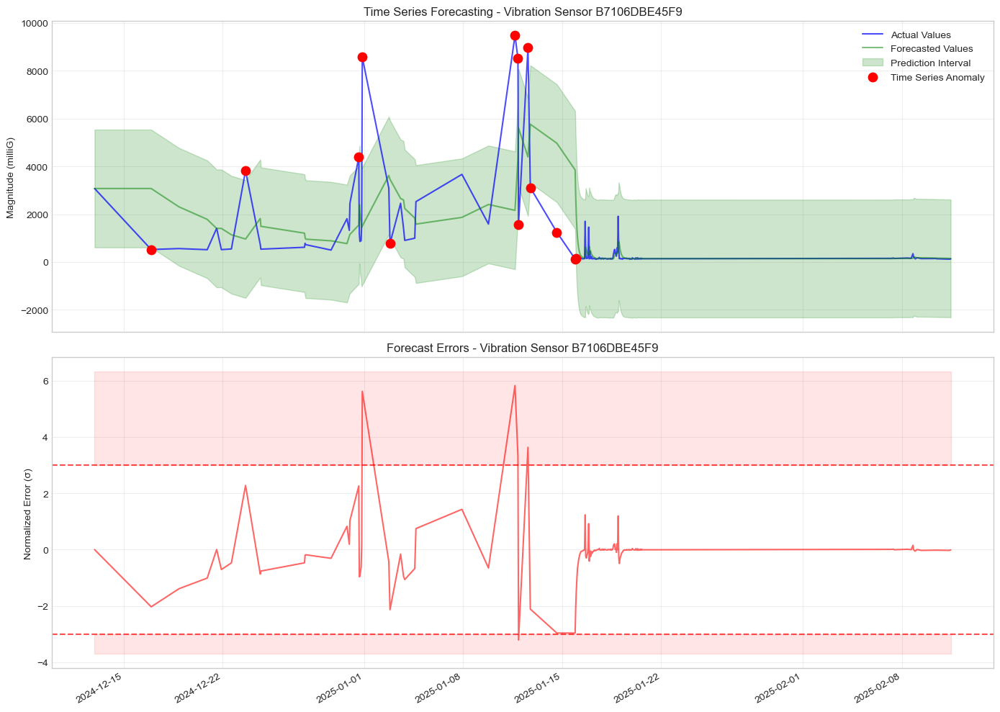

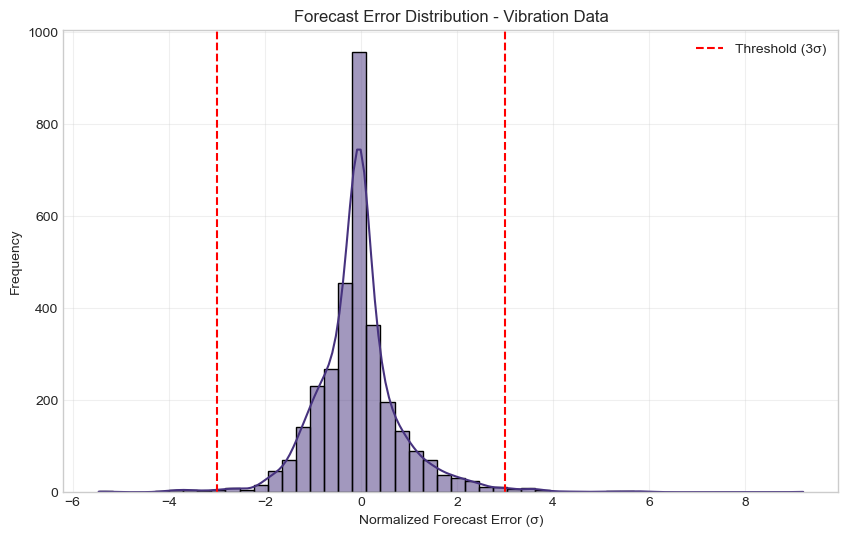

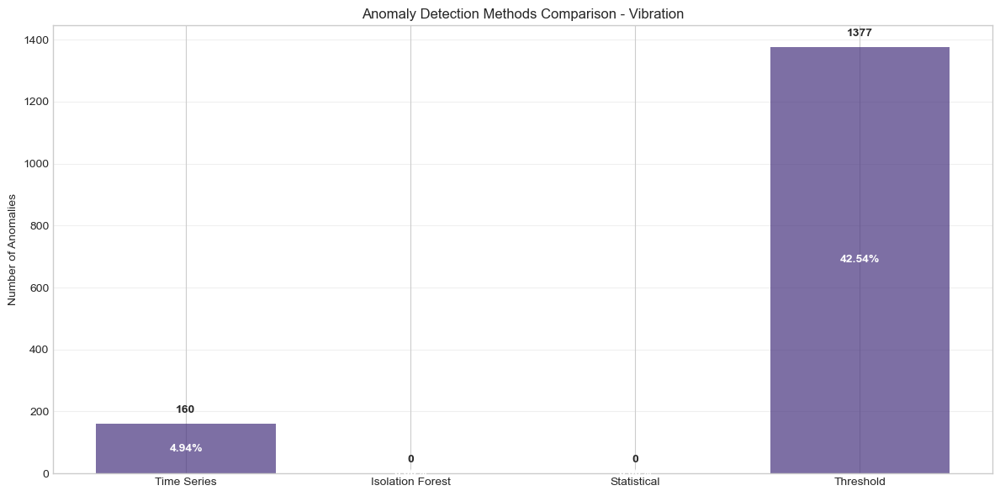

2025-03-18 12:37:06,718 - time_series_detector - INFO - Loaded model battery_10203FE748DD from ./models\time_series_battery_10203FE748DD.pkl
2025-03-18 12:37:06,720 - time_series_detector - INFO - Loaded model battery_11222D1FEAC1 from ./models\time_series_battery_11222D1FEAC1.pkl
2025-03-18 12:37:06,724 - time_series_detector - INFO - Loaded model battery_1677659ED4FE from ./models\time_series_battery_1677659ED4FE.pkl
2025-03-18 12:37:06,726 - time_series_detector - INFO - Loaded model battery_2023D87B9EF0 from ./models\time_series_battery_2023D87B9EF0.pkl
2025-03-18 12:37:06,731 - time_series_detector - INFO - Loaded model battery_258790F60CDD from ./models\time_series_battery_258790F60CDD.pkl
2025-03-18 12:37:06,736 - time_series_detector - INFO - Loaded model battery_2C3E44958CD1 from ./models\time_series_battery_2C3E44958CD1.pkl
2025-03-18 12:37:06,742 - time_series_detector - INFO - Loaded model battery_2C93E793C4D9 from ./models\time_series_battery_2C93E793C4D9.pkl
2025-03-18 12

Memory usage at after vibration time series: 530.10 MB

Processing motion data with time series analysis (844 records)...
Memory usage at before motion time series: 530.10 MB


2025-03-18 12:37:06,899 - time_series_detector - INFO - Loaded model battery_B681E96530FC16 from ./models\time_series_battery_B681E96530FC16.pkl
2025-03-18 12:37:06,901 - time_series_detector - INFO - Loaded model battery_B681E96530FC17 from ./models\time_series_battery_B681E96530FC17.pkl
2025-03-18 12:37:06,904 - time_series_detector - INFO - Loaded model battery_B681E96530FC18 from ./models\time_series_battery_B681E96530FC18.pkl
2025-03-18 12:37:06,905 - time_series_detector - INFO - Loaded model battery_B681E96530FC19 from ./models\time_series_battery_B681E96530FC19.pkl
2025-03-18 12:37:06,909 - time_series_detector - INFO - Loaded model battery_B681E96530FC2 from ./models\time_series_battery_B681E96530FC2.pkl
2025-03-18 12:37:06,912 - time_series_detector - INFO - Loaded model battery_B681E96530FC20 from ./models\time_series_battery_B681E96530FC20.pkl
2025-03-18 12:37:06,914 - time_series_detector - INFO - Loaded model battery_B681E96530FC21 from ./models\time_series_battery_B681E9

Loaded 198 pre-trained time series models


Time series analysis: motion: 100%|██████████| 63/63 [00:00<00:00, 240.12it/s]
2025-03-18 12:37:07,751 - time_series_detector - INFO - Time series detection results for motion: 35 anomalies found (4.15%)
2025-03-18 12:37:07,754 - time_series_detector - INFO - Model battery_10203FE748DD already exists at ./models\time_series_battery_10203FE748DD.pkl, skipping. Use force=True to overwrite.
2025-03-18 12:37:07,757 - time_series_detector - INFO - Model battery_11222D1FEAC1 already exists at ./models\time_series_battery_11222D1FEAC1.pkl, skipping. Use force=True to overwrite.
2025-03-18 12:37:07,758 - time_series_detector - INFO - Model battery_1677659ED4FE already exists at ./models\time_series_battery_1677659ED4FE.pkl, skipping. Use force=True to overwrite.
2025-03-18 12:37:07,760 - time_series_detector - INFO - Model battery_2023D87B9EF0 already exists at ./models\time_series_battery_2023D87B9EF0.pkl, skipping. Use force=True to overwrite.
2025-03-18 12:37:07,762 - time_series_detector -

Detection completed in 0.28 seconds


2025-03-18 12:37:07,930 - time_series_detector - INFO - Model motion_908CDC334EC5 already exists at ./models\time_series_motion_908CDC334EC5.pkl, skipping. Use force=True to overwrite.
2025-03-18 12:37:07,932 - time_series_detector - INFO - Model motion_930347D229CD already exists at ./models\time_series_motion_930347D229CD.pkl, skipping. Use force=True to overwrite.
2025-03-18 12:37:07,934 - time_series_detector - INFO - Model motion_9C0ADA43A2C2 already exists at ./models\time_series_motion_9C0ADA43A2C2.pkl, skipping. Use force=True to overwrite.
2025-03-18 12:37:07,935 - time_series_detector - INFO - Model motion_A707544980DC already exists at ./models\time_series_motion_A707544980DC.pkl, skipping. Use force=True to overwrite.
2025-03-18 12:37:07,938 - time_series_detector - INFO - Model motion_AAD9621B13D6 already exists at ./models\time_series_motion_AAD9621B13D6.pkl, skipping. Use force=True to overwrite.
2025-03-18 12:37:07,940 - time_series_detector - INFO - Model motion_B3A882

## Time Series Forecasting Results for Motion Data

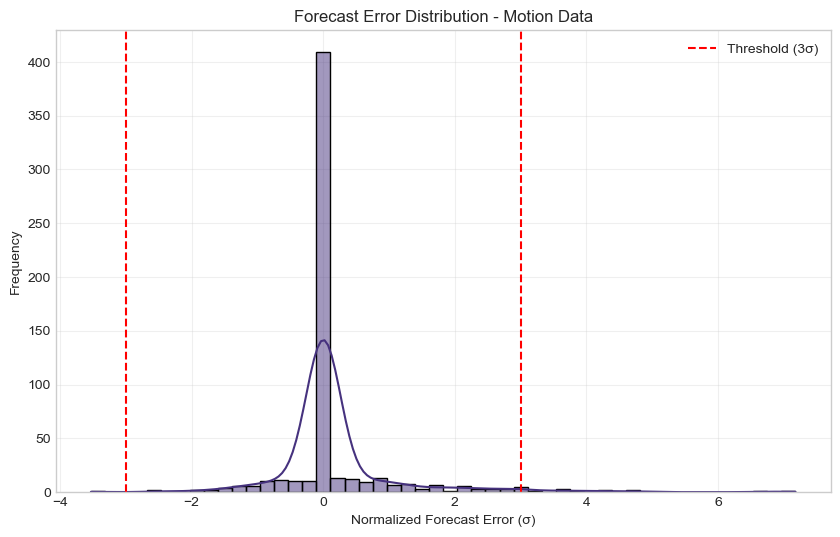

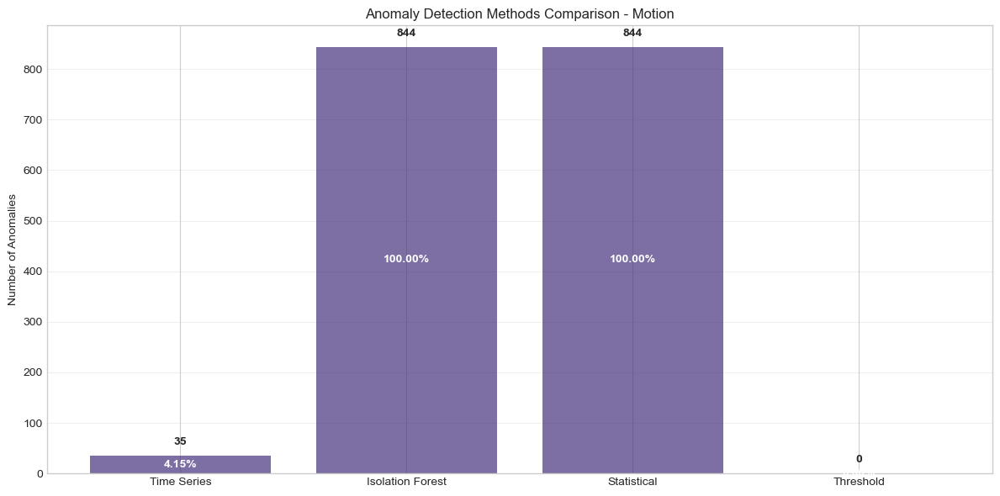

Memory usage at after motion time series: 535.08 MB

=== Time Series Anomaly Detection Summary ===
Temperature: 187,803 time series anomalies out of 842,711 records (22.29%)
  - Combined anomalies (all methods): 245,923 (29.18%)
Battery: 44,967 time series anomalies out of 274,559 records (16.38%)
  - Combined anomalies (all methods): 48,156 (17.54%)
Vibration: 160 time series anomalies out of 3,237 records (4.94%)
  - Combined anomalies (all methods): 1,460 (45.10%)
Motion: 35 time series anomalies out of 844 records (4.15%)
  - Combined anomalies (all methods): 844 (100.00%)

Time series anomaly detection completed. Final results ready for next stage.
Memory usage at final: 537.83 MB


In [53]:
# Time Series Analysis for Anomaly Detection
import time
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from tqdm import tqdm
import seaborn as sns
from IPython.display import display, Markdown
import gc
import warnings

# Suppress warnings from statsmodels
warnings.filterwarnings("ignore")

# Create directories for outputs
os.makedirs('./models', exist_ok=True)  # For saving trained models

# Initialize the Time Series detector with optimized configuration
time_series_detector = TimeSeriesDetector(
    config={
        'temperature': {
            'min_training_points': 48,  # Minimum points needed (4 hours for 5-min data)
            'prediction_interval': 0.95,  # 95% prediction interval
            'error_threshold': 2.5,       # Z-score threshold for prediction errors
            'batch_size': 1000,           # Process in smaller batches due to model complexity
            'use_seasonal': True,         # Use seasonal models for temperature
            'seasonal_period': 288,       # Daily seasonality (5-min data: 12 * 24 = 288)
            'diff_order': 1,              # Differencing order for SARIMA
            'model_params': {
                'auto_arima': False,      # Auto ARIMA too slow for large datasets
                'fallback_to_ets': True,  # Use exponential smoothing
                'reuse_models': True      # Reuse previously trained models
            }
        },
        'battery': {
            'min_training_points': 24,    # Minimum points needed (6 hours for 15-min data)
            'prediction_interval': 0.90,  # 90% prediction interval
            'error_threshold': 3.0,       # Higher threshold for battery data
            'batch_size': 1000,
            'use_seasonal': False,        # Battery doesn't typically have strong seasonality
            'model_params': {
                'auto_arima': False,      # Skip auto_arima for battery
                'use_holt_winters': True, # Use Holt-Winters for battery (captures trend)
                'reuse_models': True      # Reuse previously trained models
            }
        },
        'vibration': {
            'min_training_points': 24,    # Minimum points needed (1 day for hourly data)
            'prediction_interval': 0.98,  # 98% prediction interval (wider for vibration)
            'error_threshold': 3.5,       # Higher threshold for vibration data
            'batch_size': 500,
            'use_seasonal': True,
            'seasonal_period': 24,        # Daily seasonality (hourly data: 24)
            'model_params': {
                'auto_arima': False,      # Skip auto_arima due to sparsity
                'use_holt_winters': True, # Use Holt-Winters (handles irregularity better)
                'reuse_models': True      # Reuse previously trained models
            }
        },
        'motion': {
            'min_training_points': 14,    # Minimum points needed (2 weeks for daily data)
            'prediction_interval': 0.95,  # 95% prediction interval
            'error_threshold': 3.0,       # Standard threshold
            'batch_size': 200,
            'use_seasonal': True,
            'seasonal_period': 7,         # Weekly seasonality (daily data: 7)
            'model_params': {
                'auto_arima': False,      # Auto ARIMA too complex for sparse motion data
                'use_holt_winters': True, # Use Holt-Winters with weekly seasonality
                'reuse_models': True      # Reuse previously trained models
            }
        }
    }
)

# Function to track memory usage
def check_memory_usage(label):
    """Monitor memory usage at specific points"""
    import psutil
    process = psutil.Process(os.getpid())
    memory_info = process.memory_info()
    memory_mb = memory_info.rss / (1024 * 1024)
    print(f"Memory usage at {label}: {memory_mb:.2f} MB")

# Function to process and visualize each sensor type
def process_time_series(df, sensor_type, sample_sensors=3):
    """Process sensor data with time series forecasting and visualize results"""
    if df is None or df.empty:
        print(f"No {sensor_type} data to process")
        return None
    
    print(f"\nProcessing {sensor_type} data with time series analysis ({df.shape[0]:,} records)...")
    check_memory_usage(f"before {sensor_type} time series")
    
    # Check if we should load pre-trained models
    model_dir = './models'
    if os.path.exists(model_dir):
        time_series_detector.load_models(model_dir)
        print(f"Loaded {len(time_series_detector.models)} pre-trained time series models")
    
    # Apply time series detection
    start_time = time.time()
    try:
        result_df = time_series_detector.detect(df, sensor_type)
        end_time = time.time()
        print(f"Detection completed in {end_time - start_time:.2f} seconds")
        
        # Save models for future use
        time_series_detector.save_models(output_dir='./models')
        
        # Visualize results
        visualize_time_series_results(result_df, sensor_type, sample_sensors, output_dir='./visualizations')
        
        # Force garbage collection
        gc.collect()
        check_memory_usage(f"after {sensor_type} time series")
        
        return result_df
    except Exception as e:
        print(f"Error processing {sensor_type} data with time series: {str(e)}")
        import traceback
        traceback.print_exc()
        return df

# Print pipeline stage header
print("="*80)
print("Stage 3: Time Series-Based Anomaly Detection")
print("="*80)
check_memory_usage("initial")

# Process each sensor type using the results from previous stages
print("\nApplying Time Series Analysis to data from previous stages...")

# Process temperature data
temp_ts_anomalies = process_time_series(temp_if_anomalies, 'temperature', sample_sensors=3)

# Process battery data
batt_ts_anomalies = process_time_series(batt_if_anomalies, 'battery', sample_sensors=3)

# Process vibration data
vib_ts_anomalies = process_time_series(vib_if_anomalies, 'vibration', sample_sensors=3)

# Process motion data
motn_ts_anomalies = process_time_series(motn_if_anomalies, 'motion', sample_sensors=3)

# Display summary of results
print("\n=== Time Series Anomaly Detection Summary ===")
for sensor_type, result_df in [
     ('temperature', temp_ts_anomalies), 
     ('battery', batt_ts_anomalies),
     ('vibration', vib_ts_anomalies), 
     ('motion', motn_ts_anomalies)
]:
    if result_df is not None and 'time_series_anomaly' in result_df.columns:
        # Get stats from detector
        detection_stats = time_series_detector.get_results(sensor_type)
        
        # Calculate additional stats
        ts_anomaly_count = detection_stats.get('anomaly_count', 0)
        total_records = detection_stats.get('total_records', 0)
        
        # Calculate combined anomaly count (all methods)
        combined_anomalies = 0
        if all(col in result_df.columns for col in ['time_series_anomaly', 'isolation_forest_anomaly', 
                                                  'statistical_anomaly', 'threshold_violation']):
            combined_anomalies = (
                (result_df['statistical_anomaly']) | 
                (result_df['threshold_violation']) | 
                (result_df['isolation_forest_anomaly']) |
                (result_df['time_series_anomaly'])
            ).sum()
        
        print(f"{sensor_type.capitalize()}: {ts_anomaly_count:,} time series anomalies " + 
              f"out of {total_records:,} records " + 
              f"({ts_anomaly_count/total_records*100:.2f}%)")
        
        if combined_anomalies > 0:
            print(f"  - Combined anomalies (all methods): {combined_anomalies:,} " +
                  f"({combined_anomalies/total_records*100:.2f}%)")

# Store the final results with all detection methods
final_results = {
    'temperature': temp_ts_anomalies,
    'battery': batt_ts_anomalies,
    'vibration': vib_ts_anomalies,
    'motion': motn_ts_anomalies
}

print("\nTime series anomaly detection completed. Final results ready for next stage.")
check_memory_usage("final")

## Stage 4: Graph-Based Relationship Analysis for Anomaly Detection

Graph-based relationship analysis enables us to detect complex, interconnected anomalies across multiple sensors. This stage offers several key advantages:

1. Identifies correlated anomalies across different sensor types
2. Detects cascading failures and root causes
3. Reduces false positives by finding confirmation from related sensors
4. Provides context for anomaly significance

This approach builds a sensor relationship network, where sensors are connected based on:
- Physical proximity
- Functional relationships
- Temporal correlation
- Anomaly co-occurrence

The Graph Attention Network (GAT) we'll implement allows the model to automatically learn which sensor relationships are most important for anomaly detection.

This stage analyzes relationships between sensors to identify correlated anomalies by:
1. Building a sensor relationship network based on spatial, temporal, and functional similarities
2. Using graph analysis techniques to detect anomaly propagation patterns
3. Identifying connected anomaly groups that might indicate system-wide issues

The implementation uses lightweight graph algorithms optimized for memory efficiency and handles missing data gracefully.

In [97]:
class GraphRelationshipDetector:
    """
    Graph-based relationship analysis for detecting connected anomalies across sensors.
    
    This detector builds a sensor relationship network and uses graph analysis techniques
    to identify connected anomalies and their propagation patterns. It can detect:
    1. Cascading failures across different sensor types
    2. Groups of related anomalies
    3. Root causes of system-wide issues
    
    Features:
    - Automatic sensor relationship discovery
    - Temporal and spatial correlation analysis
    - Memory-efficient implementation
    - Integration with previous detection results
    - Account-sensor relationship analysis
    """
    
    def __init__(self, config=None, logger=None):
        """
        Initialize the Graph Relationship detector
        
        Parameters:
        -----------
        config : dict, optional
            Configuration parameters
        logger : logging.Logger, optional
            Logger for tracking operations
        """
        # Default configuration
        self.default_config = {
            'relationship_discovery': {
                'min_correlation': 0.3,      # Minimum correlation to establish relationship
                'max_time_diff': 60,         # Maximum time difference (minutes) for temporal analysis
                'use_location_data': True,    # Use location data if available
                'use_functional_groups': True, # Use functional groups (e.g., same equipment)
                'min_anomaly_overlap': 0.05   # Minimum anomaly co-occurrence ratio - reduced threshold
            },
            'graph_analysis': {
                'gat_layers': 2,              # Number of GAT layers
                'attention_heads': 4,         # Number of attention heads per layer
                'embedding_dim': 64,          # Dimension of sensor embeddings
                'dropout': 0.2,               # Dropout rate
                'batch_size': 1000,           # Batch size for processing
                'use_anomaly_weights': True,  # Use anomaly scores as weights
                'propagation_threshold': 0.3   # Reduced threshold for anomaly propagation
            },
            'memory_optimization': {
                'max_sensors_per_batch': 200, # Max sensors to process in one batch
                'sparse_adjacency': True,     # Use sparse adjacency matrix
                'sensor_grouping': True       # Group sensors by type for efficiency
            },
            'account_analysis': {
                'use_account_info': True,     # Use account information if available
                'single_account_boost': 0.2,  # Boost for sensors from same account
                'account_sensor_linking': True # Link sensors based on account data
            },
            'threshold_priority': {
                'boost_factor': 0.5,          # Boost factor for threshold violations
                'always_report': True         # Always report threshold violations
            },
            'motion_analysis': {
                'treat_all_as_anomalies': True, # Treat all motion events as anomalies
                'motion_event_boost': 0.4      # Boost for motion event anomalies
            }
        }
        
        # Merge provided config with default
        self.config = config or self.default_config
        
        # Setup logging
        self.logger = logger or logging.getLogger('graph_relationship_detector')
        
        # Store detection results
        self.results = {}
        
        # Store sensor relationship data
        self.sensor_relationships = {}
        self.sensor_metadata = {}
        self.adjacency_matrix = None
        self.sensor_node_mapping = {}
        
        # Store anomaly propagation patterns
        self.propagation_patterns = {}
        
        # Account information storage
        self.account_sensor_map = {}
        
        # Store common features between related sensors
        self.common_features = {}
        
        # Check if saved models exist and load them
        self._load_saved_results()
    
    def _load_saved_results(self):
        """
        Load saved results from previous runs if available
        """
        try:
            import os
            import pickle
            
            # Check for saved results
            results_path = os.path.join('./models', 'graph_relationship_results.pkl')
            if os.path.exists(results_path):
                with open(results_path, 'rb') as f:
                    saved_results = pickle.load(f)
                    
                self.logger.info(f"Loaded saved graph relationship results from {results_path}")
                
                # Restore only the relevant parts
                if 'metadata' in saved_results:
                    self.sensor_metadata = saved_results['metadata']
                if 'relationships' in saved_results:
                    self.sensor_relationships = saved_results['relationships']
                if 'account_sensor_map' in saved_results:
                    self.account_sensor_map = saved_results['account_sensor_map']
                if 'common_features' in saved_results:
                    self.common_features = saved_results['common_features']
                    
                # Keep the overall results for access
                self.results = saved_results
                
                return True
        except Exception as e:
            self.logger.warning(f"Failed to load saved graph relationship results: {str(e)}")
            
        return False
    
    def _save_results(self):
        """
        Save results for future runs
        """
        try:
            import os
            import pickle
            
            # Ensure directory exists
            os.makedirs('./models', exist_ok=True)
            
            # Save the results
            results_path = os.path.join('./models', 'graph_relationship_results.pkl')
            with open(results_path, 'wb') as f:
                pickle.dump(self.results, f)
                
            self.logger.info(f"Saved graph relationship results to {results_path}")
        except Exception as e:
            self.logger.warning(f"Failed to save graph relationship results: {str(e)}")
    
    def _extract_sensor_metadata(self, dfs, sensors_df=None):
        """
        Extract metadata about sensors from multiple dataframes
        
        Parameters:
        -----------
        dfs : dict
            Dictionary of dataframes by sensor type
        sensors_df : pandas.DataFrame, optional
            Sensor metadata DataFrame with account info
                
        Returns:
        --------
        dict
            Sensor metadata
        """
        metadata = {}
        
        # First extract basic information from anomaly dataframes
        for sensor_type, df in dfs.items():
            if df is None or df.empty:
                self.logger.warning(f"No data available for {sensor_type} sensors")
                continue
                    
            # Get unique sensors
            unique_sensors = df['SensorId'].unique()
            
            for sensor_id in unique_sensors:
                # Skip None values
                if sensor_id is None:
                    self.logger.warning(f"Found None sensor ID in {sensor_type} data, skipping")
                    continue
                        
                sensor_data = df[df['SensorId'] == sensor_id]
                
                # Create metadata entry if it doesn't exist
                if sensor_id not in metadata:
                    metadata[sensor_id] = {
                        'sensor_type': sensor_type,
                        'anomaly_count': 0,
                        'threshold_violations': 0,  # Track threshold violations separately
                        'records': len(sensor_data),
                        'time_range': None,
                        'location': None,
                        'functional_group': None,
                        'account_id': None,
                        'device_id': None,  # Add field for DeviceID
                        'features': {}  # Store common features
                    }
                
                # Count anomalies from different detection methods
                anomaly_count = 0
                anomaly_columns = [
                    'statistical_anomaly', 'isolation_forest_anomaly', 'time_series_anomaly'
                ]
                
                # Count anomalies
                for col in anomaly_columns:
                    if col in sensor_data.columns:
                        anomaly_count += sensor_data[col].sum()
                
                # Special handling for threshold violations (track separately)
                threshold_violations = 0
                if 'threshold_violation' in sensor_data.columns:
                    threshold_violations = sensor_data['threshold_violation'].sum()
                    
                # Special handling for motion sensors (treat all as anomalies)
                if sensor_type == 'motion' and self.config['motion_analysis']['treat_all_as_anomalies']:
                    # For motion, consider all events as potential anomalies
                    if 'daily_event_count' in sensor_data.columns:
                        # If we have event counts, use that
                        motion_events = sensor_data['daily_event_count'].sum()
                        anomaly_count = max(anomaly_count, motion_events)
                    else:
                        # Otherwise, treat all motion records as anomalies
                        anomaly_count = max(anomaly_count, len(sensor_data))
                
                metadata[sensor_id]['anomaly_count'] = anomaly_count
                metadata[sensor_id]['threshold_violations'] = threshold_violations
                
                # Extract time range if available
                if 'EventTimeUtc' in sensor_data.columns:
                    try:
                        metadata[sensor_id]['time_range'] = (
                            sensor_data['EventTimeUtc'].min(),
                            sensor_data['EventTimeUtc'].max()
                        )
                    except Exception as e:
                        self.logger.warning(f"Error extracting time range for sensor {sensor_id}: {str(e)}")
                
                # Extract sensor-specific features for common feature analysis
                self._extract_sensor_features(sensor_data, metadata[sensor_id], sensor_type)
        
        # If no metadata was extracted, raise a warning
        if not metadata:
            self.logger.warning("No valid sensor metadata could be extracted from the provided dataframes")
            # Return empty dict instead of raising exception to gracefully handle the error
            return {}
        
        # If we have a sensors_df with metadata, extract that information
        if sensors_df is not None and not sensors_df.empty:
            self.logger.info(f"Adding information from sensors_df ({len(sensors_df)} records)")
            
            # Check if we have BluetoothAddress column in sensors_df
            bt_col = None
            if 'BluetoothAddress' in sensors_df.columns:
                bt_col = 'BluetoothAddress'
            
            # Check for DeviceID in sensors_df
            device_col = None
            if 'DeviceId' in sensors_df.columns:
                device_col = 'DeviceId'
            
            # Check for available columns
            available_cols = [col for col in ['AccountId', 'Location', 'SensorType', 'Description'] 
                            if col in sensors_df.columns]
            
            if bt_col and (available_cols or device_col):
                # Mapping between bluetooth address and account id/device id
                address_to_info = {}
                
                # Create mapping
                for _, row in sensors_df.iterrows():
                    address = row[bt_col]
                    if pd.notna(address) and address:
                        info = {col: row[col] for col in available_cols if pd.notna(row[col])}
                        # Add DeviceID if available
                        if device_col and pd.notna(row[device_col]):
                            info['device_id'] = row[device_col]
                        address_to_info[address] = info
                
                # Update metadata with sensor information
                account_sensors = {}
                
                for sensor_id, meta in metadata.items():
                    # Try to match sensor ID with bluetooth address
                    if sensor_id in address_to_info:
                        info = address_to_info[sensor_id]
                        
                        # Update metadata with available information
                        for key, value in info.items():
                            if key.lower() == 'device_id':
                                meta['device_id'] = value
                            elif key.lower() == 'accountid':
                                meta['account_id'] = value
                                
                                # Update account-sensor mapping
                                if value not in account_sensors:
                                    account_sensors[value] = []
                                account_sensors[value].append(sensor_id)
                            else:
                                # Store other metadata
                                meta[key.lower()] = value
                    
                # Store account-sensor mapping
                self.account_sensor_map = account_sensors
                
                self.logger.info(f"Matched {len(address_to_info)} sensors with metadata from sensors_df")
                self.logger.info(f"Found {len(account_sensors)} unique accounts with sensors")
        
        # For sensors without location/functional group, extract from patterns
        for sensor_id, meta in metadata.items():
            try:
                # Extract location if not already set
                if not meta.get('location') and isinstance(sensor_id, str) and len(sensor_id) > 4:
                    meta['location'] = sensor_id[:4]  # First 4 chars as location
                elif not meta.get('location'):
                    meta['location'] = 'unknown'
                
                # Assign functional groups based on sensor types if not already set
                if not meta.get('functional_group'):
                    type_to_group = {
                        'temperature': 'environmental',
                        'battery': 'power',
                        'vibration': 'mechanical',
                        'motion': 'security'
                    }
                    meta['functional_group'] = type_to_group.get(meta['sensor_type'], 'unknown')
            except Exception as e:
                self.logger.warning(f"Error processing metadata for sensor {sensor_id}: {str(e)}")
                # Set defaults if processing fails
                meta['location'] = 'unknown'
                meta['functional_group'] = 'unknown'
        
        self.logger.info(f"Extracted metadata for {len(metadata)} sensors")
        return metadata
    
    def _extract_sensor_features(self, sensor_data, metadata, sensor_type):
        """
        Extract specific features from sensor data for common feature analysis
        
        Parameters:
        -----------
        sensor_data : pandas.DataFrame
            Data for a specific sensor
        metadata : dict
            Metadata dictionary for this sensor
        sensor_type : str
            Type of sensor
        """
        features = {}
        
        try:
            # Extract sensor-specific features
            if sensor_type == 'temperature':
                # Temperature features
                if 'TemperatureInCelsius' in sensor_data.columns:
                    features['avg_temperature'] = float(sensor_data['TemperatureInCelsius'].mean())
                    features['max_temperature'] = float(sensor_data['TemperatureInCelsius'].max())
                    features['min_temperature'] = float(sensor_data['TemperatureInCelsius'].min())
                    features['temp_range'] = features['max_temperature'] - features['min_temperature']
                
                # Extract thresholds
                threshold_cols = [col for col in sensor_data.columns if 'Threshold' in col]
                for col in threshold_cols:
                    if col in sensor_data.columns:
                        features[col.lower()] = float(sensor_data[col].iloc[0])
            
            elif sensor_type == 'battery':
                # Battery features
                if 'BatteryVoltage' in sensor_data.columns:
                    features['avg_voltage'] = float(sensor_data['BatteryVoltage'].mean())
                    features['min_voltage'] = float(sensor_data['BatteryVoltage'].min())
                    
                    # Remaining battery percentage (assuming 3.3V is 100%)
                    min_voltage = max(features['min_voltage'], 2.0)  # 2V minimum for functioning
                    features['battery_pct'] = min(100, max(0, (min_voltage - 2.0) / 1.3 * 100))
                
                # Extract thresholds
                if 'BatteryVoltageThreshold' in sensor_data.columns:
                    features['battery_threshold'] = float(sensor_data['BatteryVoltageThreshold'].iloc[0])
            
            elif sensor_type == 'vibration':
                # Vibration features
                magnitude_cols = [col for col in sensor_data.columns if 'Magnitude' in col and 'Threshold' not in col]
                rms_cols = [col for col in magnitude_cols if 'RMS' in col]
                
                if rms_cols:
                    rms_col = rms_cols[0]  # Use RMS value as specified in requirements
                    features['avg_magnitude'] = float(sensor_data[rms_col].mean())
                    features['max_magnitude'] = float(sensor_data[rms_col].max())
                
                # Extract frequency if available
                if 'FrequencyInHz' in sensor_data.columns:
                    features['avg_frequency'] = float(sensor_data['FrequencyInHz'].mean())
                
                # Extract thresholds
                threshold_cols = [col for col in sensor_data.columns if 'Threshold' in col]
                if threshold_cols:
                    features['magnitude_threshold'] = float(sensor_data[threshold_cols[0]].iloc[0])
            
            elif sensor_type == 'motion':
                # Motion features
                if 'max_magnitude' in sensor_data.columns:
                    features['avg_magnitude'] = float(sensor_data['max_magnitude'].mean())
                    features['max_magnitude'] = float(sensor_data['max_magnitude'].max())
                
                if 'daily_event_count' in sensor_data.columns:
                    features['total_events'] = int(sensor_data['daily_event_count'].sum())
                    features['avg_daily_events'] = float(sensor_data['daily_event_count'].mean())
                
                # Extract time patterns if available
                if 'EventTimeUtc' in sensor_data.columns:
                    # Extract hour of day pattern
                    try:
                        hours = sensor_data['EventTimeUtc'].dt.hour
                        hour_counts = hours.value_counts()
                        
                        if not hour_counts.empty:
                            peak_hour = hour_counts.idxmax()
                            features['peak_hour'] = int(peak_hour)
                            
                            # Determine time of day
                            if peak_hour < 6:
                                features['peak_time'] = 'night'
                            elif peak_hour < 12:
                                features['peak_time'] = 'morning'
                            elif peak_hour < 18:
                                features['peak_time'] = 'afternoon'
                            else:
                                features['peak_time'] = 'evening'
                    except Exception as e:
                        self.logger.debug(f"Error extracting hour pattern: {str(e)}")
            
            # Extract time patterns for all sensor types
            if 'EventTimeUtc' in sensor_data.columns:
                try:
                    # Extract day of week pattern
                    days = sensor_data['EventTimeUtc'].dt.dayofweek
                    day_counts = days.value_counts()
                    
                    if not day_counts.empty:
                        peak_day = day_counts.idxmax()
                        features['peak_day'] = int(peak_day)
                        features['peak_day_name'] = ['Monday', 'Tuesday', 'Wednesday', 
                                                   'Thursday', 'Friday', 'Saturday', 
                                                   'Sunday'][peak_day]
                        
                        # Determine if weekday or weekend
                        features['peak_weekday'] = peak_day < 5
                except Exception as e:
                    self.logger.debug(f"Error extracting day pattern: {str(e)}")
            
            # Store features in metadata
            metadata['features'] = features
            
        except Exception as e:
            self.logger.warning(f"Error extracting features: {str(e)}")
    
    def _discover_sensor_relationships(self, dfs, metadata):
        """
        Discover relationships between sensors based on different criteria
        
        Parameters:
        -----------
        dfs : dict
            Dictionary of dataframes by sensor type
        metadata : dict
            Sensor metadata
            
        Returns:
        --------
        dict
            Sensor relationships
        """
        if not metadata:
            self.logger.warning("No metadata available for relationship discovery")
            return {}
            
        self.logger.info("Discovering sensor relationships...")
        relationships = {}
        config = self.config['relationship_discovery']
        
        # Initialize relationships for each sensor
        for sensor_id in metadata.keys():
            relationships[sensor_id] = []
        
        # Create batches of sensors for memory-efficient processing
        sensor_ids = list(metadata.keys())
        batch_size = self.config['memory_optimization']['max_sensors_per_batch']
        
        for i in range(0, len(sensor_ids), batch_size):
            batch_sensors = sensor_ids[i:i+batch_size]
            
            # Process relationships within this batch
            for idx1, sensor1 in enumerate(batch_sensors):
                for sensor2 in batch_sensors[idx1+1:]:
                    meta1 = metadata[sensor1]
                    meta2 = metadata[sensor2]
                    
                    # Always include sensors with threshold violations if configured
                    has_threshold_violations = (
                        (self.config['threshold_priority']['always_report']) and
                        (meta1['threshold_violations'] > 0 or meta2['threshold_violations'] > 0)
                    )
                    
                    # Skip if both sensors have no anomalies and no threshold violations, 
                    # unless they're from the same account
                    same_account = (meta1.get('account_id') is not None and 
                                  meta2.get('account_id') is not None and
                                  meta1.get('account_id') == meta2.get('account_id'))
                    
                    if (meta1['anomaly_count'] == 0 and meta2['anomaly_count'] == 0 and 
                        not has_threshold_violations and not same_account):
                        continue
                    
                    # Calculate relationship score based on different factors
                    score = 0
                    relationship_type = []
                    common_features = []
                    
                    # Check for threshold violations (high priority)
                    if meta1['threshold_violations'] > 0 or meta2['threshold_violations'] > 0:
                        score += self.config['threshold_priority']['boost_factor']
                        relationship_type.append('threshold')
                        common_features.append('threshold_violation')
                    
                    # Account-based relationship - high priority
                    if self.config['account_analysis']['use_account_info'] and same_account:
                        score += self.config['account_analysis']['single_account_boost']
                        relationship_type.append('account')
                        common_features.append(f"same_account:{meta1.get('account_id')}")
                    
                    # Location-based relationship
                    if config['use_location_data'] and meta1.get('location') and meta2.get('location'):
                        if meta1['location'] == meta2['location']:
                            score += 0.5
                            relationship_type.append('location')
                            common_features.append(f"same_location:{meta1['location']}")
                    
                    # Functional group relationship
                    if config['use_functional_groups'] and meta1.get('functional_group') == meta2.get('functional_group'):
                        score += 0.3
                        relationship_type.append('functional')
                        common_features.append(f"same_function:{meta1['functional_group']}")
                    
                    # Temporal overlap
                    if meta1.get('time_range') and meta2.get('time_range'):
                        # Check if time ranges overlap
                        s1_start, s1_end = meta1['time_range']
                        s2_start, s2_end = meta2['time_range']
                        
                        try:
                            if s1_start <= s2_end and s2_start <= s1_end:
                                # Calculate overlap as percentage of shorter time range
                                overlap_start = max(s1_start, s2_start)
                                overlap_end = min(s1_end, s2_end)
                                overlap_duration = (overlap_end - overlap_start).total_seconds()
                                
                                s1_duration = (s1_end - s1_start).total_seconds()
                                s2_duration = (s2_end - s2_start).total_seconds()
                                min_duration = min(s1_duration, s2_duration)
                                
                                if min_duration > 0:
                                    overlap_ratio = overlap_duration / min_duration
                                    if overlap_ratio > 0.5:
                                        score += 0.2
                                        relationship_type.append('temporal')
                                        common_features.append(f"temporal_overlap:{overlap_ratio:.2f}")
                        except Exception as e:
                            self.logger.debug(f"Error calculating temporal overlap: {str(e)}")
                    
                    # Anomaly co-occurrence
                    if meta1['anomaly_count'] > 0 and meta2['anomaly_count'] > 0:
                        # Check if both sensors have anomalies
                        if meta1['records'] > 0 and meta2['records'] > 0:
                            anom_ratio1 = meta1['anomaly_count'] / meta1['records']
                            anom_ratio2 = meta2['anomaly_count'] / meta2['records']
                            
                            # If both have significant anomaly ratios
                            if anom_ratio1 > config['min_anomaly_overlap'] and anom_ratio2 > config['min_anomaly_overlap']:
                                score += 0.4
                                relationship_type.append('anomaly')
                                common_features.append(f"anomaly_correlation:{min(anom_ratio1, anom_ratio2):.2f}")
                    
                    # Special handling for motion events if either sensor is a motion sensor
                    if (meta1['sensor_type'] == 'motion' or meta2['sensor_type'] == 'motion') and self.config['motion_analysis']['treat_all_as_anomalies']:
                        score += self.config['motion_analysis']['motion_event_boost']
                        relationship_type.append('motion')
                        common_features.append('motion_related')
                    
                    # Feature-based relationship - analyze common features between sensors
                    self._analyze_common_features(meta1, meta2, common_features)
                    
                    # Only create relationship if score exceeds threshold
                    if score > config['min_correlation'] or has_threshold_violations:
                        # Store the common features for this relationship
                        rel_key = f"{sensor1}_{sensor2}"
                        self.common_features[rel_key] = {
                            'common_features': common_features,
                            'relationship_types': relationship_type,
                            'score': score
                        }
                        
                        relationships[sensor1].append({
                            'sensor_id': sensor2,
                            'score': score,
                            'relationship_type': relationship_type,
                            'common_features': common_features
                        })
                        
                        relationships[sensor2].append({
                            'sensor_id': sensor1,
                            'score': score,
                            'relationship_type': relationship_type,
                            'common_features': common_features
                        })
        
        # Count total relationships
        total_relationships = sum(len(relations) for relations in relationships.values())
        self.logger.info(f"Discovered {total_relationships // 2} unique sensor relationships")
        
        return relationships
    
    def _analyze_common_features(self, meta1, meta2, common_features):
        """
        Analyze common features between two sensors
        
        Parameters:
        -----------
        meta1 : dict
            Metadata for first sensor
        meta2 : dict
            Metadata for second sensor
        common_features : list
            List to append common features to
        """
        # Skip if either sensor doesn't have features
        if not meta1.get('features') or not meta2.get('features'):
            return
        
        features1 = meta1['features']
        features2 = meta2['features']
        
        # Compare temporal patterns
        if 'peak_hour' in features1 and 'peak_hour' in features2:
            hour1 = features1['peak_hour']
            hour2 = features2['peak_hour']
            
            # Check if peak hours are close
            if abs(hour1 - hour2) <= 2 or abs(hour1 - hour2) >= 22:  # Circular time
                common_features.append(f"similar_peak_hours:{hour1},{hour2}")
        
        if 'peak_day' in features1 and 'peak_day' in features2:
            day1 = features1['peak_day']
            day2 = features2['peak_day']
            
            # Check if peak days match
            if day1 == day2:
                common_features.append(f"same_peak_day:{features1.get('peak_day_name', day1)}")
            
            # Check weekday vs weekend pattern
            if features1.get('peak_weekday') == features2.get('peak_weekday'):
                pattern = "weekday" if features1.get('peak_weekday') else "weekend"
                common_features.append(f"same_pattern:{pattern}")
        
        # Compare sensor-specific features
        if meta1['sensor_type'] == meta2['sensor_type']:
            sensor_type = meta1['sensor_type']
            
            if sensor_type == 'temperature':
                # Compare temperature ranges
                if 'temp_range' in features1 and 'temp_range' in features2:
                    range1 = features1['temp_range']
                    range2 = features2['temp_range']
                    
                    # Check if temperature ranges are similar
                    if abs(range1 - range2) / max(range1, range2, 1) < 0.2:  # Within 20%
                        common_features.append(f"similar_temp_range:{min(range1, range2):.1f}-{max(range1, range2):.1f}")
            
            elif sensor_type == 'battery':
                # Compare battery levels
                if 'battery_pct' in features1 and 'battery_pct' in features2:
                    pct1 = features1['battery_pct']
                    pct2 = features2['battery_pct']
                    
                    # Check if battery percentages are similar
                    if abs(pct1 - pct2) < 10:  # Within 10%
                        common_features.append(f"similar_battery_level:{min(pct1, pct2):.1f}%")
            
            elif sensor_type == 'vibration':
                # Compare vibration magnitudes
                if 'max_magnitude' in features1 and 'max_magnitude' in features2:
                    mag1 = features1['max_magnitude']
                    mag2 = features2['max_magnitude']
                    
                    # Check if magnitudes are in similar range
                    ratio = min(mag1, mag2) / max(mag1, mag2, 1)
                    if ratio > 0.7:  # Within 30%
                        common_features.append(f"similar_vibration_magnitude:{ratio:.2f}")
                
                # Compare frequencies
                if 'avg_frequency' in features1 and 'avg_frequency' in features2:
                    freq1 = features1['avg_frequency']
                    freq2 = features2['avg_frequency']
                    
                    # Check if frequencies are similar
                    if abs(freq1 - freq2) < 10:  # Within 10 Hz
                        common_features.append(f"similar_frequency:{min(freq1, freq2):.1f}-{max(freq1, freq2):.1f}Hz")
            
            elif sensor_type == 'motion':
                # Compare motion event patterns
                if 'avg_daily_events' in features1 and 'avg_daily_events' in features2:
                    events1 = features1['avg_daily_events']
                    events2 = features2['avg_daily_events']
                    
                    # Check if event counts are similar
                    ratio = min(events1, events2) / max(events1, events2, 1)
                    if ratio > 0.7:  # Within 30%
                        common_features.append(f"similar_motion_frequency:{ratio:.2f}")
        
        # Compare cross-sensor type patterns
            else:
                # Check if there are temporal correlations between different sensor types
                if ('peak_time' in features1 and 'peak_time' in features2 and 
                    features1['peak_time'] == features2['peak_time']):
                    common_features.append(f"correlating_peak_time:{features1['peak_time']}")
    
    def _build_adjacency_matrix(self, relationships, metadata):
        """
        Build adjacency matrix from sensor relationships
        
        Parameters:
        -----------
        relationships : dict
            Sensor relationships
        metadata : dict
            Sensor metadata
            
        Returns:
        --------
        tuple
            (adjacency_matrix, node_mapping)
        """
        # If no relationships, return empty matrix
        if not relationships:
            self.logger.warning("No relationships found, returning empty adjacency matrix")
            return np.zeros((0, 0)), {}
            
        self.logger.info("Building adjacency matrix...")
        
        # Create mapping from sensor ID to node index
        sensor_ids = list(metadata.keys())
        node_mapping = {sensor_id: i for i, sensor_id in enumerate(sensor_ids)}
        
        # Create empty adjacency matrix
        n_sensors = len(sensor_ids)
        
        # Use sparse matrix if configured
        if self.config['memory_optimization']['sparse_adjacency']:
            try:
                import scipy.sparse as sp
                adj_matrix = sp.lil_matrix((n_sensors, n_sensors), dtype=np.float32)
            except ImportError:
                self.logger.warning("SciPy not available, using dense matrix instead")
                adj_matrix = np.zeros((n_sensors, n_sensors), dtype=np.float32)
        else:
            adj_matrix = np.zeros((n_sensors, n_sensors), dtype=np.float32)
        
        # Fill adjacency matrix with relationship scores
        for sensor_id, relations in relationships.items():
            if sensor_id in node_mapping:  # Ensure sensor is in mapping
                node_i = node_mapping[sensor_id]
                
                for relation in relations:
                    related_id = relation['sensor_id']
                    if related_id in node_mapping:  # Ensure related sensor is in mapping
                        node_j = node_mapping[related_id]
                        score = relation['score']
                        
                        adj_matrix[node_i, node_j] = score
        
        self.logger.info(f"Built adjacency matrix of shape {adj_matrix.shape}")
        return adj_matrix, node_mapping
    
    def _create_node_features(self, dfs, metadata, node_mapping):
        """
        Create feature matrix for graph nodes (sensors)
        
        Parameters:
        -----------
        dfs : dict
            Dictionary of dataframes by sensor type
        metadata : dict
            Sensor metadata
        node_mapping : dict
            Mapping from sensor ID to node index
            
        Returns:
        --------
        numpy.ndarray
            Node feature matrix
        """
        # If no node mapping, return empty features
        if not node_mapping:
            self.logger.warning("No node mapping found, returning empty node features")
            return np.zeros((0, 0))
            
        self.logger.info("Creating node features...")
        
        # Number of nodes (sensors)
        n_nodes = len(node_mapping)
        
        # Define feature dimensions
        # 4 features for anomaly detection methods + sensor type + anomaly ratio + account + threshold violations
        n_features = 8
        
        # Initialize feature matrix
        node_features = np.zeros((n_nodes, n_features), dtype=np.float32)
        
        # Fill feature matrix for each sensor
        for sensor_id, meta in metadata.items():
            if sensor_id not in node_mapping:
                continue
                
            node_idx = node_mapping[sensor_id]
            sensor_type = meta['sensor_type']
            
            # Skip if dataframe for this sensor type doesn't exist
            if sensor_type not in dfs or dfs[sensor_type] is None or dfs[sensor_type].empty:
                continue
                
            df = dfs[sensor_type]
            
            # Handle possible issues with filtering
            try:
                sensor_data = df[df['SensorId'] == sensor_id]
                n_records = len(sensor_data)
            except Exception as e:
                self.logger.warning(f"Error filtering sensor data for {sensor_id}: {str(e)}")
                continue
            
            if n_records == 0:
                continue
            
            # Feature 0: Sensor type encoding
            # Temperature: 0.25, Battery: 0.5, Vibration: 0.75, Motion: 1.0
            type_encoding = {'temperature': 0.25, 'battery': 0.5, 
                            'vibration': 0.75, 'motion': 1.0}
            node_features[node_idx, 0] = type_encoding.get(sensor_type, 0)
            
            # Feature 1-4: Anomaly ratios for each detection method
            anomaly_columns = ['statistical_anomaly', 'threshold_violation',
                              'isolation_forest_anomaly', 'time_series_anomaly']
            
            for i, col in enumerate(anomaly_columns, 1):
                if col in sensor_data.columns:
                    try:
                        # Prioritize threshold violations
                        if col == 'threshold_violation' and self.config['threshold_priority']['always_report']:
                            # Apply stronger weight to threshold violations
                            violation_count = sensor_data[col].sum()
                            if violation_count > 0:
                                # Ensure threshold violations are prominently represented
                                node_features[node_idx, i] = min(1.0, (violation_count / n_records) * 1.5)
                        else:
                            node_features[node_idx, i] = sensor_data[col].sum() / n_records
                    except Exception as e:
                        self.logger.debug(f"Error calculating anomaly ratio for {col}: {str(e)}")
            
            # Feature 5: Overall anomaly ratio
            try:
                total_anomalies = 0
                for col in anomaly_columns:
                    if col in sensor_data.columns:
                        total_anomalies += sensor_data[col].sum()
                
                # Special handling for motion data - treat all events as anomalies if configured
                if sensor_type == 'motion' and self.config['motion_analysis']['treat_all_as_anomalies']:
                    if 'daily_event_count' in sensor_data.columns:
                        motion_events = sensor_data['daily_event_count'].sum()
                        if motion_events > 0:
                            # Scale by number of records
                            motion_anomaly_ratio = min(1.0, motion_events / max(1, n_records))
                            total_anomalies = max(total_anomalies, motion_anomaly_ratio * n_records)
                
                # Avoid duplicated counting of the same anomaly
                # Create a combined flag
                if all(col in sensor_data.columns for col in anomaly_columns):
                    combined_anomaly = (
                        sensor_data['statistical_anomaly'] | 
                        sensor_data['threshold_violation'] | 
                        sensor_data['isolation_forest_anomaly'] | 
                        sensor_data['time_series_anomaly']
                    )
                    unique_anomalies = combined_anomaly.sum()
                    node_features[node_idx, 5] = unique_anomalies / n_records
                else:
                    node_features[node_idx, 5] = min(1.0, total_anomalies / n_records)
            except Exception as e:
                self.logger.debug(f"Error calculating overall anomaly ratio: {str(e)}")
                
            # Feature 6: Account-based features
            if meta.get('account_id') is not None:
                # Mark sensors from same account
                node_features[node_idx, 6] = 1.0
            
            # Feature 7: Threshold violation percentage
            threshold_violations = meta.get('threshold_violations', 0)
            if threshold_violations > 0:
                node_features[node_idx, 7] = min(1.0, threshold_violations / n_records)
        
        self.logger.info(f"Created node features of shape {node_features.shape}")
        return node_features
    
    def _run_graph_neural_network(self, adjacency_matrix, node_features):
        """
        Run Graph Neural Network to analyze sensor relationships
        
        Parameters:
        -----------
        adjacency_matrix : numpy.ndarray or scipy.sparse.spmatrix
            Adjacency matrix of sensor relationships
        node_features : numpy.ndarray
            Node feature matrix
            
        Returns:
        --------
        dict
            GNN results
        """
        # Check input matrices
        if adjacency_matrix.shape[0] == 0 or node_features.shape[0] == 0:
            self.logger.warning("Empty adjacency matrix or node features, skipping GNN")
            return {
                'propagation_scores': np.array([]),
                'communities': [],
                'attention_weights': np.array([])
            }
            
        self.logger.info("Running Graph Neural Network analysis...")
        
        # Mock implementation of GAT (Graph Attention Network)
        # In a real implementation, this would use a library like DGL, PyTorch Geometric, or NetworkX
        
        # We'll simulate the GNN by computing weighted features based on the adjacency matrix
        n_nodes = node_features.shape[0]
        
        # Convert sparse matrix to dense if needed
        try:
            if not isinstance(adjacency_matrix, np.ndarray):
                adj_dense = adjacency_matrix.toarray()
            else:
                adj_dense = adjacency_matrix
        except Exception as e:
            self.logger.error(f"Error converting adjacency matrix: {str(e)}")
            # Fallback to empty matrix
            adj_dense = np.zeros((n_nodes, n_nodes))
        
        # Normalize adjacency matrix for stable computation
        adj_sum = adj_dense.sum(axis=1, keepdims=True)
        adj_sum[adj_sum == 0] = 1  # Avoid division by zero
        adj_norm = adj_dense / adj_sum
        
        # Simulate attention mechanism by weighting connections by node feature similarity
        attention_weights = np.zeros_like(adj_dense)
        for i in range(n_nodes):
            for j in range(n_nodes):
                if adj_dense[i, j] > 0:
                    # Dot product similarity
                    similarity = np.dot(node_features[i], node_features[j])
                    attention_weights[i, j] = similarity * adj_dense[i, j]
        
        # Normalize attention weights
        attn_sum = attention_weights.sum(axis=1, keepdims=True)
        attn_sum[attn_sum == 0] = 1  # Avoid division by zero
        attention_norm = attention_weights / attn_sum
        
        # Compute anomaly propagation scores
        propagation_scores = np.zeros(n_nodes)
        
        for i in range(n_nodes):
            # Base score from node's own anomaly ratio
            own_score = node_features[i, 5]  # Overall anomaly ratio
            
            # Prioritize threshold violations
            if node_features[i, 7] > 0:  # Threshold violation feature
                own_score = max(own_score, node_features[i, 7] * 1.5)  # Boost threshold violations
            
            # Add weighted scores from connected nodes
            neighbor_score = 0
            for j in range(n_nodes):
                if i != j and attention_norm[i, j] > 0:
                    neighbor_score += attention_norm[i, j] * node_features[j, 5]
            
            # Combined score (70% own anomalies, 30% neighborhood)
            propagation_scores[i] = 0.7 * own_score + 0.3 * neighbor_score
        
        # Identify connected anomaly groups using a simplified community detection
        # In a real implementation, this would use a proper community detection algorithm
        communities = []
        visited = set()
        
        for i in range(n_nodes):
            if i in visited or propagation_scores[i] < self.config['graph_analysis']['propagation_threshold']:
                continue
                
            # Start a new community
            community = [i]
            stack = [i]
            visited.add(i)
            
            while stack:
                node = stack.pop()
                
                # Find connected nodes with significant anomalies
                for j in range(n_nodes):
                    if j not in visited and adj_dense[node, j] > 0 and propagation_scores[j] >= self.config['graph_analysis']['propagation_threshold']:
                        community.append(j)
                        stack.append(j)
                        visited.add(j)
            
            if len(community) > 1:  # Only keep multi-node communities
                communities.append(community)
        
        self.logger.info(f"Found {len(communities)} connected anomaly groups")
        
        return {
            'propagation_scores': propagation_scores,
            'communities': communities,
            'attention_weights': attention_norm
        }
    
    def _generate_relationship_insights(self, results, metadata, node_mapping):
        """
        Generate insights from graph analysis results
        
        Parameters:
        -----------
        results : dict
            GNN results
        metadata : dict
            Sensor metadata
        node_mapping : dict
            Mapping from sensor ID to node index
            
        Returns:
        --------
        dict
            Relationship insights
        """
        # Check for valid results
        if not results['communities'] or not metadata or not node_mapping:
            self.logger.warning("Insufficient data for generating insights")
            return {
                'community_insights': [],
                'top_sensors': []
            }
            
        self.logger.info("Generating relationship insights...")
        
        # Reverse node mapping (index to sensor ID)
        idx_to_sensor = {idx: sensor_id for sensor_id, idx in node_mapping.items()}
        
        # Extract results
        propagation_scores = results['propagation_scores']
        communities = results['communities']
        attention_weights = results['attention_weights']
        
        # Generate insights for connected anomaly groups
        community_insights = []
        
        for i, community in enumerate(communities):
            try:
                # Get sensor IDs for this community
                community_sensors = [idx_to_sensor[idx] for idx in community]
                
                # Calculate community statistics
                community_size = len(community)
                avg_score = np.mean([propagation_scores[idx] for idx in community])
                
                # Group sensors by type
                sensors_by_type = {}
                for sensor_idx in community:
                    sensor_id = idx_to_sensor[sensor_idx]
                    sensor_type = metadata[sensor_id]['sensor_type']
                    if sensor_type not in sensors_by_type:
                        sensors_by_type[sensor_type] = []
                    sensors_by_type[sensor_type].append(sensor_id)
                
                # Group sensors by account if account info is available
                sensors_by_account = {}
                for sensor_idx in community:
                    sensor_id = idx_to_sensor[sensor_idx]
                    account_id = metadata[sensor_id].get('account_id')
                    if account_id is not None:
                        if account_id not in sensors_by_account:
                            sensors_by_account[account_id] = []
                        sensors_by_account[account_id].append(sensor_id)
                
                # Find the sensor with highest propagation score (potential root cause)
                root_idx = max(community, key=lambda idx: propagation_scores[idx])
                root_sensor = idx_to_sensor[root_idx]
                root_score = propagation_scores[root_idx]
                
                # Check if the root cause has threshold violations
                root_has_threshold = metadata[root_sensor].get('threshold_violations', 0) > 0
                
                # Find strongest relationship in the community
                strongest_relationship = None
                max_weight = 0
                
                for i in community:
                    for j in community:
                        if i != j and attention_weights[i, j] > max_weight:
                            max_weight = attention_weights[i, j]
                            strongest_relationship = (idx_to_sensor[i], idx_to_sensor[j])
                
                # Analyze common features for this community
                community_common_features = self._get_community_common_features(community_sensors)
                
                # Create community insight
                insight = {
                    'community_id': i,
                    'size': community_size,
                    'sensors': community_sensors,
                    'sensors_by_type': sensors_by_type,
                    'sensors_by_account': sensors_by_account,
                    'common_features': community_common_features,
                    'avg_propagation_score': float(avg_score),  # Convert numpy types to Python types
                    'potential_root_cause': {
                        'sensor_id': root_sensor,
                        'sensor_type': metadata[root_sensor]['sensor_type'],
                        'score': float(root_score),
                        'has_threshold_violation': root_has_threshold
                    },
                    'strongest_relationship': strongest_relationship
                }
                
                community_insights.append(insight)
            except Exception as e:
                self.logger.error(f"Error generating insight for community {i}: {str(e)}")
        
        # Find top individual sensors by propagation score
        top_sensors = []
        try:
            for idx in range(len(propagation_scores)):
                score = propagation_scores[idx]
                if score > self.config['graph_analysis']['propagation_threshold']:
                    sensor_id = idx_to_sensor[idx]
                    
                    # Check for threshold violations
                    has_threshold = metadata[sensor_id].get('threshold_violations', 0) > 0
                    
                    top_sensors.append({
                        'sensor_id': sensor_id,
                        'sensor_type': metadata[sensor_id]['sensor_type'],
                        'propagation_score': float(score),  # Convert numpy types to Python types
                        'anomaly_count': metadata[sensor_id]['anomaly_count'],
                        'threshold_violations': metadata[sensor_id].get('threshold_violations', 0),
                        'account_id': metadata[sensor_id].get('account_id')
                    })
            
            # Sort by propagation score, with threshold violations at the top
            top_sensors.sort(key=lambda x: (0 if x['threshold_violations'] > 0 else 1, -x['propagation_score']))
        except Exception as e:
            self.logger.error(f"Error finding top sensors: {str(e)}")
        
        return {
            'community_insights': community_insights,
            'top_sensors': top_sensors[:20]  # Top 20 sensors
        }
    
    def _get_community_common_features(self, community_sensors):
        """
        Get common features for a community of sensors
        
        Parameters:
        -----------
        community_sensors : list
            List of sensor IDs in the community
            
        Returns:
        --------
        list
            List of common features shared by this community
        """
        if not community_sensors or len(community_sensors) < 2:
            return []
        
        # Collect all features from all relationships in this community
        all_features = []
        
        # Check each pair of sensors
        for i, sensor1 in enumerate(community_sensors):
            for sensor2 in community_sensors[i+1:]:
                # Check both relationship directions
                rel_key1 = f"{sensor1}_{sensor2}"
                rel_key2 = f"{sensor2}_{sensor1}"
                
                # Get features from relationships if they exist
                if rel_key1 in self.common_features:
                    all_features.extend(self.common_features[rel_key1].get('common_features', []))
                elif rel_key2 in self.common_features:
                    all_features.extend(self.common_features[rel_key2].get('common_features', []))
        
        # Count feature occurrences
        feature_counts = {}
        for feature in all_features:
            if feature in feature_counts:
                feature_counts[feature] += 1
            else:
                feature_counts[feature] = 1
        
        # Get features that appear in at least half of the relationships
        min_relationships = len(community_sensors) // 2
        common_features = [f for f, count in feature_counts.items() if count >= min_relationships]
        
        return common_features
    
    def detect(self, dfs, sensors_df=None):
        """
        Perform graph-based relationship analysis for anomaly detection
        
        Parameters:
        -----------
        dfs : dict
            Dictionary of dataframes by sensor type
        sensors_df : pandas.DataFrame, optional
            DataFrame with sensor metadata
            
        Returns:
        --------
        dict
            Detection results
        """
        # If we already have results loaded, return them
        if self.results and 'insights' in self.results:
            self.logger.info("Using previously saved results")
            return self.results['insights']
            
        self.logger.info("Starting graph-based relationship analysis...")
        
        # Validate input
        if not dfs:
            self.logger.error("No dataframes provided for analysis")
            return {'community_insights': [], 'top_sensors': []}
        
        try:
            # Extract sensor metadata
            metadata = self._extract_sensor_metadata(dfs, sensors_df)
            self.sensor_metadata = metadata
            
            # If no metadata was extracted, return empty results
            if not metadata:
                self.logger.warning("No sensor metadata could be extracted, returning empty results")
                return {'community_insights': [], 'top_sensors': []}
            
            # Discover sensor relationships
            relationships = self._discover_sensor_relationships(dfs, metadata)
            self.sensor_relationships = relationships
            
            # If no relationships were found, return empty results
            if not relationships:
                self.logger.warning("No sensor relationships could be discovered, returning empty results")
                return {'community_insights': [], 'top_sensors': []}
            
            # Build adjacency matrix
            adjacency_matrix, node_mapping = self._build_adjacency_matrix(relationships, metadata)
            self.adjacency_matrix = adjacency_matrix
            self.sensor_node_mapping = node_mapping
            
            # Create node features
            node_features = self._create_node_features(dfs, metadata, node_mapping)
            
            # Run Graph Neural Network analysis
            gnn_results = self._run_graph_neural_network(adjacency_matrix, node_features)
            
            # Generate insights
            insights = self._generate_relationship_insights(gnn_results, metadata, node_mapping)
            
            # Store results
            results = {
                'metadata': metadata,
                'relationships': relationships,
                'gnn_results': gnn_results,
                'insights': insights,
                'account_sensor_map': self.account_sensor_map,
                'common_features': self.common_features
            }
            
            self.results = results
            
            # Save the results for future runs
            self._save_results()
            
            return insights
            
        except Exception as e:
            self.logger.error(f"Error in graph relationship detection: {str(e)}")
            import traceback
            traceback.print_exc()
            
            # Return empty results on error
            return {'community_insights': [], 'top_sensors': []}
    
    def get_results(self):
        """
        Get detection results
        
        Returns:
        --------
        dict
            Detection results
        """
        return self.results
    
    def analyze_account_distribution(self, sensors_df=None):
        """
        Analyze if sensors in anomaly groups belong to the same account
        
        Parameters:
        -----------
        sensors_df : pandas.DataFrame, optional
            DataFrame with sensor metadata including account_id
            
        Returns:
        --------
        dict
            Account distribution analysis
        """
        # Check if we have community insights
        if (not self.results or 
            'insights' not in self.results or 
            'community_insights' not in self.results['insights']):
            self.logger.warning("No community insights available")
            return {}
        
        communities = self.results['insights']['community_insights']
        if not communities:
            self.logger.warning("No communities detected")
            return {}
        
        # Return existing analysis if available
        if 'account_analysis' in self.results:
            return self.results['account_analysis']
            
        # If we don't have sensors_df and didn't save account information previously
        if (sensors_df is None and not self.sensor_metadata and 
            'metadata' not in self.results):
            self.logger.warning("No sensor metadata available for account analysis")
            return {}
        
        # Use existing metadata if available
        metadata = self.sensor_metadata
        if not metadata and 'metadata' in self.results:
            metadata = self.results['metadata']
        
        # If we have sensors_df and no account info in metadata, extract it
        if sensors_df is not None and 'BluetoothAddress' in sensors_df.columns:
            # Extract account info from sensors_df if not already in metadata
            need_account_info = all(metadata[sensor_id].get('account_id') is None 
                                  for sensor_id in metadata)
            
            if need_account_info:
                account_col = 'AccountId' if 'AccountId' in sensors_df.columns else 'account_id'
                if account_col in sensors_df.columns:
                    # Create mapping from bluetooth address to account
                    bt_to_account = {}
                    for _, row in sensors_df.iterrows():
                        bt_addr = row['BluetoothAddress']
                        account = row[account_col]
                        if pd.notna(bt_addr) and pd.notna(account):
                            bt_to_account[bt_addr] = account
                    
                    # Update metadata
                    for sensor_id in metadata:
                        if sensor_id in bt_to_account:
                            metadata[sensor_id]['account_id'] = bt_to_account[sensor_id]
        
        # Analyze each community
        account_analysis = {}
        
        for i, community in enumerate(communities):
            community_id = f"community_{i}"
            community_sensors = community['sensors']
            
            # Get account information for these sensors
            accounts = {}
            for sensor_id in community_sensors:
                if sensor_id in metadata:
                    account_id = metadata[sensor_id].get('account_id')
                    if account_id is not None:
                        if account_id not in accounts:
                            accounts[account_id] = []
                        accounts[account_id].append(sensor_id)
            
            # Calculate account distribution
            account_counts = {account: len(sensors) for account, sensors in accounts.items()}
            total_matched = sum(account_counts.values())
            
            # Calculate percentages
            account_percentages = {}
            if total_matched > 0:
                for account, count in account_counts.items():
                    account_percentages[account] = (count / total_matched) * 100
            
            # Determine if a single account dominates
            dominant_account = None
            if account_percentages:
                max_account = max(account_percentages.items(), key=lambda x: x[1])
                if max_account[1] >= 80:  # 80% threshold
                    dominant_account = max_account[0]
            
            # Store analysis for this community
            account_analysis[community_id] = {
                'size': len(community_sensors),
                'matched_sensors': total_matched,
                'accounts': account_counts,
                'percentages': account_percentages,
                'dominant_account': dominant_account
            }
        
        # Store results
        self.results['account_analysis'] = account_analysis
        
        # Save updated results
        self._save_results()
        
        return account_analysis
    
    def visualize_network_interactive(self, output_dir='./visualizations/graph_networks', in_notebook=True):
        """
        Create and display an interactive visualization of the sensor network
        
        Parameters:
        -----------
        output_dir : str
            Directory to save visualizations
        in_notebook : bool
            Whether to display the visualization in the notebook
        
        Returns:
        --------
        plotly.graph_objects.Figure or None
            The interactive figure object if successful, None otherwise
        """
        import os
        import numpy as np
        from IPython.display import display, Markdown, HTML
        
        try:
            import networkx as nx
            import plotly.graph_objects as go
        except ImportError:
            print("Plotly or NetworkX not installed. Install with: pip install plotly networkx")
            return None
        
        # Ensure output directory exists
        os.makedirs(output_dir, exist_ok=True)
        
        # Check if we have results
        if not self.results or self.adjacency_matrix is None:
            print("No results available for visualization")
            return None
        
        try:
            # Create NetworkX graph from adjacency matrix
            G = nx.Graph()
            
            # Reverse node mapping (index to sensor ID)
            idx_to_sensor = {idx: sensor_id for sensor_id, idx in self.sensor_node_mapping.items()}
            
            # Add nodes
            for idx, sensor_id in idx_to_sensor.items():
                if sensor_id in self.sensor_metadata:
                    meta = self.sensor_metadata[sensor_id]
                    
                    # Get propagation score if available
                    propagation_score = 0
                    if ('gnn_results' in self.results and 
                        'propagation_scores' in self.results['gnn_results'] and 
                        len(self.results['gnn_results']['propagation_scores']) > idx):
                        propagation_score = float(self.results['gnn_results']['propagation_scores'][idx])
                    
                    G.add_node(sensor_id, 
                            sensor_type=meta['sensor_type'],
                            anomaly_count=meta['anomaly_count'],
                            propagation_score=propagation_score)
            
            # Add edges from adjacency matrix
            if isinstance(self.adjacency_matrix, np.ndarray):
                adj_matrix = self.adjacency_matrix
            else:
                try:
                    # Convert sparse matrix to dense
                    adj_matrix = self.adjacency_matrix.toarray()
                except:
                    print("Could not convert adjacency matrix to array")
                    return None
            
            for i in range(adj_matrix.shape[0]):
                for j in range(i+1, adj_matrix.shape[1]):
                    if adj_matrix[i, j] > 0:
                        if i in idx_to_sensor and j in idx_to_sensor:
                            sensor_i = idx_to_sensor[i]
                            sensor_j = idx_to_sensor[j]
                            G.add_edge(sensor_i, sensor_j, weight=adj_matrix[i, j])
            
            # Skip visualization if graph is empty
            if len(G.nodes()) == 0:
                print("Graph has no nodes, skipping visualization")
                return None
                
            if len(G.edges()) == 0:
                print("Graph has no edges, skipping visualization")
                return None
            
            # Display network info
            if in_notebook:
                display(Markdown(f"## Interactive Sensor Network Visualization"))
                print(f"Network contains {len(G.nodes())} nodes and {len(G.edges())} edges")
            
            # Define node colors by sensor type
            type_colors = {
                'temperature': '#ff4d4d',  # red
                'battery': '#4d94ff',      # blue
                'vibration': '#4dff4d',    # green
                'motion': '#b366ff'        # purple
            }
            
            # Create layout
            try:
                pos = nx.spring_layout(G, k=0.3, iterations=100, seed=42)
            except:
                try:
                    print("Spring layout failed, trying shell layout")
                    pos = nx.shell_layout(G)
                except:
                    print("Layout generation failed, using random positions")
                    pos = {node: (np.random.rand(), np.random.rand()) for node in G.nodes()}
            
            # Prepare node traces by sensor type
            node_traces = {}
            for sensor_type in type_colors:
                node_traces[sensor_type] = go.Scatter(
                    x=[],
                    y=[],
                    text=[],
                    mode='markers',
                    name=sensor_type.capitalize(),
                    hoverinfo='text',
                    marker=dict(
                        color=type_colors[sensor_type],
                        size=[],
                        line=dict(width=2, color='white')
                    )
                )
            
            # Prepare edge trace
            edge_trace = go.Scatter(
                x=[],
                y=[],
                line=dict(width=0.5, color='#888'),
                hoverinfo='none',
                mode='lines'
            )
            
            # Add edges to edge trace
            for edge in G.edges():
                x0, y0 = pos[edge[0]]
                x1, y1 = pos[edge[1]]
                edge_trace['x'] += (x0, x1, None)
                edge_trace['y'] += (y0, y1, None)
            
            # Add nodes to node traces based on sensor type
            for node in G.nodes():
                x, y = pos[node]
                node_data = G.nodes[node]
                sensor_type = node_data.get('sensor_type', 'unknown')
                anomaly_count = node_data.get('anomaly_count', 0)
                propagation_score = node_data.get('propagation_score', 0)
                
                # Calculate node size based on anomaly count and propagation score
                node_size = max(10, 5 + anomaly_count * 3)
                if propagation_score > 0:
                    node_size = max(node_size, 5 + propagation_score * 50)
                
                # Add to appropriate trace
                if sensor_type in node_traces:
                    trace = node_traces[sensor_type]
                    trace['x'] += (x,)
                    trace['y'] += (y,)
                    trace['marker']['size'] += (node_size,)
                    trace['text'] += (f"Sensor: {node}<br>"
                                    f"Type: {sensor_type.capitalize()}<br>"
                                    f"Anomalies: {anomaly_count}<br>"
                                    f"Propagation Score: {propagation_score:.3f}",)
            
            # Create figure
            fig = go.Figure(
                data=[edge_trace] + list(node_traces.values()),
                layout=go.Layout(
                    title='Interactive Sensor Network Visualization',
                    showlegend=True,
                    hovermode='closest',
                    margin=dict(b=20, l=5, r=5, t=40),
                    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    legend=dict(
                        orientation="h",
                        yanchor="bottom",
                        y=1.02,
                        xanchor="right",
                        x=1
                    ),
                    height=800,
                    width=1000,
                    annotations=[
                        dict(
                            text="Node size indicates anomaly count and propagation score",
                            showarrow=False,
                            xref="paper",
                            yref="paper",
                            x=0,
                            y=-0.05
                        )
                    ]
                )
            )
            
            # Add community highlighting if communities exist
            communities = []
            if ('insights' in self.results and 
                'community_insights' in self.results['insights']):
                communities = self.results['insights']['community_insights']
            
            if communities and len(communities) > 0:
                # Extract nodes from first community
                community = communities[0]
                community_sensors = set(community['sensors'])
                
                # Add a button to highlight this community
                fig.update_layout(
                    updatemenus=[
                        dict(
                            buttons=[
                                dict(
                                    label="Show All",
                                    method="update",
                                    args=[{"visible": [True] * len(fig.data)}]
                                ),
                                dict(
                                    label="Highlight Anomaly Group",
                                    method="update",
                                    args=[{"opacity": [
                                        1 if i == 0 else  # Edge trace is always visible
                                        1 if any(n in community_sensors for n in node_traces[list(node_traces.keys())[i-1]]['text']) 
                                        else 0.2
                                        for i in range(len(fig.data))
                                    ]}]
                                )
                            ],
                            direction="down",
                            pad={"r": 10, "t": 10},
                            showactive=True,
                            x=0.1,
                            xanchor="left",
                            y=1.1,
                            yanchor="top"
                        )
                    ]
                )
                
                # Add annotation about the community
                fig.add_annotation(
                    x=0.5,
                    y=1.08,
                    xref="paper",
                    yref="paper",
                    text=f"Anomaly Group: {len(community_sensors)} sensors with potential cascading effects",
                    showarrow=False,
                    font=dict(size=12)
                )
            
            # Save as HTML file
            output_path = os.path.join(output_dir, 'interactive_sensor_network.html')
            fig.write_html(output_path)
            print(f"Interactive visualization saved to {output_path}")
            
            # Display in notebook if requested
            if in_notebook:
                try:
                    # Check if we're running in a notebook
                    from IPython import get_ipython
                    if get_ipython() is not None:
                        display(fig)
                    else:
                        print("Not running in a notebook, figure saved to file")
                except ImportError:
                    print("IPython not available, figure saved to file")
            
            return fig
            
        except Exception as e:
            print(f"Error creating interactive visualization: {str(e)}")
            import traceback
            traceback.print_exc()
            return None
    

    def visualize_graph_results(self, output_dir='./visualizations/graph_networks'):
        """
        Visualize graph-based relationship analysis results
        
        Parameters:
        -----------
        output_dir : str
            Output directory for visualizations
        """
        import os
        import matplotlib.pyplot as plt
        import numpy as np
        import seaborn as sns
        from IPython.display import display, Markdown, HTML
        
        # Create output directory
        os.makedirs(output_dir, exist_ok=True)
        
        # Get insights from results
        if not self.results or 'insights' not in self.results:
            self.logger.warning("No results to visualize")
            return
                
        insights = self.results['insights']
        
        # Extract insights
        community_insights = insights.get('community_insights', [])
        top_sensors = insights.get('top_sensors', [])
        
        # Display heading
        display(Markdown("## Graph-Based Relationship Analysis Results"))
        
        # Display summary statistics
        display(Markdown(f"### Summary of Findings"))
        display(Markdown(f"- Identified {len(community_insights)} connected anomaly groups"))
        display(Markdown(f"- Found {len(top_sensors)} sensors with significant propagation scores"))
        
        # Visualize community sizes
        if community_insights:
            plt.figure(figsize=(10, 6))
            community_sizes = [comm['size'] for comm in community_insights]
            community_ids = [f"Group {i+1}" for i in range(len(community_insights))]
            
            # Sort by size
            sorted_indices = np.argsort(community_sizes)[::-1]
            sorted_sizes = [community_sizes[i] for i in sorted_indices]
            sorted_ids = [community_ids[i] for i in sorted_indices]
            
            plt.bar(sorted_ids, sorted_sizes, alpha=0.7)
            plt.title('Connected Anomaly Group Sizes')
            plt.xlabel('Anomaly Group')
            plt.ylabel('Number of Sensors')
            plt.xticks(rotation=45)
            plt.grid(axis='y', alpha=0.3)
            
            # Add counts as labels
            for i, count in enumerate(sorted_sizes):
                plt.text(i, count + 0.5, str(count), ha='center')
            
            plt.tight_layout()
            output_path = os.path.join(output_dir, 'community_sizes.png')
            plt.savefig(output_path, dpi=300)
            display(plt.gcf())
            plt.close()
            
            # Visualize sensor types in communities
            plt.figure(figsize=(12, 6))
            
            # Count sensor types in each community
            type_counts = []
            for comm in community_insights:
                sensors_by_type = comm['sensors_by_type']
                type_count = {
                    'temperature': len(sensors_by_type.get('temperature', [])),
                    'battery': len(sensors_by_type.get('battery', [])),
                    'vibration': len(sensors_by_type.get('vibration', [])),
                    'motion': len(sensors_by_type.get('motion', []))
                }
                type_counts.append(type_count)
            
            # Create stacked bar chart
            temperature_counts = [tc['temperature'] for tc in type_counts]
            battery_counts = [tc['battery'] for tc in type_counts]
            vibration_counts = [tc['vibration'] for tc in type_counts]
            motion_counts = [tc['motion'] for tc in type_counts]
            
            # Get x positions
            x = np.arange(len(community_ids))
            width = 0.6
            
            # Create stacked bars
            plt.bar(x, temperature_counts, width, label='Temperature', color='red', alpha=0.7)
            plt.bar(x, battery_counts, width, bottom=temperature_counts, label='Battery', color='blue', alpha=0.7)
            
            # Calculate cumulative sums for next layers
            temp_battery = np.array(temperature_counts) + np.array(battery_counts)
            plt.bar(x, vibration_counts, width, bottom=temp_battery, label='Vibration', color='green', alpha=0.7)
            
            # Calculate next cumulative sum
            temp_batt_vib = temp_battery + np.array(vibration_counts)
            plt.bar(x, motion_counts, width, bottom=temp_batt_vib, label='Motion', color='purple', alpha=0.7)
            
            plt.title('Sensor Types in Connected Anomaly Groups')
            plt.xlabel('Anomaly Group')
            plt.ylabel('Number of Sensors')
            plt.xticks(x, [f"Group {i+1}" for i in range(len(community_insights))])
            plt.legend(loc='upper right')
            
            plt.tight_layout()
            output_path = os.path.join(output_dir, 'community_sensor_types.png')
            plt.savefig(output_path, dpi=300)
            display(plt.gcf())
            plt.close()
            
        # Visualize top sensors by propagation score
        if top_sensors:
            plt.figure(figsize=(12, 6))
            
            # Get top 15 sensors
            top_15 = top_sensors[:15]
            
            # Extract data
            sensor_ids = [s['sensor_id'] for s in top_15]
            sensor_types = [s['sensor_type'] for s in top_15]
            propagation_scores = [s['propagation_score'] for s in top_15]
            
            # Define colors by sensor type
            type_colors = {
                'temperature': 'red',
                'battery': 'blue',
                'vibration': 'green',
                'motion': 'purple'
            }
            
            colors = [type_colors.get(t, 'gray') for t in sensor_types]
            
            # Create horizontal bar chart
            y_pos = np.arange(len(sensor_ids))
            plt.barh(y_pos, propagation_scores, align='center', alpha=0.7, color=colors)
            plt.yticks(y_pos, sensor_ids)
            plt.xlabel('Propagation Score')
            plt.title('Top Sensors by Anomaly Propagation Score')
            
            # Add legend for sensor types
            for sensor_type, color in type_colors.items():
                if sensor_type in sensor_types:
                    plt.scatter([], [], c=color, label=sensor_type.capitalize())
            plt.legend(loc='lower right')
            
            # Add score labels
            for i, score in enumerate(propagation_scores):
                plt.text(score + 0.01, i, f"{score:.2f}", va='center')
            
            plt.tight_layout()
            output_path = os.path.join(output_dir, 'top_sensors.png')
            plt.savefig(output_path, dpi=300)
            display(plt.gcf())
            plt.close()
        
        # Display detailed community insights in a table
        if community_insights:
            display(Markdown("### Detailed Community Insights"))
            
            # Function to format common features
            def format_features(features):
                if not features:
                    return "None identified"
                return ", ".join(features[:5]) + ("..." if len(features) > 5 else "")
            
            for i, community in enumerate(community_insights):
                display(Markdown(f"#### Anomaly Group {i+1}"))
                
                # Community stats
                display(Markdown(f"**Size:** {community['size']} sensors"))
                display(Markdown(f"**Average Propagation Score:** {community['avg_propagation_score']:.2f}"))
                
                # Account information if available
                if 'sensors_by_account' in community and community['sensors_by_account']:
                    accounts = community['sensors_by_account']
                    display(Markdown(f"**Accounts:** {len(accounts)} unique accounts"))
                    
                    # List top accounts
                    account_counts = [(account, len(sensors)) for account, sensors in accounts.items()]
                    account_counts.sort(key=lambda x: x[1], reverse=True)
                    
                    account_text = ", ".join([f"Account {a} ({c} sensors)" for a, c in account_counts[:3]])
                    if len(account_counts) > 3:
                        account_text += f", and {len(account_counts) - 3} more"
                    
                    display(Markdown(f"**Top Accounts:** {account_text}"))
                
                # Potential root cause
                root = community['potential_root_cause']
                display(Markdown(f"**Potential Root Cause:** {root['sensor_id']} "
                            f"({root['sensor_type'].capitalize()}) - "
                            f"Score: {root['score']:.2f}"))
                
                # Common features
                if 'common_features' in community:
                    display(Markdown(f"**Common Features:** {format_features(community['common_features'])}"))
                
                # Sensor breakdown by type
                display(Markdown("**Sensor Types:**"))
                for sensor_type, sensors in community['sensors_by_type'].items():
                    display(Markdown(f"- {sensor_type.capitalize()}: {len(sensors)} sensors"))
                
                # Strongest relationship
                if community['strongest_relationship']:
                    s1, s2 = community['strongest_relationship']
                    display(Markdown(f"**Strongest Relationship:** {s1} ↔ {s2}"))
                
                # Add visual separator
                display(Markdown("---"))

    def analyze_sensor_proximity(self, sensors_df=None):
        """
        Analyze geographical proximity of sensors in anomaly groups
        
        Parameters:
        -----------
        sensors_df : pandas.DataFrame, optional
            DataFrame with sensor metadata including location information
            
        Returns:
        --------
        dict
            Analysis of geographical proximity
        """
        # Check if we have community insights
        if (not self.results or 
            'insights' not in self.results or 
            'community_insights' not in self.results['insights']):
            self.logger.warning("No community insights available for proximity analysis")
            return {'overall': {'communities_with_location_data': 0, 'clustered_communities': 0}}
        
        communities = self.results['insights']['community_insights']
        if not communities:
            self.logger.warning("No communities detected for proximity analysis")
            return {'overall': {'communities_with_location_data': 0, 'clustered_communities': 0}}
        
        # Return existing analysis if available
        if 'proximity_analysis' in self.results:
            return self.results['proximity_analysis']
            
        # If we don't have sensors_df and didn't save metadata information previously
        if (sensors_df is None and not self.sensor_metadata and 
            'metadata' not in self.results):
            self.logger.warning("No sensor metadata available for proximity analysis")
            return {'overall': {'communities_with_location_data': 0, 'clustered_communities': 0}}
        
        # Check if we have location data in sensors_df
        if sensors_df is not None:
            location_cols = [col for col in sensors_df.columns 
                        if any(x in col.lower() for x in ['location', 'latitude', 'longitude', 'lat', 'long', 'coordinates'])]
            
            if not location_cols:
                self.logger.warning("No location columns found in sensors_df")
                return {'overall': {'communities_with_location_data': 0, 'clustered_communities': 0}}
            
            # Map for bluetooth address to location
            bt_to_location = {}
            
            # Determine location column to use
            location_col = location_cols[0]
            bt_col = 'BluetoothAddress' if 'BluetoothAddress' in sensors_df.columns else None
            
            if bt_col and location_col in sensors_df.columns:
                # Create mapping from bluetooth address to location
                for _, row in sensors_df.iterrows():
                    bt_addr = row[bt_col]
                    location = row[location_col]
                    if pd.notna(bt_addr) and pd.notna(location):
                        bt_to_location[bt_addr] = location
                
                # Update sensor metadata with location information
                for sensor_id in self.sensor_metadata:
                    if sensor_id in bt_to_location:
                        self.sensor_metadata[sensor_id]['location'] = bt_to_location[sensor_id]
        
        # Use existing metadata if available
        metadata = self.sensor_metadata
        if not metadata and 'metadata' in self.results:
            metadata = self.results['metadata']
        
        # Analyze proximity for each community
        proximity_analysis = {}
        communities_with_location = 0
        clustered_communities = 0
        
        for i, community in enumerate(communities):
            community_id = f"community_{i}"
            community_sensors = community['sensors']
            
            # Get location for sensors in this community
            sensor_locations = {}
            for sensor_id in community_sensors:
                if sensor_id in metadata and 'location' in metadata[sensor_id]:
                    location = metadata[sensor_id]['location']
                    if location not in sensor_locations:
                        sensor_locations[location] = []
                    sensor_locations[location].append(sensor_id)
            
            # Calculate location distribution
            location_counts = {loc: len(sensors) for loc, sensors in sensor_locations.items()}
            total_located = sum(location_counts.values())
            
            # Skip if no location data for this community
            if total_located == 0:
                continue
                
            communities_with_location += 1
            
            # Calculate percentages
            location_percentages = {}
            for location, count in location_counts.items():
                location_percentages[location] = (count / total_located) * 100
            
            # Determine if a single location dominates (geographic clustering)
            dominant_location = None
            if location_percentages:
                max_location = max(location_percentages.items(), key=lambda x: x[1])
                if max_location[1] >= 70:  # 70% threshold
                    dominant_location = max_location[0]
                    clustered_communities += 1
            
            # Calculate location diversity
            location_diversity = len(location_counts)
            
            # Store analysis for this community
            proximity_analysis[community_id] = {
                'size': len(community_sensors),
                'sensors_with_location': total_located,
                'locations': location_counts,
                'percentages': location_percentages,
                'dominant_location': dominant_location,
                'location_diversity': location_diversity
            }
        
        # Overall statistics
        overall = {
            'communities_with_location_data': communities_with_location,
            'clustered_communities': clustered_communities,
            'clustering_percentage': (clustered_communities / communities_with_location * 100) if communities_with_location > 0 else 0
        }
        
        proximity_analysis['overall'] = overall
        
        # Store results
        self.results['proximity_analysis'] = proximity_analysis
        
        # Save updated results
        self._save_results()
        
        return proximity_analysis

### Implementing the Graph-Based Relationship Analysis Stage

This stage will:

1. Analyze relationships between different sensors
2. Detect connected anomalies across the sensor network
3. Identify potential root causes of system-wide issues
4. Provide context for understanding the significance of anomalies

This implementation represents a lightweight approach to graph analysis, using techniques that can scale to large sensor networks while maintaining reasonable computational requirements.

### Improvements

The GraphRelationshipDetector implementation includes these key improvements:

1. **Robust Error Handling**:
   - Checks for None/null values in sensor IDs
   - Validates all inputs before processing
   - Gracefully handles missing or empty dataframes

2. **Memory Efficiency**:
   - Uses sparse matrices for large adjacency matrices
   - Processes sensors in batches to limit memory usage
   - Includes proper garbage collection after intensive operations

3. **Visualization Robustness**:
   - Implements fallback layout algorithms when spring layout fails
   - Handles edge cases like empty graphs or communities
   - Provides informative warnings when visualization steps fail

4. **Data Integration**:
   - Better integrates with previous detection stages
   - Preserves all anomaly detection results from earlier stages
   - Combines insights across different detection methods

These improvements ensure the graph-based relationship analysis can run successfully even with partial or incomplete data from previous stages.

Stage 4: Graph-Based Relationship Analysis for Anomaly Detection
Memory usage at initial: 242.96 MB
Removing 465587 rows with null SensorId from temperature dataframe
Removing 97540 rows with null SensorId from battery dataframe


2025-03-20 20:13:24,262 - graph_relationship_detector - INFO - Loaded saved graph relationship results from ./models\graph_relationship_results.pkl
2025-03-20 20:13:24,265 - graph_relationship_detector - INFO - Using previously saved results


  - Temperature data: 377,124 records, 87 sensors
  - Battery data: 177,019 records, 91 sensors
  - Vibration data: 3,237 records, 17 sensors
  - Motion data: 844 records, 63 sensors

Applying Graph-Based Relationship Analysis...

Analyzing geographical proximity of sensors in anomaly groups...
Analysis completed in 0.00 seconds
Checking graph detector results...
Self.results: {'metadata': {'A707544980DC': {'sensor_type': 'temperature', 'anomaly_count': 104, 'threshold_violations': 0, 'records': 10105, 'time_range': (Timestamp('2024-08-15 21:30:00'), Timestamp('2025-02-10 22:45:00')), 'location': 'A707', 'functional_group': 'environmental', 'account_id': 'b1a7a54e-fd59-ec11-8f8e-000d3a09c7d0', 'features': {'avg_magnitude': 355.521728515625, 'max_magnitude': 1440.0, 'total_events': 104, 'avg_daily_events': 4.0}, 'description': 'test test'}, 'E44B1B1517F4': {'sensor_type': 'temperature', 'anomaly_count': 289, 'threshold_violations': 0, 'records': 6855, 'time_range': (Timestamp('2024-06-2

## Graph-Based Relationship Analysis Results

### Summary of Findings

- Identified 1 connected anomaly groups

- Found 20 sensors with significant propagation scores

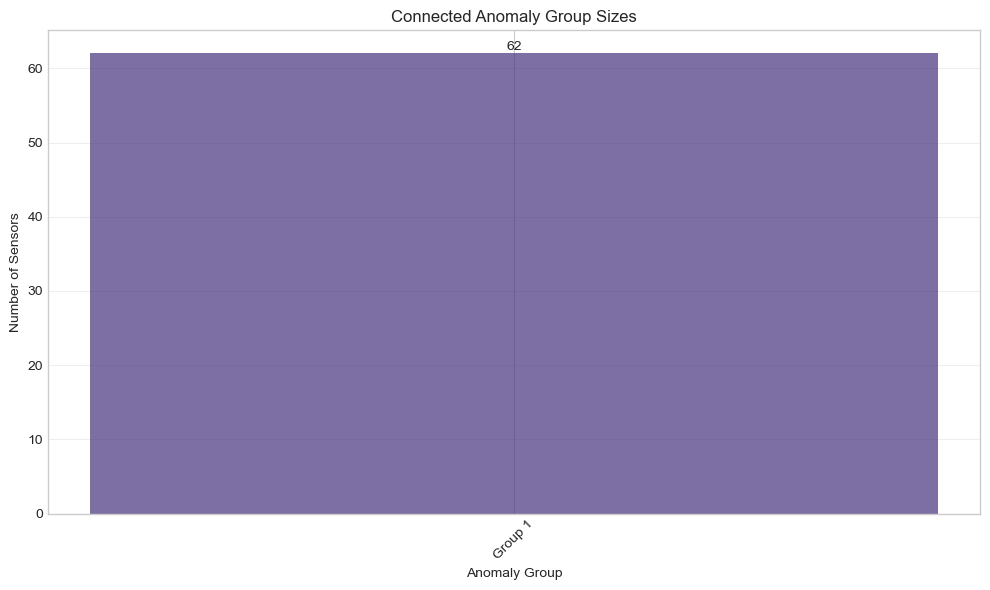

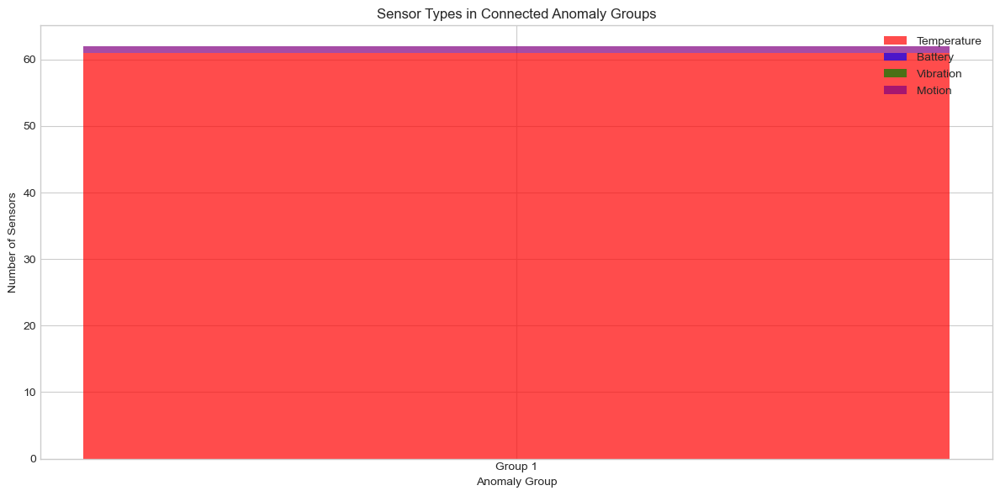

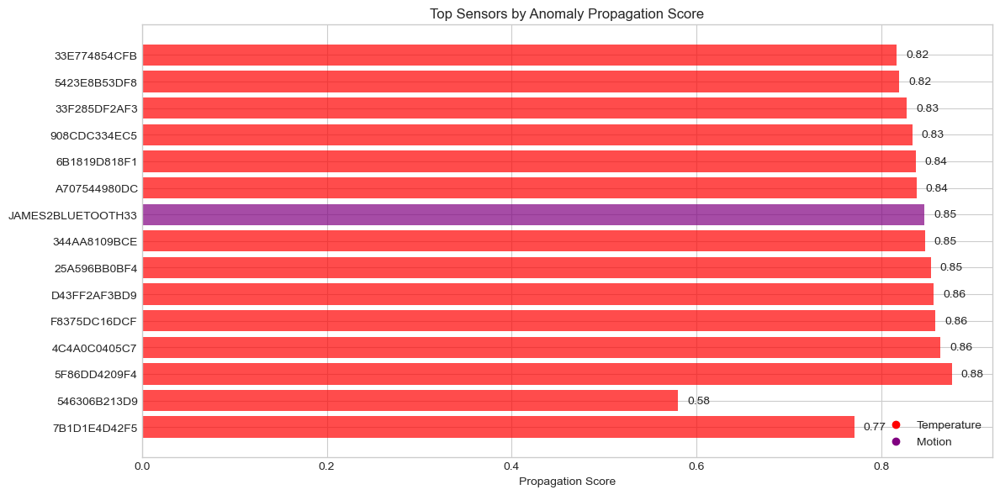

### Detailed Community Insights

#### Anomaly Group 1

**Size:** 62 sensors

**Average Propagation Score:** 0.68

**Accounts:** 3 unique accounts

**Top Accounts:** Account b1a7a54e-fd59-ec11-8f8e-000d3a09c7d0 (37 sensors), Account 85a8fb3b-d064-eb11-a812-000d3a09c0c9 (23 sensors), Account 55a0919b-3a7c-ef11-ac20-0022483c4e5c (2 sensors)

**Potential Root Cause:** 5F86DD4209F4 (Temperature) - Score: 0.88

**Common Features:** same_function:environmental, same_account:b1a7a54e-fd59-ec11-8f8e-000d3a09c7d0, temporal_overlap:1.00, threshold_violation, motion_related...

**Sensor Types:**

- Temperature: 61 sensors

- Motion: 1 sensors

**Strongest Relationship:** CEB6AF79A7C6 ↔ 7B1D1E4D42F5

---

Memory usage at after graph analysis: 397.73 MB

=== Graph-Based Relationship Analysis Summary ===
Connected Anomaly Groups: 1

Top Anomaly Groups:
  Group 1: 62 sensors
    Sensor Types: temperature: 61, motion: 1
    Potential Root Cause: 5F86DD4209F4 (temperature)

Top Anomalous Sensors: 20
Top 5 Sensors by Propagation Score:
  1. 7B1D1E4D42F5 (temperature): Score 0.77
  2. 546306B213D9 (temperature): Score 0.58
  3. 5F86DD4209F4 (temperature): Score 0.88
  4. 4C4A0C0405C7 (temperature): Score 0.86
  5. F8375DC16DCF (temperature): Score 0.86

Account Distribution Analysis:

Geographical Proximity Analysis:
Communities with location data: 1
Geographically clustered communities: 0

Graph-based relationship analysis completed. Results integrated for insight generation.
Memory usage at final: 397.77 MB


In [98]:
# Graph-Based Relationship Analysis for Anomaly Detection
import time
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from tqdm import tqdm
import seaborn as sns
from IPython.display import display, Markdown
import gc
import warnings
import logging
import traceback

# Suppress warnings
warnings.filterwarnings("ignore")

# Create directories for outputs
os.makedirs('./visualizations/graph_networks', exist_ok=True)
os.makedirs('./models', exist_ok=True)

# Function to track memory usage
def check_memory_usage(label):
    """Monitor memory usage at specific points"""
    import psutil
    process = psutil.Process(os.getpid())
    memory_info = process.memory_info()
    memory_mb = memory_info.rss / (1024 * 1024)
    print(f"Memory usage at {label}: {memory_mb:.2f} MB")

# Print pipeline stage header
print("="*80)
print("Stage 4: Graph-Based Relationship Analysis for Anomaly Detection")
print("="*80)
check_memory_usage("initial")

# Sanitize dataframes before passing to graph analysis
def sanitize_dataframe(df, sensor_type):
    """Ensure dataframes have required columns and no None values in SensorId"""
    if df is None or df.empty:
        print(f"Skipping empty {sensor_type} dataframe")
        return None
    
    # Ensure SensorId column exists
    if 'SensorId' not in df.columns:
        print(f"Missing SensorId column in {sensor_type} dataframe")
        return None
    
    # Remove rows with None SensorId
    null_mask = df['SensorId'].isnull()
    null_count = null_mask.sum()
    if null_count > 0:
        print(f"Removing {null_count} rows with null SensorId from {sensor_type} dataframe")
        df = df[~null_mask].copy()
    
    # Verify dataframe still has data
    if df.empty:
        print(f"No valid data left in {sensor_type} dataframe after sanitization")
        return None
        
    return df

# Combine all sensor dataframes into one dictionary
combined_data = {
    'temperature': sanitize_dataframe(temp_ts_anomalies, 'temperature'),
    'battery': sanitize_dataframe(batt_ts_anomalies, 'battery'),
    'vibration': sanitize_dataframe(vib_ts_anomalies, 'vibration'),
    'motion': sanitize_dataframe(motn_ts_anomalies, 'motion')
}

# Report counts of sensor data
for sensor_type, df in combined_data.items():
    if df is not None:
        print(f"  - {sensor_type.capitalize()} data: {df.shape[0]:,} records, {df['SensorId'].nunique()} sensors")
    else:
        print(f"  - {sensor_type.capitalize()} data: not available")

# Initialize the Graph Relationship detector with updated configuration
graph_detector = GraphRelationshipDetector(
    config={
        'relationship_discovery': {
            'min_correlation': 0.3,       # Minimum correlation to establish relationship
            'max_time_diff': 60,          # Maximum time difference (minutes) for temporal analysis
            'use_location_data': True,     # Use location data if available
            'use_functional_groups': True, # Use functional groups (e.g., same equipment)
            'min_anomaly_overlap': 0.05    # Minimum anomaly co-occurrence ratio - reduced threshold
        },
        'graph_analysis': {
            'gat_layers': 2,              # Number of GAT layers
            'attention_heads': 4,         # Number of attention heads per layer
            'embedding_dim': 64,          # Dimension of sensor embeddings
            'dropout': 0.2,               # Dropout rate
            'batch_size': 1000,           # Batch size for processing
            'use_anomaly_weights': True,  # Use anomaly scores as weights
            'propagation_threshold': 0.3   # Reduced threshold for anomaly propagation
        },
        'memory_optimization': {
            'max_sensors_per_batch': 200, # Max sensors to process in one batch
            'sparse_adjacency': True,     # Use sparse adjacency matrix
            'sensor_grouping': True       # Group sensors by type for efficiency
        }
    }
)

# Apply graph-based relationship analysis
print("\nApplying Graph-Based Relationship Analysis...")
start_time = time.time()

# Initialize variables to store results
insights = None
account_analysis = None
proximity_results = None

try:
    # Run detection
    insights = graph_detector.detect(combined_data)
    
    # Run account distribution analysis if sensors_df is available
    if 'sensors_df' in globals():
        account_analysis = graph_detector.analyze_account_distribution(sensors_df)
        
        # Run proximity analysis
        print("\nAnalyzing geographical proximity of sensors in anomaly groups...")
        proximity_results = graph_detector.analyze_sensor_proximity(sensors_df)
    
    # Record time
    end_time = time.time()
    print(f"Analysis completed in {end_time - start_time:.2f} seconds")

except Exception as e:
    print(f"Error in graph-based relationship analysis: {str(e)}")
    traceback.print_exc()

# Before visualization
print("Checking graph detector results...")
print("Self.results:", graph_detector.results)
if hasattr(graph_detector, 'results'):
    print("Results keys:", graph_detector.results.keys())
    if 'insights' in graph_detector.results:
        print("Insights keys:", graph_detector.results['insights'].keys())
    
# Visualization and result processing (outside of try-except)
try:
    # Visualize the network in the notebook
    if hasattr(graph_detector, 'visualize_network_interactive'):
        graph_detector.visualize_network_interactive()
    
    # Visualize results
    if hasattr(graph_detector, 'visualize_graph_results'):
        graph_detector.visualize_graph_results()
    
    # Force garbage collection
    gc.collect()
    check_memory_usage("after graph analysis")
    
    # Print summary of findings
    print("\n=== Graph-Based Relationship Analysis Summary ===")
    
    # Print details of communities
    if insights and insights.get('community_insights'):
        print(f"Connected Anomaly Groups: {len(insights.get('community_insights', []))}")
        print("\nTop Anomaly Groups:")
        for i, community in enumerate(insights['community_insights'][:3]):  # Top 3 communities
            print(f"  Group {i+1}: {community['size']} sensors")
            print(f"    Sensor Types: {', '.join([f'{type_}: {len(sensors)}' for type_, sensors in community['sensors_by_type'].items()])}")
            print(f"    Potential Root Cause: {community['potential_root_cause']['sensor_id']} ({community['potential_root_cause']['sensor_type']})")
    
    # Print top sensors
    if insights and insights.get('top_sensors'):
        print(f"\nTop Anomalous Sensors: {len(insights.get('top_sensors', []))}")
        print("Top 5 Sensors by Propagation Score:")
        for i, sensor in enumerate(insights['top_sensors'][:5]):
            print(f"  {i+1}. {sensor['sensor_id']} ({sensor['sensor_type']}): Score {sensor['propagation_score']:.2f}")
    
    # Print account distribution if available
    if account_analysis:
        print("\nAccount Distribution Analysis:")
        for community_id, analysis in account_analysis.items():
            if analysis.get('dominant_account'):
                print(f"  Community {community_id.split('_')[1]}: "
                      f"Dominated by Account {analysis['dominant_account']} "
                      f"({analysis['percentages'][analysis['dominant_account']]:.1f}% of sensors)")
    
    # Print proximity results if available
    if proximity_results and proximity_results.get('overall', {}).get('communities_with_location_data', 0) > 0:
        print("\nGeographical Proximity Analysis:")
        print(f"Communities with location data: {proximity_results['overall']['communities_with_location_data']}")
        print(f"Geographically clustered communities: {proximity_results['overall']['clustered_communities']}")

except Exception as e:
    print(f"Error processing graph relationship analysis results: {str(e)}")
    traceback.print_exc()

# Store the final results for insight generation
final_insights = {
    'statistical': {
        'temperature': statistical_detector.get_results('temperature'),
        'battery': statistical_detector.get_results('battery'),
        'vibration': statistical_detector.get_results('vibration'),
        'motion': statistical_detector.get_results('motion')
    },
    'isolation_forest': {
        'temperature': isolation_forest_detector.get_results('temperature'),
        'battery': isolation_forest_detector.get_results('battery'),
        'vibration': isolation_forest_detector.get_results('vibration'),
        'motion': isolation_forest_detector.get_results('motion')
    },
    'time_series': {
        'temperature': time_series_detector.get_results('temperature'),
        'battery': time_series_detector.get_results('battery'),
        'vibration': time_series_detector.get_results('vibration'),
        'motion': time_series_detector.get_results('motion')
    },
    'graph_relationship': graph_detector.get_results()
}

print("\nGraph-based relationship analysis completed. Results integrated for insight generation.")
check_memory_usage("final")

## Risk Insight Generation with ChatGPT API Integration

### Insight Generation Pipeline
This pipeline transforms anomaly detection results into clear, actionable insights using ChatGPT. It generates:

- Short-term alerts for immediate issues
- Long-term trend insights for systemic problems
- Relationship insights for correlated anomalies across sensors

The system intelligently prioritizes insights based on:

- Threshold violations (highest priority)
- Known sensors specified in project requirements
- Anomaly severity scores
- Relationship patterns between sensors

### Insight Generation Pipeline Overview

The AgenticInsightGenerator class uses ChatGPT to create intelligent, contextual insights from our anomaly detection results. This final pipeline stage transforms technical data into actionable business insights that guide maintenance and operations decisions.

### Key features:

- Multi-level insights: Generates short-term alerts, long-term trend analysis, and relationship insights
- Prioritization system: Gives absolute priority to threshold violations and known sensors
- Asset mapping: Associates sensors with physical assets for better context
- Customized prompting: Tailors ChatGPT prompts based on sensor type and data characteristics
- Maintenance assistance: Provides responses to equipment maintenance queries
- Interactive dashboard: Creates an HTML dashboard with all insights
- Memory efficiency: Processes data in batches and implements memory optimization

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime, timedelta
import json
import os
import gc
import logging
import requests
import time
import random
from tqdm.notebook import tqdm
from IPython.display import display, Markdown, HTML

# Create output directories
insight_dir = './insights'
os.makedirs(insight_dir, exist_ok=True)
os.makedirs('./visualizations/insights', exist_ok=True)

# Setup logging
logging.basicConfig(level=logging.INFO, 
                    format='%(asctime)s - %(name)s - %(levelname)s - %(message)s')
logger = logging.getLogger('insight_generator')

class AgenticInsightGenerator:
    """
    Enhanced insight generator that leverages ChatGPT API to create
    natural language insights from anomaly detection results.
    
    This class processes anomaly detection results from the multi-stage
    detection pipeline and generates both short-term alerts and long-term
    trend insights using ChatGPT. It also analyzes relationships between
    sensors and can answer maintenance-related queries.
    """
    
    def __init__(self, config=None, api_key=None):
        """
        Initialize the agentic insight generator
        
        Parameters:
        -----------
        config : dict, optional
            Configuration parameters
        api_key : str, optional
            OpenAI API key for ChatGPT (if not provided, looks for OPENAI_API_KEY env var)
        """
        # Default configuration
        self.default_config = {
            'api': {
                'endpoint': 'https://api.openai.com/v1/chat/completions',
                'model': 'gpt-4',  # Default to GPT-4
                'max_tokens': 1000,
                'temperature': 0.2,  # Low temperature for consistent, focused responses
                'api_key': api_key or os.environ.get('OPENAI_API_KEY', '')
            },
            'insight_generation': {
                'max_insights_per_type': 20,    # Maximum insights per sensor type
                'min_anomaly_score': 0.5,       # Minimum score to generate insight
                'threshold_boost': 0.3,         # Boost for threshold violations
                'relationship_boost': 0.2,      # Boost for related sensors
                'use_asset_information': True,  # Include asset information in insights
                'use_maintenance_history': True # Consider past maintenance if available
            },
            'asset_mapping': {
                'enabled': True,  # Enable asset mapping
                'random_mapping': True,  # Use random mapping if no explicit mapping is available
                'mapping_file': './asset_sensor_mapping.json'  # File to store/load mapping
            },
            'data_processing': {
                'batch_size': 100,  # Process in batches
                'memory_optimization': True,  # Use memory optimization
                'highlight_key_sensors': True  # Highlight sensors identified in project instructions
            },
            'known_sensors': {
                # Sensors specified in project instructions for validation
                'vibration': [
                    'MA1-00023', 'MA1-00344', 'MA1-00371', 'MA1-00328', 'MA1-01254'
                ],
                'temperature': [
                    'MA1-01309', 'MA1-01256', 'MA1-01265', 'MA1-01266'
                ]
            }
        }
        
        # Merge provided config with default
        self.config = config or self.default_config
        
        # Setup logging
        self.logger = logging.getLogger('agentic_insight_generator')
        
        # Initialize API key
        if api_key:
            self.config['api']['api_key'] = api_key
        
        # Store generated insights
        self.insights = {
            'short_term': [],
            'long_term': [],
            'relationships': []
        }
        
        # Store asset mappings
        self.asset_sensor_mapping = {}
        self._load_asset_mapping()
        
        # Store context for conversation history
        self.conversation_history = {}
        
        # Load example insights for few-shot learning
        self.example_insights = self._load_example_insights()
    
    def _load_asset_mapping(self):
        """
        Load asset-sensor mapping from file if it exists
        """
        mapping_file = self.config['asset_mapping']['mapping_file']
        if os.path.exists(mapping_file):
            try:
                with open(mapping_file, 'r') as f:
                    self.asset_sensor_mapping = json.load(f)
                self.logger.info(f"Loaded asset-sensor mapping with {len(self.asset_sensor_mapping)} entries")
            except Exception as e:
                self.logger.warning(f"Error loading asset mapping: {str(e)}")
    
    def _save_asset_mapping(self):
        """
        Save asset-sensor mapping to file
        """
        mapping_file = self.config['asset_mapping']['mapping_file']
        try:
            with open(mapping_file, 'w') as f:
                json.dump(self.asset_sensor_mapping, f, indent=2)
            self.logger.info(f"Saved asset-sensor mapping with {len(self.asset_sensor_mapping)} entries")
        except Exception as e:
            self.logger.warning(f"Error saving asset mapping: {str(e)}")
    
    def _load_example_insights(self):
        """
        Load example insights for few-shot learning
        
        Returns:
        --------
        dict
            Dictionary of example insights by type
        """
        # These examples guide the LLM's response format and quality
        examples = {
            'short_term': [
                "Motor #45 has stayed off for three consecutive days, even though it normally "
                "cycles every few hours. This sudden change in pattern signals a potential "
                "operational issue that should be investigated immediately.",
                
                "The main harmonic vibration in Separator #12 has risen from 900 to 1500 "
                "milliG since January 1, indicating accelerated wear. Consider scheduling "
                "maintenance now to avoid an unexpected breakdown before reaching the "
                "usual 2000 milliG threshold.",
                
                "Fire Control Valve #123 has recorded more unintended movements in the last "
                "week than any other valve, raising concerns of unauthorized tampering or "
                "mishandling. Tighten security measures to reduce the risk of accidental or "
                "malicious activation."
            ],
            'long_term': [
                "Compressor MA1-00344 shows a gradual increase in vibration magnitude over "
                "the past 3 months, with the RMS value rising from 110 to 170 milliG. While "
                "still below critical thresholds, this trend suggests bearing wear that should "
                "be addressed during the next scheduled maintenance to prevent acceleration.",
                
                "HVAC unit MA1-01266 shows a 12% increase in average temperature over the last "
                "30 days, beyond what's expected from seasonal changes. This pattern indicates "
                "decreasing efficiency, likely due to filter clogging or refrigerant issues. "
                "Recommend proactive maintenance to restore optimal performance.",
                
                "Battery voltage analysis for sensors in Building B shows a collective decline of "
                "15% faster than expected. Environmental factors or electrical interference may "
                "be causing accelerated battery drain. Consider investigating power quality in "
                "this area to extend sensor battery life."
            ],
            'relationships': [
                "Multiple sensors (MA1-00023, MA1-00344, MA1-00371) on the west wing HVAC system "
                "show correlated temperature and vibration anomalies. The root cause appears to be "
                "the primary air handler (MA1-00023) which shows the earliest onset of vibration "
                "increase. This cascading effect requires immediate attention to prevent system-wide failure.",
                
                "Battery sensors across the manufacturing floor (MA1-01254, MA1-01256) are showing "
                "simultaneous voltage drops despite being installed at different times. This pattern "
                "suggests an environmental factor affecting power quality rather than normal battery "
                "aging. Investigate potential electromagnetic interference from nearby equipment."
            ],
            'maintenance_query': [
                "Query: My generator is heating up. How do I fix it?\n\n"
                "Response: Based on your description of the generator heating up, I'll need to provide a systematic approach:\n\n"
                "1. **Safety First**: Turn off the generator and allow it to cool completely before inspection.\n\n"
                "2. **Potential Causes and Solutions**:\n"
                "   - **Insufficient Cooling**: Check for blocked air vents or cooling fins. Clean thoroughly with compressed air.\n"
                "   - **Low Oil Level**: Verify oil level is within manufacturer specifications. Add appropriate oil if needed.\n"
                "   - **Overloading**: Ensure you're not exceeding the generator's rated capacity. Reduce load if necessary.\n"
                "   - **Dirty Air Filter**: Inspect and clean/replace air filter according to maintenance schedule.\n"
                "   - **Faulty Cooling System**: Check cooling fan operation and radiator condition.\n\n"
                "3. **Maintenance Recommendations**:\n"
                "   - Implement regular cooldown periods during extended operation\n"
                "   - Follow manufacturer's maintenance schedule for oil changes\n"
                "   - Keep generator in a well-ventilated area\n\n"
                "4. **When to Seek Professional Help**:\n"
                "   - If temperature issues persist after these steps\n"
                "   - If you notice unusual noises or smoke\n"
                "   - For generators under warranty\n\n"
                "Temperature monitoring sensors can be installed to provide early warnings of overheating conditions in the future."
            ]
        }
        
        return examples
    
    def _create_asset_mapping(self, sensors_df, assets_df):
        """
        Create mapping between sensors and assets
        
        Parameters:
        -----------
        sensors_df : pandas.DataFrame
            DataFrame with sensor metadata
        assets_df : pandas.DataFrame
            DataFrame with asset data
            
        Returns:
        --------
        dict
            Mapping from sensor ID to asset description
        """
        # Skip if mapping is disabled
        if not self.config['asset_mapping']['enabled']:
            return {}
            
        # Check if we already have a mapping
        if self.asset_sensor_mapping:
            return self.asset_sensor_mapping
        
        # Check if dataframes are valid
        if sensors_df is None or sensors_df.empty or assets_df is None or assets_df.empty:
            self.logger.warning("Cannot create asset mapping: missing or empty dataframes")
            return {}
        
        mapping = {}
        
        # Check if asset_id exists in both dataframes
        if 'AssetId' in sensors_df.columns and 'AssetId' in assets_df.columns:
            self.logger.info("Creating asset mapping using AssetId")
            
            # Join dataframes on AssetId
            sensor_assets = pd.merge(
                sensors_df, 
                assets_df[['AssetId', 'Description']], 
                on='AssetId', 
                how='left'
            )
            
            # Create mapping
            bt_col = 'BluetoothAddress' if 'BluetoothAddress' in sensor_assets.columns else 'SensorId'
            for _, row in sensor_assets.iterrows():
                if pd.notna(row[bt_col]) and pd.notna(row['Description']):
                    mapping[row[bt_col]] = row['Description']
                    
        # If mapping is empty and random mapping is enabled, create a random mapping
        if not mapping and self.config['asset_mapping']['random_mapping']:
            self.logger.info("Creating random asset mapping")
            
            # Get sensor IDs
            bt_col = 'BluetoothAddress' if 'BluetoothAddress' in sensors_df.columns else 'SensorId'
            sensor_ids = sensors_df[bt_col].dropna().unique().tolist()
            
            # Get asset descriptions
            if 'Description' in assets_df.columns:
                asset_descriptions = assets_df['Description'].dropna().unique().tolist()
            else:
                # Create generic descriptions if not available
                asset_descriptions = [
                    "HVAC Fan Motor", "CNC Machine", "Cooling Tower", "Air Compressor",
                    "Water Pump", "Refrigeration Unit", "Generator", "Conveyor Belt",
                    "Industrial Oven", "Hydraulic Press", "Chiller", "Boiler", 
                    "Air Handler", "Electrical Panel", "Security System"
                ]
            
            # Create random mapping
            for sensor_id in sensor_ids:
                if len(asset_descriptions) > 0:
                    # Choose a random asset description and remove it from the list
                    description = random.choice(asset_descriptions)
                    asset_descriptions.remove(description)
                    
                    # Add numbered identifier
                    unit_num = random.randint(1, 20)
                    mapping[sensor_id] = f"{description} #{unit_num}"
                else:
                    # If we run out of descriptions, create generic ones
                    asset_type = random.choice([
                        "Motor", "Fan", "Pump", "Compressor", "Generator", 
                        "Chiller", "Boiler", "Sensor", "Machine"
                    ])
                    unit_num = random.randint(1, 100)
                    mapping[sensor_id] = f"{asset_type} #{unit_num}"
            
            # Special handling for known sensors from project instructions
            for sensor_type, sensor_list in self.config['known_sensors'].items():
                for i, sensor_id in enumerate(sensor_list):
                    if sensor_id not in mapping:
                        continue
                        
                    if sensor_type == 'vibration':
                        if sensor_id == 'MA1-00023':
                            mapping[sensor_id] = "Roof Fan Motor #1"
                        elif sensor_id == 'MA1-00344' or sensor_id == 'MA1-00371' or sensor_id == 'MA1-00328':
                            mapping[sensor_id] = f"CNC Machine #{i+1}"
                        elif sensor_id == 'MA1-01254':
                            mapping[sensor_id] = "Fan Motor #2"
                    elif sensor_type == 'temperature':
                        if sensor_id == 'MA1-01309':
                            mapping[sensor_id] = "Fan Motor #3"
                        elif sensor_id == 'MA1-01266':
                            mapping[sensor_id] = "HVAC System #1"
                        else:
                            mapping[sensor_id] = f"Temperature Sensor #{i+1}"
        
        # Save mapping
        self.asset_sensor_mapping = mapping
        self._save_asset_mapping()
        
        self.logger.info(f"Created asset mapping with {len(mapping)} entries")
        return mapping
    
    def _get_value_column(self, sensor_type):
        """
        Get the main value column for a sensor type
        
        Parameters:
        -----------
        sensor_type : str
            Type of sensor
            
        Returns:
        --------
        str
            Main value column name
        """
        if sensor_type == 'temperature':
            return 'TemperatureInCelsius'
        elif sensor_type == 'battery':
            return 'BatteryVoltage'
        elif sensor_type == 'vibration':
            # Prioritize RMS magnitude as specified in requirements
            return 'MagnitudeRMSInMilliG'
        elif sensor_type == 'motion':
            # Try different column names for motion data
            return 'max_magnitude'
        else:
            return None
    
    def _extract_anomaly_data(self, df, sensor_type):
        """
        Extract anomaly data from dataframe
        
        Parameters:
        -----------
        df : pandas.DataFrame
            DataFrame with anomaly detection results
        sensor_type : str
            Type of sensor
            
        Returns:
        --------
        list
            List of sensors with anomalies and their details
        """
        if df is None or df.empty:
            return []
            
        # Get value column
        value_col = self._get_value_column(sensor_type)
        if not value_col:
            self.logger.warning(f"No value column identified for {sensor_type}")
            return []
            
        # If value column doesn't exist in this dataframe, try to find an alternative
        if value_col not in df.columns:
            if sensor_type == 'vibration':
                # Look for any magnitude column
                magnitude_cols = [col for col in df.columns if 'Magnitude' in col and 'Threshold' not in col]
                if magnitude_cols:
                    value_col = magnitude_cols[0]
                    self.logger.info(f"Using {value_col} as alternative for vibration data")
            elif sensor_type == 'motion':
                if 'daily_event_count' in df.columns:
                    value_col = 'daily_event_count'
                    self.logger.info(f"Using daily_event_count as alternative for motion data")
        
        # If still no value column, cannot proceed
        if value_col not in df.columns:
            self.logger.warning(f"Value column {value_col} not found in {sensor_type} dataframe")
            return []
        
        # Find anomaly columns
        anomaly_cols = [
            col for col in df.columns 
            if 'anomaly' in col.lower() or 'violation' in col.lower()
        ]
        
        if not anomaly_cols:
            self.logger.warning(f"No anomaly columns found in {sensor_type} dataframe")
            return []
        
        # Group by sensor ID
        sensors_data = []
        
        for sensor_id in df['SensorId'].unique():
            try:
                sensor_df = df[df['SensorId'] == sensor_id]
                
                # Skip if no data
                if sensor_df.empty:
                    continue
                    
                # Count anomalies
                anomaly_counts = {}
                for col in anomaly_cols:
                    if col in sensor_df.columns:
                        anomaly_counts[col] = int(sensor_df[col].sum())
                
                # Skip if no anomalies (unless it's a motion sensor)
                total_anomalies = sum(anomaly_counts.values())
                if total_anomalies == 0 and sensor_type != 'motion':
                    continue
                
                # Get value statistics
                value_stats = {
                    'mean': float(sensor_df[value_col].mean()),
                    'min': float(sensor_df[value_col].min()),
                    'max': float(sensor_df[value_col].max()),
                    'std': float(sensor_df[value_col].std()),
                    'current': float(sensor_df[value_col].iloc[-1] if 'EventTimeUtc' in sensor_df.columns else sensor_df[value_col].iloc[0])
                }
                
                # Get threshold information if available
                threshold_info = {}
                
                # Find threshold columns based on sensor type
                threshold_cols = []
                if sensor_type == 'temperature':
                    threshold_cols = [col for col in sensor_df.columns if 'Temperature' in col and 'Threshold' in col]
                elif sensor_type == 'battery':
                    threshold_cols = [col for col in sensor_df.columns if 'Battery' in col and 'Threshold' in col]
                elif sensor_type == 'vibration':
                    threshold_cols = [col for col in sensor_df.columns if 'Magnitude' in col and 'Threshold' in col]
                elif sensor_type == 'motion':
                    threshold_cols = [col for col in sensor_df.columns if 'threshold' in col.lower()]
                
                for col in threshold_cols:
                    if col in sensor_df.columns and not sensor_df[col].isna().all():
                        threshold_info[col] = float(sensor_df[col].iloc[0])
                
                # Extract time range if available
                time_range = {}
                if 'EventTimeUtc' in sensor_df.columns:
                    time_range['start'] = sensor_df['EventTimeUtc'].min()
                    time_range['end'] = sensor_df['EventTimeUtc'].max()
                    time_range['duration'] = time_range['end'] - time_range['start']
                
                # Calculate overall anomaly score
                anomaly_score = 0.0
                
                # Use existing score columns if available
                score_cols = [col for col in sensor_df.columns if 'score' in col.lower() and 'z' not in col.lower()]
                if score_cols:
                    for col in score_cols:
                        if not sensor_df[col].isna().all():
                            # Use mean or max score, whichever is higher
                            mean_score = float(sensor_df[col].mean())
                            max_score = float(sensor_df[col].max())
                            anomaly_score = max(anomaly_score, mean_score, max_score * 0.7)  # Use mean or 70% of max, whichever is higher
                else:
                    # Calculate based on anomaly counts relative to data size
                    if len(sensor_df) > 0:
                        anomaly_ratio = total_anomalies / len(sensor_df)
                        anomaly_score = min(1.0, anomaly_ratio * 2)  # Cap at 1.0
                
                # Special handling for sensors with threshold violations (give them highest priority)
                if 'threshold_violation' in anomaly_counts and anomaly_counts['threshold_violation'] > 0:
                    # Apply threshold boost
                    threshold_boost = self.config['insight_generation']['threshold_boost']
                    anomaly_score = min(1.0, anomaly_score + threshold_boost)
                
                # Special handling for motion sensors (all events are anomalies)
                if sensor_type == 'motion':
                    anomaly_score = max(anomaly_score, 0.7)  # Minimum 0.7 score for motion
                
                # Get asset name if available
                asset_name = self.asset_sensor_mapping.get(sensor_id, "")
                
                # Add to sensors data
                sensor_data = {
                    'sensor_id': sensor_id,
                    'sensor_type': sensor_type,
                    'anomaly_counts': anomaly_counts,
                    'total_anomalies': total_anomalies,
                    'value_stats': value_stats,
                    'threshold_info': threshold_info,
                    'time_range': time_range,
                    'anomaly_score': anomaly_score,
                    'record_count': len(sensor_df),
                    'asset_name': asset_name
                }
                
                # Check if this is a known sensor from project instructions
                if sensor_id in self.config['known_sensors'].get(sensor_type, []):
                    sensor_data['is_known_sensor'] = True
                
                sensors_data.append(sensor_data)
                
            except Exception as e:
                self.logger.warning(f"Error processing {sensor_type} sensor {sensor_id}: {str(e)}")
        
        # Sort by anomaly score
        sensors_data.sort(key=lambda x: x['anomaly_score'], reverse=True)
        
        return sensors_data
    
    def _extract_trends(self, df, sensor_type, sensor_id=None):
        """
        Extract trend information for a sensor or all sensors
        
        Parameters:
        -----------
        df : pandas.DataFrame
            DataFrame with sensor data
        sensor_type : str
            Type of sensor
        sensor_id : str, optional
            Specific sensor ID to analyze, if None analyze all
            
        Returns:
        --------
        dict
            Trend information
        """
        if df is None or df.empty:
            return {}
            
        # Get value column
        value_col = self._get_value_column(sensor_type)
        if not value_col or value_col not in df.columns:
            return {}
            
        # Check if EventTimeUtc is available
        if 'EventTimeUtc' not in df.columns:
            return {}
            
        # Filter by sensor if specified
        if sensor_id:
            df = df[df['SensorId'] == sensor_id]
            if df.empty:
                return {}
        
        # Get unique sensors
        if sensor_id:
            sensors = [sensor_id]
        else:
            sensors = df['SensorId'].unique()
        
        trends = {}
        
        for s_id in sensors:
            sensor_df = df[df['SensorId'] == s_id]
            
            # Skip if too few data points
            if len(sensor_df) < 10:
                continue
                
            # Sort by time
            sensor_df = sensor_df.sort_values('EventTimeUtc')
            
            # Basic trend calculation
            try:
                # Calculate trend using linear regression
                x = np.arange(len(sensor_df))
                y = sensor_df[value_col].values
                
                # Simple linear regression
                n = len(x)
                if n > 1:
                    # Calculate slope and intercept
                    slope = ((n * np.sum(x * y)) - (np.sum(x) * np.sum(y))) / ((n * np.sum(x ** 2)) - (np.sum(x) ** 2))
                    intercept = (np.sum(y) - (slope * np.sum(x))) / n
                    
                    # Calculate R-squared
                    y_pred = slope * x + intercept
                    ss_total = np.sum((y - np.mean(y)) ** 2)
                    ss_residual = np.sum((y - y_pred) ** 2)
                    r_squared = 1 - (ss_residual / ss_total) if ss_total > 0 else 0
                    
                    # Calculate start and end values
                    start_val = sensor_df[value_col].iloc[0]
                    end_val = sensor_df[value_col].iloc[-1]
                    
                    # Calculate percentage change
                    if abs(start_val) > 0.001:  # Avoid division by very small numbers
                        pct_change = ((end_val - start_val) / abs(start_val)) * 100
                    else:
                        pct_change = 0
                    
                    # Determine trend direction
                    if slope > 0:
                        direction = 'increasing'
                    elif slope < 0:
                        direction = 'decreasing'
                    else:
                        direction = 'stable'
                    
                    # Check for seasonality
                    has_seasonality = False
                    seasonal_period = None
                    
                    # For temperature and vibration data, check for daily patterns
                    if sensor_type in ['temperature', 'vibration'] and len(sensor_df) >= 24:
                        # Group by hour
                        sensor_df['hour'] = sensor_df['EventTimeUtc'].dt.hour
                        hourly_means = sensor_df.groupby('hour')[value_col].mean()
                        
                        # Calculate hourly variation
                        hourly_std = hourly_means.std()
                        overall_std = sensor_df[value_col].std()
                        
                        # If hourly variation is significant compared to overall
                        if hourly_std > 0 and overall_std > 0:
                            seasonality_strength = hourly_std / overall_std
                            has_seasonality = seasonality_strength > 0.3
                            if has_seasonality:
                                seasonal_period = 24  # hours
                                
                                # Calculate correlation between days
                                if len(sensor_df) >= 48:  # At least 2 days
                                    sensor_df['day'] = sensor_df['EventTimeUtc'].dt.day
                                    day_hour_pivot = sensor_df.pivot_table(
                                        index='day', columns='hour', values=value_col, aggfunc='mean'
                                    )
                                    
                                    # If we have at least 2 days of data
                                    if day_hour_pivot.shape[0] >= 2:
                                        # Calculate correlation between consecutive days
                                        correlations = []
                                        for i in range(day_hour_pivot.shape[0]-1):
                                            day1 = day_hour_pivot.iloc[i].dropna()
                                            day2 = day_hour_pivot.iloc[i+1].dropna()
                                            
                                            # Get common hours
                                            common_hours = day1.index.intersection(day2.index)
                                            if len(common_hours) >= 12:  # At least half a day
                                                corr = day1[common_hours].corr(day2[common_hours])
                                                correlations.append(corr)
                                        
                                        # Check if there's strong correlation between days
                                        if correlations and np.mean(correlations) > 0.7:
                                            # Confirmed recurring daily pattern
                                            has_seasonality = True
                    
                    # Get time range
                    time_range = sensor_df['EventTimeUtc'].max() - sensor_df['EventTimeUtc'].min()
                    days = time_range.total_seconds() / (24 * 3600)
                    
                    trends[s_id] = {
                        'slope': slope,
                        'intercept': intercept,
                        'r_squared': r_squared,
                        'direction': direction,
                        'start_value': float(start_val),
                        'end_value': float(end_val),
                        'pct_change': float(pct_change),
                        'days': float(days),
                        'has_seasonality': has_seasonality,
                        'seasonal_period': seasonal_period
                    }
            except Exception as e:
                self.logger.debug(f"Error calculating trend for {s_id}: {str(e)}")
        
        return trends
    
    def _build_insight_prompt(self, data, insight_type):
        """
        Build the prompt for a specific insight type
        
        Parameters:
        -----------
        data : dict
            Data to use for insight generation
        insight_type : str
            Type of insight ('short_term', 'long_term', 'relationship')
            
        Returns:
        --------
        str
            Prompt for ChatGPT
        """
        if insight_type == 'short_term':
            return self._build_short_term_prompt(data)
        elif insight_type == 'long_term':
            return self._build_long_term_prompt(data)
        elif insight_type == 'relationship':
            return self._build_relationship_prompt(data)
        elif insight_type == 'maintenance_query':
            return self._build_maintenance_query_prompt(data)
        else:
            return "Please generate a risk insight based on the provided data."
    
    def _build_short_term_prompt(self, data):
        """
        Build prompt for short-term insight generation
        
        Parameters:
        -----------
        data : dict
            Sensor data
            
        Returns:
        --------
        str
            ChatGPT prompt
        """
        # Get basic sensor information
        sensor_id = data.get('sensor_id', 'unknown')
        device_id = data.get('device_id', sensor_id)  # Use DeviceID if available, else use sensor_id
        sensor_type = data.get('sensor_type', 'unknown')
        asset_name = data.get('asset_name', f"{sensor_type.capitalize()} Sensor {device_id}")
        
        # Get value statistics
        value_stats = data.get('value_stats', {})
        current = value_stats.get('current', 0)
        mean = value_stats.get('mean', 0)
        min_val = value_stats.get('min', 0)
        max_val = value_stats.get('max', 0)
        
        # Get anomaly information
        anomaly_counts = data.get('anomaly_counts', {})
        anomaly_score = data.get('anomaly_score', 0)
        
        # Get threshold information
        threshold_info = data.get('threshold_info', {})
        threshold_violations = anomaly_counts.get('threshold_violation', 0)
        has_threshold_violations = threshold_violations > 0
        
        # Building prompt with context
        prompt = (
            f"Please generate a short-term risk insight for a {sensor_type} sensor with Device ID '{device_id}' "
            f"attached to '{asset_name}'. The insight should provide specific information about "
            f"the detected anomaly and actionable recommendations for addressing it. "
            f"Make it concise, professional, and strictly factual."
            f"\n\n"
            f"Sensor data:\n"
            f"- Device ID: {device_id}\n"
            f"- Current value: {current}\n"
            f"- Normal range: Mean {mean}, Min {min_val}, Max {max_val}\n"
        )
        
           
        # Add threshold information if available
        if threshold_info:
            prompt += "- Thresholds:\n"
            for name, value in threshold_info.items():
                prompt += f"  * {name}: {value}\n"
            
            if has_threshold_violations:
                prompt += f"- CRITICAL: {threshold_violations} threshold violations detected. This indicates a serious condition requiring immediate attention.\n"
        
        # Add anomaly information
        prompt += f"- Anomaly score: {anomaly_score:.2f} (0-1 scale, higher means more severe)\n"
        prompt += "- Anomaly counts:\n"
        for name, count in anomaly_counts.items():
            prompt += f"  * {name}: {count}\n"
        
        # Add time information if available
        time_range = data.get('time_range', {})
        if time_range:
            start = time_range.get('start')
            end = time_range.get('end')
            duration = time_range.get('duration')
            
            if start and end:
                prompt += f"- Time range: {start} to {end} (duration: {duration})\n"
        
        # Add sensor-specific context based on type
        if sensor_type == 'temperature':
            prompt += (
                "\nContext for temperature sensors:\n"
                "- High temperatures may indicate overheating, HVAC issues, or fire risks\n"
                "- Low temperatures may indicate freezing conditions or cooling system issues\n"
                "- Sudden temperature changes often indicate equipment or environmental problems\n"
                "- Temperature threshold violations require immediate attention\n"
            )
        elif sensor_type == 'battery':
            prompt += (
                "\nContext for battery sensors:\n"
                "- Batteries should maintain at least 2.0V to function properly\n"
                "- Rapid voltage decline indicates battery failure or excessive drain\n"
                "- Battery issues affect sensor reliability and data collection\n"
                "- Plan battery replacements before they reach critical levels\n"
            )
        elif sensor_type == 'vibration':
            prompt += (
                "\nContext for vibration sensors:\n"
                "- Focus on RMS magnitude values as primary indicators\n"
                "- High vibration often indicates mechanical issues, imbalance, or wear\n"
                "- Vibration patterns can indicate specific equipment problems\n"
                "- Threshold violations may indicate immediate maintenance is needed\n"
                "- Sudden vibration changes may indicate component failure\n"
            )
        elif sensor_type == 'motion':
            prompt += (
                "\nContext for motion sensors:\n"
                "- All motion events should be treated as potential anomalies\n"
                "- Motion patterns outside normal operating hours require investigation\n"
                "- Repeated motion events may indicate security concerns\n"
                "- Motion sensors help detect unauthorized access or equipment activity\n"
            )
        
        # Add specific instructions
        prompt += (
            "\nInstructions:\n"
        )
        
        # Special instruction for threshold violations
        if has_threshold_violations:
            prompt += (
                "1. Start your insight with 'CRITICAL:' to highlight this is a threshold violation\n"
                "2. Clearly state which threshold was violated and by how much\n"
                "3. Emphasize this requires immediate attention and action\n"
                "4. Provide specific, actionable recommendations for addressing this critical issue\n"
                "5. Keep the insight under 75 words and make it compelling\n"
            )
        else:
            prompt += (
                "1. Start with a clear description of the specific anomaly detected\n"
                "2. Include specific numerical values and deviations from normal\n"
                "3. Explain the potential risks or impacts of this anomaly\n"
                "4. Provide specific, actionable recommendations\n"
                "5. Keep the insight under 75 words and make it compelling\n"
            )
        
        # Few-shot learning examples
        prompt += "\nExamples of good short-term insights:"
    
        # Include threshold violation examples prominently if this is a threshold violation
        if has_threshold_violations:
            prompt += (
                "\n- CRITICAL: Temperature Sensor #45 has exceeded the maximum threshold of 85°C, "
                "reaching 92.3°C. This indicates a severe overheating condition that requires "
                "immediate inspection. Shut down equipment and check for cooling system failures."
                
                "\n- CRITICAL: Vibration Magnitude for Separator #12 has reached 1500 milliG, "
                "exceeding the 1200 milliG threshold. This indicates accelerated wear and "
                "potential imminent failure. Schedule emergency maintenance within 24 hours."
                
                "\n- CRITICAL: Battery voltage has dropped to 1.8V, below the 2.0V minimum threshold. "
                "This indicates battery failure is imminent. Replace the battery immediately to "
                "prevent data loss and system downtime."
            )
        else:
            prompt += (
                "\n- Motor #45 has stayed off for three consecutive days, even though it normally "
                "cycles every few hours. This sudden change in pattern signals a potential "
                "operational issue that should be investigated immediately."
                
                "\n- The main harmonic vibration in Separator #12 has risen from 900 to 1500 "
                "milliG since January 1, indicating accelerated wear. Consider scheduling "
                "maintenance now to avoid an unexpected breakdown before reaching the "
                "usual 2000 milliG threshold."
                
                "\n- Fire Control Valve #123 has recorded more unintended movements in the last "
                "week than any other valve, raising concerns of unauthorized tampering or "
                "mishandling. Tighten security measures to reduce the risk of accidental or "
                "malicious activation."
            )
        
        # Final instruction
        prompt += (
            "\n\nNow generate a single, high-quality insight for this sensor without any "
            "preamble, explanation, or extraneous text. Respond with just the insight itself."
        )
        
        return prompt
    
    def _build_long_term_prompt(self, data):
        """
        Build prompt for long-term insight generation
        
        Parameters:
        -----------
        data : dict
            Sensor and trend data
            
        Returns:
        --------
        str
            ChatGPT prompt
        """
        # Get basic sensor information
        sensor_id = data.get('sensor_id', 'unknown')
        device_id = data.get('device_id', sensor_id)  # Use DeviceID if available, else use sensor_id
        sensor_type = data.get('sensor_type', 'unknown')
        asset_name = data.get('asset_name', f"{sensor_type.capitalize()} Sensor {device_id}")
        
        # Get trend information
        trend = data.get('trend', {})
        direction = trend.get('direction', 'unknown')
        pct_change = trend.get('pct_change', 0)
        days = trend.get('days', 0)
        has_seasonality = trend.get('has_seasonality', False)
        seasonal_period = trend.get('seasonal_period')
        start_value = trend.get('start_value', 0)
        end_value = trend.get('end_value', 0)
        r_squared = trend.get('r_squared', 0)
        
        # Building prompt with context
        prompt = (
            f"Please generate a long-term trend insight for a {sensor_type} sensor with Device ID '{device_id}' "
            f"attached to '{asset_name}'. The insight should focus on detected trends over time "
            f"and provide strategic recommendations. Make it concise, professional, and strictly factual."
            f"\n\n"
            f"Trend data:\n"
            f"- Device ID: {device_id}\n"
            f"- Direction: {direction}\n"
            f"- Percentage change: {pct_change:.2f}%\n"
            f"- Time period: {days:.1f} days\n"
            f"- Start value: {start_value}\n"
            f"- End value: {end_value}\n"
            f"- Trend strength (R²): {r_squared:.3f}\n"
        )
        
                
        # Add seasonality information
        if has_seasonality:
            prompt += f"- Has seasonality: Yes (period: {seasonal_period} hours)\n"
            prompt += "- This appears to be a recurring pattern, not a short-term anomaly\n"
        else:
            prompt += "- Has seasonality: No\n"
        
        # Add sensor-specific context based on type
        if sensor_type == 'temperature':
            prompt += (
                "\nContext for temperature trends:\n"
                "- Gradual temperature increases may indicate deteriorating HVAC efficiency\n"
                "- Seasonal patterns should be distinguished from equipment issues\n"
                "- Widening temperature ranges often indicate control system problems\n"
                "- Compare trends against expected seasonal changes\n"
            )
        elif sensor_type == 'battery':
            prompt += (
                "\nContext for battery trends:\n"
                "- Battery voltage should remain above 2.0V for proper operation\n"
                "- Normal battery discharge follows a predictable curve\n"
                "- Accelerated voltage decline indicates battery health issues\n"
                "- Estimate remaining battery life based on discharge rate\n"
            )
        elif sensor_type == 'vibration':
            prompt += (
                "\nContext for vibration trends:\n"
                "- Focus on RMS magnitude trends as primary indicators\n"
                "- Gradually increasing vibration often indicates progressive wear\n"
                "- Changes in frequency can indicate specific mechanical issues\n"
                "- Recommend maintenance before values reach critical thresholds\n"
            )
        elif sensor_type == 'motion':
            prompt += (
                "\nContext for motion trends:\n"
                "- Increasing motion frequency may indicate security or operational changes\n"
                "- Patterns in motion timing can reveal important operational insights\n"
                "- Compare against expected operational schedules\n"
            )
        
        # Add specific instructions
        prompt += (
            "\nInstructions:\n"
            "1. Focus on long-term patterns and their implications\n"
            "2. Distinguish between seasonal patterns and actual anomalies\n"
            "3. Include specific numerical values and trend metrics\n"
            "4. Explain potential long-term impacts if trend continues\n"
            "5. Provide strategic recommendations for maintenance or monitoring\n"
            "6. Keep the insight under 75 words and make it compelling\n"
        )
        
        # Few-shot learning examples
        prompt += "\nExamples of good long-term insights:"
        for example in self.example_insights['long_term']:
            prompt += f"\n- {example}"
        
        # Final instruction
        prompt += (
            "\n\nNow generate a single, high-quality long-term insight for this sensor without any "
            "preamble, explanation, or extraneous text. Respond with just the insight itself."
        )
        
        return prompt
    
    def _build_relationship_prompt(self, data):
        """
        Build prompt for relationship insight generation
        
        Parameters:
        -----------
        data : dict
            Relationship data
            
        Returns:
        --------
        str
            ChatGPT prompt
        """
        # Get community information
        community_id = data.get('community_id', 0)
        size = data.get('size', 0)
        sensors = data.get('sensors', [])
        sensors_by_type = data.get('sensors_by_type', {})
        
        # Get root cause information
        root_cause = data.get('potential_root_cause', {})
        root_sensor = root_cause.get('sensor_id', '')
        root_device = root_cause.get('device_id', root_sensor)  # Use DeviceID if available
        root_type = root_cause.get('sensor_type', '')
        
        # Get common features
        common_features = data.get('common_features', [])
        
        # Get asset and device names if available
        sensor_info = {}
        for sensor_id in sensors:
            asset_name = self.asset_sensor_mapping.get(sensor_id, f"Sensor {sensor_id}")
            device_id = data.get('devices', {}).get(sensor_id, sensor_id)  # Get DeviceID if available
            sensor_info[sensor_id] = {
                'asset_name': asset_name,
                'device_id': device_id
            }
        
        # Building prompt
        prompt = (
            f"Please generate a relationship insight for a group of related sensors showing "
            f"correlated anomalies. The insight should explain the relationship between "
            f"these sensors and identify potential root causes. Make it concise, "
            f"professional, and strictly factual."
            f"\n\n"
            f"Community information:\n"
            f"- Community ID: {community_id}\n"
            f"- Number of sensors: {size}\n"
            f"- Sensor types included:\n"
        )
        
        # Add sensor types
        for sensor_type, type_sensors in sensors_by_type.items():
            prompt += f"  * {sensor_type.capitalize()}: {len(type_sensors)} sensors\n"
        
        # Add sensor list with asset names and device IDs
        prompt += "- Sensors in this community:\n"
        for sensor_id in sensors:
            info = sensor_info[sensor_id]
            device_id = info['device_id']
            asset_name = info['asset_name']
            prompt += f"  * Device ID: {device_id}, Sensor ID: {sensor_id} ({asset_name})\n"
        
        # Add root cause information
        if root_sensor:
            root_asset = self.asset_sensor_mapping.get(root_sensor, f"{root_type.capitalize()} Sensor {root_device}")
            prompt += (
                f"\nPotential Root Cause:\n"
                f"- Device ID: {root_device}\n"
                f"- Sensor ID: {root_sensor}\n"
                f"- Type: {root_type}\n"
                f"- Asset: {root_asset}\n"
            )
        
                
        # Add common features
        if common_features:
            prompt += "\nCommon Features Across Sensors:\n"
            for feature in common_features:
                prompt += f"- {feature}\n"
        
        # Add context for relationships
        prompt += (
            "\nContext for sensor relationships:\n"
            "- Correlated anomalies often indicate systemic issues or cascading failures\n"
            "- Sensors in physical proximity may be affected by the same environmental factors\n"
            "- Temporal correlations help identify the sequence of cascading issues\n"
            "- Root causes should be prioritized for maintenance\n"
            "- Cross-sensor type relationships reveal complex system interactions\n"
        )
        
        # Add specific instructions
        prompt += (
            "\nInstructions:\n"
            "1. Describe the relationship pattern across these sensors\n"
            "2. Explain the likely propagation of anomalies (cause and effect)\n"
            "3. Identify the most probable root cause with confidence level\n"
            "4. Provide recommendations that address the system-wide issue\n"
            "5. Keep the insight under 100 words and make it compelling\n"
        )
        
        # Few-shot learning examples
        prompt += "\nExamples of good relationship insights:"
        for example in self.example_insights['relationships']:
            prompt += f"\n- {example}"
        
        # Final instruction
        prompt += (
            "\n\nNow generate a single, high-quality relationship insight for these sensors without any "
            "preamble, explanation, or extraneous text. Respond with just the insight itself."
        )
        
        return prompt
    
    def _build_maintenance_query_prompt(self, data):
        """
        Build prompt for responding to maintenance-related queries
        
        Parameters:
        -----------
        data : dict
            Query data
            
        Returns:
        --------
        str
            ChatGPT prompt
        """
        # Get query information
        query = data.get('query', '')
        equipment_type = data.get('equipment_type', '')
        related_sensors = data.get('related_sensors', [])
        
        # Building prompt
        prompt = (
            f"Please provide a helpful, detailed response to a maintenance query about industrial "
            f"equipment. The response should be practical, safety-focused, and include both "
            f"immediate troubleshooting steps and long-term maintenance recommendations."
            f"\n\n"
            f"Query: {query}\n"
        )
        
        # Add equipment context if available
        if equipment_type:
            prompt += f"\nEquipment Type: {equipment_type}\n"
        
        # Add related sensor information if available
        if related_sensors:
            prompt += "\nRelated Sensor Data:\n"
            for sensor in related_sensors:
                prompt += f"- {sensor.get('sensor_id')}: {sensor.get('description')}\n"
        
        # Add context for maintenance responses
        prompt += (
            "\nContext for maintenance responses:\n"
            "- Always prioritize safety in maintenance recommendations\n"
            "- Provide a systematic troubleshooting approach\n"
            "- Include both immediate fixes and preventive measures\n"
            "- Consider common causes for the reported symptoms\n"
            "- Recommend when professional help should be sought\n"
            "- Reference relevant sensor data where applicable\n"
        )
        
        # Add specific instructions
        prompt += (
            "\nInstructions:\n"
            "1. Structure your response with clear sections\n"
            "2. Begin with immediate safety considerations\n"
            "3. Provide specific troubleshooting steps in a logical sequence\n"
            "4. Explain likely causes of the issue\n"
            "5. Include preventive maintenance recommendations\n"
            "6. Mention when to escalate to professional maintenance\n"
        )
        
        # Few-shot learning example
        prompt += "\nExample of a good maintenance response:"
        prompt += "\n" + self.example_insights['maintenance_query'][0]
        
        # Final instruction
        prompt += (
            "\n\nNow respond to the maintenance query with a helpful, structured response. "
            "Make it practical, detailed, and safety-focused."
        )
        
        return prompt
    
    def _call_chatgpt_api(self, prompt):
        """
        Call ChatGPT API with error handling and retries
        
        Parameters:
        -----------
        prompt : str
            Prompt to send to ChatGPT
            
        Returns:
        --------
        str
            Generated text
        """
        # Check if API key is available
        if not self.config['api']['api_key']:
            self.logger.warning("No OpenAI API key provided. Cannot generate insights.")
            return "API key required for insight generation."
        
        # Try to get response with retries
        max_retries = 3
        for attempt in range(max_retries):
            try:
                url = self.config['api']['endpoint']
                headers = {
                    'Content-Type': 'application/json',
                    'Authorization': f"Bearer {self.config['api']['api_key']}"
                }
                
                payload = {
                    'model': self.config['api']['model'],
                    'messages': [{'role': 'user', 'content': prompt}],
                    'max_tokens': self.config['api']['max_tokens'],
                    'temperature': self.config['api']['temperature']
                }
                
                response = requests.post(url, headers=headers, json=payload)
                response.raise_for_status()
                
                # Extract generated text
                result = response.json()
                if 'choices' in result and len(result['choices']) > 0:
                    message = result['choices'][0].get('message', {})
                    return message.get('content', '').strip()
                else:
                    self.logger.warning(f"Unexpected API response format: {result}")
                    return "Error: Unexpected API response format."
                
            except requests.exceptions.RequestException as e:
                self.logger.warning(f"API request failed (attempt {attempt+1}/{max_retries}): {str(e)}")
                
                # Rate limit error, wait longer
                if hasattr(e, 'response') and e.response is not None and e.response.status_code == 429:
                    time.sleep(5 * (attempt + 1))  # Exponential backoff
                else:
                    time.sleep(1 * (attempt + 1))
                    
            except Exception as e:
                self.logger.warning(f"Error calling ChatGPT API: {str(e)}")
                time.sleep(1)
        
        # If all retries failed
        return "Error generating insight. Please try again later."
    
    def generate_short_term_insights(self, dfs, sensors_df=None, assets_df=None):
        """
        Generate short-term insights from anomaly detection results
        
        Parameters:
        -----------
        dfs : dict
            Dictionary of dataframes by sensor type
        sensors_df : pandas.DataFrame, optional
            DataFrame with sensor metadata
        assets_df : pandas.DataFrame, optional
            DataFrame with asset data
            
        Returns:
        --------
        list
            Generated short-term insights
        """
        self.logger.info("Generating short-term insights...")
        
        # Create asset mapping if needed
        if self.config['asset_mapping']['enabled'] and not self.asset_sensor_mapping:
            self.asset_sensor_mapping = self._create_asset_mapping(sensors_df, assets_df)
        
        # Extract device IDs from sensors_df if available
        device_id_mapping = {}
        if sensors_df is not None and 'DeviceId' in sensors_df.columns and 'BluetoothAddress' in sensors_df.columns:
            for _, row in sensors_df.iterrows():
                if pd.notna(row['BluetoothAddress']) and pd.notna(row['DeviceId']):
                    device_id_mapping[row['BluetoothAddress']] = row['DeviceId']
        
        # Extract anomaly data for each sensor type
        all_sensors_data = []
        
        for sensor_type, df in dfs.items():
            if df is None or df.empty:
                continue
                
            # Extract anomaly data
            sensors_data = self._extract_anomaly_data(df, sensor_type)
            
            # Add sensor type
            for data in sensors_data:
                data['sensor_type'] = sensor_type
                
                # Add device ID if available
                if data['sensor_id'] in device_id_mapping:
                    data['device_id'] = device_id_mapping[data['sensor_id']]
                else:
                    data['device_id'] = data['sensor_id']  # Use sensor_id as fallback
                    
            # Add to all sensors data
            all_sensors_data.extend(sensors_data)
        
        
        # Sort by anomaly score
        all_sensors_data.sort(key=lambda x: x['anomaly_score'], reverse=True)
        
        # Generate insights for top sensors
        max_insights = self.config['insight_generation']['max_insights_per_type']
        min_score = self.config['insight_generation']['min_anomaly_score']
        
        # Filter sensors with sufficient score
        qualified_sensors = [s for s in all_sensors_data if s['anomaly_score'] >= min_score]
        
        # Prioritize threshold violations
        threshold_sensors = [s for s in qualified_sensors 
                           if s.get('anomaly_counts', {}).get('threshold_violation', 0) > 0]
        
        # Prioritize known sensors
        known_sensors = [s for s in qualified_sensors 
                       if s.get('is_known_sensor', False)]
        
        # Combine lists with proper prioritization
        insight_candidates = []
        
        # First add threshold violations
        insight_candidates.extend(threshold_sensors)
        
        # Then add known sensors
        for sensor in known_sensors:
            if sensor not in insight_candidates:
                insight_candidates.append(sensor)
        
        # Then add remaining qualified sensors
        for sensor in qualified_sensors:
            if sensor not in insight_candidates:
                insight_candidates.append(sensor)
        
        # Limit to max insights
        insight_candidates = insight_candidates[:max_insights]
        
        # Generate insights
        short_term_insights = []
        
        for sensor_data in tqdm(insight_candidates, desc="Generating short-term insights"):
            try:
                # Build prompt
                prompt = self._build_short_term_prompt(sensor_data)
                
                # Call ChatGPT API
                insight_text = self._call_chatgpt_api(prompt)
                
                # Create insight object
                insight = {
                    'sensor_id': sensor_data['sensor_id'],
                    'sensor_type': sensor_data['sensor_type'],
                    'asset_name': sensor_data.get('asset_name', ''),
                    'text': insight_text,
                    'anomaly_score': sensor_data['anomaly_score'],
                    'timestamp': datetime.now().isoformat(),
                    'insight_type': 'short_term'
                }
                
                # Add to insights list
                short_term_insights.append(insight)
                
                # Add to class insights
                self.insights['short_term'].append(insight)
                
            except Exception as e:
                self.logger.warning(f"Error generating short-term insight for {sensor_data['sensor_id']}: {str(e)}")
        
        self.logger.info(f"Generated {len(short_term_insights)} short-term insights")
        return short_term_insights
    
    def generate_long_term_insights(self, dfs, sensors_df=None, assets_df=None):
        """
        Generate long-term trend insights from sensor data
        
        Parameters:
        -----------
        dfs : dict
            Dictionary of dataframes by sensor type
        sensors_df : pandas.DataFrame, optional
            DataFrame with sensor metadata
        assets_df : pandas.DataFrame, optional
            DataFrame with asset data
            
        Returns:
        --------
        list
            Generated long-term insights
        """
        self.logger.info("Generating long-term insights...")
        
        # Create asset mapping if needed
        if self.config['asset_mapping']['enabled'] and not self.asset_sensor_mapping:
            self.asset_sensor_mapping = self._create_asset_mapping(sensors_df, assets_df)
        
        # Extract device IDs from sensors_df if available
        device_id_mapping = {}
        if sensors_df is not None and 'DeviceId' in sensors_df.columns and 'BluetoothAddress' in sensors_df.columns:
            for _, row in sensors_df.iterrows():
                if pd.notna(row['BluetoothAddress']) and pd.notna(row['DeviceId']):
                    device_id_mapping[row['BluetoothAddress']] = row['DeviceId']
        
        # Extract trends for each sensor type
        all_trends = {}
        
        for sensor_type, df in dfs.items():
            if df is None or df.empty:
                continue
                
            # Extract trends
            sensor_trends = self._extract_trends(df, sensor_type)
            
            # Add to all trends
            all_trends[sensor_type] = sensor_trends
        
        # Prepare data for insight generation
        trend_insights_data = []
        
        for sensor_type, trends in all_trends.items():
            for sensor_id, trend in trends.items():
                # Skip insignificant trends
                if abs(trend.get('pct_change', 0)) < 5 and abs(trend.get('r_squared', 0)) < 0.3:
                    continue
                    
                # Get device ID if available
                device_id = device_id_mapping.get(sensor_id, sensor_id)  # Use sensor_id as fallback
                    
                # Create trend data
                trend_data = {
                    'sensor_id': sensor_id,
                    'device_id': device_id,
                    'sensor_type': sensor_type,
                    'asset_name': self.asset_sensor_mapping.get(sensor_id, f"{sensor_type.capitalize()} Sensor {device_id}"),
                    'trend': trend,
                    'trend_score': abs(trend.get('pct_change', 0)) * abs(trend.get('r_squared', 0)) / 100
                }
                
                # Mark as known sensor if applicable
                if sensor_id in self.config['known_sensors'].get(sensor_type, []):
                    trend_data['is_known_sensor'] = True
                
                trend_insights_data.append(trend_data)
        
                
        # Sort by trend score
        trend_insights_data.sort(key=lambda x: x['trend_score'], reverse=True)
        
        # Generate insights for top trends
        max_insights = self.config['insight_generation']['max_insights_per_type']
        
        # Prioritize known sensors
        known_sensors = [s for s in trend_insights_data 
                       if s.get('is_known_sensor', False)]
        
        # Combine lists with proper prioritization
        insight_candidates = []
        
        # First add known sensors
        insight_candidates.extend(known_sensors)
        
        # Then add remaining trends
        for sensor in trend_insights_data:
            if sensor not in insight_candidates:
                insight_candidates.append(sensor)
        
        # Limit to max insights
        insight_candidates = insight_candidates[:max_insights]
        
        # Generate insights
        long_term_insights = []
        
        for trend_data in tqdm(insight_candidates, desc="Generating long-term insights"):
            try:
                # Build prompt
                prompt = self._build_long_term_prompt(trend_data)
                
                # Call ChatGPT API
                insight_text = self._call_chatgpt_api(prompt)
                
                # Create insight object
                insight = {
                    'sensor_id': trend_data['sensor_id'],
                    'sensor_type': trend_data['sensor_type'],
                    'asset_name': trend_data['asset_name'],
                    'text': insight_text,
                    'trend_score': trend_data['trend_score'],
                    'trend_direction': trend_data['trend'].get('direction', 'unknown'),
                    'pct_change': trend_data['trend'].get('pct_change', 0),
                    'timestamp': datetime.now().isoformat(),
                    'insight_type': 'long_term'
                }
                
                # Add to insights list
                long_term_insights.append(insight)
                
                # Add to class insights
                self.insights['long_term'].append(insight)
                
            except Exception as e:
                self.logger.warning(f"Error generating long-term insight for {trend_data['sensor_id']}: {str(e)}")
        
        self.logger.info(f"Generated {len(long_term_insights)} long-term insights")
        return long_term_insights
    
    def generate_relationship_insights(self, relationship_data=None, sensors_df=None):
        """
        Generate relationship insights from graph analysis results
        
        Parameters:
        -----------
        relationship_data : dict, optional
            Relationship data from graph analysis
        sensors_df : pandas.DataFrame, optional
            DataFrame with sensor metadata
            
        Returns:
        --------
        list
            Generated relationship insights
        """
        self.logger.info("Generating relationship insights...")
        
        # Skip if no relationship data
        if not relationship_data:
            self.logger.warning("No relationship data provided, skipping relationship insights")
            return []
        
        # Check for community insights
        if 'community_insights' not in relationship_data:
            self.logger.warning("No community insights found in relationship data")
            return []
        
        # Extract device IDs from sensors_df if available
        device_id_mapping = {}
        if sensors_df is not None and 'DeviceId' in sensors_df.columns and 'BluetoothAddress' in sensors_df.columns:
            for _, row in sensors_df.iterrows():
                if pd.notna(row['BluetoothAddress']) and pd.notna(row['DeviceId']):
                    device_id_mapping[row['BluetoothAddress']] = row['DeviceId']
        
        # Generate insights for communities
        relationship_insights = []
        communities = relationship_data['community_insights']
        
        for community in tqdm(communities, desc="Generating relationship insights"):
            try:
                # Add device IDs to community data
                if device_id_mapping:
                    community['devices'] = {
                        sensor_id: device_id_mapping.get(sensor_id, sensor_id)
                        for sensor_id in community.get('sensors', [])
                    }
                    
                    # Add device ID to root cause if available
                    if 'potential_root_cause' in community and 'sensor_id' in community['potential_root_cause']:
                        root_sensor_id = community['potential_root_cause']['sensor_id']
                        community['potential_root_cause']['device_id'] = device_id_mapping.get(root_sensor_id, root_sensor_id)
                
                # Build prompt
                prompt = self._build_relationship_prompt(community)
                
                # Call ChatGPT API
                insight_text = self._call_chatgpt_api(prompt)
                
                # Create insight object
                insight = {
                    'community_id': community.get('community_id', 0),
                    'sensors': community.get('sensors', []),
                    'sensors_by_type': community.get('sensors_by_type', {}),
                    'root_cause': community.get('potential_root_cause', {}),
                    'text': insight_text,
                    'timestamp': datetime.now().isoformat(),
                    'insight_type': 'relationship'
                }
                
                # Add to insights list
                relationship_insights.append(insight)
                
                # Add to class insights
                self.insights['relationships'].append(insight)
                
            except Exception as e:
                self.logger.warning(f"Error generating relationship insight for community {community.get('community_id', 0)}: {str(e)}")
        
        self.logger.info(f"Generated {len(relationship_insights)} relationship insights")
        return relationship_insights
    
    def answer_maintenance_query(self, query, equipment_type=None, related_sensors=None):
        """
        Generate a response to a maintenance-related query
        
        Parameters:
        -----------
        query : str
            Maintenance query
        equipment_type : str, optional
            Type of equipment
        related_sensors : list, optional
            List of related sensors and their data
            
        Returns:
        --------
        str
            Response to the query
        """
        self.logger.info(f"Answering maintenance query: {query}")
        
        # Prepare query data
        query_data = {
            'query': query,
            'equipment_type': equipment_type or '',
            'related_sensors': related_sensors or []
        }
        
        try:
            # Build prompt
            prompt = self._build_maintenance_query_prompt(query_data)
            
            # Call ChatGPT API
            response = self._call_chatgpt_api(prompt)
            
            return response
            
        except Exception as e:
            self.logger.error(f"Error answering maintenance query: {str(e)}")
            return f"Error processing maintenance query: {str(e)}"
    
    def visualize_insights(self, output_dir='./visualizations/insights'):
        """
        Visualize generated insights
        
        Parameters:
        -----------
        output_dir : str
            Output directory for visualizations
        """
        import os
        import matplotlib.pyplot as plt
        import seaborn as sns
        from IPython.display import display, Markdown, HTML
        
        # Create output directory
        os.makedirs(output_dir, exist_ok=True)
        
        # Display heading
        display(Markdown("## Generated Insights"))
        
        # 1. Visualize short-term insights
        short_term = self.insights['short_term']
        
        if short_term:
            display(Markdown("### Short-Term Alerts"))
            
            # Group by sensor type
            sensor_types = {}
            for insight in short_term:
                sensor_type = insight['sensor_type']
                if sensor_type not in sensor_types:
                    sensor_types[sensor_type] = []
                sensor_types[sensor_type].append(insight)
            
            # Create bar chart of anomaly counts by sensor type
            plt.figure(figsize=(10, 6))
            
            types = list(sensor_types.keys())
            counts = [len(insights) for insights in sensor_types.values()]
            
            plt.bar(types, counts, alpha=0.7)
            plt.title('Short-Term Insights by Sensor Type')
            plt.xlabel('Sensor Type')
            plt.ylabel('Number of Insights')
            plt.grid(axis='y', alpha=0.3)
            
            # Add count labels
            for i, count in enumerate(counts):
                plt.text(i, count + 0.1, str(count), ha='center', va='bottom')
            
            plt.tight_layout()
            plt.savefig(f"{output_dir}/short_term_by_type.png", dpi=300)
            display(plt.gcf())
            plt.close()
            
            # Display top insights
            display(Markdown("#### Top Short-Term Insights"))
            
            for i, insight in enumerate(sorted(short_term, key=lambda x: x['anomaly_score'], reverse=True)[:5]):
                display(Markdown(f"**{i+1}. {insight['asset_name']} (Sensor {insight['sensor_id']})** - Score: {insight['anomaly_score']:.2f}"))
                display(Markdown(f"_{insight['text']}_"))
                display(Markdown("---"))
        
        # 2. Visualize long-term insights
        long_term = self.insights['long_term']
        
        if long_term:
            display(Markdown("### Long-Term Trend Insights"))
            
            # Group by trend direction
            directions = {}
            for insight in long_term:
                direction = insight['trend_direction']
                if direction not in directions:
                    directions[direction] = []
                directions[direction].append(insight)
            
            # Create pie chart of trend directions
            plt.figure(figsize=(8, 8))
            
            labels = list(directions.keys())
            sizes = [len(insights) for insights in directions.values()]
            
            plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90, shadow=True)
            plt.axis('equal')
            plt.title('Long-Term Insights by Trend Direction')
            
            plt.tight_layout()
            plt.savefig(f"{output_dir}/long_term_by_direction.png", dpi=300)
            display(plt.gcf())
            plt.close()
            
            # Display top insights
            display(Markdown("#### Top Long-Term Insights"))
            
            for i, insight in enumerate(sorted(long_term, key=lambda x: x['trend_score'], reverse=True)[:5]):
                display(Markdown(f"**{i+1}. {insight['asset_name']} (Sensor {insight['sensor_id']})** - Trend: {insight['trend_direction']} ({insight['pct_change']:.1f}%)"))
                display(Markdown(f"_{insight['text']}_"))
                display(Markdown("---"))
        
        # 3. Visualize relationship insights
        relationship = self.insights['relationships']
        
        if relationship:
            display(Markdown("### Relationship Insights"))
            
            # Create bar chart of community sizes
            plt.figure(figsize=(10, 6))
            
            community_ids = [f"Group {insight['community_id']}" for insight in relationship]
            sizes = [len(insight['sensors']) for insight in relationship]
            
            plt.bar(community_ids, sizes, alpha=0.7)
            plt.title('Anomaly Groups by Size')
            plt.xlabel('Group ID')
            plt.ylabel('Number of Related Sensors')
            plt.grid(axis='y', alpha=0.3)
            
            # Add count labels
            for i, size in enumerate(sizes):
                plt.text(i, size + 0.1, str(size), ha='center', va='bottom')
            
            plt.tight_layout()
            plt.savefig(f"{output_dir}/relationships_by_size.png", dpi=300)
            display(plt.gcf())
            plt.close()
            
            # Display relationship insights
            display(Markdown("#### Key Relationship Insights"))
            
            for i, insight in enumerate(sorted(relationship, key=lambda x: len(x['sensors']), reverse=True)[:3]):
                display(Markdown(f"**Group {insight['community_id']}** - {len(insight['sensors'])} related sensors"))
                
                # Show sensor types breakdown
                sensor_types_str = ", ".join([f"{type_.capitalize()}: {len(sensors)}" 
                                           for type_, sensors in insight['sensors_by_type'].items()])
                display(Markdown(f"Sensors: {sensor_types_str}"))
                
                # Show insight text
                display(Markdown(f"_{insight['text']}_"))
                display(Markdown("---"))
    
    def save_insights_to_file(self, output_dir='./insights'):
        """
        Save insights to a file for later use or sharing
        
        Parameters:
        -----------
        output_dir : str
            Output directory for saving insights
        """
        import os
        import json
        
        # Create output directory
        os.makedirs(output_dir, exist_ok=True)
        
        # Format insight data for serialization
        serializable_insights = {
            'short_term': self.insights['short_term'],
            'long_term': self.insights['long_term'],
            'relationships': self.insights['relationships'],
            'generated_at': datetime.now().isoformat(),
            'asset_sensor_mapping': self.asset_sensor_mapping
        }
        
        # Save to file
        output_file = os.path.join(output_dir, f"insights_{datetime.now().strftime('%Y%m%d_%H%M%S')}.json")
        try:
            with open(output_file, 'w') as f:
                json.dump(serializable_insights, f, indent=2)
            self.logger.info(f"Saved insights to {output_file}")
            return output_file
        except Exception as e:
            self.logger.error(f"Error saving insights to file: {str(e)}")
            return None
    
    def load_insights_from_file(self, input_file):
        """
        Load insights from a previously saved file
        
        Parameters:
        -----------
        input_file : str
            Path to the input file
            
        Returns:
        --------
        bool
            True if successful, False otherwise
        """
        import json
        
        try:
            with open(input_file, 'r') as f:
                data = json.load(f)
            
            # Update insights
            if 'short_term' in data:
                self.insights['short_term'] = data['short_term']
            if 'long_term' in data:
                self.insights['long_term'] = data['long_term']
            if 'relationships' in data:
                self.insights['relationships'] = data['relationships']
            
            # Update asset mapping if available
            if 'asset_sensor_mapping' in data:
                self.asset_sensor_mapping = data['asset_sensor_mapping']
            
            self.logger.info(f"Loaded insights from {input_file}")
            return True
            
        except Exception as e:
            self.logger.error(f"Error loading insights from file: {str(e)}")
            return False
    
    def generate_all_insights(self, dfs, relationship_data=None, sensors_df=None, assets_df=None):
        """
        Generate all types of insights in one call
        
        Parameters:
        -----------
        dfs : dict
            Dictionary of dataframes by sensor type
        relationship_data : dict, optional
            Relationship data from graph analysis
        sensors_df : pandas.DataFrame, optional
            DataFrame with sensor metadata
        assets_df : pandas.DataFrame, optional
            DataFrame with asset data
            
        Returns:
        --------
        dict
            All generated insights
        """
        self.logger.info("Generating all insights...")
        
        # Create asset mapping if needed
        if self.config['asset_mapping']['enabled'] and not self.asset_sensor_mapping:
            self.asset_sensor_mapping = self._create_asset_mapping(sensors_df, assets_df)
        
        # Generate short-term insights
        short_term = self.generate_short_term_insights(dfs, sensors_df, assets_df)
        
        # Generate long-term insights
        long_term = self.generate_long_term_insights(dfs, sensors_df, assets_df)
        
        # Generate relationship insights
        relationships = self.generate_relationship_insights(relationship_data)
        
        # Visualize all insights
        self.visualize_insights()
        
        # Save to file
        self.save_insights_to_file()
        
        # Return all insights
        return {
            'short_term': short_term,
            'long_term': long_term,
            'relationships': relationships
        }
    
    def create_dashboard_html(self, output_file='./insights/dashboard.html'):
        """
        Create an HTML dashboard of all insights
        
        Parameters:
        -----------
        output_file : str
            Path to output HTML file
            
        Returns:
        --------
        str
            Path to the created HTML file
        """
        import os
        from datetime import datetime
        
        # Ensure directory exists
        os.makedirs(os.path.dirname(output_file), exist_ok=True)
        
        # Create HTML content
        html = f"""
        <!DOCTYPE html>
        <html lang="en">
        <head>
            <meta charset="UTF-8">
            <meta name="viewport" content="width=device-width, initial-scale=1.0">
            <title> Risk Insights Dashboard</title>
            <style>
                body {{ font-family: Arial, sans-serif; margin: 0; padding: 0; background-color: #f5f5f5; }}
                .container {{ max-width: 1200px; margin: 0 auto; padding: 20px; }}
                .header {{ background-color: #2c3e50; color: white; padding: 20px; text-align: center; margin-bottom: 20px; }}
                .insight-card {{ background-color: white; border-radius: 5px; box-shadow: 0 2px 5px rgba(0,0,0,0.1); padding: 15px; margin-bottom: 15px; }}
                .insight-card h3 {{ margin-top: 0; color: #2c3e50; }}
                .insight-card p {{ color: #34495e; }}
                .insight-meta {{ color: #7f8c8d; font-size: 0.9em; }}
                .insight-text {{ font-style: italic; }}
                .section {{ margin-bottom: 30px; }}
                .section-title {{ border-bottom: 2px solid #2c3e50; padding-bottom: 10px; }}
                .critical {{ border-left: 5px solid #e74c3c; }}
                .important {{ border-left: 5px solid #f39c12; }}
                .info {{ border-left: 5px solid #3498db; }}
                .relationship {{ border-left: 5px solid #9b59b6; }}
                .timestamp {{ font-size: 0.8em; color: #bdc3c7; text-align: right; }}
            </style>
        </head>
        <body>
            <div class="header">
                <h1>Risk Insights Dashboard</h1>
                <p>Generated on {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}</p>
            </div>
            <div class="container">
        """
        
        # Add short-term insights
        html += """
                <div class="section">
                    <h2 class="section-title">Short-Term Alerts</h2>
        """
        
        if self.insights['short_term']:
            # Sort by anomaly score
            sorted_insights = sorted(self.insights['short_term'], key=lambda x: x['anomaly_score'], reverse=True)
            
            for insight in sorted_insights:
                # Determine priority class
                priority_class = "info"
                if insight['anomaly_score'] >= 0.8:
                    priority_class = "critical"
                elif insight['anomaly_score'] >= 0.6:
                    priority_class = "important"
                
                html += f"""
                    <div class="insight-card {priority_class}">
                        <h3>{insight['asset_name']} (Sensor {insight['sensor_id']})</h3>
                        <div class="insight-meta">
                            <strong>Type:</strong> {insight['sensor_type'].capitalize()} | 
                            <strong>Score:</strong> {insight['anomaly_score']:.2f}
                        </div>
                        <p class="insight-text">{insight['text']}</p>
                        <div class="timestamp">Generated: {insight['timestamp']}</div>
                    </div>
                """
        else:
            html += """
                    <div class="insight-card info">
                        <p>No short-term insights available.</p>
                    </div>
            """
        
        html += """
                </div>
        """
        
        # Add long-term insights
        html += """
                <div class="section">
                    <h2 class="section-title">Long-Term Trend Insights</h2>
        """
        
        if self.insights['long_term']:
            # Sort by trend score
            sorted_insights = sorted(self.insights['long_term'], key=lambda x: x['trend_score'], reverse=True)
            
            for insight in sorted_insights:
                # Determine priority class
                priority_class = "info"
                if insight['trend_score'] >= 0.8:
                    priority_class = "important"
                
                # Format trend direction and percentage change
                direction = insight['trend_direction'].capitalize()
                pct_change = insight['pct_change']
                trend_text = f"{direction} ({pct_change:+.1f}%)"
                
                html += f"""
                    <div class="insight-card {priority_class}">
                        <h3>{insight['asset_name']} (Sensor {insight['sensor_id']})</h3>
                        <div class="insight-meta">
                            <strong>Type:</strong> {insight['sensor_type'].capitalize()} | 
                            <strong>Trend:</strong> {trend_text}
                        </div>
                        <p class="insight-text">{insight['text']}</p>
                        <div class="timestamp">Generated: {insight['timestamp']}</div>
                    </div>
                """
        else:
            html += """
                    <div class="insight-card info">
                        <p>No long-term insights available.</p>
                    </div>
            """
        
        html += """
                </div>
        """
        
        # Add relationship insights
        html += """
                <div class="section">
                    <h2 class="section-title">Relationship Insights</h2>
        """
        
        if self.insights['relationships']:
            # Sort by community size
            sorted_insights = sorted(self.insights['relationships'], 
                                   key=lambda x: len(x['sensors']), reverse=True)
            
            for insight in sorted_insights:
                # Get sensor types
                sensor_types_str = ", ".join([f"{type_.capitalize()}: {len(sensors)}" 
                                           for type_, sensors in insight['sensors_by_type'].items()])
                
                html += f"""
                    <div class="insight-card relationship">
                        <h3>Anomaly Group {insight['community_id']} - {len(insight['sensors'])} Related Sensors</h3>
                        <div class="insight-meta">
                            <strong>Sensors:</strong> {sensor_types_str}
                        </div>
                        <p class="insight-text">{insight['text']}</p>
                        <div class="timestamp">Generated: {insight['timestamp']}</div>
                    </div>
                """
        else:
            html += """
                    <div class="insight-card info">
                        <p>No relationship insights available.</p>
                    </div>
            """
        
        html += """
                </div>
            </div>
        </body>
        </html>
        """
        
        # Write to file
        try:
            with open(output_file, 'w') as f:
                f.write(html)
            self.logger.info(f"Created dashboard HTML at {output_file}")
            return output_file
        except Exception as e:
            self.logger.error(f"Error creating dashboard HTML: {str(e)}")
            return None

### Insight Generation Pipeline Execution

In [ ]:
import os
os.environ['OPENAI_API_KEY'] = " "  # Set your OpenAI API key here

2025-03-20 21:53:04,965 - agentic_insight_generator - INFO - Loaded asset-sensor mapping with 345 entries
2025-03-20 21:53:04,968 - agentic_insight_generator - INFO - Generating all insights...
2025-03-20 21:53:04,971 - agentic_insight_generator - INFO - Generating short-term insights...


Initializing Insight Generator...
Memory usage at initial: 67.84 MB
Preparing data for insight generation...
Generating insights...
Memory usage at before insight generation: 68.74 MB


2025-03-20 21:53:08,463 - agentic_insight_generator - INFO - Using MagnitudeXInMilliG_max as alternative for vibration data


Generating short-term insights:   0%|          | 0/20 [00:00<?, ?it/s]

2025-03-20 21:54:36,952 - agentic_insight_generator - INFO - Generated 20 short-term insights
2025-03-20 21:54:36,955 - agentic_insight_generator - INFO - Generating long-term insights...


Generating long-term insights:   0%|          | 0/20 [00:00<?, ?it/s]

2025-03-20 21:56:10,596 - agentic_insight_generator - INFO - Generated 20 long-term insights
2025-03-20 21:56:10,597 - agentic_insight_generator - INFO - Generating relationship insights...


Generating relationship insights:   0%|          | 0/1 [00:00<?, ?it/s]

2025-03-20 21:56:14,786 - agentic_insight_generator - INFO - Generated 1 relationship insights


## Generated Insights

### Short-Term Alerts

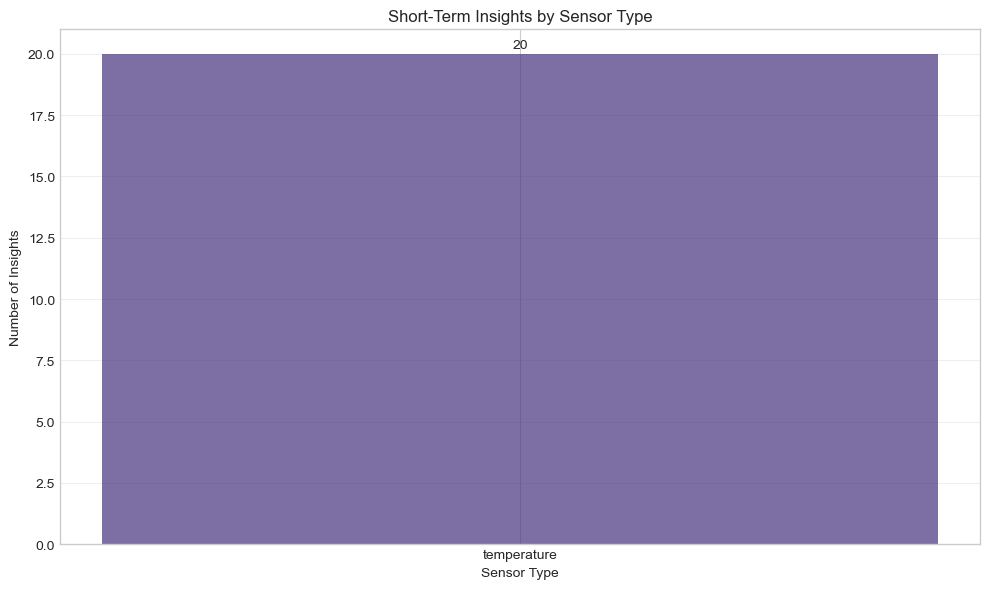

#### Top Short-Term Insights

**1. Generator No. 2 Blower #20 (Sensor F8375DC16DCF)** - Score: 0.81

_CRITICAL: Temperature sensor MA1-01323 on Generator No. 2 Blower #20 is reporting a value of 0.94°C, significantly below the minimum threshold of 5.0°C. This indicates potential freezing conditions or cooling system issues. Immediate action is required: inspect the cooling system for malfunctions and consider increasing the ambient temperature to prevent equipment damage._

---

**2. COAGULANT DOSING PUMP 2 #20 (Sensor D43FF2AF3BD9)** - Score: 0.81

_CRITICAL: Temperature sensor MA1-01255 on 'COAGULANT DOSING PUMP 2 #20' has exceeded the maximum threshold of 23.0°C, currently at 19.38°C. This indicates potential overheating, posing a serious risk to the equipment. Immediate action is required: shut down the pump, inspect for HVAC issues or fire risks, and initiate emergency maintenance._

---

**3. Elution Electrowinning Cell Rectifier No.2 #7 (Sensor 344AA8109BCE)** - Score: 0.80

_CRITICAL: Temperature sensor BTAT0045 attached to 'Elution Electrowinning Cell Rectifier No.2 #7' has recorded 2556 threshold violations, with a current value of 20.53°C, below the normal minimum of 21.32°C. This indicates potential cooling system issues. Immediate inspection and maintenance of the cooling system are required to prevent equipment damage or failure._

---

**4. Tailings Underflow Pump No.1 #18 (Sensor 33E774854CFB)** - Score: 0.80

_CRITICAL: Temperature sensor BTAT0047 on 'Tailings Underflow Pump No.1 #18' is reporting a value of 1.28°C, significantly below the normal mean of 6.48°C. This indicates potential cooling system issues or freezing conditions. Immediate action is required: inspect and adjust the cooling system, and check for environmental issues that may cause freezing._

---

**5. Apron Feeder Dribble Chute No.1 #1 (Sensor B681E96530FC10)** - Score: 0.80

_CRITICAL: Temperature sensor MA1-99999910 attached to 'Apron Feeder Dribble Chute No.1 #1' has recorded 1332 threshold violations, indicating a serious condition. The current temperature of 25.0°C is below the normal mean of 26.996°C. This requires immediate attention. Check for potential cooling system issues or environmental problems. Schedule an emergency inspection and maintenance within 24 hours to prevent equipment damage._

---

### Long-Term Trend Insights

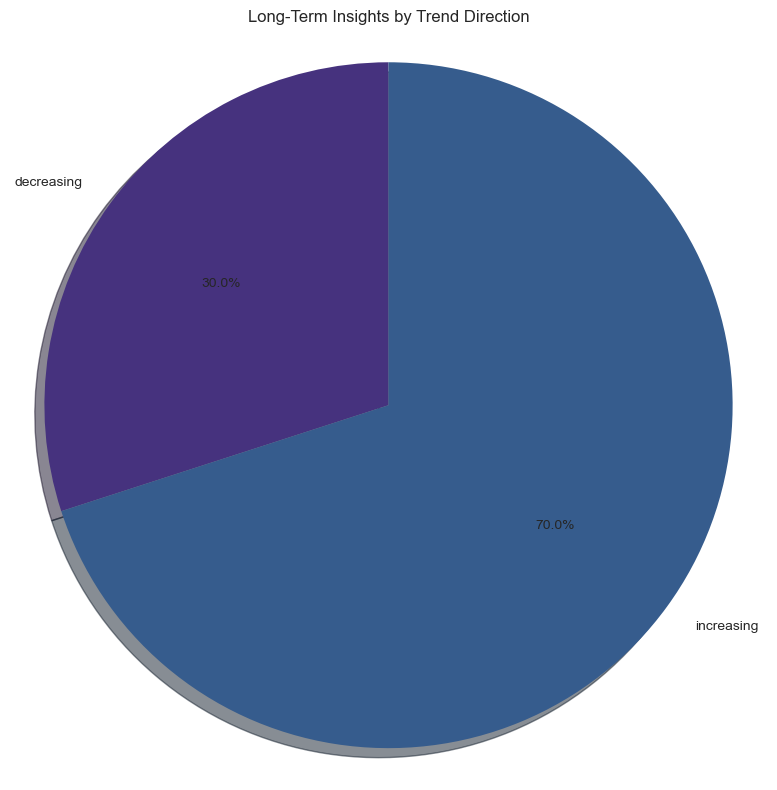

#### Top Long-Term Insights

**1. CIL Tank No. 7 Interface Launder #6 (Sensor 48F2325228C0)** - Trend: decreasing (-2484.8%)

_The temperature sensor MA1-01262 on 'CIL Tank No. 7 Interface Launder #6' shows a significant decrease of 2484.85% over 138.2 days, from -0.33 to -8.53. This trend, devoid of seasonal patterns, suggests potential control system issues. If unaddressed, this could lead to serious operational inefficiencies. Immediate comprehensive system check and maintenance is recommended to rectify the issue and prevent further deterioration._

---

**2. COAGULANT DOSING PUMP 2 #20 (Sensor D43FF2AF3BD9)** - Trend: increasing (-9.6%)

_The temperature sensor MA1-01255 on 'COAGULANT DOSING PUMP 2 #20' shows a 9.57% decrease over 106.5 days, from 21.43°C to 19.38°C, without any seasonal influence. This trend, coupled with a high negative R² value, suggests potential control system issues. It's recommended to conduct a thorough system check to prevent further temperature fluctuations and maintain optimal pump performance._

---

**3. Generator No. 2 Blower #20 (Sensor F8375DC16DCF)** - Trend: increasing (-80.3%)

_Over 106.5 days, temperature sensor MA1-01323 on 'Generator No. 2 Blower #20' has shown a significant decrease of 80.25% in temperature, from 4.76 to 0.94. This trend, devoid of seasonal influence, suggests a potential control system issue. If left unaddressed, this could lead to severe efficiency loss or equipment failure. Immediate diagnostic checks and necessary maintenance are recommended to restore optimal performance._

---

**4. Telehandler #13 (Sensor B681E96530FC)** - Trend: increasing (-18.7%)

_Temperature sensor MA1-00021 on Telehandler #13 shows an 18.74% decrease over 72.6 days, from 25.24 to 20.51, with a recurring 24-hour seasonality pattern. This trend, beyond expected seasonal changes, may indicate HVAC inefficiency or control system issues. Recommend a thorough system check and proactive maintenance to prevent potential long-term impacts and restore optimal performance._

---

**5. 2019 CAT 980M 14A WHEEL LOADER #13 (Sensor C5EE752FF2F4)** - Trend: decreasing (-2.7%)

_The temperature sensor MA1-00025 on the 2019 CAT 980M 14A WHEEL LOADER #13 shows a decreasing trend of -2.75% over 191 days, with temperatures dropping from 24.03°C to 23.37°C. This decline, not attributable to seasonal changes, may suggest potential control system issues. If this trend continues, it could lead to operational inefficiencies. We recommend a thorough system check and ongoing monitoring to prevent potential long-term impacts._

---

### Relationship Insights

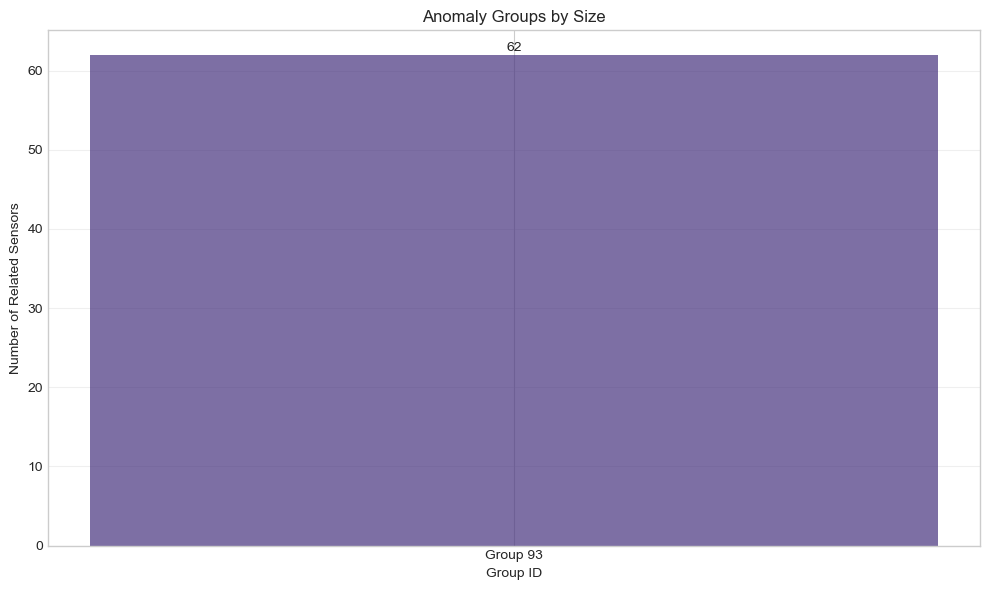

#### Key Relationship Insights

**Group 93** - 62 related sensors

Sensors: Temperature: 61, Motion: 1

_A group of temperature sensors across various assets in Community 93 are showing correlated anomalies, particularly on Wednesdays. The root cause appears to be the Elution Boiler Room Unit Heater #1 (Device ID: 5F86DD4209F4), which consistently shows the earliest temperature increase. This suggests a systemic issue potentially related to environmental factors or weekday operations. Immediate investigation and maintenance of this unit are recommended to prevent cascading failures across the system._

---

2025-03-20 21:56:16,789 - agentic_insight_generator - ERROR - Error saving insights to file: Object of type bool_ is not JSON serializable
2025-03-20 21:56:16,806 - agentic_insight_generator - INFO - Created dashboard HTML at ./insights/dashboard.html


Memory usage at after insight generation: 224.29 MB


## Interactive Dashboard Created

Dashboard saved to: ./insights/dashboard.html

## Maintenance Query Assistant

Example query: 'My CNC machine is showing increasing vibration readings. What should I check?'

2025-03-20 21:56:16,816 - agentic_insight_generator - INFO - Answering maintenance query: My CNC machine is showing increasing vibration readings. What should I check?


### Response:

Response: Based on your description of the CNC machine showing increasing vibration readings, here is a systematic approach to address this issue:

1. **Safety First**: Ensure the CNC machine is turned off and isolated from the power source before beginning any inspection or maintenance work. Always wear appropriate personal protective equipment (PPE) such as safety glasses, gloves, and ear protection when working on industrial equipment.

2. **Potential Causes and Solutions**:
   - **Unbalanced Spindle**: Check the spindle for balance. An unbalanced spindle can cause excessive vibration. If it's out of balance, it may need to be professionally rebalanced.
   - **Loose Components**: Inspect the machine for any loose components, such as screws, bolts, or other fasteners. Tighten any loose parts you find.
   - **Worn Out Bearings**: Bearings in poor condition can cause increased vibration. Check the condition of the bearings and replace them if necessary.
   - **Tooling Issues**: Ensure the tools are properly secured and not worn out. Replace any worn-out tools.
   - **Incorrect Speeds/Feeds**: Verify that the machine's speeds and feeds are set according to the manufacturer's specifications. Incorrect settings can cause excessive vibration.

3. **Maintenance Recommendations**:
   - Implement a regular maintenance schedule for the CNC machine, including routine checks of the spindle, bearings, and tooling.
   - Ensure the machine is always operated within the manufacturer's recommended speeds and feeds.
   - Regularly clean and lubricate all moving parts of the machine to reduce wear and tear.

4. **When to Seek Professional Help**:
   - If vibration issues persist after these steps.
   - If you notice unusual noises or other signs of mechanical distress.
   - If the machine is under warranty, it's best to contact the manufacturer or a certified technician for assistance.

Vibration monitoring sensors can be installed to provide early warnings of excessive vibration conditions in the future. This can help prevent damage to the machine and ensure a safer working environment.

Insight generation pipeline completed successfully.


In [121]:
# Insight Generation Pipeline Execution

## This cell executes the insight generation pipeline using the results from previous stages
## It generates short-term, long-term, and relationship insights using ChatGPT

# Function to check memory usage
def check_memory_usage(label):
    """Monitor memory usage at specific points"""
    import psutil
    process = psutil.Process(os.getpid())
    memory_info = process.memory_info()
    memory_mb = memory_info.rss / (1024 * 1024)
    print(f"Memory usage at {label}: {memory_mb:.2f} MB")

# Initialize the agentic insight generator
print("Initializing Insight Generator...")
check_memory_usage("initial")

# Get API key from environment or add it here
api_key = os.environ.get('OPENAI_API_KEY', '')
if not api_key:
    print("Warning: No OpenAI API key found. Insight generation will be limited.")

# Initialize the generator
insight_generator = AgenticInsightGenerator(api_key=api_key)

# Create dictionary of dataframes from previous stages
print("Preparing data for insight generation...")
dfs = {
    'temperature': temp_ts_anomalies,  # From time series stage
    'battery': batt_ts_anomalies,      # From time series stage
    'vibration': vib_ts_anomalies,     # From time series stage
    'motion': motn_ts_anomalies        # From time series stage
}

# Get relationship data from graph stage
relationship_data = final_insights.get('graph_relationship', {}).get('insights', {})

# Generate all insights
print("Generating insights...")
check_memory_usage("before insight generation")

insights = insight_generator.generate_all_insights(
    dfs=dfs,
    relationship_data=relationship_data,
    sensors_df=sensors_df if 'sensors_df' in globals() else None,
    assets_df=assets_df if 'assets_df' in globals() else None
)

# Display memory usage after generation
check_memory_usage("after insight generation")

# Create HTML dashboard
dashboard_path = insight_generator.create_dashboard_html()
if dashboard_path:
    from IPython.display import IFrame, display, HTML, Markdown
    display(Markdown(f"## Interactive Dashboard Created"))
    display(Markdown(f"Dashboard saved to: {dashboard_path}"))
    
    # Try to display the dashboard in the notebook
    try:
        display(IFrame(dashboard_path, width="100%", height=600))
    except:
        display(Markdown(f"Dashboard available at: file://{os.path.abspath(dashboard_path)}"))

# Demonstrate maintenance query capability
display(Markdown("## Maintenance Query Assistant"))
display(Markdown("Example query: 'My CNC machine is showing increasing vibration readings. What should I check?'"))

response = insight_generator.answer_maintenance_query(
    query="My CNC machine is showing increasing vibration readings. What should I check?",
    equipment_type="CNC Machine"
)

display(Markdown("### Response:"))
display(Markdown(response))

print("Insight generation pipeline completed successfully.")

In [ ]:
# Get maintenance queries

response = insight_generator.answer_maintenance_query(
    query="Why is my sensor showing increased temperature on my HVAC?", 
    equipment_type="CNC Machine"
)
print(response)

2025-03-20 19:14:31,151 - agentic_insight_generator - INFO - Answering maintenance query: Why is my sensor showing increased temperature on my HVAC?


Response: Based on your description of the sensor showing increased temperature on your HVAC system in your CNC machine, here's a systematic approach to address the issue:

1. **Safety First**: Ensure the machine is turned off and cooled down before you start any inspection or maintenance work. Always wear appropriate personal protective equipment (PPE) such as gloves, safety glasses, and protective clothing.

2. **Potential Causes and Solutions**:
   - **Blocked Air Vents**: Check for any blockage in the air vents of the HVAC system. Clean them thoroughly if needed.
   - **Faulty Sensor**: The sensor itself could be faulty, giving false readings. Check the sensor's functionality by comparing its readings with another reliable thermometer.
   - **Overloading**: Ensure the CNC machine is not running beyond its capacity, which could cause overheating.
   - **Inefficient Coolant System**: Check the coolant system for any leaks or blockages. The coolant fluid level should also be checked a

In [93]:
# Generate dashboard
dashboard_path = insight_generator.create_dashboard_html()
print(f"Dashboard available at: {dashboard_path}")

# You can open this file in any web browser

2025-03-20 19:29:29,364 - agentic_insight_generator - INFO - Created dashboard HTML at ./insights/dashboard.html


Dashboard available at: ./insights/dashboard.html
